<a href="https://colab.research.google.com/github/rgrandym/data_science_cambridge/blob/main/P3_24_CAM_DS_C201_Mini_project_6_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 6.3 Mini-project: Applying supervised learning to predict student dropout

**Welcome to your Mini-project: Applying supervised learning to predict student dropout rate**

In this project, we will examine student data and use supervised learning techniques to predict whether a student will drop out. In the education sector, retaining students is vital for the institution's financial stability and for students’ academic success and personal development. A high dropout rate can lead to significant revenue loss, diminished institutional reputation, and lower overall student satisfaction.

You will work with the data in three distinct stages:

1.  Applicant and course information
2.  Student and engagement data
3.  Academic performance data

These stages reflect Study Group’s real-world data journey and how student information has progressed and become available. Additionally, this approach enables you, through data exploration, to support Study Group in better understanding and identifying key metrics to monitor. This approach will also assist you in determining at which stage of the student journey interventions would be most effective.

Please set aside approximately **12 hours** to complete the mini-project.

## Business context
Study Group specialises in providing educational services and resources to students and professionals across various fields. The company's primary focus is on enhancing learning experiences through a range of services, including online courses, tutoring, and educational consulting. By leveraging cutting-edge technology and a team of experienced educators, Study Group aims to bridge the gap between traditional learning methods and the evolving needs of today's learners.

Study Group serves its university partners by establishing strategic partnerships to enhance the universities’ global reach and diversity. It supports the universities in their efforts to attract international students, thereby enriching the cultural and academic landscape of their campuses. It works closely with university faculty and staff to ensure that the universities are prepared and equipped to welcome and support a growing international student body. Its partnership with universities also offers international students a seamless transition into their chosen academic environment.

Study Group runs several International Study Centres across the UK and Dublin in partnership with universities with the aim of preparing a pipeline of talented international students from diverse backgrounds for degree study. These centres help international students adapt to the academic, cultural, and social aspects of studying abroad. This is achieved by improving conversational and subject-specific language skills and academic readiness before students progress to a full degree programme at university.

Through its comprehensive suite of services, it supports learners and universities at every stage of their educational journey, from high school to postgraduate studies. Its approach is tailored to meet the unique needs of each learner, offering personalised learning paths and flexible scheduling options to accommodate various learning styles and commitments.

Study Group's services are designed to be accessible and affordable, making quality education a reality for many individuals. By focusing on the integration of technology and personalised learning, the company aims to empower learners to achieve their full potential and succeed in their academic and professional pursuits. Study Group is at the forefront of transforming how people learn and grow through its dedication to innovation and excellence.

Study Group has provided you with 3 data sets.


## Objective
By the end of this mini-project, you will have developed the skills and knowledge to apply advanced machine learning techniques to create a predictive model for student dropout. This project will involve comprehensive data exploration, preprocessing, and feature engineering to ensure high-quality input for the models. You will employ and compare multiple predictive algorithms, such as XGBoost, and a neural network-based model, to determine the most effective model for predicting student dropout.

In the Notebook, you will:
- explore the data sets, taking a phased approach
- preprocess the data and conduct feature engineering
- predict the dropout rate using XGBoost, and a neural network-based model.

You will also write a report summarising the results of your findings and recommendations.

## Assessment criteria
By completing this project, you’ll be able to provide evidence that you can:

- develop accurate predictions across diverse organisational scenarios by building and testing advanced ML models
- inform data-driven decision-making with advanced machine learning algorithms and models
- propose and present effective solutions to organisational problems using data preprocessing, model selection, and insightful analysis techniques.

## Project guidance
1.   Navigate to **Mini-project 6.3 Applying supervised learning to predict student dropout**, and save a copy of the activity Notebook to your Drive.

2. Please refer to the Rubric for specific steps to be performed as part of the project activity. Every step mentioned in the rubric will be assessed separately.

3. When you’ve completed the activity:
  - download your completed Notebook as an IPYNB (Jupyter Notebook) or PY (Python) file
  - save the file as follows: **LastName_FirstName_CAM_C201_Week_6_Mini-project**.

4. Prepare a detailed report (800–1,000 words) that includes an overview of your approach, a description of your analysis, and an explanation of the insights you identified - Please refer to the Rubric for further details that should form a part of your analysis and report. Save the document as a PDF named according to the following convention: **LastName_FirstName_CAM_C201_W6_Mini-project.pdf**.

5. Submit your Notebook and PDF document.




# Beginning of the notebook

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from keras.optimizers import Adam, RMSprop
from keras.models import Sequential
from keras.layers import Dense, Input
from keras.callbacks import EarlyStopping
from keras.layers import Dense, Dropout, InputLayer
from keras import regularizers
import gc
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, auc,
    roc_auc_score, average_precision_score, confusion_matrix,
    classification_report, roc_curve, precision_recall_curve, ConfusionMatrixDisplay)

from tqdm import tqdm 
from itertools import product
import os
import random
import textwrap

import math
from scipy.stats import pearsonr, spearmanr, shapiro, levene, mannwhitneyu
import matplotlib.gridspec as gridspec
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from datetime import date
from sklearn.pipeline import Pipeline
import xgboost as xgb
import shap
from xgboost import plot_importance
from sklearn.model_selection import GridSearchCV

# Stage 1 data

In [2]:
# Import the dataset 1
file_url = "https://drive.google.com/uc?id=1pA8DDYmQuaLyxADCOZe1QaSQwF16q1J6"
df1 = pd.read_csv(file_url)
display(df1.head())

,CentreName,LearnerCode,BookingType,LeadSource,DiscountType,DateofBirth,Gender,Nationality,HomeState,HomeCity,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,ProgressionDegree,ProgressionUniversity
0,ISC_Aberdeen,2284932,Agent,Standard Agent Booking,NaN,13/01/1998,Male,Chinese,Jianye District; Jiangsu Province,Nanjing,Pre-Masters,Business and Law Pre-Masters,True,Yes,Msc Econ Accounting and Investment Management,University of Aberdeen
1,ISC_Aberdeen,2399500,Agent,Standard Agent Booking,NaN,12/2/1998,Male,Chinese,NaN,Xi'an,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,BSc Biological Sciences,University of Aberdeen
2,ISC_Aberdeen,2424946,Agent,Standard Agent Booking,NaN,7/4/2000,Male,Chinese,NaN,Chengdu,International Year Two,Business Management and Finance International ...,False,Yes,MA Finance,University of Aberdeen
3,ISC_Aberdeen,2426583,Agent,Standard Agent Booking,NaN,18/05/1999,Male,Chinese,NaN,LIUYANG CITY ;CHANGSHA,International Year Two,Business Management and Finance International ...,True,Yes,MA Business Management,University of Aberdeen
4,ISC_Aberdeen,2434674,Agent,Standard Agent Booking,NaN,19/04/1996,Male,Chinese,NaN,Xiamen,Pre-Masters,Business and Law Pre-Masters,True,Yes,MSc International Business Management,University of Aberdeen


**Stage 1: Pre-processing instructions**
- Remove any columns not useful in the analysis (LearnerCode).
- Remove columns with high cardinality (use >200 unique values, as a guideline for this data set).
- Remove columns with > 50% data missing.
- Perform ordinal encoding for ordinal data.
- Perform one-hot encoding for all other categorical data.

### Data Exploratory Analysis Stage 1

In [3]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25059 entries, 0 to 25058
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   CentreName             25059 non-null  object
 1   LearnerCode            25059 non-null  int64 
 2   BookingType            25059 non-null  object
 3   LeadSource             25059 non-null  object
 4   DiscountType           7595 non-null   object
 5   DateofBirth            25059 non-null  object
 6   Gender                 25059 non-null  object
 7   Nationality            25059 non-null  object
 8   HomeState              8925 non-null   object
 9   HomeCity               21611 non-null  object
 10  CourseLevel            25059 non-null  object
 11  CourseName             25059 non-null  object
 12  IsFirstIntake          25059 non-null  bool  
 13  CompletedCourse        25059 non-null  object
 14  ProgressionDegree      24184 non-null  object
 15  ProgressionUniversi

In [4]:
# Remove unnecessary columns
df1.drop('LearnerCode', axis=1, inplace=True)

### Remove columns with high cardinality (use >200 unique values, as a guideline for this data set).

High cardinality refers to columns that contain a large number of unique values. In this case the recommendation is to remove columns with >200 unique values. This may need adjustment based on specific dataset and analysis goals.
This is important because columns with high cardinality can lead to overfitting of machine learning models, creates sparse data when one-hot encoded significantly increasing memory usage.

In [5]:
# Get list of columns to remove
high_cardinality_cols = [col for col in df1.columns if df1[col].nunique() > 200]
print("High cardinality columns:", high_cardinality_cols)

High cardinality columns: ['DateofBirth', 'HomeState', 'HomeCity', 'ProgressionDegree']


HomeState and HomeCity are unlikely to provide any useful information regarding the student’s likelihood to drop out. So they will be remove from the dataset considering their high cardinality.

DateOfBirth will also be removed due to its high cardinality. However, first I will create a new column called Age which will be the difference between the current date and the date of birth. This will be a more useful feature for the analysis.

ProgressionDegree will also be removed due to its high cardinality. This column contains 2616 unique values which is too high for encoding. Nonetheless, it is important to note that this column contains information about the degree the student is studying. This information may be useful for the analysis, but it is not possible to encode it in a meaningful way. 

In [6]:
# Remove these columns
df1_reduced = df1.drop(columns=['HomeState', 'HomeCity'], axis=1)

In [7]:
# Convert DateofBirth to Age

df1_reduced['DateofBirth'] = pd.to_datetime(df1_reduced['DateofBirth'], dayfirst=True, errors='coerce')

df1_reduced['Age'] = (date.today().year - df1_reduced['DateofBirth'].dt.year)

# Drop the original DateofBirth column
df1_reduced.drop('DateofBirth', axis=1, inplace=True)

In [8]:
# Check number of unique values in ProgressionDegree column and count of each unique value
print("Unique values in ProgressionDegree:", df1_reduced['ProgressionDegree'].nunique())
print("Count of each unique value in ProgressionDegree:")
print(df1_reduced['ProgressionDegree'].value_counts())

Unique values in ProgressionDegree: 2616
Count of each unique value in ProgressionDegree:
ProgressionDegree
BSc (Hons) Computer Science                                998
BA (Hons) Business Management                              967
BSc (Hons) Business Management with Business Experience    656
BA (Hons) Global Business Management                       595
BSc (Hons) Business Management                             460
                                                          ... 
Film and Theatre (Placement Year) BA Hons                    1
BSc (Hons) Finance (Industry)                                1
History (Placement Year)                                     1
LAW                                                          1
MSc Sustainable Engineering Systems                          1
Name: count, Length: 2616, dtype: int64


In [9]:
# Drop the ProgressionDegree column
df1_reduced.drop('ProgressionDegree', axis=1, inplace=True)

### Remove columns with > 50% data missing.

In [10]:
# Get list of columns to remove
high_nas_cols = [col for col in df1_reduced.columns if df1_reduced[col].isna().sum() > 0.5 * len(df1_reduced)]
print("High NA columns:", high_nas_cols)

High NA columns: ['DiscountType']


In [11]:
# Drop the DiscountType column
df1_reduced.drop('DiscountType', axis=1, inplace=True)

In [12]:
display(df1_reduced.head())

,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,ProgressionUniversity,Age
0,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,University of Aberdeen,27
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,University of Aberdeen,27
2,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,International Year Two,Business Management and Finance International ...,False,Yes,University of Aberdeen,25
3,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,International Year Two,Business Management and Finance International ...,True,Yes,University of Aberdeen,26
4,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,University of Aberdeen,29


In [13]:
# Check number of unique values in ProgressionDegree column and count of each unique value
print("Unique values in Nationality:", df1_reduced['Nationality'].nunique())
print("Count of each unique value in Nationality:")
print(df1_reduced['Nationality'].value_counts())

Unique values in Nationality: 151
Count of each unique value in Nationality:
Nationality
Chinese               9042
Indian                2072
Bangladeshi           2007
Pakistani             1973
Hong Kong Chinese     1278
                      ... 
Czech                    1
Seychelles               1
Dominican Republic       1
Guinean                  1
Jamaican                 1
Name: count, Length: 151, dtype: int64


#### Nationality has a high cardinality, although below the threshold of 200 set for this assignment. It is not clear at the moment whether this feature has any influence on the drop out rate, so I will keep it for now.

### Perform ordinal encoding for ordinal data.

In [14]:
# The only ordinal column in the dataset is the CourseLevel column
# Check the unique values in CourseLevel
unique_course_levels = df1_reduced['CourseLevel'].unique()
print(unique_course_levels)

['Pre-Masters' 'Foundation' 'International Year Two'
 'International Year One']


In [15]:
# Convert ordinal columns to numeric using map
# Define the mapping for CourseLevel
course_level_mapping = {
    'Pre-Masters': 1,
    'Foundation': 2,
    'International Year One': 3,
    'International Year Two': 4
}
df1_reduced['CourseLevel'] = df1_reduced['CourseLevel'].map(course_level_mapping)



In [16]:
display(df1_reduced.head())

,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,ProgressionUniversity,Age
0,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,1,Business and Law Pre-Masters,True,Yes,University of Aberdeen,27
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,2,Life Sciences Undergraduate Foundation Programme,False,Yes,University of Aberdeen,27
2,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,4,Business Management and Finance International ...,False,Yes,University of Aberdeen,25
3,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,4,Business Management and Finance International ...,True,Yes,University of Aberdeen,26
4,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,1,Business and Law Pre-Masters,True,Yes,University of Aberdeen,29


### Visual Exploration before one-hot encoding to keep number of features low.

In [17]:
# CourseName, Nationality, and ProgressionUniversity have too many unique elements, so I will drop them to visualization purposes, since they make the composite plot too crowded.
df1_CourseName_drop = df1_reduced.drop(['CourseName', 'ProgressionUniversity', 'Nationality'], axis=1, inplace=False)

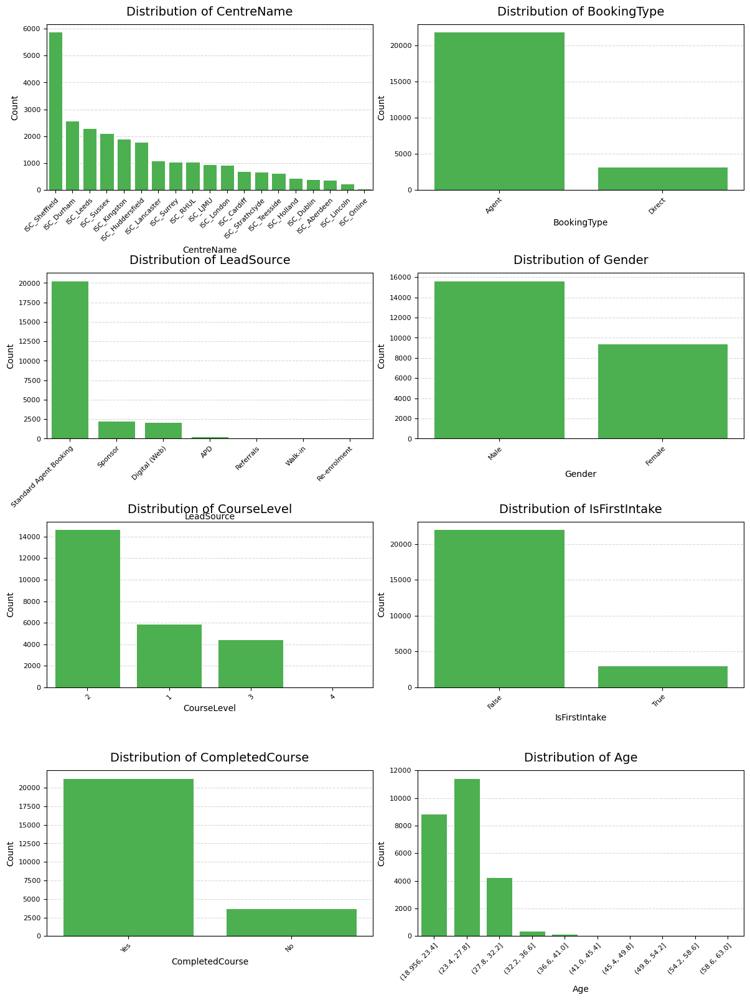

In [18]:
# @title: Data Distribution
# Function to create histograms for each column in the DataFrame
def make_barplots(
    data,
    n_cols = None,
    n_rows = None,
    figsize = (12, 16),
    color = "#4CAF50",  # Changed to a more visible green
    na_color = "red",
    title_fontsize = 14,
    label_fontsize = 10,
    tick_label_fontsize = 8,
    rotation = 45,
    max_unique_cat = 10,
    bar_width = 0.8,
    grid = True,
    **kwargs
) -> None:
    """
    Creates bar plots for all DataFrame columns using Matplotlib.

    Parameters:
    -----------
    data : pd.DataFrame
        Input DataFrame to visualize.
    figsize : tuple, optional (default=(16, 25))
        Figure dimensions (width, height).
    color : str, optional (default="#4CAF50")
        Color for the bars (changed to high-visibility green).
    na_color : str, optional (default="red")
        Color for missing value annotations.
    title_fontsize : int, optional (default=14)
        Font size for plot titles.
    label_fontsize : int, optional (default=10)
        Font size for axis labels.
    tick_label_fontsize : int, optional (default=8)
        Font size for tick labels.
    rotation : int, optional (default=45)
        Rotation angle for x-tick labels.
    max_unique_cat : int, optional (default=10)
        Max unique values to treat as categorical.
    bar_width : float, optional (default=0.8)
        Width of bars (0-1).
    grid : bool, optional (default=True)
        Whether to show grid lines.
    **kwargs : dict
        Additional arguments passed to plt.subplots().
    """


    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, **kwargs)
    axes = axes.flatten() if n_rows > 1 else [axes]

    for i, (ax, column) in enumerate(zip(axes, data.columns)):
        col_data = data[column].dropna()
        unique_vals = col_data.nunique()
        na_count = data[column].isna().sum()

        # Handle categorical vs. numerical data
        if col_data.dtype in ['object', 'category', 'bool'] or unique_vals <= max_unique_cat:
            # Categorical data
            counts = col_data.value_counts()
            labels = counts.index.astype(str)
            values = counts.values
        else:
            # Numerical data - bin it
            bins = min(10, unique_vals)
            counts = pd.cut(col_data, bins=bins).value_counts().sort_index()
            labels = [str(interval) for interval in counts.index]
            values = counts.values

        # Plot bars
        x_pos = np.arange(len(values))
        bars = ax.bar(x_pos, values, width=bar_width, color=color, edgecolor='white', linewidth=0.7)

        # Customize plot
        ax.set_title(f'Distribution of {column}', fontsize=title_fontsize, pad=10)
        ax.set_xlabel(column, fontsize=label_fontsize)
        ax.set_ylabel('Count', fontsize=label_fontsize)
        
        # Set x-ticks and labels - centered under each bar
        ax.set_xticks(x_pos)
        ax.set_xticklabels(
            labels, 
            rotation=rotation, 
            fontsize=tick_label_fontsize,
            ha='center' if rotation == 0 else 'right'  # Better alignment
        )
        
        # Adjust label position based on rotation
        if rotation != 0:
            for label in ax.get_xticklabels():
                label.set_horizontalalignment('right')
                label.set_rotation_mode('anchor')
        
        ax.tick_params(axis='y', labelsize=tick_label_fontsize)

        # Add grid if enabled
        if grid:
            ax.grid(axis='y', linestyle='--', alpha=0.5)
            ax.set_axisbelow(True)  # Grid behind bars

        # Annotate missing values
        if na_count > 0:
            ax.text(
                0.95, 0.95, f'NA: {na_count}',
                transform=ax.transAxes,
                color=na_color,
                ha='right',
                va='top',
                fontsize=label_fontsize,
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
            )

        # Adjust x-axis limits for better centering
        ax.set_xlim(-0.5, len(x_pos)-0.5)

    # Hide unused axes
    for j in range(len(data.columns), len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout(pad=0.5, w_pad=0.5, h_pad=1.0)
    plt.subplots_adjust(hspace=0.5)
    plt.show()
    

make_barplots(df1_CourseName_drop, n_cols=2, n_rows=4)
    


#### The dataset is heavily imbalanced with many of the features presenting few observations overrepresented within each feature. The target feature 'CompletedCourse' shows a ratio of 9:1 between two classes. One option would be to use SMOTE to balance the dataset, but since it is not clear what would be the effect of using synthetic data on the model, I will keep the dataset as it is for now.

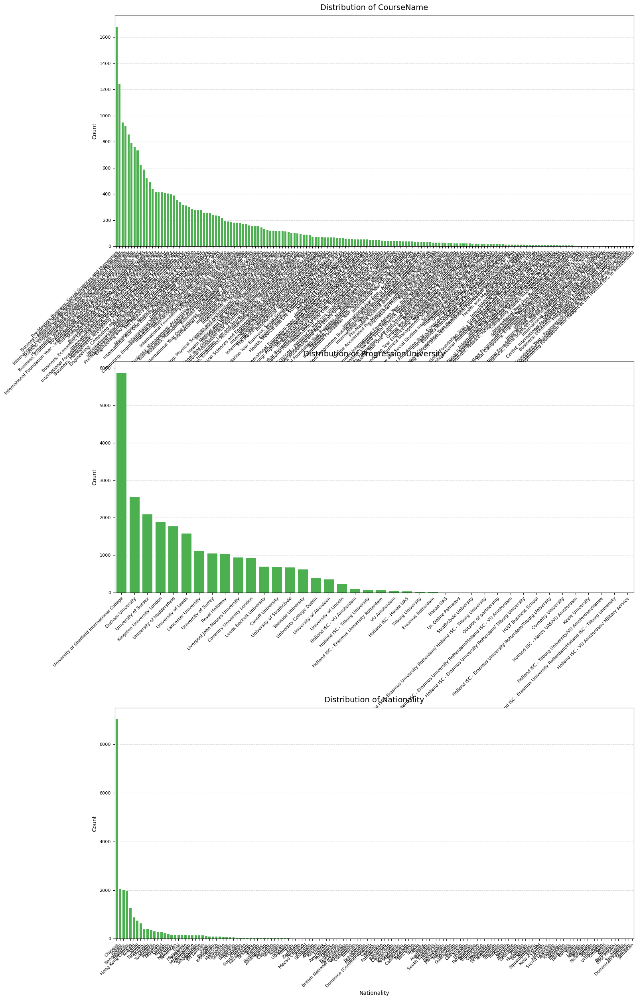

In [19]:
# Plot the remaining features.
df1_remaining_features = df1_reduced[['CourseName', 'ProgressionUniversity', 'Nationality']]
make_barplots(df1_remaining_features, figsize=(16, 25), n_cols=1, n_rows=3)

In [20]:
# Calculate proportion of students from China
china_count = df1_reduced[df1_reduced['Nationality'] == 'Chinese'].shape[0]
bangladesh_count = df1_reduced[df1_reduced['Nationality'] == 'Bangladeshi'].shape[0]
total_count = df1_reduced.shape[0]
china_proportion = china_count / total_count
bangladesh_proportion = bangladesh_count / total_count

print(f"Proportion of students from China: {china_proportion:.2%}")
print(f"Proportion of students from Bangladesh: {bangladesh_proportion:.2%}")

Proportion of students from China: 36.08%
Proportion of students from Bangladesh: 8.01%


In [21]:

# Check the distribution of the target variable
print("Unique values in Nationality:", df1_reduced['Nationality'].nunique())

Unique values in Nationality: 151


#### Nationality is heavily imbalanced with the Chinese students representing a 36.08% of the dataset, followed by the Bangladeshi students representing an 8.01%. The other 149 nationalities in the dataset represent the remaining 55.91% of the dataset. This is a very high imbalance and it is likely that this feature will not be useful for the analysis, so I will drop it.

In [22]:
# Create new dataframe without the Nationality column
df1_no_nation = df1_reduced.drop(columns=['Nationality'], axis=1, inplace=False)

### Perform one-hot encoding for all other categorical data.

In [23]:
# One-hot encode categorical variables
def one_hot_encode(df, columns):
    return pd.get_dummies(df, columns=columns, drop_first=True, dtype=int)
# Define the columns to one-hot encode
one_hot_columns = ['CentreName', 'BookingType', 'LeadSource', 'Gender', 'CourseName', 'IsFirstIntake', 'CompletedCourse', 'ProgressionUniversity']

one_hot_encoded_df = one_hot_encode(df1_no_nation, one_hot_columns)
# Display the first few rows of the one-hot encoded DataFrame
display(one_hot_encoded_df.head())
print("Shape of the one-hot encoded DataFrame:", one_hot_encoded_df.shape)

,CourseLevel,Age,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,CentreName_ISC_Holland,CentreName_ISC_Huddersfield,CentreName_ISC_Kingston,CentreName_ISC_LJMU,CentreName_ISC_Lancaster,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
0,1,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,2,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,4,25,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,4,26,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,29,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


Shape of the one-hot encoded DataFrame: (25059, 240)


In [24]:
# Check for missing values in the one-hot encoded DataFrame
missing_values = one_hot_encoded_df.isnull().sum()
missing_values = missing_values[missing_values > 0]
if missing_values.empty:
    print("No missing values in one-hot encoded DataFrame.")
else:
    print("Missing values in one-hot encoded DataFrame:")
    print(missing_values)

    # Calculate percentage of missing values in each column
    missing_percentage = one_hot_encoded_df.isnull().mean() * 100
    missing_percentage = missing_percentage[missing_percentage > 0]

    print("Percentage of missing values in each column:")
    print(missing_percentage)



No missing values in one-hot encoded DataFrame.


In [25]:
# find column starting with CompletedCourse     
all_columns = [col for col in one_hot_encoded_df.columns if col.startswith('CompletedCourse')]

# View in console (Jupyter/Colab shows full list)
print(all_columns) 

['CompletedCourse_Yes']


# Defining XGBoost Model: Stage 1

In [26]:
# Split the data into features and target variable
X = one_hot_encoded_df.drop(columns=['CompletedCourse_Yes'], axis=1, inplace=False)
y = one_hot_encoded_df['CompletedCourse_Yes']
# Display the first few rows of the features and target variable
display(X.head())  

,CourseLevel,Age,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,CentreName_ISC_Holland,CentreName_ISC_Huddersfield,CentreName_ISC_Kingston,CentreName_ISC_LJMU,CentreName_ISC_Lancaster,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
0,1,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,2,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,4,25,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,4,26,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,29,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [27]:
display(y.head())

0    1
1    1
2    1
3    1
4    1
Name: CompletedCourse_Yes, dtype: int64

In [28]:
# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
# Split the training data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
# Display the shapes of the training, validation, and test sets
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Test set shape:", X_test.shape, y_test.shape)
# Check the distribution of the target variable in the training set
print("Training set target variable distribution:")
print(y_train.value_counts(normalize=True))
# Check the distribution of the target variable in the validation set
print("Validation set target variable distribution:")
print(y_val.value_counts(normalize=True))
# Check the distribution of the target variable in the test set
print("Test set target variable distribution:")
print(y_test.value_counts(normalize=True))

Training set shape: (16037, 239) (16037,)
Validation set shape: (5012, 239) (5012,)
Test set shape: (4010, 239) (4010,)
Training set target variable distribution:
CompletedCourse_Yes
1    0.851219
0    0.148781
Name: proportion, dtype: float64
Validation set target variable distribution:
CompletedCourse_Yes
1    0.850559
0    0.149441
Name: proportion, dtype: float64
Test set target variable distribution:
CompletedCourse_Yes
1    0.845636
0    0.154364
Name: proportion, dtype: float64


### XGBoost model without hyperparameter tunning

XGBoost Model Accuracy:  0.8758978451715882
              precision    recall  f1-score   support

           0       0.63      0.42      0.50       749
           1       0.90      0.96      0.93      4263

    accuracy                           0.88      5012
   macro avg       0.76      0.69      0.72      5012
weighted avg       0.86      0.88      0.87      5012



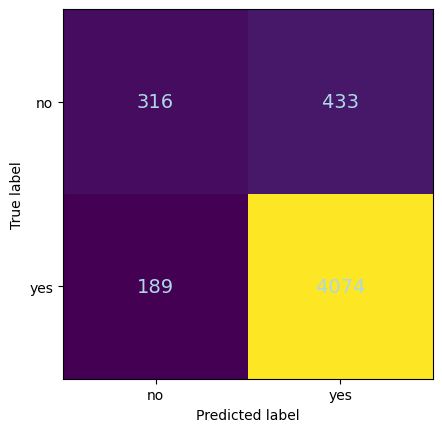

<Figure size 1000x600 with 0 Axes>

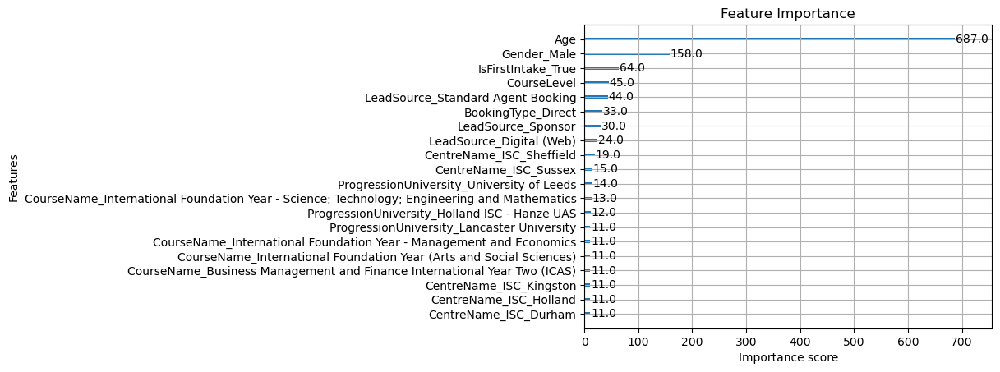

In [29]:
xg_model_no_tunning = xgb.XGBClassifier(random_state=42)
xg_model_no_tunning.fit(X_train, y_train)

# Model evaluation
predictions_no_tunning = xg_model_no_tunning.predict(X_val)
print("XGBoost Model Accuracy: ", accuracy_score(y_val, predictions_no_tunning))
print(classification_report(y_val, predictions_no_tunning))


cm_no_tunning = confusion_matrix(y_val, predictions_no_tunning)
cfmd_no_tunning = ConfusionMatrixDisplay(confusion_matrix=cm_no_tunning, display_labels=["no","yes"])
# Create plot and remove grid lines
fig, ax = plt.subplots()
cfmd_no_tunning.plot(ax=ax, colorbar=False)
ax.grid(False)  # This removes the white crossing lines
# Make numbers more visible
for text in ax.texts:
    text.set_size(14)  # Larger font size
    text.set_color('lightblue')  # Force black text
plt.show()

# Feature Importance
plt.figure(figsize=(10, 6))
plot_importance(xg_model_no_tunning, max_num_features=20)  # Top 20 features
plt.title('Feature Importance')
plt.show()


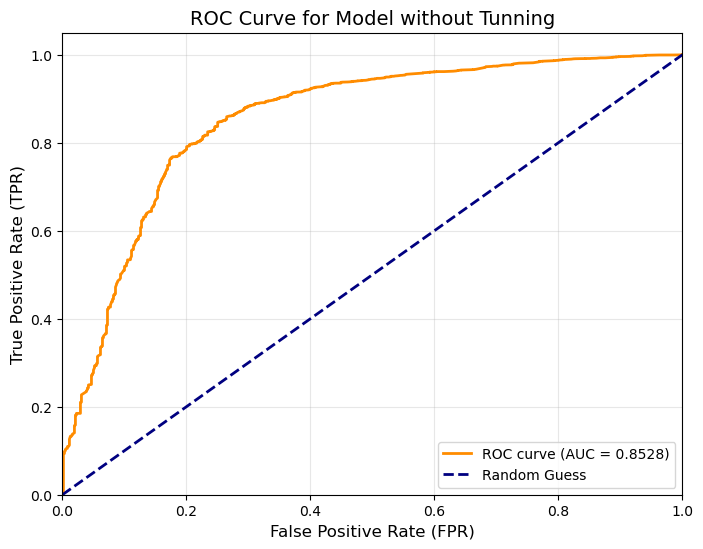

In [30]:
# @tittle Testing the model without tunning
# Calculate ROC curve using test set for better evaluation
y_pred_proba_no_tunning = xg_model_no_tunning.predict_proba(X_test)[:, 1]  # Probabilities for AUC using test set
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_no_tunning) # Use TEST set for final evaluation
roc_auc_no_tunning = auc(fpr, tpr)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {roc_auc_no_tunning:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve for Model without Tunning', fontsize=14)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

### Funie Tunning with GridSearchCV.
#### The model will be trained using the training set and evaluated using the val set. 

In [31]:
# @title: Grid Search for Hyperparameter Tuning

param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],      # Lower for better generalization
    'max_depth': [4, 6, 8],                   # Control tree complexity
    'min_child_weight': [1, 3, 5],            # Prevent overfitting
    'gamma': [0, 0.1, 0.2],                   # Regularization
    'subsample': [0.6, 0.8, 1.0],             # Stochastic sampling
    'colsample_bytree': [0.6, 0.8, 1.0],      # Feature sampling
    'n_estimators': [50, 100, 150]            # Number of trees
}

grid_search = GridSearchCV(
    estimator=xgb.XGBClassifier(
        eval_metric='logloss',
        early_stopping_rounds=10,
        random_state=42
    ),
    param_grid=param_grid,
    scoring='roc_auc',  # Optimize for AUC
    cv=3,               # 3-fold cross-validation
    n_jobs=-1           # Use all CPU cores
)

grid_search.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)
best_params = grid_search.best_params_

In [32]:
best_params_df = pd.DataFrame([best_params])
display(best_params_df)

,colsample_bytree,gamma,learning_rate,max_depth,min_child_weight,n_estimators,subsample
0,0.6,0.1,0.1,6,1,100,0.8


Validation Accuracy: 0.8749002394253791

Classification Report (Best Parameters):
              precision    recall  f1-score   support

           0       0.63      0.40      0.49       749
           1       0.90      0.96      0.93      4263

    accuracy                           0.87      5012
   macro avg       0.76      0.68      0.71      5012
weighted avg       0.86      0.87      0.86      5012



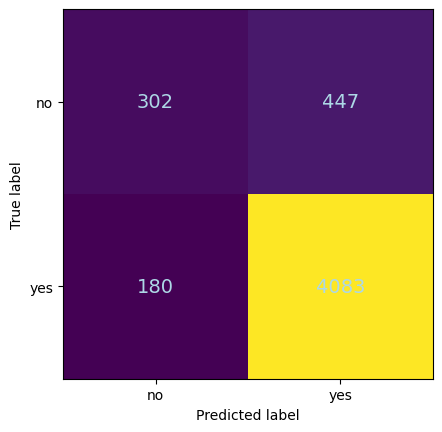

<Figure size 1000x600 with 0 Axes>

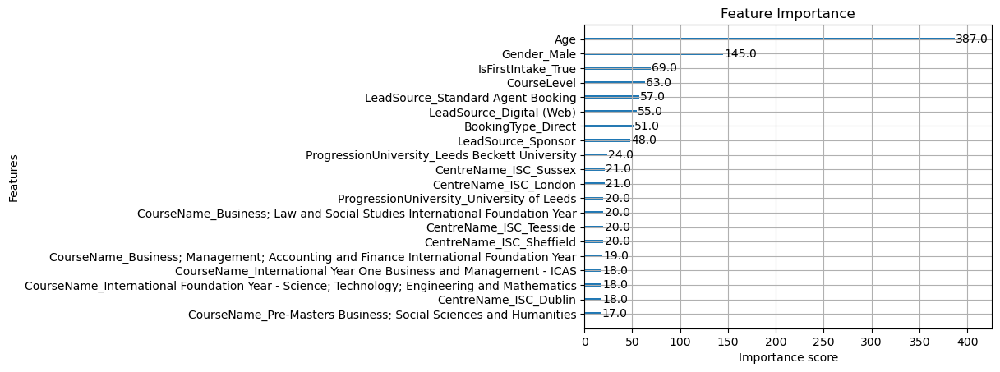

In [33]:
# Initialize model with optimized hyperparameters
xg_model_best_param = xgb.XGBClassifier(
    random_state=42,
    n_estimators=100,           # Number of boosting rounds
    max_depth=6,                # Tree depth
    learning_rate=0.1,          # Shrinkage factor
    subsample=0.8,              # % of samples per tree
    colsample_bytree=0.6,       # % of features per tree
    eval_metric='logloss',      # Metric for early stopping
    early_stopping_rounds=10,   # Stop if no improvement
    min_child_weight=1,        # Prevent overfitting
    gamma=0.1                  # Regularization
)

# Train with validation monitoring
xg_model_best_param.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],  # Early stopping data
    verbose=False                # Show training progress
)

# Predictions
predictions_best_param = xg_model_best_param.predict(X_val)

# Evaluation
print("Validation Accuracy:", accuracy_score(y_val, predictions_best_param))
print("\nClassification Report (Best Parameters):")
print(classification_report(y_val, predictions_best_param))

# Confusion Matrix
cm_best_param = confusion_matrix(y_val, predictions_best_param)
cfmd_best_param = ConfusionMatrixDisplay(confusion_matrix=cm_best_param, display_labels=["no","yes"])
# Create plot and remove grid lines
fig, ax = plt.subplots()
cfmd_best_param.plot(ax=ax, colorbar=False)
ax.grid(False)  # This removes the white crossing lines
# Make numbers more visible
for text in ax.texts:
    text.set_size(14)  # Larger font size
    text.set_color('lightblue')  # Force black text
plt.show()

# Feature Importance
plt.figure(figsize=(10, 6))
plot_importance(xg_model_best_param, max_num_features=20)  # Top 20 features
plt.title('Feature Importance')
plt.show()

#### Testing the model on Testing data set for better reliability of results.

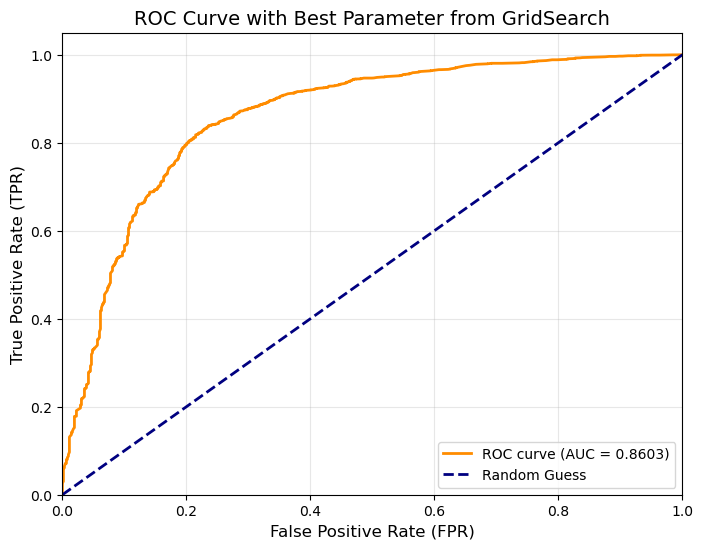

In [34]:
# @tittle Testing the model
# Calculate ROC curve
y_pred_proba_best_param = xg_model_best_param.predict_proba(X_test)[:, 1]  # Probabilities for AUC using test set
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_best_param) # Use TEST set for final evaluation
roc_auc_best_param = auc(fpr, tpr)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {roc_auc_best_param:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve with Best Parameter from GridSearch', fontsize=14)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()


### Comparison Models

In [35]:
# For Untuned Model
precision_0_no_tuning = precision_score(y_val, predictions_no_tunning, average='binary', pos_label=0)
recall_0_no_tuning = recall_score(y_val, predictions_no_tunning, average='binary', pos_label=0)
f1_0_no_tuning = f1_score(y_val, predictions_no_tunning, average='binary', pos_label=0)

# For class 1 (Completed Course)
precision_1_no_tuning = precision_score(y_val, predictions_no_tunning, average='binary', pos_label=1) 
recall_1_no_tuning = recall_score(y_val, predictions_no_tunning, average='binary', pos_label=1)
f1_1_no_tuning = f1_score(y_val, predictions_no_tunning, average='binary', pos_label=1)

# Overall metrics for untuned model
accuracy_no_tuning = accuracy_score(y_val, predictions_no_tunning)
macro_precision_no_tuning = precision_score(y_val, predictions_no_tunning, average='macro')
macro_recall_no_tuning = recall_score(y_val, predictions_no_tunning, average='macro')
macro_f1_no_tuning = f1_score(y_val, predictions_no_tunning, average='macro')

roc_auc_no_tunning # Predictions probabilities for AUC were calculated earlier

# For Tuned Model
precision_0_best_param = precision_score(y_val, predictions_best_param, average='binary', pos_label=0)
recall_0_best_param = recall_score(y_val, predictions_best_param, average='binary', pos_label=0)
f1_0_best_param = f1_score(y_val, predictions_best_param, average='binary', pos_label=0)

# For class 1 (Completed Course)
precision_1_best_param = precision_score(y_val, predictions_best_param, average='binary', pos_label=1)
recall_1_best_param = recall_score(y_val, predictions_best_param, average='binary', pos_label=1)
f1_1_best_param = f1_score(y_val, predictions_best_param, average='binary', pos_label=1)

# Overall metrics for tuned model
accuracy_best_param = accuracy_score(y_val, predictions_best_param)
macro_precision_best_param = precision_score(y_val, predictions_best_param, average='macro')
macro_recall_best_param = recall_score(y_val, predictions_best_param, average='macro')
macro_f1_best_param = f1_score(y_val, predictions_best_param, average='macro')

roc_auc_best_param # Predictions probabilities for AUC were calculated earlier

# Update results_df
results_df_s1 = pd.DataFrame({
    'Model': ['Without Tuning', 'Best Parameters'],
    'Accuracy': [accuracy_no_tuning, accuracy_best_param],
    'ROC AUC': [roc_auc_no_tunning, roc_auc_best_param],
    'Precision (Class 0)': [precision_0_no_tuning, precision_0_best_param],
    'Recall (Class 0)': [recall_0_no_tuning, recall_0_best_param],
    'F1 Score (Class 0)': [f1_0_no_tuning, f1_0_best_param],
    'Precision (Class 1)': [precision_1_no_tuning, precision_1_best_param],
    'Recall (Class 1)': [recall_1_no_tuning, recall_1_best_param],
    'F1 Score (Class 1)': [f1_1_no_tuning, f1_1_best_param],
    'Macro Precision': [macro_precision_no_tuning, macro_precision_best_param],
    'Macro Recall': [macro_recall_no_tuning, macro_recall_best_param],
    'Macro F1': [macro_f1_no_tuning, macro_f1_best_param]
})

# Display the results
display(results_df_s1.reset_index(drop=True))

,Model,Accuracy,ROC AUC,Precision (Class 0),Recall (Class 0),F1 Score (Class 0),Precision (Class 1),Recall (Class 1),F1 Score (Class 1),Macro Precision,Macro Recall,Macro F1
0,Without Tuning,0.875898,0.852768,0.625743,0.421896,0.503987,0.903927,0.955665,0.929076,0.764835,0.68878,0.716532
1,Best Parameters,0.874900,0.860281,0.626556,0.403204,0.490658,0.901325,0.957776,0.928693,0.763940,0.68049,0.709676


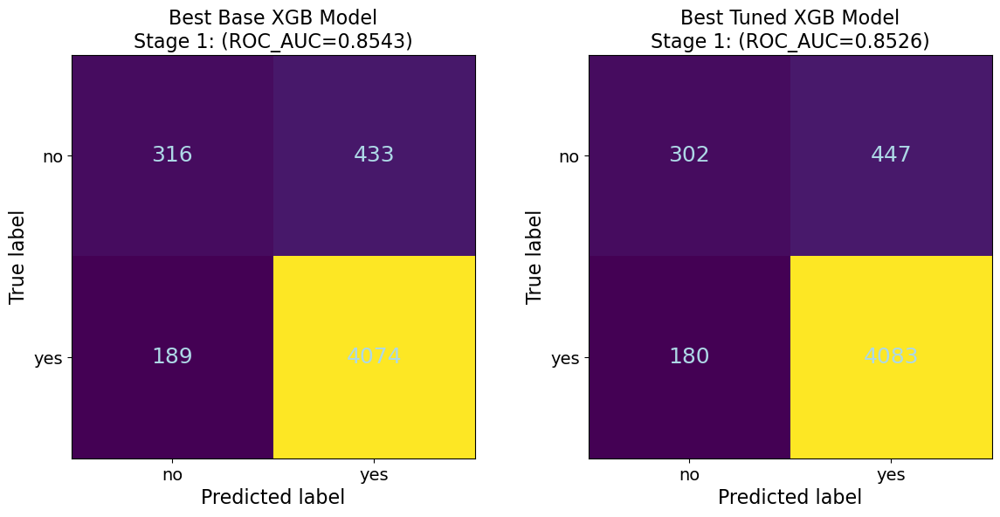

In [235]:
# Comparison Confusion Matrix
# Compute confusion matrices
cm_comparison = confusion_matrix(y_val, predictions_no_tunning)
cm_comparison_best_param = confusion_matrix(y_val, predictions_best_param)

# Create display objects
disp_comparison = ConfusionMatrixDisplay(confusion_matrix=cm_comparison, display_labels=["no", "yes"])
disp_best_param = ConfusionMatrixDisplay(confusion_matrix=cm_comparison_best_param, display_labels=["no", "yes"])

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot confusion matrices
disp_comparison.plot(ax=axes[0], colorbar=False)
disp_best_param.plot(ax=axes[1], colorbar=False)

# Set titles with ROC_AUC info
axes[0].set_title(f"Best Base XGB Model\nStage 1: (ROC_AUC={best_base['roc_auc']:.4f})", fontsize=16)
axes[1].set_title(f"Best Tuned XGB Model\nStage 1: (ROC_AUC={best_tuning['roc_auc']:.4f})", fontsize=16)

# Set axis labels with font size
axes[0].set_xlabel('Predicted label', fontsize=16)
axes[0].set_ylabel('True label', fontsize=16)
axes[1].set_xlabel('Predicted label', fontsize=16)
axes[1].set_ylabel('True label', fontsize=16)

# Remove grid lines
axes[0].grid(False)
axes[1].grid(False)

# Customize tick labels and cell fonts
for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=14)
    for text in ax.texts:
        text.set_fontsize(18)
        text.set_color('lightblue')
        
plt.subplots_adjust(wspace=0.2, hspace=0.3)

plt.show()


#### These confusion matrices were built using best models and y_validation set.

### Comments

- The hyperparameter tuning did not significantly improve the model performance beyond the default XGBoost configuration.
- The untuned model performs slightly better in accuracy (0.875898 vs 0.874900), while the tuned model has a marginally better ROC-AUC score (0.852768 vs 0.860281).
- Both models struggle with predicting Class 0 (Did Not Complete Course), however, the untuned model has a higher F1 and Recall score for this class (0.503987 and 0.421896 vs 0.490658 and 0.403204, respectively). On the other hand, the same metrics are almost indistinguishable between the models for Class 1. This is in agreement with the strong class imbalance towards the Class 1.
- The tuned model has a slightly higher ROC-AUC score (0.860281) compared to the untuned model (0.852768), indicating a small improvement in ranking performance.

To address Class Imbalance:

- We could use techniques like class weighting (scale_pos_weight) or oversampling (SMOTE) to improve minority class performance. None of those were used in this assignment.
- Investigate if high-cardinality columns can be feature engineered so that they can be included to train the model.
- Test alternative models: LightGBM or CatBoost, which may handle categorical data and imbalance better.

Business Impact

Since recall for Class 1 (Completed Course) is high (~96%), the model is good at identifying students likely to complete their courses.
However, precision for Class 0 (~63%) is poor, meaning many students flagged as "at risk" may actually complete their courses (false positives).

Overall:

- The untuned model is slightly better and due to its simplicity and accuracy should be the priorities.
- Further tuning should focus on improving minority class (Class 0) performance rather than overall accuracy.

### Shapley Analysis for Untuned Model

In [37]:
def shap_analysis(model, X, sample_size=1000, random_state=42):
    """
    Compute SHAP values for a model with proper sampling
    
    Returns:
    - shap_values: SHAP values array
    - X_sample: Sampled features used
    - expected_value: Base prediction value
    """
    explainer = shap.TreeExplainer(model)
    if isinstance(X, pd.DataFrame):
        X_sample = X.sample(min(sample_size, len(X)), random_state=random_state)
    else:
        X_sample = X[np.random.choice(len(X), min(sample_size, len(X)), replace=False)]
    
    shap_values = explainer(X_sample)
    return shap_values, X_sample, explainer.expected_value

# Get SHAP values
shap_results = shap_analysis(xg_model_no_tunning, X_train)
shap_values, X_sample, expected_value = shap_results

# Find most surprising prediction
shap_sums = np.abs(shap_values.values.sum(axis=1) - expected_value)
surprising_idx = np.argmax(shap_sums)

# Verify
print(f"Analyzing observation {surprising_idx} with deviation: {shap_sums[surprising_idx]:.4f}")
print(f"Sample features:\n{X_sample.iloc[surprising_idx]}")

Analyzing observation 563 with deviation: 6.2189
Sample features:
CourseLevel                                                             3
Age                                                                    23
CentreName_ISC_Cardiff                                                  0
CentreName_ISC_Dublin                                                   0
CentreName_ISC_Durham                                                   0
                                                                       ..
ProgressionUniversity_University of Sheffield International College     0
ProgressionUniversity_University of Strathclyde                         0
ProgressionUniversity_University of Surrey                              0
ProgressionUniversity_University of Sussex                              0
ProgressionUniversity_VU Amsterdam                                      0
Name: 11471, Length: 239, dtype: int64


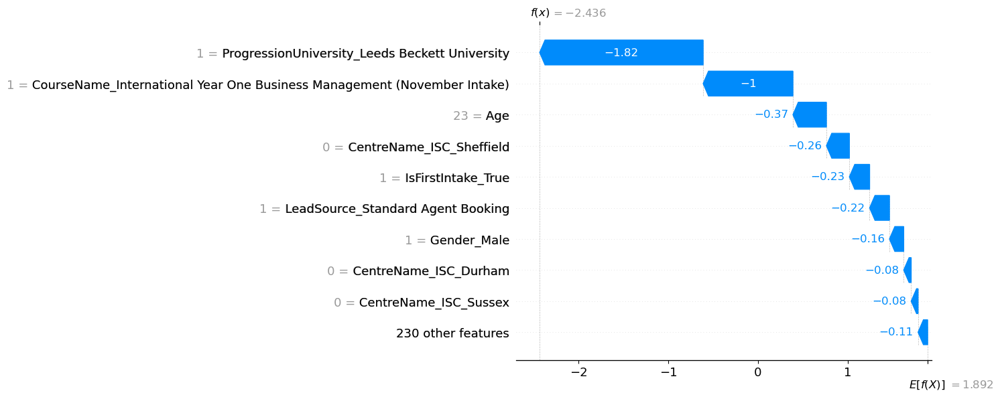

In [38]:
shap.plots.waterfall(shap_values[surprising_idx])

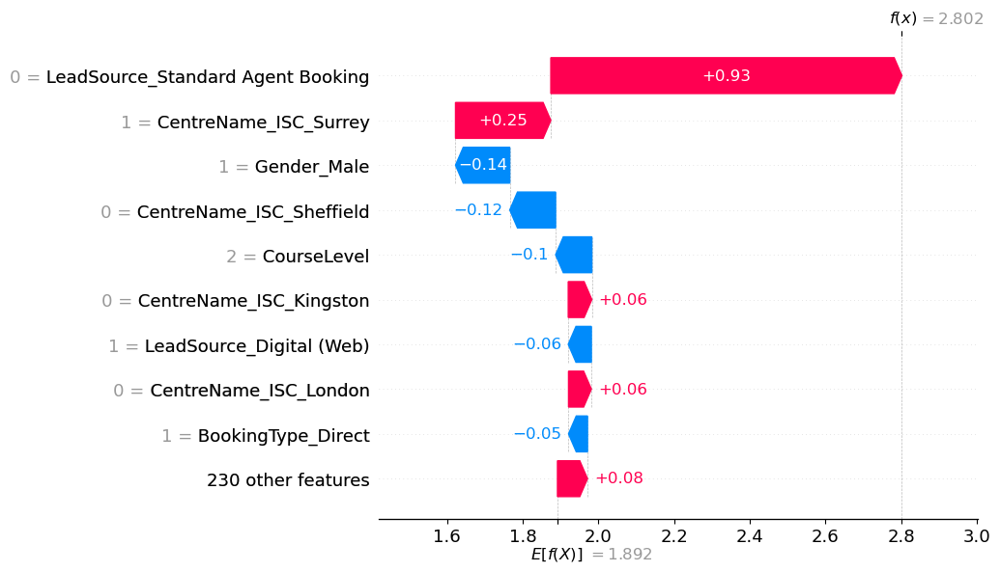

In [39]:
# Observation with max prediction
high_pred_idx = np.argmax(xg_model_no_tunning.predict(X_train))
shap.plots.waterfall(shap_values[high_pred_idx])

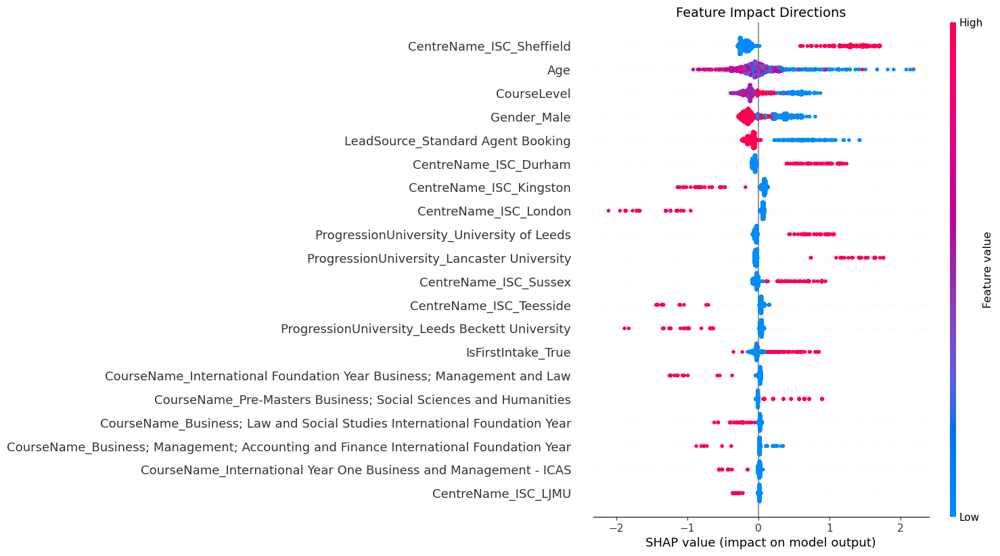

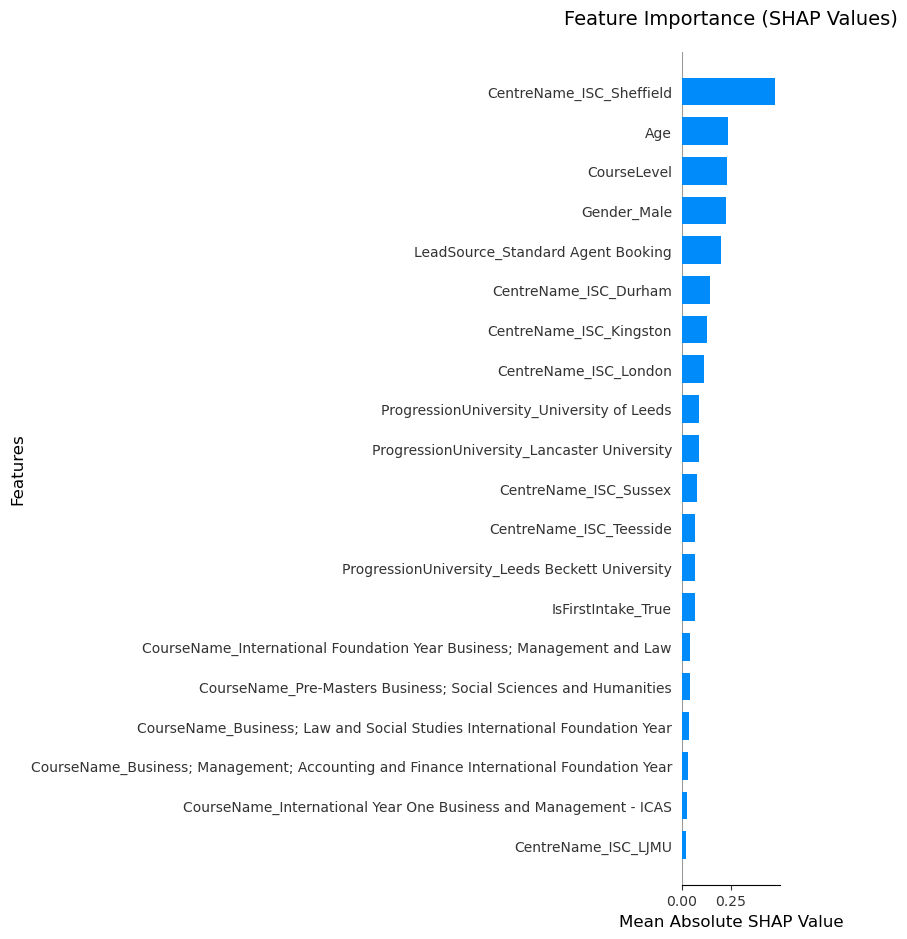

In [40]:
shap_values_no_tunning = shap_analysis(xg_model_no_tunning, X_train, sample_size=1000, random_state=42)
 
# Detailed Feature Effects
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_no_tunning[0], X_sample, show=False) # Shap values are in shap_values_no_tunning[0]
plt.title("Feature Impact Directions", fontsize=14)
plt.tight_layout()
plt.show()

# Feature Importance
shap.summary_plot(shap_values_no_tunning[0], X_sample, plot_type="bar", show=False)  # Manually show after adjustments of image size
# Customize the plot
plt.title("Feature Importance (SHAP Values)", fontsize=14, pad=20)
plt.xlabel("Mean Absolute SHAP Value", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(fontsize=10, rotation=0)  # Prevent label rotation
plt.yticks(fontsize=10)

# Adjust margins to prevent collapsing
plt.subplots_adjust(left=0.3, right=0.9, bottom=0.1, top=0.9)

# Show the plot
plt.tight_layout()
plt.show()


### Shapley Analysis for Best Parameter Model

In [41]:
# Get SHAP values for the best parameter model
shap_results_best_param = shap_analysis(xg_model_best_param, X_train)
shap_values_best_param, X_sample, expected_value_best_param = shap_results_best_param


# Find most surprising prediction
shap_sums_best_param = np.abs(shap_values_best_param.values.sum(axis=1) - expected_value_best_param)
surprising_idx_best_param = np.argmax(shap_sums_best_param)

# Verify
print(f"Analyzing observation {surprising_idx} with deviation: {shap_sums_best_param[surprising_idx_best_param]:.4f}")
print(f"Sample features:\n{X_sample.iloc[surprising_idx_best_param]}")

Analyzing observation 563 with deviation: 5.4866
Sample features:
CourseLevel                                                             2
Age                                                                    27
CentreName_ISC_Cardiff                                                  0
CentreName_ISC_Dublin                                                   0
CentreName_ISC_Durham                                                   0
                                                                       ..
ProgressionUniversity_University of Sheffield International College     0
ProgressionUniversity_University of Strathclyde                         0
ProgressionUniversity_University of Surrey                              0
ProgressionUniversity_University of Sussex                              0
ProgressionUniversity_VU Amsterdam                                      0
Name: 13397, Length: 239, dtype: int64


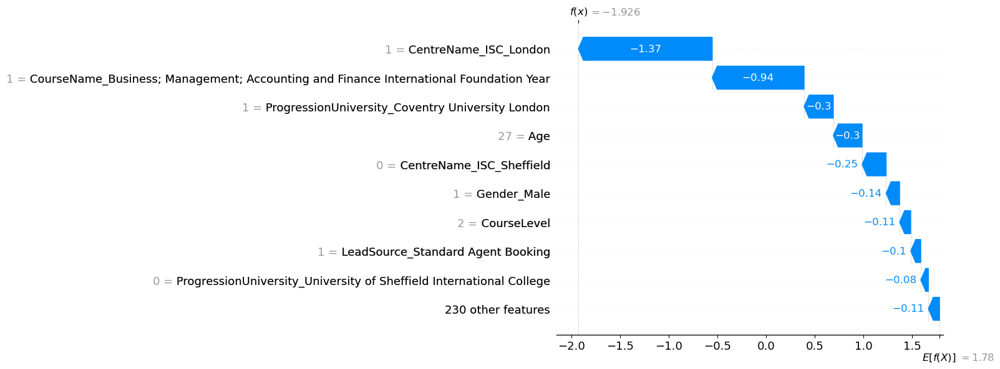

In [42]:
shap.plots.waterfall(shap_values_best_param[surprising_idx_best_param])

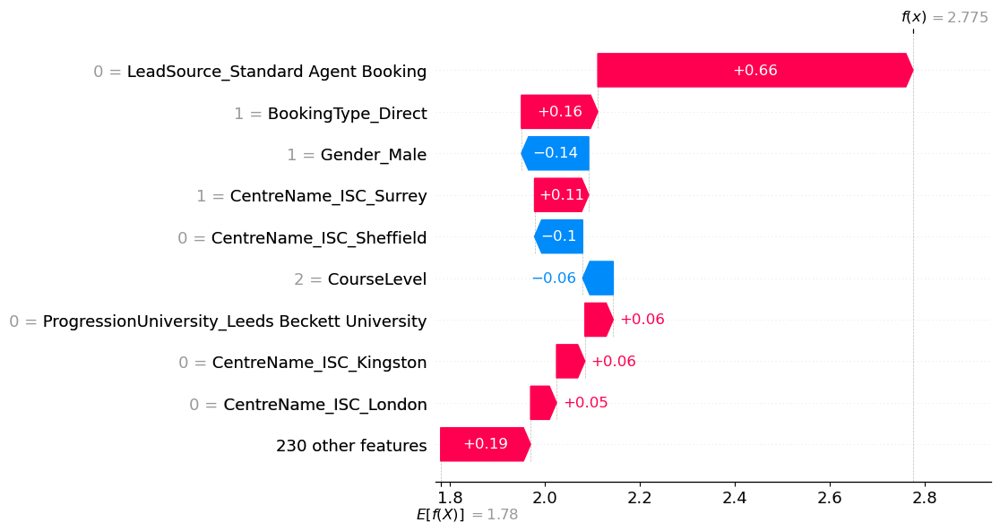

In [43]:
# Observation with max prediction
high_pred_idx_best_param = np.argmax(xg_model_best_param.predict(X_train))
shap.plots.waterfall(shap_values_best_param[high_pred_idx_best_param])

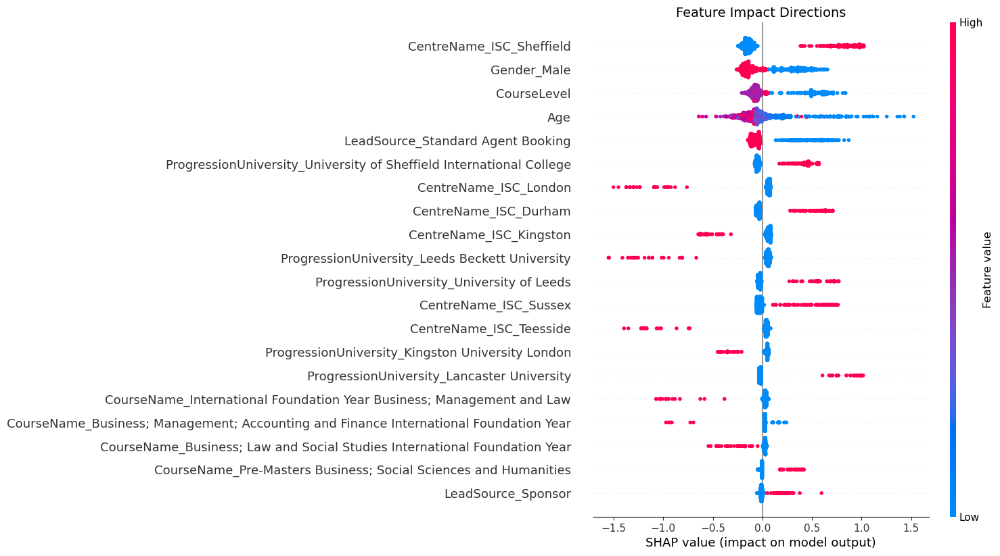

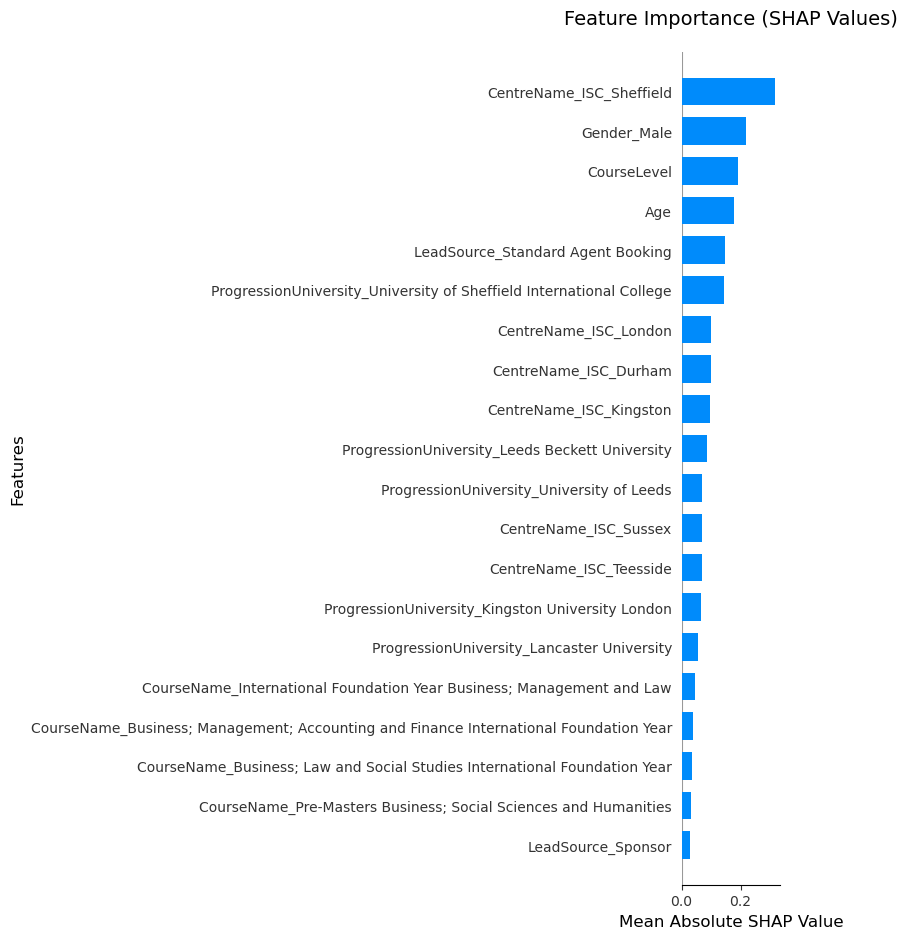

In [44]:
shap_values_best_param = shap_analysis(xg_model_best_param, X_train, sample_size=1000, random_state=42)
 
# Detailed Feature Effects
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_best_param[0], X_sample, show=False) # Shap values are in shap_values_no_tunning[0]
plt.title("Feature Impact Directions", fontsize=14)
plt.tight_layout()
plt.show()

# Feature Importance
shap.summary_plot(shap_values_best_param[0], X_sample, plot_type="bar", show=False)  # Manually show after adjustments of image size
# Customize the plot
plt.title("Feature Importance (SHAP Values)", fontsize=14, pad=20)
plt.xlabel("Mean Absolute SHAP Value", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(fontsize=10, rotation=0)  # Prevent label rotation
plt.yticks(fontsize=10)

# Adjust margins to prevent collapsing
plt.subplots_adjust(left=0.3, right=0.9, bottom=0.1, top=0.9)

# Show the plot
plt.tight_layout()
plt.show()

# Defining a Neural Network for the dropout prediction: Stage 1

In [45]:
# Bringing in data use for XGBoost
print(f'X_train: {X_train.shape}')
print(f'X_val: {X_val.shape}')
print(f'X_test: {X_test.shape}')
print(f'y_train: {y_train.shape}')
print(f'y_val: {y_val.shape}')
print(f'y_test: {y_test.shape}')


X_train: (16037, 239)
X_val: (5012, 239)
X_test: (4010, 239)
y_train: (16037,)
y_val: (5012,)
y_test: (4010,)


In [46]:
# Scale the data
scaler = StandardScaler()
X_train_scaled_s1 = scaler.fit_transform(X_train)
X_val_scaled_s1 = scaler.transform(X_val)
X_test_scaled_s1 = scaler.transform(X_test)

### Construct Neural Network with Different Number of Hidden Layers and same Number of Neurons

In [ ]:
# Define Baseline Model
# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed=42):
    """
    Enable 100% reproducibility on operations related to tensor and randomness.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    
    # Configure TensorFlow for determinism
    tf.config.experimental.enable_op_determinism()

# Call this at the very beginning of your script
set_global_determinism(42)

# Define Baseline Model with seed reset
def create_model(input_dim, output_dim, layers=2, units=128, dropout=0.2, lr=0.001, seed=42):
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    model.compile(optimizer=Adam(learning_rate=lr),
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Training setup with deterministic seeds
def train_models_deterministic(architecture_configs, X_train, y_train, X_val, y_val):
    models_base_s1 = []
    histories_base_s1 = []
    
    for i, config in enumerate(architecture_configs):
        print(f"\nTraining Model {i+1}: {config}")
        
        # Set unique but deterministic seed for each model
        model_seed = 42 + i
        set_global_determinism(model_seed)
        
        # Clear session
        tf.keras.backend.clear_session()
        gc.collect()
        
        # Create model with specific seed
        model = create_model(input_dim, output_dim, seed=model_seed, **config)
        
        # Early stopping
        early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                                 restore_best_weights=True)
        
        # Train with deterministic batch shuffling
        history_base_s1 = model.fit(X_train, y_train,
                          validation_data=(X_val, y_val),
                          batch_size=32,
                          epochs=50,
                          callbacks=[early_stop],
                          shuffle=True,  # This will be deterministic due to seed
                          verbose=0)
        
        # Evaluate
        train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
        val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
        
        # Store results
        models_base_s1.append(model)
        histories_base_s1.append({
            "config": config,
            "train_loss": train_loss,
            "train_accuracy": train_accuracy,
            "val_loss": val_loss,
            "val_accuracy": val_acc,
            "history": history_base_s1,
            "seed": model_seed
        })
        
        print(f"Final validation accuracy: {val_acc:.4f}")
        gc.collect()
    
    return models_base_s1, histories_base_s1

# Usage
set_global_determinism(42)  # Set at the beginning

# Get dimensions
input_dim = X_train_scaled_s1.shape[1]
output_dim = len(np.unique(y_train))

# Architecture configurations
architecture_configs = [
    {"layers": 2, "units": 32},
    {"layers": 3, "units": 32},
    {"layers": 4, "units": 32},
    {"layers": 2, "units": 64},
    {"layers": 3, "units": 64},
    {"layers": 4, "units": 64},
    {"layers": 2, "units": 128},
    {"layers": 3, "units": 128},
    {"layers": 4, "units": 128}
]

# Train models deterministically
models_base_s1, histories_base_s1 = train_models_deterministic(architecture_configs, X_train_scaled_s1, y_train, X_val_scaled_s1, y_val)
print(f'Model: models_base_s1, History:histories_base_s1')


Training Model 1: {'layers': 2, 'units': 32}
Final validation accuracy: 0.8757

Training Model 2: {'layers': 3, 'units': 32}
Final validation accuracy: 0.8767

Training Model 3: {'layers': 4, 'units': 32}
Final validation accuracy: 0.8719

Training Model 4: {'layers': 2, 'units': 64}
Final validation accuracy: 0.8717

Training Model 5: {'layers': 3, 'units': 64}
Final validation accuracy: 0.8733

Training Model 6: {'layers': 4, 'units': 64}
Final validation accuracy: 0.8775

Training Model 7: {'layers': 2, 'units': 128}
Final validation accuracy: 0.8753

Training Model 8: {'layers': 3, 'units': 128}
Final validation accuracy: 0.8777

Training Model 9: {'layers': 4, 'units': 128}
Final validation accuracy: 0.8765
Model: models_base_s1, History:histories_base_s1


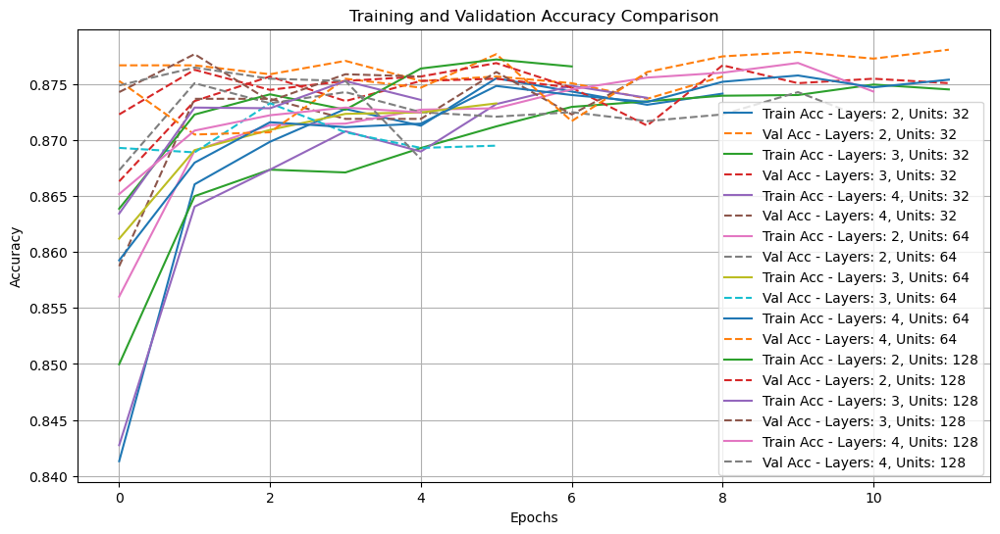

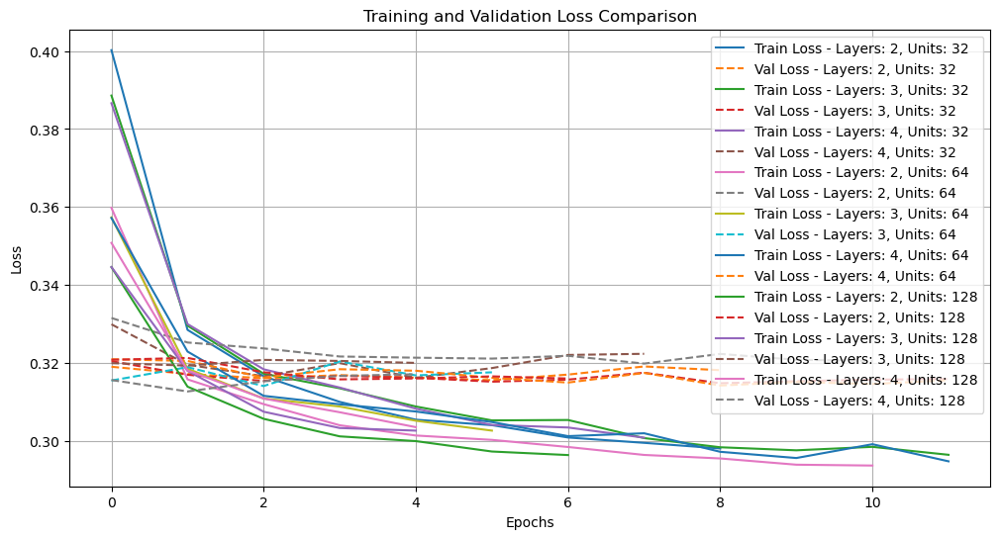


Model Performance Summary:
Model 1 - 2 layers, 32 units:
  Validation Accuracy: 0.8757
  Final Epochs: 9

Model 2 - 3 layers, 32 units:
  Validation Accuracy: 0.8767
  Final Epochs: 12

Model 3 - 4 layers, 32 units:
  Validation Accuracy: 0.8719
  Final Epochs: 8

Model 4 - 2 layers, 64 units:
  Validation Accuracy: 0.8717
  Final Epochs: 11

Model 5 - 3 layers, 64 units:
  Validation Accuracy: 0.8733
  Final Epochs: 6

Model 6 - 4 layers, 64 units:
  Validation Accuracy: 0.8775
  Final Epochs: 12

Model 7 - 2 layers, 128 units:
  Validation Accuracy: 0.8753
  Final Epochs: 7

Model 8 - 3 layers, 128 units:
  Validation Accuracy: 0.8777
  Final Epochs: 5

Model 9 - 4 layers, 128 units:
  Validation Accuracy: 0.8765
  Final Epochs: 5



In [48]:
# Plot train/validation accuracy.

plt.figure(figsize=(12, 6))
for i, result in enumerate(histories_base_s1):
    config = result['config']
    config_str = f"Layers: {config['layers']}, Units: {config['units']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot train/validation loss
plt.figure(figsize=(12, 6))
for i, result in enumerate(histories_base_s1):
    config = result['config']
    config_str = f"Layers: {config['layers']}, Units: {config['units']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

plt.title('Training and Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


# Print numerical summary
print("\nModel Performance Summary:")
print("=" * 60)
for i, result in enumerate(histories_base_s1):
    config = result['config']
    print(f"Model {i+1} - {config['layers']} layers, {config['units']} units:")
    print(f"  Validation Accuracy: {result['val_accuracy']:.4f}")
    print(f"  Final Epochs: {len(result['history'].history['loss'])}")
    print()

In [49]:
# @tittle Model Evaluation

# --- Evaluation Function ---
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def evaluate_trained_models(models, hist_metrics, X_test, y_test, 
                           class_names=None, verbose=True, return_curves=False):
    """
    Comprehensive model evaluation function optimized for imbalanced datasets
    
    Parameters:
    -----------
    models : list
        List of trained Keras models
    hist_metrics : list
        List of training history and config data
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    class_names : list, optional
        Names of classes for better reporting
    verbose : bool
        Print detailed results
    return_curves : bool
        Whether to return ROC and PR curve data
    
    Returns:
    --------
    results : list
        Comprehensive evaluation results for each model
    """
    
    # Set seeds for reproducible evaluation
    np.random.seed(42)
    
    results = []
    n_classes = len(np.unique(y_test))
    is_binary = n_classes == 2
    
    if verbose:
        print("="*80)
        print(f"EVALUATING {len(models)} MODELS ON TEST SET")
        print(f"Dataset: {len(y_test)} samples, {n_classes} classes")
        if is_binary:
            class_dist = np.bincount(y_test)
            print(f"Class distribution: {class_dist[0]}:{class_dist[1]} ({class_dist[1]/len(y_test)*100:.1f}% positive)")
        print("="*80)
    
    for i, (model, history_data) in enumerate(zip(models, hist_metrics)):
        config = history_data['config']
        model_name = f"Model_{i+1}_{config['layers']}L_{config['units']}U"
        
        if verbose:
            print(f"\n{model_name}")
            print("-" * 50)
        
        try:
            # Get predictions - CONSISTENT APPROACH
            y_pred_prob = model.predict(X_test, verbose=0)
            
            # FIXED: Consistent probability extraction
            if y_pred_prob.shape[1] > 1:  # Multi-class output
                y_pred_class = np.argmax(y_pred_prob, axis=1)
                if is_binary:
                    # For binary classification, use probability of positive class (class 1)
                    y_prob_positive = y_pred_prob[:, 1]
                else:
                    y_prob_positive = y_pred_prob  # Keep all probabilities for multi-class
            else:  # Single output (sigmoid activation)
                y_pred_prob = y_pred_prob.flatten()
                y_pred_class = (y_pred_prob > 0.5).astype(int)
                y_prob_positive = y_pred_prob
            
            # Basic metrics
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            
            # Classification metrics
            if is_binary:
                # Binary classification metrics
                precision = precision_score(y_test, y_pred_class, zero_division=0)
                recall = recall_score(y_test, y_pred_class, zero_division=0)
                f1 = f1_score(y_test, y_pred_class, zero_division=0)
                
                # Class-specific metrics
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                # FIXED: Use consistent function for ROC-AUC calculation
                roc_auc = roc_auc_score(y_test, y_prob_positive)
                
                # Alternative calculation using roc_curve + auc (should match)
                fpr, tpr, _ = roc_curve(y_test, y_prob_positive)
                roc_auc_manual = auc(fpr, tpr)  # This should equal roc_auc
                
                pr_auc = average_precision_score(y_test, y_prob_positive)
                
                # Confusion matrix
                cm = confusion_matrix(y_test, y_pred_class)
                tn, fp, fn, tp = cm.ravel()
                
                # Additional metrics for imbalanced data
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
                balanced_accuracy = (sensitivity + specificity) / 2
                
                # Matthews Correlation Coefficient (good for imbalanced data)
                mcc_denom = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
                mcc = ((tp * tn) - (fp * fn)) / mcc_denom if mcc_denom != 0 else 0
                
            else:
                # Multi-class metrics
                precision = precision_score(y_test, y_pred_class, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred_class, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred_class, average='weighted', zero_division=0)
                
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                roc_auc = roc_auc_score(y_test, y_prob_positive, multi_class='ovr', average='weighted')
                pr_auc = average_precision_score(y_test, y_prob_positive, average='weighted')
                
                cm = confusion_matrix(y_test, y_pred_class)
                balanced_accuracy = recall  # For multi-class, weighted recall approximates balanced accuracy
                mcc = np.nan  # MCC is complex for multi-class
                specificity = np.nan
                sensitivity = recall
                roc_auc_manual = roc_auc  # For consistency
            
            # Store comprehensive results
            result = {
                # Model info
                'model_index': i,
                'model_name': model_name,
                'config': config,
                'layers': config['layers'],
                'units': config['units'],
                
                # Basic metrics
                'accuracy': test_accuracy,
                'loss': test_loss,
                'balanced_accuracy': balanced_accuracy,
                
                # Main classification metrics
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'roc_auc': roc_auc,
                'roc_auc_manual': roc_auc_manual,  # For verification
                'pr_auc': pr_auc,  # Better than ROC-AUC for imbalanced data
                
                # Per-class metrics
                'precision_per_class': precision_per_class,
                'recall_per_class': recall_per_class,
                'f1_per_class': f1_per_class,
                
                # Imbalanced data specific metrics
                'specificity': specificity,
                'sensitivity': sensitivity,
                'mcc': mcc,
                
                # Predictions and probabilities - STORED CONSISTENTLY
                'y_pred_prob': y_prob_positive,  # Always the positive class prob for binary
                'y_pred_prob_full': y_pred_prob,  # Full probability matrix
                'y_pred_class': y_pred_class,
                'confusion_matrix': cm,
                
                # Training history metrics
                'val_accuracy': history_data.get('val_accuracy', np.nan),
                'val_loss': history_data.get('val_loss', np.nan),
                'train_accuracy': history_data.get('train_accuracy', np.nan),
                'train_loss': history_data.get('train_loss', np.nan),
            }
            
            # Add curve data if requested
            if return_curves and is_binary:
                fpr, tpr, roc_thresholds = roc_curve(y_test, y_prob_positive)
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_prob_positive)
                
                result.update({
                    'roc_curve': {'fpr': fpr, 'tpr': tpr, 'thresholds': roc_thresholds},
                    'pr_curve': {'precision': precision_curve, 'recall': recall_curve, 'thresholds': pr_thresholds}
                })
            
            results.append(result)
            
            # Verbose output
            if verbose:
                print(f"Core Metrics:")
                print(f"Accuracy: {test_accuracy:.4f} | Balanced Acc: {balanced_accuracy:.4f}")
                print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
                print(f"AUC Scores:")
                print(f" ROC-AUC: {roc_auc:.4f} | ROC-AUC (manual): {roc_auc_manual:.4f} | PR-AUC: {pr_auc:.4f}")
                
                if is_binary:
                    print(f"Imbalanced Metrics:")
                    print(f"Sensitivity: {sensitivity:.4f} | Specificity: {specificity:.4f}")
                    print(f"MCC: {mcc:.4f}")
                    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
                
                print(f"Training Performance:")
                print(f"   Train Loss: {history_data.get('train_loss', 'N/A'):.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'}")
                print(f"   Val Loss: {history_data.get('val_loss', 'N/A'):.4f if isinstance(history_data.get('val_loss'), (int, float)) else 'N/A'}")
                
        except Exception as e:
            print(f"Error evaluating {model_name}: {str(e)}")
            continue
    
    if verbose:
        print("\n" + "="*80)
        print("EVALUATION SUMMARY")
        print("="*80)
        
        # Create summary DataFrame
        summary_data = []
        for r in results:
            summary_data.append({
                'Model': r['model_name'],
                'ROC_AUC': r['roc_auc'],
                'ROC_AUC_Manual': r['roc_auc_manual'],
                'PR_AUC': r['pr_auc'],
                'F1': r['f1'],
                'Bal_Acc': r['balanced_accuracy'],
                'MCC': r.get('mcc', np.nan)
            })
        
        summary_df = pd.DataFrame(summary_data)
        
        positive_ratio = np.mean(y_test)
        if positive_ratio < 0.4:  # Positives are minority
            sort_col = 'PR_AUC'   # Focus on positive class performance
        elif positive_ratio > 0.6:  # Positives are majority  
            sort_col = 'ROC_AUC' # Focus on negative class performance
        else:
            sort_col = 'ROC_AUC'
        
        # Sort by ROC-AUC (or PR-AUC for heavily imbalanced data)
        summary_df = summary_df.sort_values(sort_col, ascending=False)
        
        print(summary_df.round(4).to_string(index=False))
        print(f"\nBest model by {sort_col}: {summary_df.iloc[0]['Model']}")
    
    return results

# Basic usage
test_results_s1_base = evaluate_trained_models(models_base_s1, histories_base_s1, X_test_scaled_s1, y_test)



EVALUATING 9 MODELS ON TEST SET
Dataset: 4010 samples, 2 classes
Class distribution: 619:3391 (84.6% positive)

Model_1_2L_32U
--------------------------------------------------
Core Metrics:
Accuracy: 0.8786 | Balanced Acc: 0.6898
Precision: 0.9004 | Recall: 0.9628 | F1: 0.9306
AUC Scores:
 ROC-AUC: 0.8515 | ROC-AUC (manual): 0.8515 | PR-AUC: 0.9572
Imbalanced Metrics:
Sensitivity: 0.9628 | Specificity: 0.4168
MCC: 0.4661
Confusion Matrix: TN=258, FP=361, FN=126, TP=3265
Training Performance:
Error evaluating Model_1_2L_32U: Invalid format specifier '.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'' for object of type 'float'

Model_2_3L_32U
--------------------------------------------------
Core Metrics:
Accuracy: 0.8771 | Balanced Acc: 0.6777
Precision: 0.8966 | Recall: 0.9661 | F1: 0.9300
AUC Scores:
 ROC-AUC: 0.8535 | ROC-AUC (manual): 0.8535 | PR-AUC: 0.9578
Imbalanced Metrics:
Sensitivity: 0.9661 | Specificity: 0.3893
MCC: 0.4515
Confusion Matrix: TN=24

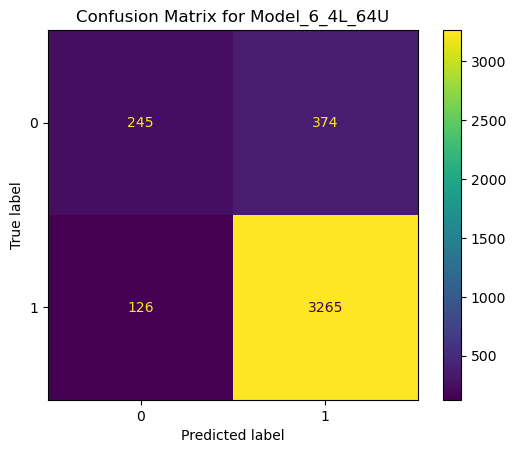

In [50]:
# Assuming test_results_s1_base is a list of dictionaries containing model results
for result in test_results_s1_base:
    # Check if this is the specific model we want
    if result.get('model_name') == 'Model_6_4L_64U' and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot()
        plt.title(f"Confusion Matrix for {result['model_name']}")
        plt.show()

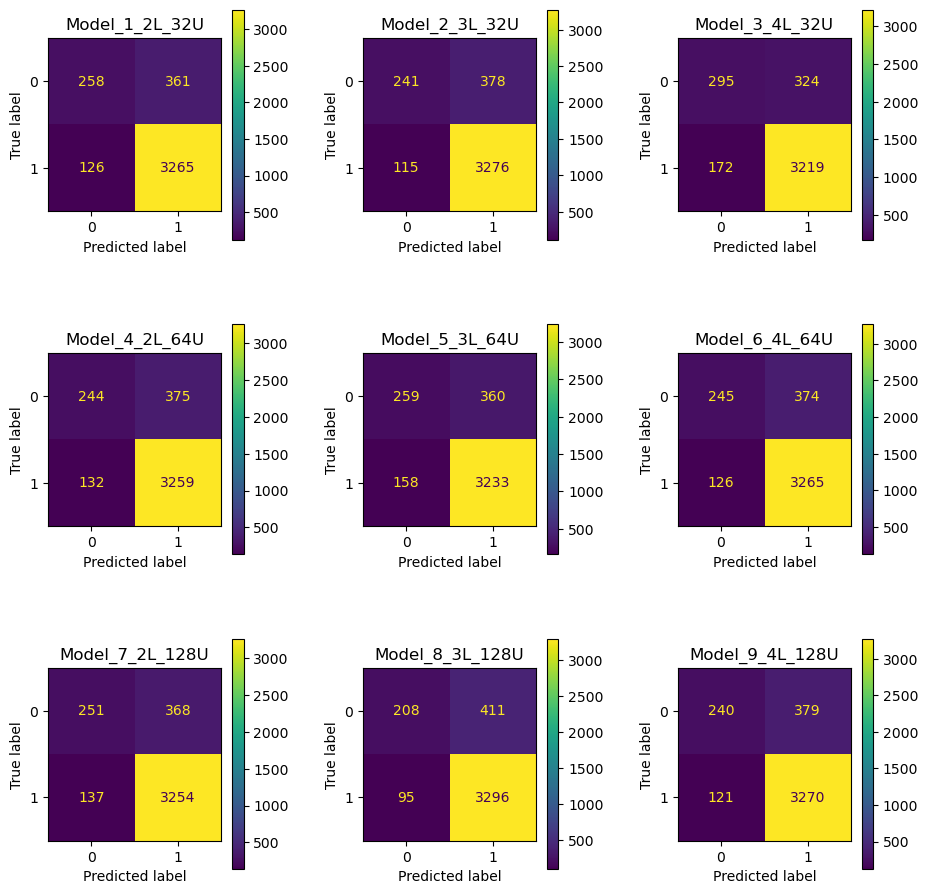

In [51]:
# Display all the Baseline Models Tested

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.tight_layout(pad=4.0)

# Flatten the axes array for easier iteration
axes = axes.ravel()

# Counter for the current subplot
plot_idx = 0

for result in test_results_s1_base:
    # Stop if we've filled all 9 subplots
    if plot_idx >= 9:
        break
        
    # Check if this is the specific model we want
    if result.get('model_name') and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot(ax=axes[plot_idx])
        axes[plot_idx].set_title(f"{result['model_name']}")
        plot_idx += 1

# Hide any remaining empty subplots
for i in range(plot_idx, 9):
    axes[i].axis('off')

plt.show()

In [52]:
# Sorting models based on best metric.
positive_ratio = np.mean(y_test)
if positive_ratio < 0.5:  # Positives are minority
    sort_col = 'pr_auc'   # Focus on positive class performance
    print(f"Positive class is minority ({positive_ratio:.2%}), sorting by PR-AUC")
else:  # Positives are majority
    sort_col = 'roc_auc'  # Focus on overall performance
    print(f"Positive class is majority ({positive_ratio:.2%}), sorting by ROC-AUC")

sorted_auc_base = sorted(test_results_s1_base, key=lambda x: x.get(sort_col, 0), reverse=True)


Positive class is majority (84.56%), sorting by ROC-AUC


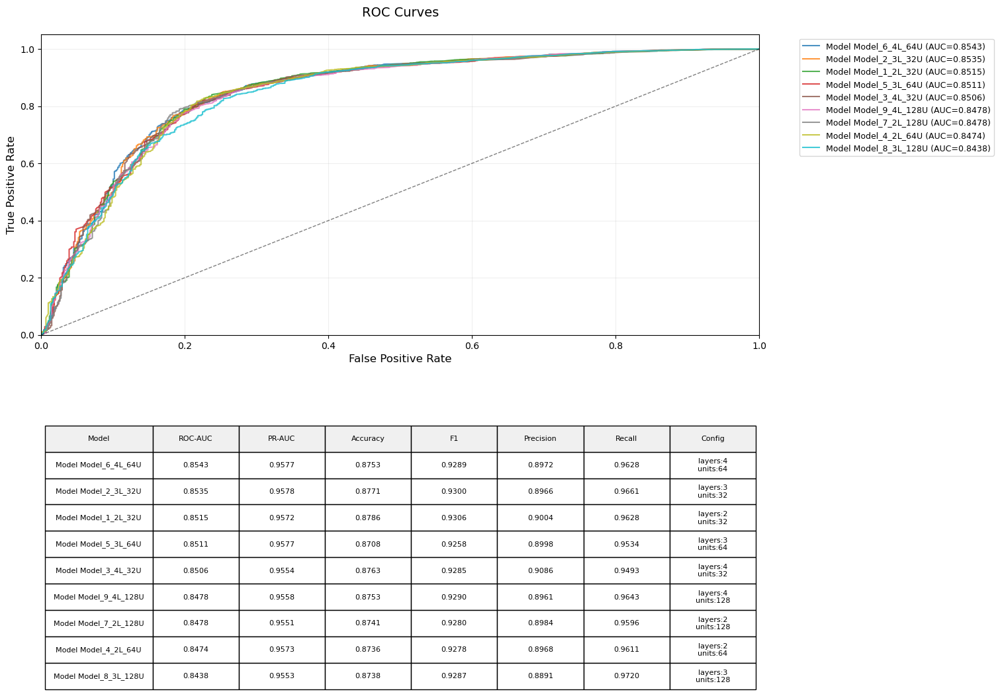

In [53]:
# @tittle ROC Curve for Learning Rate and Activation Function

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def plot_roc_curves(test_results, X_test=None, y_test=None):
    """
    Enhanced ROC curve visualization with model names in legend and table,
    including both ROC-AUC and PR-AUC metrics.
    FIXED: Now uses the same probability extraction method as evaluation function
    """
    plt.figure(figsize=(14, 12))  # Increased figure size for two plots
    
    # Create color palette
    colors = plt.cm.tab10(np.linspace(0, 1, len(test_results)))
    
    # Create subplots with better layout
    ax1 = plt.subplot2grid((10, 2), (0, 0), colspan=2, rowspan=5)  # ROC plot area
    ax2 = plt.subplot2grid((10, 2), (7, 0), colspan=2, rowspan=3)  # Table area
    ax2.axis('off')
    
    # Prepare table data
    table_data = []
    col_labels = ['Model', 'ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall', 'Config']
    
    for i, res in enumerate(test_results):
        try:
            # Get model index and config
            model_idx = res.get('model_name', i)
            config = res['config']
            
            # FIXED: Use stored probabilities from evaluation function
            # This ensures consistency between evaluation and plotting
            if 'y_pred_prob' in res and res['y_pred_prob'] is not None:
                y_score = res['y_pred_prob']  # This is already the positive class probability
            else:
                # Fallback: re-predict if not stored (not recommended)
                print(f"Warning: Re-predicting for model {model_idx} - may cause inconsistency")
                if 'model' in res:
                    y_pred_prob = res['model'].predict(X_test, verbose=0)
                    if y_pred_prob.shape[1] > 1:
                        y_score = y_pred_prob[:, 1]
                    else:
                        y_score = y_pred_prob.flatten()
                else:
                    raise ValueError("No prediction data or model found in results")
            
            # Handle binary vs multi-class
            n_classes = len(np.unique(y_test))
            if n_classes == 2:  # Binary classification
                # FIXED: Use the SAME calculation method as evaluation function
                # Use roc_auc_score for consistency
                roc_auc = roc_auc_score(y_test, y_score)
                
                # Also calculate using roc_curve + auc (should be identical)
                fpr, tpr, _ = roc_curve(y_test, y_score)
                roc_auc_manual = auc(fpr, tpr)
                
                # Verify they match (within floating point precision)
                if abs(roc_auc - roc_auc_manual) > 1e-10:
                    print(f"Warning: ROC-AUC calculation mismatch for model {model_idx}")
                    print(f"  roc_auc_score: {roc_auc:.10f}")
                    print(f"  manual calc:   {roc_auc_manual:.10f}")
                
                # Use the same method as evaluation function
                pr_auc = average_precision_score(y_test, y_score)
                
                # Plot ROC curve
                ax1.plot(fpr, tpr, color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (AUC={roc_auc:.4f})")
                
            else:  # Multi-class - kept same logic but using stored probabilities
                # Use stored full probability matrix
                y_prob = res.get('y_pred_prob_full', res.get('y_pred_prob'))
                if y_prob is None:
                    raise ValueError("No multi-class probability data found")
                
                # One-vs-Rest approach
                fpr, tpr, roc_auc_dict = {}, {}, {}
                
                for class_idx in range(n_classes):
                    fpr[class_idx], tpr[class_idx], _ = roc_curve((y_test == class_idx).astype(int), 
                                                               y_prob[:, class_idx])
                    roc_auc_dict[class_idx] = auc(fpr[class_idx], tpr[class_idx])
                
                # Micro-average metrics
                fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
                roc_auc = auc(fpr["micro"], tpr["micro"])
                
                precision, recall, _ = precision_recall_curve(y_test.ravel(), y_prob.ravel())
                pr_auc = auc(recall, precision)
                
                # Plot micro-average curves
                ax1.plot(fpr["micro"], tpr["micro"], color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (Micro ROC AUC={roc_auc:.4f})")
            
            # Format config for display
            config_clean = {k: v for k, v in config.items() if k != 'model'}
            config_str = "\n".join([f"{k}:{v:.4f}" if isinstance(v, (float, np.floating)) 
                                  else f"{k}:{v}" 
                                  for k, v in config_clean.items()])
            
            # FIXED: Use the SAME values from evaluation results
            table_data.append([
                f"Model {model_idx}",
                f"{res.get('roc_auc', roc_auc):.4f}",  # Use stored value if available
                f"{res.get('pr_auc', pr_auc):.4f}",    # Use stored value if available
                f"{res.get('accuracy', 0):.4f}",
                f"{res.get('f1', 0):.4f}",
                f"{res.get('precision', 0):.4f}",
                f"{res.get('recall', 0):.4f}",
                config_str
            ])
            
        except Exception as e:
            print(f"Error processing model {i}: {str(e)}")
            continue
    
    # Format ROC plot
    ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12)
    ax1.set_ylabel('True Positive Rate', fontsize=12)
    ax1.set_title('ROC Curves', fontsize=14, pad=20)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    ax1.grid(alpha=0.2)
    
    # Create table with better formatting
    if table_data:
        table = ax2.table(
            cellText=table_data,
            colLabels=col_labels,
            loc='center',
            cellLoc='center',
            colColours=['#f0f0f0']*len(col_labels))
        
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        
        table.scale(1, 1.5)  # Increased height scaling for two-line cells
        
        # Set specific column widths and allow text wrapping
        for i in range(len(col_labels)):
            for j in range(len(table_data) + 1):  # +1 for header row
                cell = table[(j, i)]
                if i == 0:  # Config column
                    cell.set_width(0.15)  # Wider for config column
                    cell.set_height(0.15)  # Taller for two-line text
                else:
                    cell.set_width(0.12)
                    cell.set_height(0.15)
    
   
    plt.show()

# Usage
plot_roc_curves(sorted_auc_base, X_test=X_test_scaled_s1, y_test=y_test)


### Model 1: 3 layers and 32 units shows fairly similar combination of metrics compared to model 5, which is the one with the highest ROC_AUC score. More importantly, the F1 score for model 1 is better than for Model 5. Is is of relevance considering the strong imbalance towards the positive class for this dataset. For these reasons I chose Model 1 as my baseline model.

In [ ]:

# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed):
    """Set seeds for reproducible results"""
    tf.random.set_seed(seed)
    np.random.seed(seed)

def create_model_tuning(input_dim, output_dim, layers=3, units=32, dropout=0.2, 
                       lr=0.001, optimizer='adam', seed=42):
    """Create a deterministic neural network model"""
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    # Choose optimizer
    if optimizer.lower() == 'adam':
        opt = Adam(learning_rate=lr)
    elif optimizer.lower() == 'rmsprop':
        opt = RMSprop(learning_rate=lr)
    else:
        opt = Adam(learning_rate=lr)  # default
    
    model.compile(optimizer=opt,
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Get dimensions (assuming X_train, y_train are defined)
input_dim = X_train.shape[1]
output_dim = len(np.unique(y_train))

# Hyperparameter grid
hyperparameter_config = {
    'dropout': [0.2, 0.3], 
    'lr': [0.01, 0.001],
    'optimizer': ['adam', 'rmsprop'],
    'batch_size': [16, 32, 64]
}

models_tuning_s1 = []
histories_tuning_s1 = []

# Generate all combinations of hyperparameters
keys, values = zip(*hyperparameter_config.items())
configs = [dict(zip(keys, v)) for v in product(*values)]

# Initialize progress bar
progress_bar = tqdm(configs, desc="Hyperparameter Tuning", unit="model")

for i, config in enumerate(progress_bar):
    # Update progress bar description with current config
    short_desc = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    progress_bar.set_postfix(config=short_desc)
    
    # Set unique but deterministic seed for each model
    model_seed = 42 + i
    set_global_determinism(model_seed)
    
    # Clear session and memory
    tf.keras.backend.clear_session()
    gc.collect()
    
    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                              restore_best_weights=True, verbose=0)
    
    # Create model with current config (excluding batch_size which is for training)
    model_config = {k: v for k, v in config.items() if k != 'batch_size'}
    model_tuning = create_model_tuning(input_dim, output_dim, seed=model_seed, **model_config)
    
    # Train model (NON-VERBOSE)
    history_tuning = model_tuning.fit(
        X_train_scaled_s1, y_train,
        validation_data=(X_val_scaled_s1, y_val),
        batch_size=config['batch_size'],
        epochs=50,
        callbacks=[early_stop],
        shuffle=True,  # Deterministic due to seed
        verbose=0  # Silent training
    )
    
    # Evaluate model (NON-VERBOSE)
    val_loss_tuning_s1, val_acc_tuning_s1 = model_tuning.evaluate(X_val_scaled_s1, y_val, verbose=0)
    
    
    # Store results
    models_tuning_s1.append(model_tuning)
    histories_tuning_s1.append({
        "config": config,
        "model": model_tuning,
        "val_loss": val_loss_tuning_s1,
        "val_accuracy": val_acc_tuning_s1,
        "history": history_tuning,
        "seed": model_seed
    })
    
    # Clean up
    gc.collect()

# Close progress bar
progress_bar.close()

print(f"Hyperparameter tuning completed. Trained {len(models_tuning_s1)} models.")
print('Models: models_tuning_s1, Histories: histories_tuning_s1')



Hyperparameter Tuning: 100%|██████████| 24/24 [01:46<00:00,  4.46s/model, config=do:0.3 lr:0.001 opt:rmsprop bs:64]

Hyperparameter tuning completed. Trained 24 models.
Models: models_tuning_s1, Histories: histories_tuning_s1


In [55]:
# Because there are too many models, sort and select top 15 Accuracy scores.
sorted_acc_tuning_s1 = sorted(histories_tuning_s1, key=lambda x: x['val_accuracy'], reverse=True)
top_acc_tuning_s1 = sorted_acc_tuning_s1[:15]

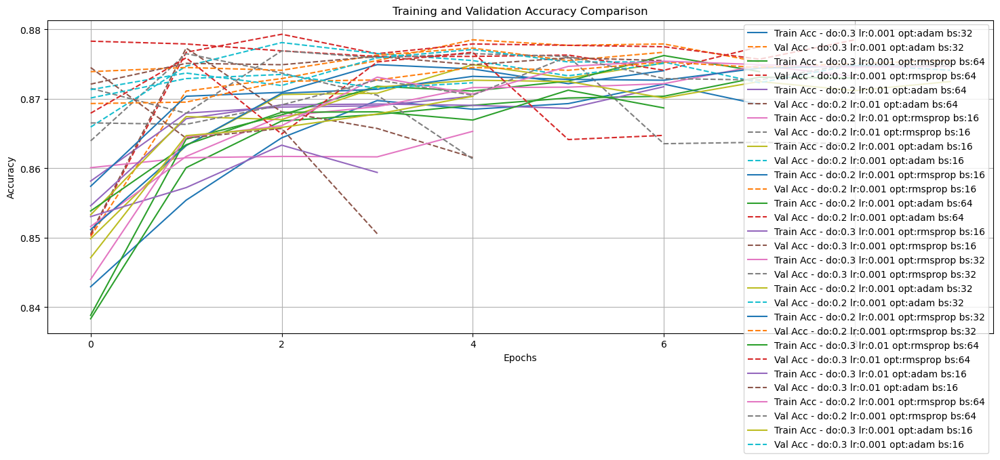

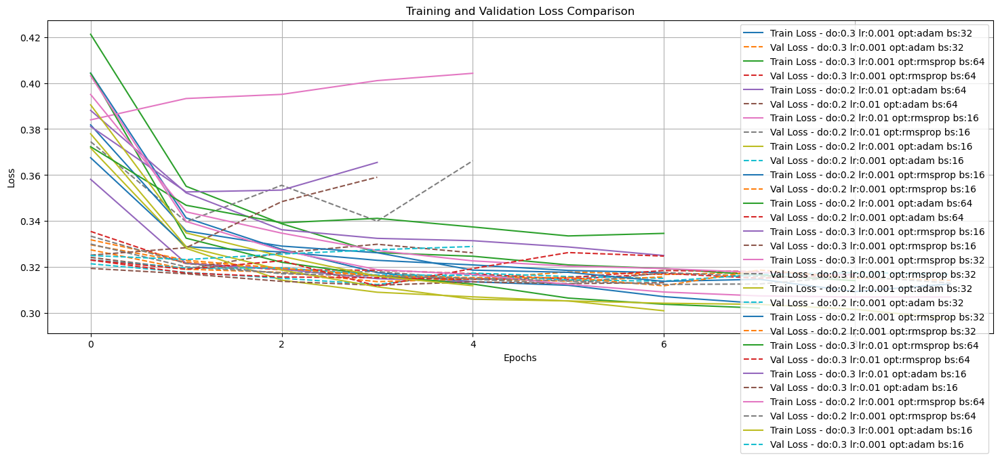

In [56]:
# Plot train/validation accuracy for best models
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s1):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot train/validation loss
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s1):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

plt.title('Training and Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [57]:
# @tittle Model Evaluation

# --- Evaluation Function ---
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def evaluate_trained_models(models, hist_metrics, X_test, y_test, 
                           class_names=None, verbose=True, return_curves=False):
    """
    Comprehensive model evaluation function optimized for imbalanced datasets
    
    Parameters:
    -----------
    models : list
        List of trained Keras models
    hist_metrics : list
        List of training history and config data
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    class_names : list, optional
        Names of classes for better reporting
    verbose : bool
        Print detailed results
    return_curves : bool
        Whether to return ROC and PR curve data
    
    Returns:
    --------
    results : list
        Comprehensive evaluation results for each model
    """
    
    # Set seeds for reproducible evaluation
    np.random.seed(42)
    
    results_tuning = []
    n_classes = len(np.unique(y_test))
    is_binary = n_classes == 2
    
    if verbose:
        print("="*80)
        print(f"EVALUATING {len(models)} MODELS ON TEST SET")
        print(f"Dataset: {len(y_test)} samples, {n_classes} classes")
        if is_binary:
            class_dist = np.bincount(y_test)
            print(f"Class distribution: {class_dist[0]}:{class_dist[1]} ({class_dist[1]/len(y_test)*100:.1f}% positive)")
        print("="*80)
    
    for i, (model, history_data) in enumerate(zip(models, hist_metrics)):
        config = history_data['config']
        model_name = f"Model_{i+1}_{config['optimizer']}O_{config['batch_size']}BS_{config['lr']}LR_{config['dropout']}D"
        
        if verbose:
            print(f"\n{model_name}")
            print("-" * 50)
        
        try:
            # Get predictions
            y_pred_prob = model.predict(X_test, verbose=0)
            
            # Handle probability extraction
            if y_pred_prob.shape[1] > 1:  # Multi-class output
                y_pred_class = np.argmax(y_pred_prob, axis=1)
                if is_binary:
                    y_prob_positive = y_pred_prob[:, 1]  # Probability of positive class
                else:
                    y_prob_positive = y_pred_prob  # Keep all probabilities for multi-class
            else:  # Single output (shouldn't happen with softmax, but just in case)
                y_pred_prob = y_pred_prob.flatten()
                y_pred_class = (y_pred_prob > 0.5).astype(int)
                y_prob_positive = y_pred_prob
            
            # Basic metrics
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            
            # Classification metrics
            if is_binary:
                # Binary classification metrics
                precision = precision_score(y_test, y_pred_class, zero_division=0)
                recall = recall_score(y_test, y_pred_class, zero_division=0)
                f1 = f1_score(y_test, y_pred_class, zero_division=0)
                
                # Class-specific metrics
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                # ROC-AUC and PR-AUC (better for imbalanced data)
                roc_auc = roc_auc_score(y_test, y_prob_positive)
                pr_auc = average_precision_score(y_test, y_prob_positive)
                
                # Confusion matrix
                cm = confusion_matrix(y_test, y_pred_class)
                tn, fp, fn, tp = cm.ravel()
                
                # Additional metrics for imbalanced data
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
                balanced_accuracy = (sensitivity + specificity) / 2
                
                # Matthews Correlation Coefficient (good for imbalanced data)
                mcc_denom = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
                mcc = ((tp * tn) - (fp * fn)) / mcc_denom if mcc_denom != 0 else 0
                
            else:
                # Multi-class metrics
                precision = precision_score(y_test, y_pred_class, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred_class, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred_class, average='weighted', zero_division=0)
                
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                roc_auc = roc_auc_score(y_test, y_prob_positive, multi_class='ovr', average='weighted')
                pr_auc = average_precision_score(y_test, y_prob_positive, average='weighted')
                
                cm = confusion_matrix(y_test, y_pred_class)
                balanced_accuracy = recall  # For multi-class, weighted recall approximates balanced accuracy
                mcc = np.nan  # MCC is complex for multi-class
                specificity = np.nan
                sensitivity = recall
            
            # Store comprehensive results
            result_tuning = {
                # Model info
                'model_index': i,
                'model_name': model_name,
                'config': config,
                
                
                # Basic metrics
                'accuracy': test_accuracy,
                'loss': test_loss,
                'balanced_accuracy': balanced_accuracy,
                
                # Main classification metrics
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'roc_auc': roc_auc,
                'pr_auc': pr_auc,  # Better than ROC-AUC for imbalanced data
                
                # Per-class metrics
                'precision_per_class': precision_per_class,
                'recall_per_class': recall_per_class,
                'f1_per_class': f1_per_class,
                
                # Imbalanced data specific metrics
                'specificity': specificity,
                'sensitivity': sensitivity,
                'mcc': mcc,
                
                # Predictions and probabilities
                'y_pred_prob': y_prob_positive,
                'y_pred_class': y_pred_class,
                'confusion_matrix': cm,
                
                # Training history metrics
                'val_accuracy': history_data.get('val_accuracy', np.nan),
                'val_loss': history_data.get('val_loss', np.nan),
                'train_accuracy': history_data.get('train_accuracy', np.nan),
                'train_loss': history_data.get('train_loss', np.nan),
            }
            
            
            # Add curve data if requested
            if return_curves and is_binary:
                fpr, tpr, roc_thresholds = roc_curve(y_test, y_prob_positive)
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_prob_positive)
                
                result_tuning.update({
                    'roc_curve': {'fpr': fpr, 'tpr': tpr, 'thresholds': roc_thresholds},
                    'pr_curve': {'precision': precision_curve, 'recall': recall_curve, 'thresholds': pr_thresholds}
                })
            
            results_tuning.append(result_tuning)
            
            # Verbose output
            if verbose:
                print(f"Core Metrics:")
                print(f"Accuracy: {test_accuracy:.4f} | Balanced Acc: {balanced_accuracy:.4f}")
                print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
                print(f"AUC Scores:")
                print(f" ROC-AUC: {roc_auc:.4f} | PR-AUC: {pr_auc:.4f}")
                
                if is_binary:
                    print(f"Imbalanced Metrics:")
                    print(f"Sensitivity: {sensitivity:.4f} | Specificity: {specificity:.4f}")
                    print(f"MCC: {mcc:.4f}")
                    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
                
                print(f"Training Performance:")
                print(f"   Train Loss: {history_data.get('train_loss', 'N/A'):.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'}")
                print(f"   Val Loss: {history_data.get('val_loss', 'N/A'):.4f if isinstance(history_data.get('val_loss'), (int, float)) else 'N/A'}")
                
        except Exception as e:
            print(f"Error evaluating {model_name}: {str(e)}")
            continue
    
    if verbose:
        print("\n" + "="*80)
        print("EVALUATION SUMMARY")
        print("="*80)
        
        # Create summary DataFrame
        summary_data = []
        for r in results_tuning:
            summary_data.append({
                'Model': r['model_name'],
                'ROC_AUC': r['roc_auc'],
                'PR_AUC': r['pr_auc'],
                'F1': r['f1'],
                'Bal_Acc': r['balanced_accuracy'],
                'MCC': r.get('mcc', np.nan)
            })
        
        summary_df = pd.DataFrame(summary_data)
        
        positive_ratio = np.mean(y_test)
        if positive_ratio < 0.5:  # Positives are minority
            sort_col = 'PR_AUC'   # Focus on positive class performance
        elif positive_ratio >= 0.5:  # Positives are majority  
            sort_col = 'ROC_AUC' # Focus on negative class performance
        
        # Sort by ROC-AUC (or PR-AUC for heavily imbalanced data)
        summary_df = summary_df.sort_values(sort_col, ascending=False)
        
        print(summary_df.round(4).to_string(index=False))
        print(f"\nBest model by {sort_col}: {summary_df.iloc[0]['Model']}")
    
    return results_tuning


# Basic usage
test_results_s1_tuning = evaluate_trained_models(models_tuning_s1, histories_tuning_s1, X_test_scaled_s1, y_test)



EVALUATING 24 MODELS ON TEST SET
Dataset: 4010 samples, 2 classes
Class distribution: 619:3391 (84.6% positive)

Model_1_adamO_16BS_0.01LR_0.2D
--------------------------------------------------
Core Metrics:
Accuracy: 0.8703 | Balanced Acc: 0.6665
Precision: 0.8934 | Recall: 0.9614 | F1: 0.9261
AUC Scores:
 ROC-AUC: 0.8437 | PR-AUC: 0.9567
Imbalanced Metrics:
Sensitivity: 0.9614 | Specificity: 0.3716
MCC: 0.4203
Confusion Matrix: TN=230, FP=389, FN=131, TP=3260
Training Performance:
Error evaluating Model_1_adamO_16BS_0.01LR_0.2D: Invalid format specifier '.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'' for object of type 'str'

Model_2_adamO_32BS_0.01LR_0.2D
--------------------------------------------------
Core Metrics:
Accuracy: 0.8678 | Balanced Acc: 0.5983
Precision: 0.8724 | Recall: 0.9882 | F1: 0.9267
AUC Scores:
 ROC-AUC: 0.8246 | PR-AUC: 0.9505
Imbalanced Metrics:
Sensitivity: 0.9882 | Specificity: 0.2084
MCC: 0.3535
Confusion Matrix: TN=129, FP=4

In [58]:
# Because there are too many models, sort and select top 10 AUC scores.
# Sorting models based on best metric.
positive_ratio = np.mean(y_test)
if positive_ratio < 0.5:  # Positives are minority
    sort_col = 'pr_auc'   # Focus on positive class performance
    print(f"Positive class is minority ({positive_ratio:.2%}), sorting by PR-AUC")
else:  # Positives are majority
    sort_col = 'roc_auc'  # Focus on overall performance
    print(f"Positive class is majority ({positive_ratio:.2%}), sorting by ROC-AUC")
    
sorted_auc_tuning_s1 = sorted(test_results_s1_tuning, key=lambda x: x['roc_auc'], reverse=True)
top_auc_tuning_s1 = sorted_auc_tuning_s1[:15]

Positive class is majority (84.56%), sorting by ROC-AUC


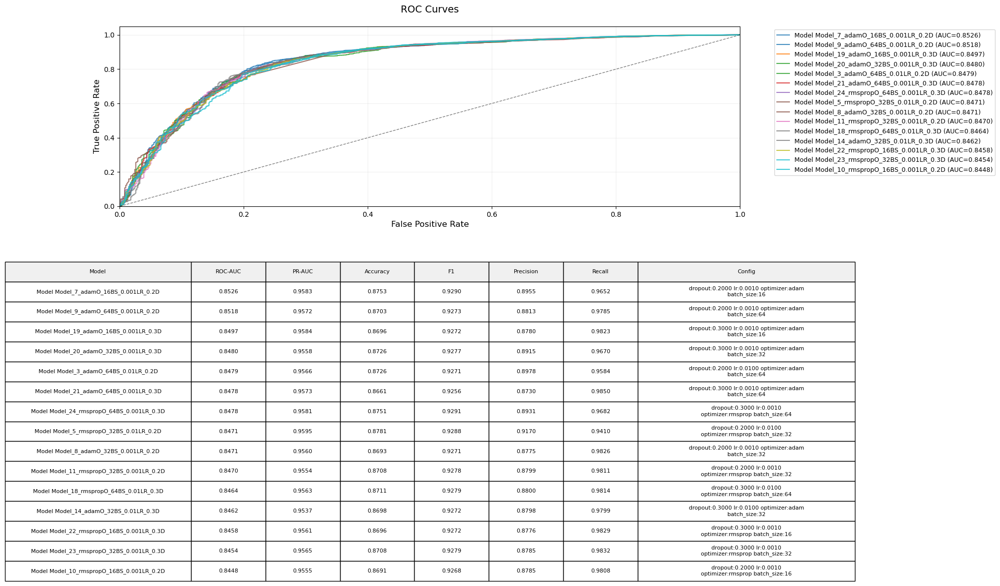

In [59]:
# @tittle ROC Curve for Learning Rate and Activation Function

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def plot_roc_curves(test_results, X_test=None, y_test=None):
    """
    Enhanced ROC curve visualization with model names in legend and table,
    including both ROC-AUC and PR-AUC metrics.
    FIXED: Now uses the same probability extraction method as evaluation function
    """
    plt.figure(figsize=(16, 12))  # Increased figure size for two plots
    
    # Create color palette
    colors = plt.cm.tab10(np.linspace(0, 1, len(test_results)))
    
    # Create subplots with better layout
    ax1 = plt.subplot2grid((10, 2), (0, 0), colspan=2, rowspan=4)  # ROC plot area
    ax2 = plt.subplot2grid((10, 2), (7, 0), colspan=2, rowspan=3)  # Table area
    ax2.axis('off')
    
    # Prepare table data
    table_data = []
    col_labels = ['Model', 'ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall', 'Config']
    
    for i, res in enumerate(test_results):
        try:
            # Get model index and config
            model_idx = res.get('model_name', i)
            config = res['config']
            
            # Use stored probabilities from evaluation function
            # This ensures consistency between evaluation and plotting
            if 'y_pred_prob' in res and res['y_pred_prob'] is not None:
                y_score = res['y_pred_prob']  # This is already the positive class probability
            
            
            # Handle binary vs multi-class
            n_classes = len(np.unique(y_test))
            if n_classes == 2:  # Binary classification
                # FIXED: Use the SAME calculation method as evaluation function
                # Use roc_auc_score for consistency
                roc_auc = roc_auc_score(y_test, y_score)
                
                # Also calculate using roc_curve + auc (should be identical)
                fpr, tpr, _ = roc_curve(y_test, y_score)
                roc_auc_manual = auc(fpr, tpr)
                
                # Verify they match (within floating point precision)
                if abs(roc_auc - roc_auc_manual) > 1e-10:
                    print(f"Warning: ROC-AUC calculation mismatch for model {model_idx}")
                    print(f"  roc_auc_score: {roc_auc:.10f}")
                    print(f"  manual calc:   {roc_auc_manual:.10f}")
                
                # Use the same method as evaluation function
                pr_auc = average_precision_score(y_test, y_score)
                
                # Plot ROC curve
                ax1.plot(fpr, tpr, color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (AUC={roc_auc:.4f})")
                
            else:  # Multi-class - kept same logic but using stored probabilities
                # Use stored full probability matrix
                y_prob = res.get('y_pred_prob_full', res.get('y_pred_prob'))
                if y_prob is None:
                    raise ValueError("No multi-class probability data found")
                
                # One-vs-Rest approach
                fpr, tpr, roc_auc_dict = {}, {}, {}
                
                for class_idx in range(n_classes):
                    fpr[class_idx], tpr[class_idx], _ = roc_curve((y_test == class_idx).astype(int), 
                                                               y_prob[:, class_idx])
                    roc_auc_dict[class_idx] = auc(fpr[class_idx], tpr[class_idx])
                
                # Micro-average metrics
                fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
                roc_auc = auc(fpr["micro"], tpr["micro"])
                
                precision, recall, _ = precision_recall_curve(y_test.ravel(), y_prob.ravel())
                pr_auc = auc(recall, precision)
                
                # Plot micro-average curves
                ax1.plot(fpr["micro"], tpr["micro"], color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (Micro ROC AUC={roc_auc:.4f})")
            
            # Format config for display
            config_clean = {k: v for k, v in config.items() if k != 'model'}
            config_str = "\n".join([f"{k}:{v:.4f}" if isinstance(v, (float, np.floating)) 
                                  else f"{k}:{v}" 
                                  for k, v in config_clean.items()])
            
            # FIXED: Use the SAME values from evaluation results
            table_data.append([
                f"Model {model_idx}",
                f"{res.get('roc_auc', roc_auc):.4f}",  # Use stored value if available
                f"{res.get('pr_auc', pr_auc):.4f}",    # Use stored value if available
                f"{res.get('accuracy', 0):.4f}",
                f"{res.get('f1', 0):.4f}",
                f"{res.get('precision', 0):.4f}",
                f"{res.get('recall', 0):.4f}",
                config_str
            ])
            
        except Exception as e:
            print(f"Error processing model {i}: {str(e)}")
            continue
    
    # Format ROC plot
    ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12)
    ax1.set_ylabel('True Positive Rate', fontsize=12)
    ax1.set_title('ROC Curves', fontsize=14, pad=20)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    ax1.grid(alpha=0.2)
    
    # Create table with better formatting
    if table_data:
        # Wrap text in the config column (column 7) before creating the table
        wrapped_table_data = []
        for row in table_data:
            wrapped_row = []
            for i, cell_text in enumerate(row):
                if i == 7:  # Config column
                    # Wrap text to fit in ~30-35 characters per line
                    wrapped_text = '\n'.join(textwrap.wrap(str(cell_text), width=40))
                    wrapped_row.append(wrapped_text)
                else:
                    wrapped_row.append(cell_text)
            wrapped_table_data.append(wrapped_row)
        
        table = ax2.table(
            cellText=wrapped_table_data,
            colLabels=col_labels,
            loc='center',
            cellLoc='center',
            colColours=['#f0f0f0']*len(col_labels))
        
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        table.scale(1, 1.5)
        
        # Set specific column widths
        for i in range(len(col_labels)):
            for j in range(len(wrapped_table_data) + 1):
                cell = table[(j, i)]
                if i == 0:  # Config column
                    cell.set_width(0.30)
                    cell.set_height(0.15)  # Even taller for wrapped text
                elif i == 7:  # Config column
                    cell.set_width(0.35)
                    cell.set_height(0.15) 
                else:
                    cell.set_width(0.12)
                    cell.set_height(0.15)
    plt.show()

# Usage
plot_roc_curves(top_auc_tuning_s1, X_test=X_test_scaled_s1, y_test=y_test)


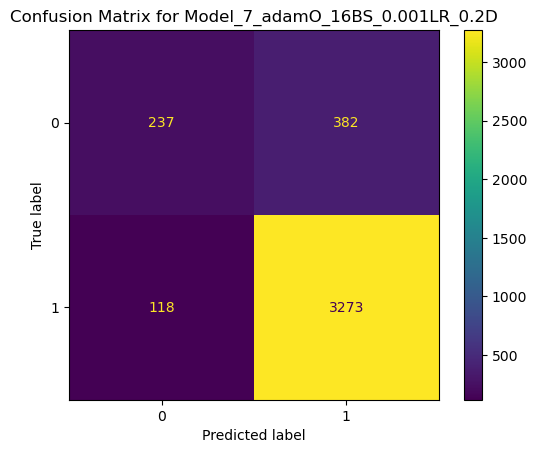

In [60]:
# Assuming test_results_s1_base is a list of dictionaries containing model results
for result in test_results_s1_tuning:
    # Check if this is the specific model we want
    if result.get('model_name') == 'Model_7_adamO_16BS_0.001LR_0.2D' and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot()
        plt.title(f"Confusion Matrix for {result['model_name']}")
        plt.show()

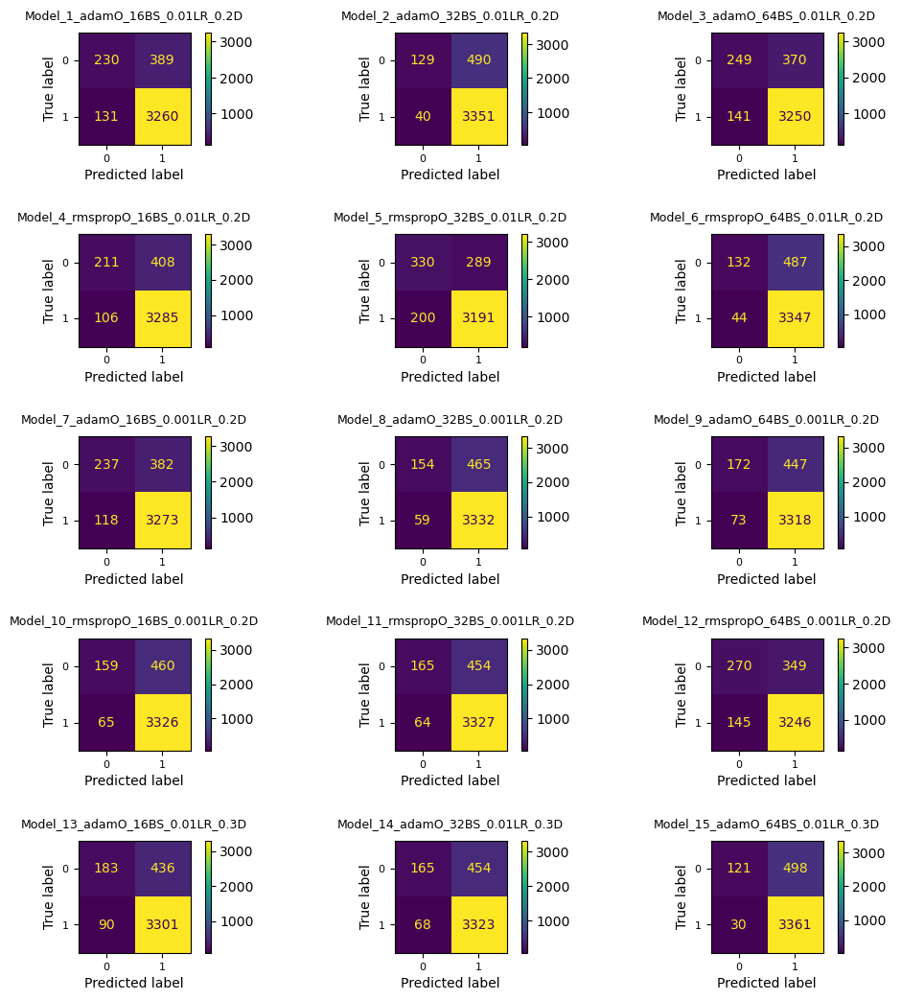

In [61]:
# Display top 15 the Tuned Model Tested

# Create the figure with adjusted spacing parameters
fig, axes = plt.subplots(5, 3, figsize=(12, 12))

# Main figure padding control
fig.tight_layout(pad=1.0)  # Increased from 1.0 to 3.0 for more outer padding

# Additional spacing controls:
plt.subplots_adjust(
    left=0.1,    # Left margin
    right=0.9,   # Right margin
    bottom=0.1,  # Bottom margin
    top=0.9,     # Top margin
    wspace=0.1,  # Horizontal space between subplots
    hspace=0.8   # Vertical space between subplots
)

# Flatten the axes array for easier iteration
axes = axes.ravel()

# Counter for the current subplot
plot_idx = 0

for result in test_results_s1_tuning:
    # Stop if we've filled desired number of subplots
    if plot_idx >= 15:
        break
        
    # Check if this is the specific model we want
    if result.get('model_name') and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot(ax=axes[plot_idx])
        
        # Adjust title positioning and font size
        axes[plot_idx].set_title(
            f"{result['model_name']}",
            pad=10,  # Add padding between title and plot
            fontsize=9  # Smaller font size for long titles
        )
        
        # Adjust tick label sizes if needed
        axes[plot_idx].tick_params(axis='both', which='major', labelsize=8)
        
        plot_idx += 1

# Hide any remaining empty subplots
for i in range(plot_idx, 15):
    axes[i].axis('off')

plt.show()

### Model_7_adamO_16BS_0.001LR_0.2D: 3 hidden layers with 32 neurons. 

Activation: Relu, Softmax

Optimizer: Adam

Loss: Sparse Categorical Crossentropy

Dropout: 0.2

Learning Rate: 0.001

Batch Size: 16


- Learning curves assist with training decisions like early stopping, architecture selection, and stability assessment, but shouldn't be the only basis for final model choice. 
- Standard loss functions can be biased toward majority classes, masking poor minority class performance. That's why I used 'sparse_categorical_crossentropy,' which handles imbalanced datasets more effectively. 
- In imbalanced settings where positives are rare, traditional accuracy can be misleading—an accuracy of 80% might merely reflect always predicting the majority class. ROC-AUC remains a reliable metric for overall discriminative ability, while Precision-Recall AUC offers deeper insights into minority class performance. For model evaluation, I prioritized ROC-AUC, followed by Precision-Recall AUC, F1-score, Recall, and Precision, ensuring a balanced assessment of performance across metrics.


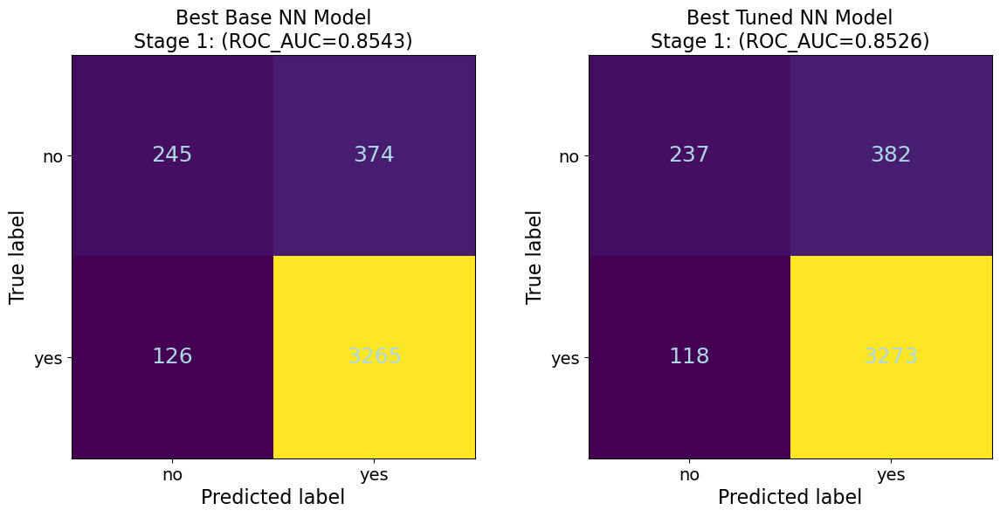

In [ ]:

# Compute confusion matrices for best Neural Network models
# Find the best base model
best_base = max(test_results_s1_base, key=lambda r: r['roc_auc'])
y_pred_base = best_base['y_pred_class']
cm_base = confusion_matrix(y_test, y_pred_base)

# Find the best tuned model
best_tuning = max(test_results_s1_tuning, key=lambda r: r['roc_auc'])
y_pred_tuned = best_tuning['y_pred_class']
cm_tuned = confusion_matrix(y_test, y_pred_tuned)

# Base model
disp_base = ConfusionMatrixDisplay(confusion_matrix=cm_base, display_labels=["no", "yes"])
disp_tuned = ConfusionMatrixDisplay(confusion_matrix=cm_tuned, display_labels=["no", "yes"])


# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot confusion matrices
disp_base.plot(ax=axes[0], colorbar=False)
disp_tuned.plot(ax=axes[1], colorbar=False)

# Set titles with ROC_AUC info
axes[0].set_title(f"Best Base NN Model\nStage 1: (ROC_AUC={best_base['roc_auc']:.4f})", fontsize=16)
axes[1].set_title(f"Best Tuned NN Model\nStage 1: (ROC_AUC={best_tuning['roc_auc']:.4f})", fontsize=16)

# Set axis labels with font size
axes[0].set_xlabel('Predicted label', fontsize=16)
axes[0].set_ylabel('True label', fontsize=16)
axes[1].set_xlabel('Predicted label', fontsize=16)
axes[1].set_ylabel('True label', fontsize=16)

# Remove grid lines
axes[0].grid(False)
axes[1].grid(False)

# Customize tick labels and cell fonts
for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=14)
    for text in ax.texts:
        text.set_fontsize(18)
        text.set_color('lightblue')
        
plt.subplots_adjust(wspace=0.2, hspace=0.3)

plt.show()


#### These confusion matrices were built using the best models for the neural networks and y_test sets.

# Stage 2 data

In [62]:
# File URL
file_url = "https://drive.google.com/uc?id=1vy1JFQZva3lhMJQV69C43AB1NTM4W-DZ"

df2 = pd.read_csv(file_url)
display(df2.head())

,CentreName,LearnerCode,BookingType,LeadSource,DiscountType,DateofBirth,Gender,Nationality,HomeState,HomeCity,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,ProgressionDegree,ProgressionUniversity,AuthorisedAbsenceCount,UnauthorisedAbsenceCount
0,ISC_Aberdeen,2284932,Agent,Standard Agent Booking,NaN,13/01/1998,Male,Chinese,Jianye District; Jiangsu Province,Nanjing,Pre-Masters,Business and Law Pre-Masters,True,Yes,Msc Econ Accounting and Investment Management,University of Aberdeen,NaN,NaN
1,ISC_Aberdeen,2399500,Agent,Standard Agent Booking,NaN,12/2/1998,Male,Chinese,NaN,Xi'an,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,BSc Biological Sciences,University of Aberdeen,93.0,5.0
2,ISC_Aberdeen,2424946,Agent,Standard Agent Booking,NaN,7/4/2000,Male,Chinese,NaN,Chengdu,International Year Two,Business Management and Finance International ...,False,Yes,MA Finance,University of Aberdeen,92.0,6.0
3,ISC_Aberdeen,2426583,Agent,Standard Agent Booking,NaN,18/05/1999,Male,Chinese,NaN,LIUYANG CITY ;CHANGSHA,International Year Two,Business Management and Finance International ...,True,Yes,MA Business Management,University of Aberdeen,67.0,15.0
4,ISC_Aberdeen,2434674,Agent,Standard Agent Booking,NaN,19/04/1996,Male,Chinese,NaN,Xiamen,Pre-Masters,Business and Law Pre-Masters,True,Yes,MSc International Business Management,University of Aberdeen,NaN,NaN


### Data Exploratory Analysis Stage 2

In [63]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25059 entries, 0 to 25058
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CentreName                25059 non-null  object 
 1   LearnerCode               25059 non-null  int64  
 2   BookingType               25059 non-null  object 
 3   LeadSource                25059 non-null  object 
 4   DiscountType              7595 non-null   object 
 5   DateofBirth               25059 non-null  object 
 6   Gender                    25059 non-null  object 
 7   Nationality               25059 non-null  object 
 8   HomeState                 8925 non-null   object 
 9   HomeCity                  21611 non-null  object 
 10  CourseLevel               25059 non-null  object 
 11  CourseName                25059 non-null  object 
 12  IsFirstIntake             25059 non-null  bool   
 13  CompletedCourse           25059 non-null  object 
 14  Progre

In [64]:
# Remove unnecessary columns
df2.drop('LearnerCode', axis=1, inplace=True)

### Remove columns with high cardinality (use >200 unique values, as a guideline for this data set).

High cardinality refers to columns that contain a large number of unique values. In this case the recommendation is to remove columns with >200 unique values. This may need adjustment based on specific dataset and analysis goals.
This is important because columns with high cardinality can lead to overfitting of machine learning models, creates sparse data when one-hot encoded significantly increasing memory usage.

In [65]:
# Get list of columns to remove
high_cardinality_cols_s2 = [col for col in df2.columns if df2[col].nunique() > 200]
print("High cardinality columns:", high_cardinality_cols_s2)

High cardinality columns: ['DateofBirth', 'HomeState', 'HomeCity', 'ProgressionDegree', 'UnauthorisedAbsenceCount']


HomeState and HomeCity are unlikely to provide any useful information regarding the student’s likelihood to drop out. So they will be remove from the dataset considering their high cardinality.

DateOfBirth will also be removed due to its high cardinality. However, first I will create a new column called Age which will be the difference between the current date and the date of birth. This will be a more useful feature for the analysis.

ProgressionDegree will also be removed due to its high cardinality. This column contains 2616 unique values which is too high for encoding. Nonetheless, it is important to note that this column contains information about the degree the student is studying. This information may be useful for the analysis, but it is not possible to encode it in a meaningful way. 

In [66]:
# Remove these columns
df2_reduced = df2.drop(columns=['HomeState', 'HomeCity'], axis=1)

In [67]:
# Convert DateofBirth to Age

df2_reduced['DateofBirth'] = pd.to_datetime(df2_reduced['DateofBirth'], dayfirst=True, errors='coerce')

df2_reduced['Age'] = (date.today().year - df2_reduced['DateofBirth'].dt.year)

# Drop the original DateofBirth column
df2_reduced.drop('DateofBirth', axis=1, inplace=True)

In [68]:
# Drop the ProgressionDegree column
df2_reduced.drop('ProgressionDegree', axis=1, inplace=True)

#### Check the structure of the UnauthorisedAbsenceCount feature to decide whether is a good idea to drop it.

In [69]:
# Check number of unique values in ProgressionDegree column and count of each unique value
print("Unique values in UnauthorisedAbsenceCount:", df2_reduced['UnauthorisedAbsenceCount'].nunique())
print("Count of each unique value in UnauthorisedAbsenceCount:")
print(df2_reduced['UnauthorisedAbsenceCount'].value_counts())

Unique values in UnauthorisedAbsenceCount: 258
Count of each unique value in UnauthorisedAbsenceCount:
UnauthorisedAbsenceCount
1.0      616
3.0      562
0.0      499
7.0      493
6.0      487
        ... 
263.0      1
286.0      1
216.0      1
220.0      1
242.0      1
Name: count, Length: 258, dtype: int64


#### UnauthorisedAbsenceCount looks like an interesting feature that could have an impact on the rate of course dropouts. Due to its hight cardinality, which will be a problem for the encoding, I will explore ways to engineering this feature.

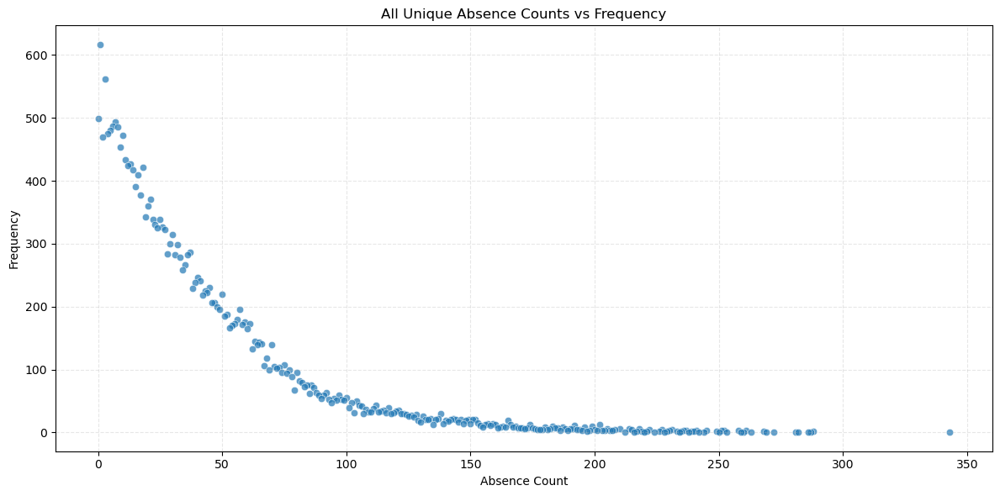

In [70]:
# Visualize distribution of Unique values in UnauthorisedAbsenceCount. This will help us to decide ways to bin the data
# Get all value counts and reset index
value_counts = df2_reduced['UnauthorisedAbsenceCount'].value_counts().reset_index()
value_counts.columns = ['AbsenceCount', 'Frequency']

# Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=value_counts, x='AbsenceCount', y='Frequency', alpha=0.7)
plt.title("All Unique Absence Counts vs Frequency")
plt.xlabel("Absence Count")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

#### Based on this analysis, I decided to bin the data as follows.

In [71]:
# Define bins (adjust thresholds based on domain knowledge)
bins = [0, 10, 50, 100, float('inf')]
labels = ['<10', '11-50', '51-100', '>100']

# Create a new binned column
df2_reduced['Unauthorised_AbsenceCategory'] = pd.cut(
    df2_reduced['UnauthorisedAbsenceCount'],
    bins=bins,
    labels=labels,
    right=False
)

In [72]:
display(df2_reduced.head(2))

,CentreName,BookingType,LeadSource,DiscountType,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,ProgressionUniversity,AuthorisedAbsenceCount,UnauthorisedAbsenceCount,Age,Unauthorised_AbsenceCategory
0,ISC_Aberdeen,Agent,Standard Agent Booking,NaN,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,University of Aberdeen,NaN,NaN,27,NaN
1,ISC_Aberdeen,Agent,Standard Agent Booking,NaN,Male,Chinese,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,University of Aberdeen,93.0,5.0,27,<10


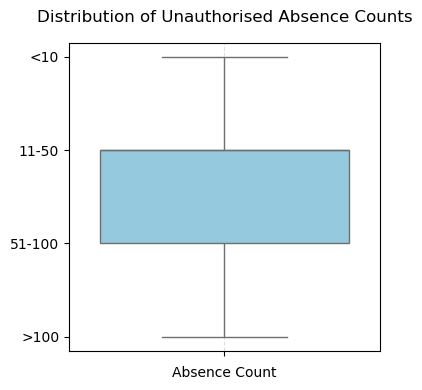

In [73]:
plt.figure(figsize=(4, 4))  # Wider figure for better readability
sns.boxplot(
    y=df2_reduced['Unauthorised_AbsenceCategory'],  # Use 'y' instead of 'x'
    orient='h',  # Horizontal orientation
    color='skyblue'
)
plt.title("Distribution of Unauthorised Absence Counts", pad=15)
plt.xlabel("Absence Count")
plt.ylabel("")  # Remove redundant y-label
plt.grid(axis='x', linestyle='--', alpha=0.4)  # Add light grid lines
plt.tight_layout()
plt.show()

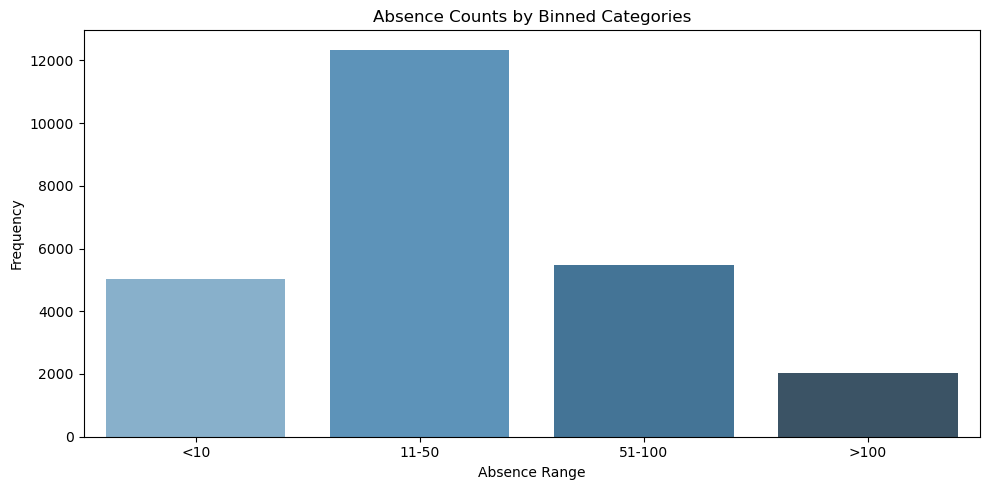

In [74]:
binned_counts = df2_reduced['Unauthorised_AbsenceCategory'].value_counts().sort_index()

plt.figure(figsize=(10, 5))
sns.barplot(x=binned_counts.index, y=binned_counts.values, palette="Blues_d")
plt.title("Absence Counts by Binned Categories")
plt.xlabel("Absence Range")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

#### Now we can drop UnauthorisedAbsenceCount

In [75]:
# Drop the ProgressionDegree column
df2_reduced.drop('UnauthorisedAbsenceCount', axis=1, inplace=True)

#### Repeat the binning process for the AuthorisedAbsenceCount to keep it consistent

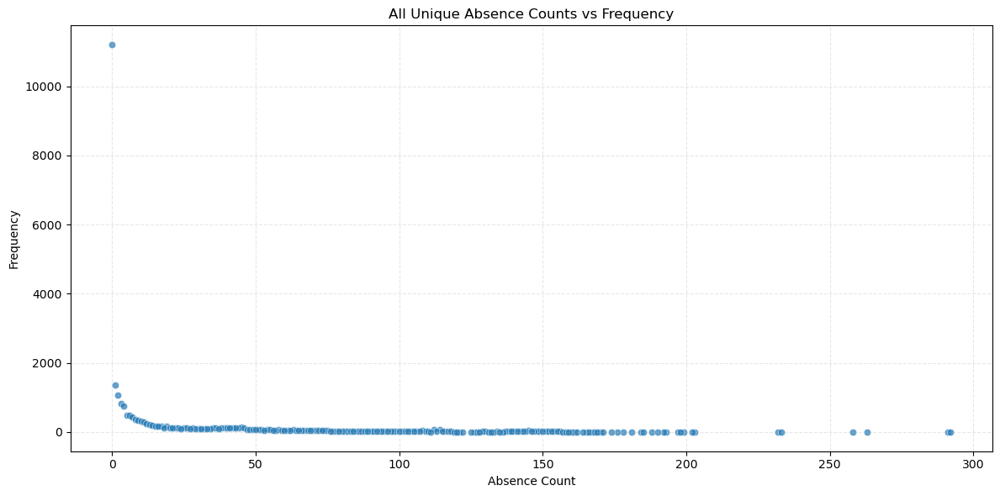

In [76]:
# Visualize distribution of Unique values in UnauthorisedAbsenceCount. This will help us to decide ways to bin the data
# Get all value counts and reset index
value_counts = df2_reduced['AuthorisedAbsenceCount'].value_counts().reset_index()
value_counts.columns = ['AbsenceCount', 'Frequency']

# Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=value_counts, x='AbsenceCount', y='Frequency', alpha=0.7)
plt.title("All Unique Absence Counts vs Frequency")
plt.xlabel("Absence Count")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

In [77]:
# Define bins (adjust thresholds based on domain knowledge)
bins = [0, 10, 50, 100, float('inf')]
labels = ['<10', '11-50', '51-100', '>100']

# Create a new binned column
df2_reduced['Autorised_AbsenceCategory'] = pd.cut(
    df2_reduced['AuthorisedAbsenceCount'],
    bins=bins,
    labels=labels,
    right=False
)

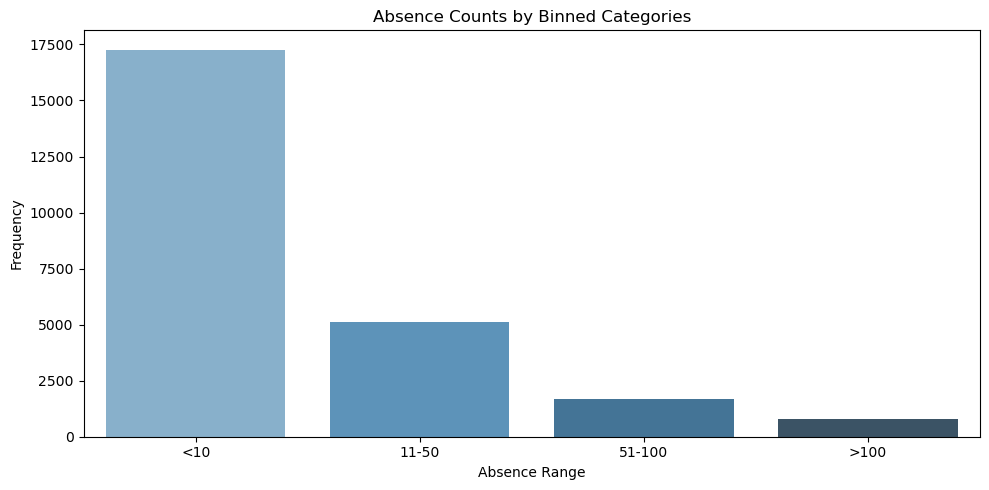

In [78]:
binned_counts = df2_reduced['Autorised_AbsenceCategory'].value_counts().sort_index()

plt.figure(figsize=(10, 5))
sns.barplot(x=binned_counts.index, y=binned_counts.values, palette="Blues_d")
plt.title("Absence Counts by Binned Categories")
plt.xlabel("Absence Range")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [79]:
# Drop the ProgressionDegree column
df2_reduced.drop('AuthorisedAbsenceCount', axis=1, inplace=True)

### Remove columns with > 50% data missing.

In [80]:
# Get list of columns to remove
high_nas_cols_s2 = [col for col in df2_reduced.columns if df2_reduced[col].isna().sum() > 0.5 * len(df2_reduced)]
print("High NA columns:", high_nas_cols_s2)

High NA columns: ['DiscountType']


In [81]:
# Drop the DiscountType column
df2_reduced.drop('DiscountType', axis=1, inplace=True)

In [82]:
display(df2_reduced.head())

,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,ProgressionUniversity,Age,Unauthorised_AbsenceCategory,Autorised_AbsenceCategory
0,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,University of Aberdeen,27,NaN,NaN
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,University of Aberdeen,27,<10,51-100
2,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,International Year Two,Business Management and Finance International ...,False,Yes,University of Aberdeen,25,<10,51-100
3,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,International Year Two,Business Management and Finance International ...,True,Yes,University of Aberdeen,26,11-50,51-100
4,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,University of Aberdeen,29,NaN,NaN


### Perform ordinal encoding for ordinal data.

In [83]:
# Check the unique values in ordinal columns
for column in ['CourseLevel', 'Unauthorised_AbsenceCategory', 'Autorised_AbsenceCategory']:
    unique_values = df2_reduced[column].unique()
    print(f"Unique values in {column}:")
    print(unique_values)
    print("\n" + "-"*50 + "\n")

Unique values in CourseLevel:
['Pre-Masters' 'Foundation' 'International Year Two'
 'International Year One']

--------------------------------------------------

Unique values in Unauthorised_AbsenceCategory:
[NaN, '<10', '11-50', '51-100', '>100']
Categories (4, object): ['<10' < '11-50' < '51-100' < '>100']

--------------------------------------------------

Unique values in Autorised_AbsenceCategory:
[NaN, '51-100', '11-50', '<10', '>100']
Categories (4, object): ['<10' < '11-50' < '51-100' < '>100']

--------------------------------------------------



In [84]:
# Convert ordinal columns to numeric using map
# Define the mapping for CourseLevel
course_level_mapping = {
    'Pre-Masters': 1,
    'Foundation': 2,
    'International Year One': 3,
    'International Year Two': 4
}
df2_reduced['CourseLevel'] = df2_reduced['CourseLevel'].map(course_level_mapping)


In [85]:
# For Unauthorised Absence
df2_reduced['Unauthorised_Absence_Ordinal'] = (df2_reduced['Unauthorised_AbsenceCategory'].cat.codes.replace({-1: np.nan}))

# For Authorised Absence
df2_reduced['Autorised_Absence_Ordinal'] = (df2_reduced['Autorised_AbsenceCategory'].cat.codes.replace({-1: np.nan}))

# Drop the DiscountType column
df2_reduced.drop(['Unauthorised_AbsenceCategory', 'Autorised_AbsenceCategory'], axis=1, inplace=True)

In [86]:
display(df2_reduced.head())

,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,ProgressionUniversity,Age,Unauthorised_Absence_Ordinal,Autorised_Absence_Ordinal
0,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,1,Business and Law Pre-Masters,True,Yes,University of Aberdeen,27,NaN,NaN
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,2,Life Sciences Undergraduate Foundation Programme,False,Yes,University of Aberdeen,27,0.0,2.0
2,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,4,Business Management and Finance International ...,False,Yes,University of Aberdeen,25,0.0,2.0
3,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,4,Business Management and Finance International ...,True,Yes,University of Aberdeen,26,1.0,2.0
4,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,1,Business and Law Pre-Masters,True,Yes,University of Aberdeen,29,NaN,NaN


### Visual Exploration before one-hot encoding to keep number of features low.

In [87]:
# CourseName, Nationality, and ProgressionUniversity have too many unique elements, so I will drop them for visualization purposes, since they make the composite plot too crowded.
df2_drop = df2_reduced.drop(['CourseName', 'ProgressionUniversity', 'Nationality'], axis=1, inplace=False)

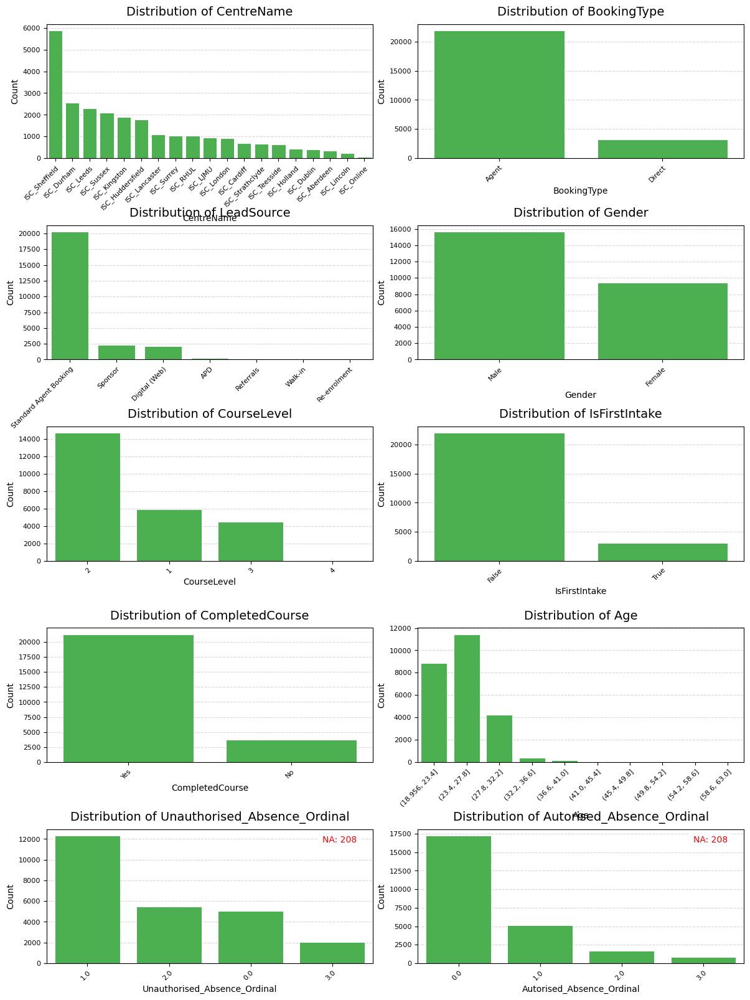

In [88]:
# @title: Data Distribution
# Function to create histograms for each column in the DataFrame
def make_barplots(
    data,
    n_cols = None,
    n_rows = None,
    figsize = (12, 16),
    color = "#4CAF50",  # Changed to a more visible green
    na_color = "red",
    title_fontsize = 14,
    label_fontsize = 10,
    tick_label_fontsize = 8,
    rotation = 45,
    max_unique_cat = 10,
    bar_width = 0.8,
    grid = True,
    **kwargs
) -> None:
    """
    Creates bar plots for all DataFrame columns using Matplotlib.

    Parameters:
    -----------
    data : pd.DataFrame
        Input DataFrame to visualize.
    figsize : tuple, optional (default=(16, 25))
        Figure dimensions (width, height).
    color : str, optional (default="#4CAF50")
        Color for the bars (changed to high-visibility green).
    na_color : str, optional (default="red")
        Color for missing value annotations.
    title_fontsize : int, optional (default=14)
        Font size for plot titles.
    label_fontsize : int, optional (default=10)
        Font size for axis labels.
    tick_label_fontsize : int, optional (default=8)
        Font size for tick labels.
    rotation : int, optional (default=45)
        Rotation angle for x-tick labels.
    max_unique_cat : int, optional (default=10)
        Max unique values to treat as categorical.
    bar_width : float, optional (default=0.8)
        Width of bars (0-1).
    grid : bool, optional (default=True)
        Whether to show grid lines.
    **kwargs : dict
        Additional arguments passed to plt.subplots().
    """


    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, **kwargs)
    axes = axes.flatten() if n_rows > 1 else [axes]

    for i, (ax, column) in enumerate(zip(axes, data.columns)):
        col_data = data[column].dropna()
        unique_vals = col_data.nunique()
        na_count = data[column].isna().sum()

        # Handle categorical vs. numerical data
        if col_data.dtype in ['object', 'category', 'bool'] or unique_vals <= max_unique_cat:
            # Categorical data
            counts = col_data.value_counts()
            labels = counts.index.astype(str)
            values = counts.values
        else:
            # Numerical data - bin it
            bins = min(10, unique_vals)
            counts = pd.cut(col_data, bins=bins).value_counts().sort_index()
            labels = [str(interval) for interval in counts.index]
            values = counts.values

        # Plot bars
        x_pos = np.arange(len(values))
        bars = ax.bar(x_pos, values, width=bar_width, color=color, edgecolor='white', linewidth=0.7)

        # Customize plot
        ax.set_title(f'Distribution of {column}', fontsize=title_fontsize, pad=10)
        ax.set_xlabel(column, fontsize=label_fontsize)
        ax.set_ylabel('Count', fontsize=label_fontsize)
        
        # Set x-ticks and labels - centered under each bar
        ax.set_xticks(x_pos)
        ax.set_xticklabels(
            labels, 
            rotation=rotation, 
            fontsize=tick_label_fontsize,
            ha='center' if rotation == 0 else 'right'  # Better alignment
        )
        
        # Adjust label position based on rotation
        if rotation != 0:
            for label in ax.get_xticklabels():
                label.set_horizontalalignment('right')
                label.set_rotation_mode('anchor')
        
        ax.tick_params(axis='y', labelsize=tick_label_fontsize)

        # Add grid if enabled
        if grid:
            ax.grid(axis='y', linestyle='--', alpha=0.5)
            ax.set_axisbelow(True)  # Grid behind bars

        # Annotate missing values
        if na_count > 0:
            ax.text(
                0.95, 0.95, f'NA: {na_count}',
                transform=ax.transAxes,
                color=na_color,
                ha='right',
                va='top',
                fontsize=label_fontsize,
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
            )

        # Adjust x-axis limits for better centering
        ax.set_xlim(-0.5, len(x_pos)-0.5)

    # Hide unused axes
    for j in range(len(data.columns), len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout(pad=0.5, w_pad=0.5, h_pad=1.0)
    plt.subplots_adjust(hspace=0.5)
    plt.show()
    

make_barplots(df2_drop, n_cols=2, n_rows=5)
    


#### The dataset is heavily imbalanced with many of the features presenting few observations overrepresented within each feature. The target feature 'CompletedCourse' shows a ratio of 9:1 between two classes. One option would be to use SMOTE to balance the dataset, but since it is not clear what would be the effect of using synthetic data on the model, I will keep the dataset as it is for now.

#### EDA for stage 1 showed that the Nationality features is heavily skewed to two nationalities with Chinese representing 36.08% of the students and Bangladeshi representing another 8.01%, which is a very high proportion considering that there are 151 nationalities in the dataset. For this reason, this features was finally dropped from the dataset.

#### Nationality is heavily imbalanced with the Chinese students representing a 36.08% of the dataset, followed by the Bangladeshi students representing an 8.01%. The other 149 nationalities in the dataset represent the remaining 55.91% of the dataset. This is a very high imbalance and it is likely that this feature will not be useful for the analysis, so I will drop it.

In [89]:
# Create new dataframe without the Nationality column
df2_no_nation = df2_reduced.drop(columns=['Nationality'], axis=1, inplace=False)

### Perform one-hot encoding for all other categorical data.

In [90]:
# One-hot encode categorical variables
def one_hot_encode(df, columns):
    return pd.get_dummies(df, columns=columns, drop_first=True, dtype=int)
# Define the columns to one-hot encode
one_hot_columns = ['CentreName', 'BookingType', 'LeadSource', 'Gender', 'CourseName', 'IsFirstIntake', 'CompletedCourse', 'ProgressionUniversity']

one_hot_encoded_df2 = one_hot_encode(df2_no_nation, one_hot_columns)
# Display the first few rows of the one-hot encoded DataFrame
display(one_hot_encoded_df2.head())
print("Shape of the one-hot encoded DataFrame:", one_hot_encoded_df2.shape)

,CourseLevel,Age,Unauthorised_Absence_Ordinal,Autorised_Absence_Ordinal,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,CentreName_ISC_Holland,CentreName_ISC_Huddersfield,CentreName_ISC_Kingston,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
0,1,27,NaN,NaN,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,2,27,0.0,2.0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,4,25,0.0,2.0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,4,26,1.0,2.0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,29,NaN,NaN,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


Shape of the one-hot encoded DataFrame: (25059, 242)


In [91]:
# Check for missing values in the one-hot encoded DataFrame
missing_values = one_hot_encoded_df2.isnull().sum()
missing_values = missing_values[missing_values > 0]
if missing_values.empty:
    print("No missing values in one-hot encoded DataFrame.")
else:
    print("Missing values in one-hot encoded DataFrame:")
    print(missing_values)

    # Calculate percentage of missing values in each column
    missing_percentage = one_hot_encoded_df2.isnull().mean() * 100
    missing_percentage = missing_percentage[missing_percentage > 0]

    print("Percentage of missing values in each column:")
    print(missing_percentage)



Missing values in one-hot encoded DataFrame:
Unauthorised_Absence_Ordinal    208
Autorised_Absence_Ordinal       208
dtype: int64
Percentage of missing values in each column:
Unauthorised_Absence_Ordinal    0.830041
Autorised_Absence_Ordinal       0.830041
dtype: float64


The Absence features contain a small proportion of NAs (0.83% of the dataset). For this reason is this safe to drop this observations.

In [92]:
# Check shape of original dataframe
print("Original shape:", one_hot_encoded_df2.shape)

# Drop rows with any NA values and create new cleaned dataframe
df2_encoded_clean = one_hot_encoded_df2.dropna()

# Check shape of cleaned dataframe
print("Cleaned shape:", df2_encoded_clean.shape)

# Optional: Show how many rows were dropped
rows_dropped = one_hot_encoded_df2.shape[0] - df2_encoded_clean.shape[0]
print(f"Rows dropped: {rows_dropped}")

Original shape: (25059, 242)
Cleaned shape: (24851, 242)
Rows dropped: 208


In [93]:
display(df2_encoded_clean.head(2))

,CourseLevel,Age,Unauthorised_Absence_Ordinal,Autorised_Absence_Ordinal,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,CentreName_ISC_Holland,CentreName_ISC_Huddersfield,CentreName_ISC_Kingston,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
1,2,27,0.0,2.0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,4,25,0.0,2.0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [94]:
# find column starting with CompletedCourse     
all_columns = [col for col in df2_encoded_clean.columns if col.startswith('CompletedCourse')]

# View in console (Jupyter/Colab shows full list)
print(all_columns) 

['CompletedCourse_Yes']


# Defining XGBoost Model: Stage 2

In [95]:
# Split the data into features and target variable
X_s2 = df2_encoded_clean.drop(columns=['CompletedCourse_Yes'], axis=1, inplace=False)
y_s2 = df2_encoded_clean['CompletedCourse_Yes']
# Display the first few rows of the features and target variable
display(X.head())  

,CourseLevel,Age,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,CentreName_ISC_Holland,CentreName_ISC_Huddersfield,CentreName_ISC_Kingston,CentreName_ISC_LJMU,CentreName_ISC_Lancaster,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
0,1,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,2,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,4,25,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,4,26,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,29,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [96]:
display(y_s2.head())

1    1
2    1
3    1
5    1
6    0
Name: CompletedCourse_Yes, dtype: int64

In [97]:
# Split the data into training and validation sets
X_train_s2, X_val_s2, y_train_s2, y_val_s2 = train_test_split(X_s2, y_s2, test_size=0.2, random_state=42)
# Split the training data into training and test sets
X_train_s2, X_test_s2, y_train_s2, y_test_s2 = train_test_split(X_train_s2, y_train_s2, test_size=0.2, random_state=42)
# Display the shapes of the training, validation, and test sets
print("Training set shape:", X_train_s2.shape, y_train_s2.shape)
print("Validation set shape:", X_val_s2.shape, y_val_s2.shape)
print("Test set shape:", X_test_s2.shape, y_test_s2.shape)
# Check the distribution of the target variable in the training set
print("Training set target variable distribution:")
print(y_train_s2.value_counts(normalize=True))
# Check the distribution of the target variable in the validation set
print("Validation set target variable distribution:")
print(y_val_s2.value_counts(normalize=True))
# Check the distribution of the target variable in the test set
print("Test set target variable distribution:")
print(y_test_s2.value_counts(normalize=True))

Training set shape: (15904, 241) (15904,)
Validation set shape: (4971, 241) (4971,)
Test set shape: (3976, 241) (3976,)
Training set target variable distribution:
CompletedCourse_Yes
1    0.855634
0    0.144366
Name: proportion, dtype: float64
Validation set target variable distribution:
CompletedCourse_Yes
1    0.853752
0    0.146248
Name: proportion, dtype: float64
Test set target variable distribution:
CompletedCourse_Yes
1    0.852616
0    0.147384
Name: proportion, dtype: float64


### XGBoost modelStage 2

XGBoost Model Accuracy:  0.892375779521223
              precision    recall  f1-score   support

           0       0.69      0.49      0.57       727
           1       0.92      0.96      0.94      4244

    accuracy                           0.89      4971
   macro avg       0.80      0.72      0.75      4971
weighted avg       0.88      0.89      0.88      4971



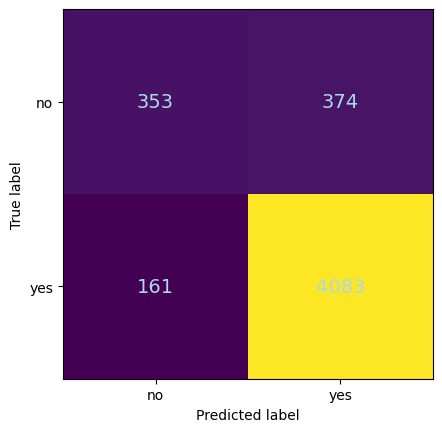

<Figure size 1000x600 with 0 Axes>

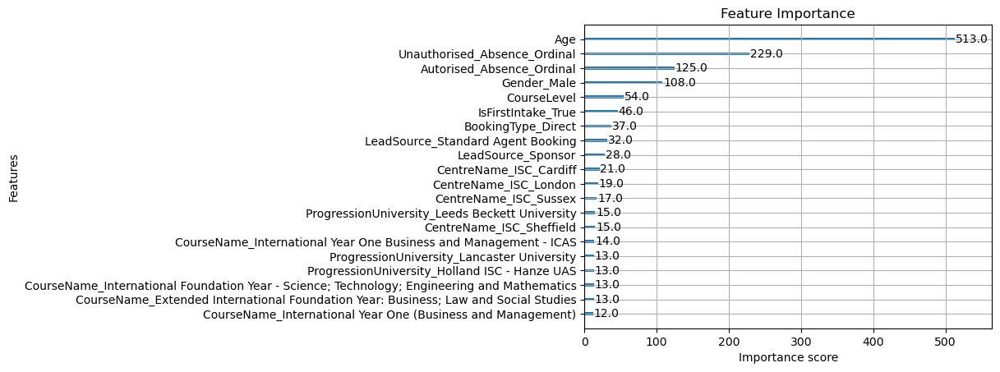

In [98]:
xg_model_no_tunning_s2 = xgb.XGBClassifier(random_state=42)
xg_model_no_tunning_s2.fit(X_train_s2, y_train_s2)

# Model evaluation
predictions_no_tunning_s2 = xg_model_no_tunning_s2.predict(X_val_s2)
print("XGBoost Model Accuracy: ", accuracy_score(y_val_s2, predictions_no_tunning_s2))
print(classification_report(y_val_s2, predictions_no_tunning_s2))


cm_no_tunning_s2 = confusion_matrix(y_val_s2, predictions_no_tunning_s2)
cfmd_no_tunning_s2 = ConfusionMatrixDisplay(confusion_matrix=cm_no_tunning_s2, display_labels=["no","yes"])
# Create plot and remove grid lines
fig, ax = plt.subplots()
cfmd_no_tunning_s2.plot(ax=ax, colorbar=False)
ax.grid(False)  # This removes the white crossing lines
# Make numbers more visible
for text in ax.texts:
    text.set_size(14)  # Larger font size
    text.set_color('lightblue')  # Force black text
plt.show()

# Feature Importance
plt.figure(figsize=(10, 6))
plot_importance(xg_model_no_tunning_s2, max_num_features=20)  # Top 20 features
plt.title('Feature Importance')
plt.show()


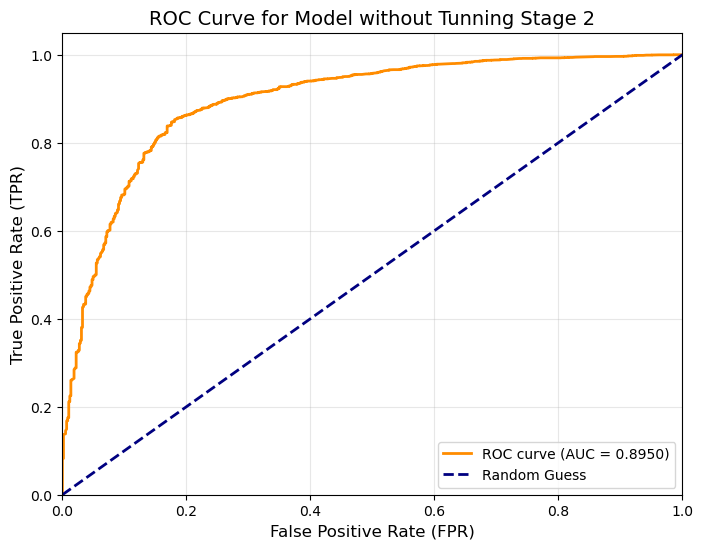

In [99]:
# @tittle Testing the model without tunning
# Calculate ROC curve using test set for better evaluation
y_pred_proba_no_tunning_s2 = xg_model_no_tunning_s2.predict_proba(X_test_s2)[:, 1]  # Probabilities for AUC using test set
fpr, tpr, thresholds = roc_curve(y_test_s2, y_pred_proba_no_tunning_s2) # Use TEST set for final evaluation
roc_auc_no_tunning_s2 = auc(fpr, tpr)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {roc_auc_no_tunning_s2:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve for Model without Tunning Stage 2', fontsize=14)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

### Fine Tunning with GridSearchCV.
#### The model will be trained using the training set and evaluated using the val set. 

In [100]:
# @title: Grid Search for Hyperparameter Tuning

param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],      # Lower for better generalization
    'max_depth': [4, 6, 8],                   # Control tree complexity
    'min_child_weight': [1, 3, 5],            # Prevent overfitting
    'gamma': [0, 0.1, 0.2],                   # Regularization
    'subsample': [0.6, 0.8, 1.0],             # Stochastic sampling
    'colsample_bytree': [0.6, 0.8, 1.0],      # Feature sampling
    'n_estimators': [50, 100, 150]            # Number of trees
}

grid_search = GridSearchCV(
    estimator=xgb.XGBClassifier(
        eval_metric='logloss',
        early_stopping_rounds=10,
        random_state=42
    ),
    param_grid=param_grid,
    scoring='roc_auc',  # Optimize for AUC
    cv=3,               # 3-fold cross-validation
    n_jobs=-1           # Use all CPU cores
)

grid_search.fit(X_train_s2, y_train_s2, eval_set=[(X_val_s2, y_val_s2)], verbose=False)
best_params_s2 = grid_search.best_params_

In [101]:
best_params_df_s2 = pd.DataFrame([best_params_s2])
display(best_params_df_s2)

,colsample_bytree,gamma,learning_rate,max_depth,min_child_weight,n_estimators,subsample
0,0.8,0.2,0.05,8,1,150,0.8


Validation Accuracy: 0.8951921142627238

Classification Report (Best Parameters):
              precision    recall  f1-score   support

           0       0.71      0.48      0.57       727
           1       0.92      0.97      0.94      4244

    accuracy                           0.90      4971
   macro avg       0.81      0.72      0.76      4971
weighted avg       0.89      0.90      0.89      4971



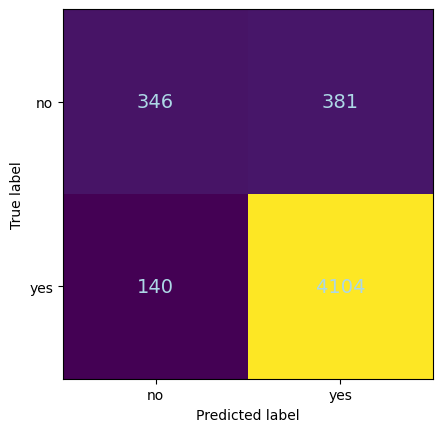

<Figure size 1000x600 with 0 Axes>

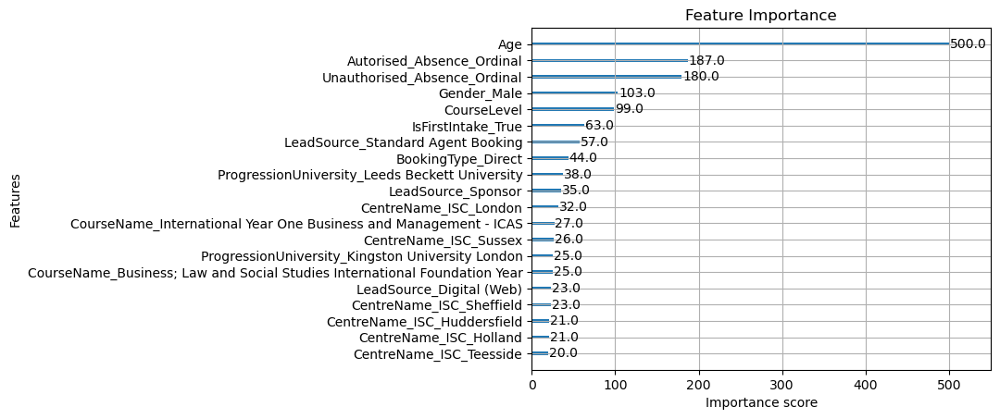

In [102]:
# Initialize model with optimized hyperparameters
xg_model_best_param_s2 = xgb.XGBClassifier(
    random_state=42,
    n_estimators=100,           # Number of boosting rounds
    max_depth=6,                # Tree depth
    learning_rate=0.1,          # Shrinkage factor
    subsample=0.8,              # % of samples per tree
    colsample_bytree=0.6,       # % of features per tree
    eval_metric='logloss',      # Metric for early stopping
    early_stopping_rounds=10,   # Stop if no improvement
    min_child_weight=1,        # Prevent overfitting
    gamma=0.1                  # Regularization
)

# Train with validation monitoring
xg_model_best_param_s2.fit(
    X_train_s2, y_train_s2,
    eval_set=[(X_val_s2, y_val_s2)],  # Early stopping data
    verbose=False                # Show training progress
)

# Predictions
predictions_best_param_s2 = xg_model_best_param_s2.predict(X_val_s2)

# Evaluation
print("Validation Accuracy:", accuracy_score(y_val_s2, predictions_best_param_s2))
print("\nClassification Report (Best Parameters):")
print(classification_report(y_val_s2, predictions_best_param_s2))

# Confusion Matrix
cm_best_param_s2 = confusion_matrix(y_val_s2, predictions_best_param_s2)
cfmd_best_param_s2 = ConfusionMatrixDisplay(confusion_matrix=cm_best_param_s2, display_labels=["no","yes"])
# Create plot and remove grid lines
fig, ax = plt.subplots()
cfmd_best_param_s2.plot(ax=ax, colorbar=False)
ax.grid(False)  # This removes the white crossing lines
# Make numbers more visible
for text in ax.texts:
    text.set_size(14)  # Larger font size
    text.set_color('lightblue')  # Force black text
plt.show()

# Feature Importance
plt.figure(figsize=(10, 6))
plot_importance(xg_model_best_param_s2, max_num_features=20)  # Top 20 features
plt.title('Feature Importance')
plt.show()

#### Testing the model on Testing data set for better reliability of results.

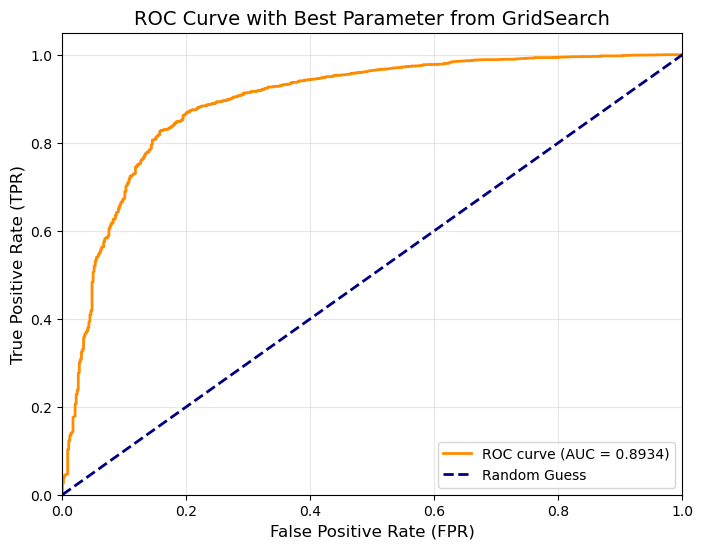

In [103]:
# @tittle Testing the model
# Calculate ROC curve
y_pred_proba_best_param_s2 = xg_model_best_param_s2.predict_proba(X_test_s2)[:, 1]  # Probabilities for AUC using test set
fpr, tpr, thresholds = roc_curve(y_test_s2, y_pred_proba_best_param_s2) # Use TEST set for final evaluation
roc_auc_best_param_s2 = auc(fpr, tpr)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {roc_auc_best_param_s2:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve with Best Parameter from GridSearch', fontsize=14)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()


### Comparison Models

In [104]:
# For Untuned Model
precision_0_no_tuning_s2 = precision_score(y_val_s2, predictions_no_tunning_s2, average='binary', pos_label=0)
recall_0_no_tuning_s2 = recall_score(y_val_s2, predictions_no_tunning_s2, average='binary', pos_label=0)
f1_0_no_tuning_s2 = f1_score(y_val_s2, predictions_no_tunning_s2, average='binary', pos_label=0)

# For class 1 (Completed Course)
precision_1_no_tuning_s2 = precision_score(y_val_s2, predictions_no_tunning_s2, average='binary', pos_label=1) 
recall_1_no_tuning_s2 = recall_score(y_val_s2, predictions_no_tunning_s2, average='binary', pos_label=1)
f1_1_no_tuning_s2 = f1_score(y_val_s2, predictions_no_tunning_s2, average='binary', pos_label=1)

# Overall metrics for untuned model
accuracy_no_tuning_s2 = accuracy_score(y_val_s2, predictions_no_tunning_s2)
macro_precision_no_tuning_s2 = precision_score(y_val_s2, predictions_no_tunning_s2, average='macro')
macro_recall_no_tuning_s2 = recall_score(y_val_s2, predictions_no_tunning_s2, average='macro')
macro_f1_no_tuning_s2 = f1_score(y_val_s2, predictions_no_tunning_s2, average='macro')

roc_auc_no_tunning_s2 # Predictions probabilities for AUC were calculated earlier

# For Tuned Model
precision_0_best_param_s2 = precision_score(y_val_s2, predictions_best_param_s2, average='binary', pos_label=0)
recall_0_best_param_s2 = recall_score(y_val_s2, predictions_best_param_s2, average='binary', pos_label=0)
f1_0_best_param_s2 = f1_score(y_val_s2, predictions_best_param_s2, average='binary', pos_label=0)

# For class 1 (Completed Course)
precision_1_best_param_s2 = precision_score(y_val_s2, predictions_best_param_s2, average='binary', pos_label=1)
recall_1_best_param_s2 = recall_score(y_val_s2, predictions_best_param_s2, average='binary', pos_label=1)
f1_1_best_param_s2 = f1_score(y_val_s2, predictions_best_param_s2, average='binary', pos_label=1)

# Overall metrics for tuned model
accuracy_best_param_s2 = accuracy_score(y_val_s2, predictions_best_param_s2)
macro_precision_best_param_s2 = precision_score(y_val_s2, predictions_best_param_s2, average='macro')
macro_recall_best_param_s2 = recall_score(y_val_s2, predictions_best_param_s2, average='macro')
macro_f1_best_param_s2 = f1_score(y_val_s2, predictions_best_param_s2, average='macro')

roc_auc_best_param_s2 # Predictions probabilities for AUC were calculated earlier

# Update results_df
results_df_s2 = pd.DataFrame({
    'Model': ['Without Tuning', 'Best Parameters'],
    'Accuracy': [accuracy_no_tuning_s2, accuracy_best_param_s2],
    'ROC AUC': [roc_auc_no_tunning_s2, roc_auc_best_param_s2],
    'Precision (Class 0)': [precision_0_no_tuning_s2, precision_0_best_param_s2],
    'Recall (Class 0)': [recall_0_no_tuning_s2, recall_0_best_param_s2],
    'F1 Score (Class 0)': [f1_0_no_tuning_s2, f1_0_best_param_s2],
    'Precision (Class 1)': [precision_1_no_tuning_s2, precision_1_best_param_s2],
    'Recall (Class 1)': [recall_1_no_tuning_s2, recall_1_best_param_s2],
    'F1 Score (Class 1)': [f1_1_no_tuning_s2, f1_1_best_param_s2],
    'Macro Precision': [macro_precision_no_tuning_s2, macro_precision_best_param_s2],
    'Macro Recall': [macro_recall_no_tuning_s2, macro_recall_best_param_s2],
    'Macro F1': [macro_f1_no_tuning_s2, macro_f1_best_param_s2]
})

# Display the results
display(results_df_s2.reset_index(drop=True))

,Model,Accuracy,ROC AUC,Precision (Class 0),Recall (Class 0),F1 Score (Class 0),Precision (Class 1),Recall (Class 1),F1 Score (Class 1),Macro Precision,Macro Recall,Macro F1
0,Without Tuning,0.892376,0.895027,0.686770,0.485557,0.568896,0.916087,0.962064,0.938513,0.801429,0.723811,0.753704
1,Best Parameters,0.895192,0.893402,0.711934,0.475928,0.570486,0.915050,0.967012,0.940314,0.813492,0.721470,0.755400


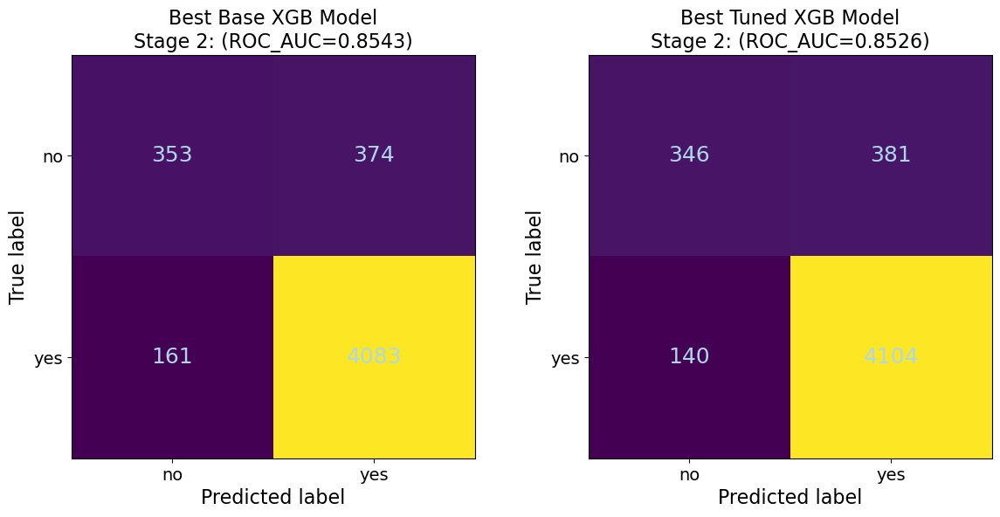

In [229]:
# Compute confusion matrices
cm_comparison_s2 = confusion_matrix(y_val_s2, predictions_no_tunning_s2)
cm_comparison_best_param_s2 = confusion_matrix(y_val_s2, predictions_best_param_s2)

# Create display objects
disp_comparison_s2 = ConfusionMatrixDisplay(confusion_matrix=cm_comparison_s2, display_labels=["no", "yes"])
disp_best_param_s2 = ConfusionMatrixDisplay(confusion_matrix=cm_comparison_best_param_s2, display_labels=["no", "yes"])

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot confusion matrices
disp_comparison_s2.plot(ax=axes[0], colorbar=False)
disp_best_param_s2.plot(ax=axes[1], colorbar=False)

# Set titles with ROC_AUC info
axes[0].set_title(f"Best Base XGB Model\nStage 2: (ROC_AUC={best_base['roc_auc']:.4f})", fontsize=16)
axes[1].set_title(f"Best Tuned XGB Model\nStage 2: (ROC_AUC={best_tuning['roc_auc']:.4f})", fontsize=16)

# Set axis labels with font size
axes[0].set_xlabel('Predicted label', fontsize=16)
axes[0].set_ylabel('True label', fontsize=16)
axes[1].set_xlabel('Predicted label', fontsize=16)
axes[1].set_ylabel('True label', fontsize=16)

# Remove grid lines
axes[0].grid(False)
axes[1].grid(False)

# Customize tick labels and cell fonts
for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=14)
    for text in ax.texts:
        text.set_fontsize(18)
        text.set_color('lightblue')
        
plt.subplots_adjust(wspace=0.2, hspace=0.3)

plt.show()


### Comments

- The hyperparameter tuning did improve the model performance beyond the default XGBoost configuration.
- The untuned model performance is almost undistinguishable from tune model with accuracy (0.8829 vs 0.8840).
- The tuned model has a slightly better ROC-AUC score (0.8840 vs 0.8829).
- Both models struggle with predicting Class 0 (Did Not Complete Course), however, the tuned model has better Precision score for this class (0.706612 and 0.675000). 
- All other metrics are almost indistinguishable between the models for Class 1 and 0. 
- These results are different to those obtained with stage 1 dataset.
- It is clear that the addition of the features related to the Absence of students have a positive impact on the performance of the models.

### Shapley Analysis for Untuned Model

In [106]:
def shap_analysis(model, X, sample_size=1000, random_state=42):
    """Compute SHAP values with robust sampling and checks."""
    if len(X) == 0:
        raise ValueError("Input X is empty")
    
    explainer = shap.TreeExplainer(model)
    sample_size = min(max(sample_size, 10), len(X))  # Clamp sample_size
    
    if isinstance(X, pd.DataFrame):
        X_sample = X.sample(n=sample_size, random_state=random_state)
    else:
        X_sample = X[np.random.choice(len(X), size=sample_size, replace=False)]
    
    shap_values = explainer(X_sample)
    return shap_values, X_sample, explainer.expected_value



# Usage (training set is correct here)
shap_values_base_s2, X_sample_base_s2, expected_value_base_s2 = shap_analysis(xg_model_no_tunning_s2, X_train_s2)

# Find most surprising prediction (normalized)
shap_deviations_base_s2 = np.abs(shap_values_base_s2.values - expected_value_base_s2).sum(axis=1) / (np.abs(expected_value_base_s2) + 1e-9)
surprising_idx_base_s2 = np.argmax(shap_deviations_base_s2)

print(f"Most surprising observation (index {surprising_idx_base_s2}):")
print(f"  Deviation: {shap_deviations_base_s2[surprising_idx_base_s2]:.2%}")
print(f"  Features:\n{X_sample_base_s2.iloc[surprising_idx_base_s2]}")

Most surprising observation (index 842):
  Deviation: 24342.91%
  Features:
CourseLevel                                                             3.0
Age                                                                    27.0
Unauthorised_Absence_Ordinal                                            0.0
Autorised_Absence_Ordinal                                               0.0
CentreName_ISC_Cardiff                                                  0.0
                                                                       ... 
ProgressionUniversity_University of Sheffield International College     0.0
ProgressionUniversity_University of Strathclyde                         0.0
ProgressionUniversity_University of Surrey                              0.0
ProgressionUniversity_University of Sussex                              0.0
ProgressionUniversity_VU Amsterdam                                      0.0
Name: 7120, Length: 241, dtype: float64


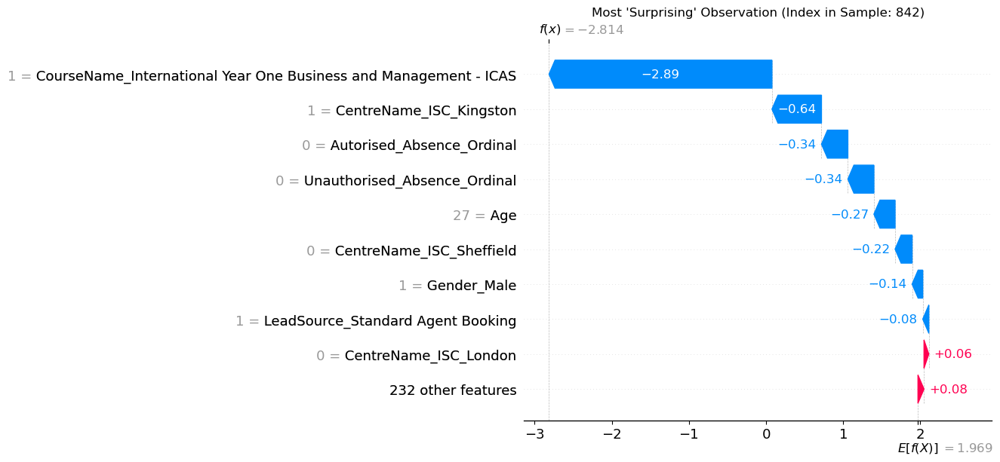

In [107]:
#Identifies the observation where the SHAP values deviate most from the expected value.
shap.plots.waterfall(shap_values_base_s2[surprising_idx_base_s2], show=False)
plt.title(f"Most 'Surprising' Observation (Index in Sample: {surprising_idx_base_s2})")
plt.show()

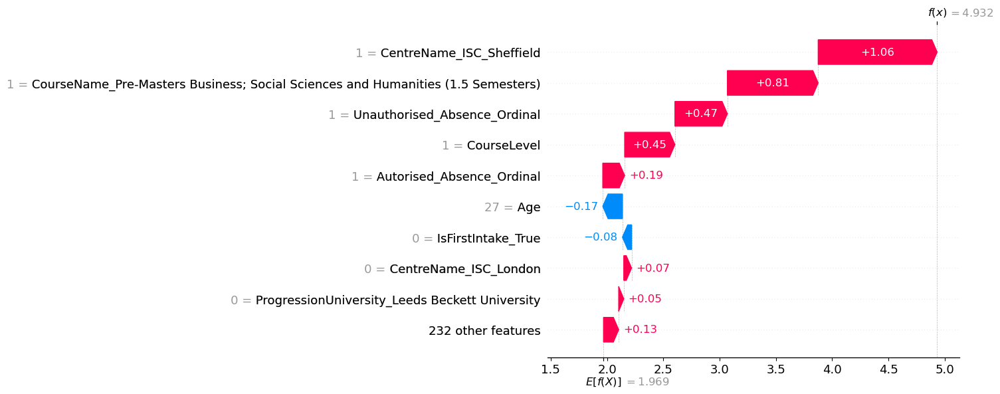

In [108]:
# Identifies the observation with the maximum predicted value from the model.
high_pred_idx_base_s2 = np.argmax(xg_model_no_tunning_s2.predict(X_train_s2))
explainer = shap.TreeExplainer(xg_model_no_tunning_s2)
shap_high_pred_base_s2 = explainer(X_train_s2.iloc[high_pred_idx_base_s2:high_pred_idx_base_s2+1])
shap.plots.waterfall(shap_high_pred_base_s2[0])

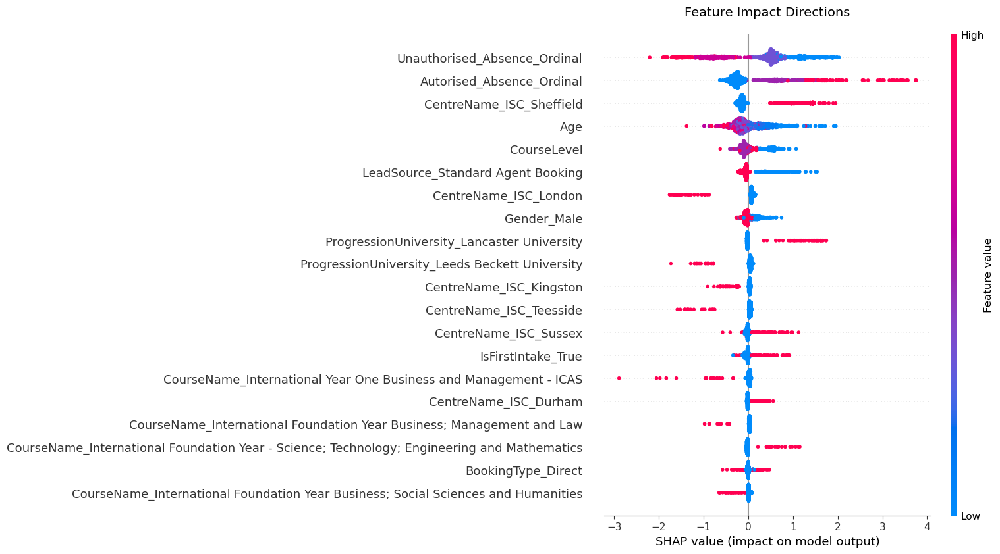

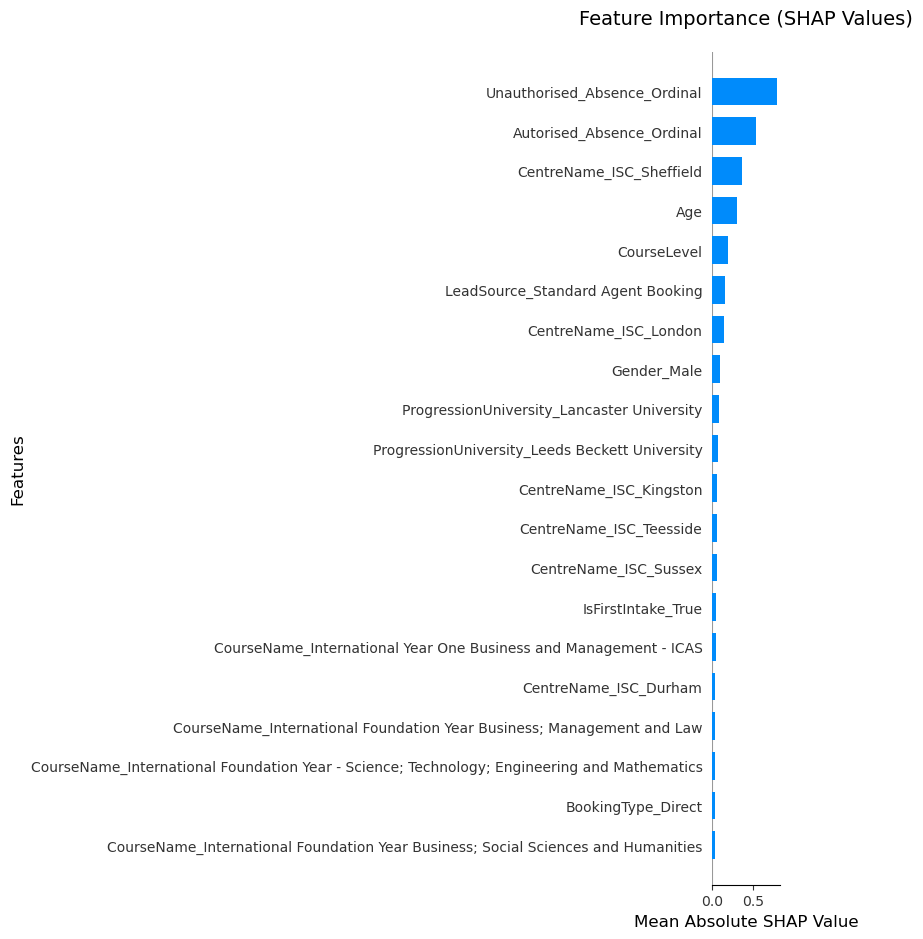

In [109]:
# Get SHAP values (unpack ALL return values)
shap_values_base_s2, X_sample_base_s2, expected_value_base_s2 = shap_analysis(
    xg_model_no_tunning_s2, 
    X_train_s2, 
    sample_size=1000, 
    random_state=42
)

# --------------------------------------------------
# 1. Feature Impact Directions (Beeswarm Plot)
# --------------------------------------------------
plt.close('all')  # Clear previous plots
shap.summary_plot(
    shap_values_base_s2,  # Use full Explanation object
    X_sample_base_s2,     # Sampled features
    show=False
)
plt.title("Feature Impact Directions", fontsize=14, pad=20)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 2. Feature Importance (Bar Plot)
# --------------------------------------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(
    shap_values_base_s2, 
    X_sample_base_s2, 
    plot_type="bar", 
    show=False
)
plt.title("Feature Importance (SHAP Values)", fontsize=14, pad=20)
plt.xlabel("Mean Absolute SHAP Value", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

### Shapley Analysis for Best Parameter Model

In [110]:
# Get SHAP values for the best parameter model
def shap_analysis(model, X, sample_size=1000, random_state=42):
    """Compute SHAP values with robust sampling and checks."""
    if len(X) == 0:
        raise ValueError("Input X is empty")
    
    explainer = shap.TreeExplainer(model)
    sample_size = min(max(sample_size, 10), len(X))  # Clamp sample_size
    
    if isinstance(X, pd.DataFrame):
        X_sample = X.sample(n=sample_size, random_state=random_state)
    else:
        X_sample = X[np.random.choice(len(X), size=sample_size, replace=False)]
    
    shap_values = explainer(X_sample)
    return shap_values, X_sample, explainer.expected_value



# Usage (training set is correct here)
shap_values_best_param_s2, X_sample_best_param_s2, expected_value_best_param_s2 = shap_analysis(xg_model_best_param_s2, X_train_s2)

# Find most surprising prediction (normalized)
shap_deviations_best_param_s2 = np.abs(shap_values_best_param_s2.values - expected_value_best_param_s2).sum(axis=1) / (np.abs(expected_value_best_param_s2) + 1e-9)
surprising_idx_best_param_s2 = np.argmax(shap_deviations_best_param_s2)

print(f"Most surprising observation (index {surprising_idx_best_param_s2}):")
print(f"  Deviation: {shap_deviations_best_param_s2[surprising_idx_best_param_s2]:.2%}")
print(f"  Features:\n{X_sample_best_param_s2.iloc[surprising_idx_best_param_s2]}")

Most surprising observation (index 576):
  Deviation: 24354.91%
  Features:
CourseLevel                                                             2.0
Age                                                                    25.0
Unauthorised_Absence_Ordinal                                            3.0
Autorised_Absence_Ordinal                                               0.0
CentreName_ISC_Cardiff                                                  0.0
                                                                       ... 
ProgressionUniversity_University of Sheffield International College     0.0
ProgressionUniversity_University of Strathclyde                         0.0
ProgressionUniversity_University of Surrey                              0.0
ProgressionUniversity_University of Sussex                              0.0
ProgressionUniversity_VU Amsterdam                                      0.0
Name: 13553, Length: 241, dtype: float64


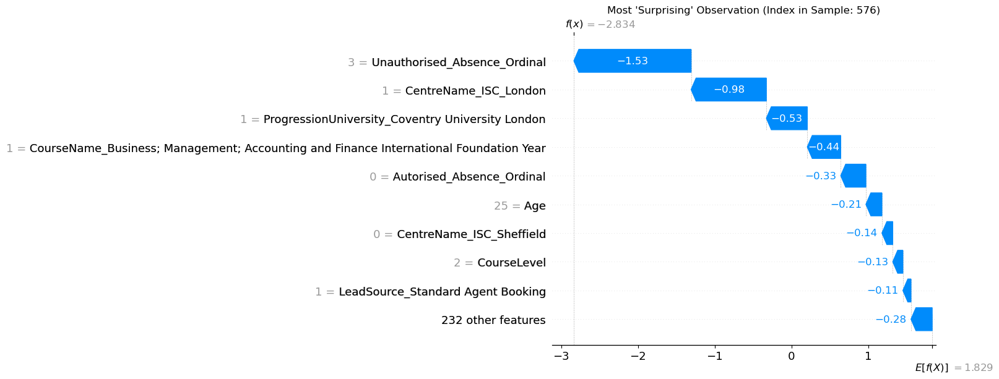

In [111]:
# Identifies the observation where the SHAP values deviate most from the expected value.
shap.plots.waterfall(shap_values_best_param_s2[surprising_idx_best_param_s2], show=False)
plt.title(f"Most 'Surprising' Observation (Index in Sample: {surprising_idx_best_param_s2})")
plt.show()

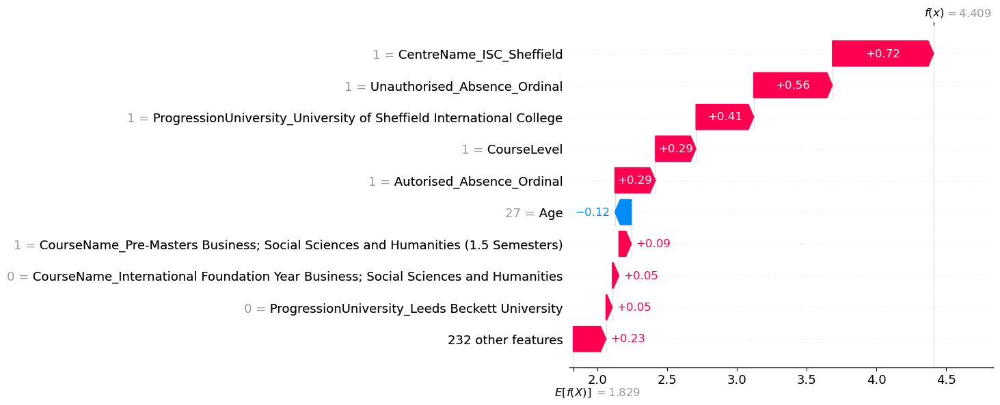

In [112]:
# Identifies the observation with the maximum predicted value from the model.
high_pred_idx_best_param_s2 = np.argmax(xg_model_best_param_s2.predict(X_train_s2))
explainer = shap.TreeExplainer(xg_model_best_param_s2)
shap_high_pred_best_param_s2 = explainer(X_train_s2.iloc[high_pred_idx_best_param_s2:high_pred_idx_best_param_s2+1])
shap.plots.waterfall(shap_high_pred_best_param_s2[0])

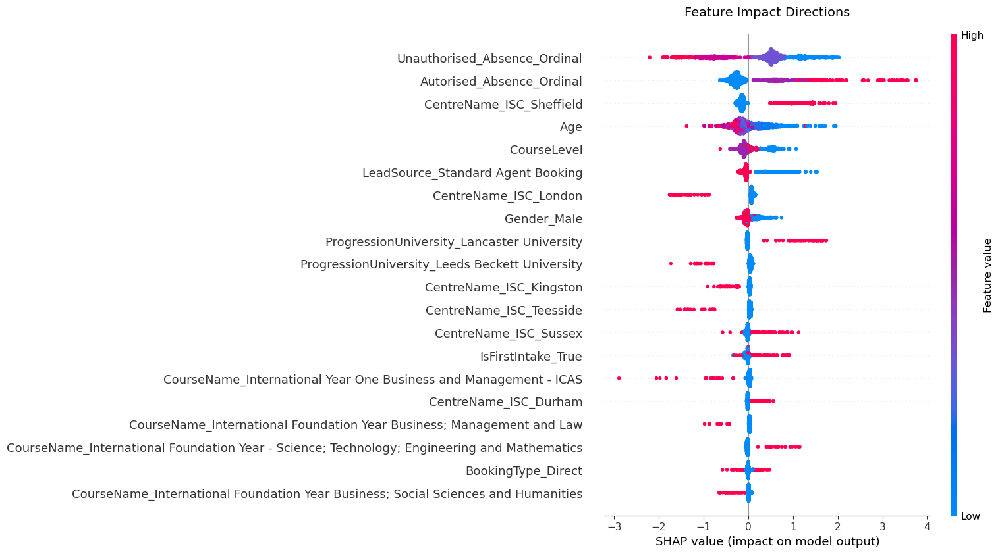

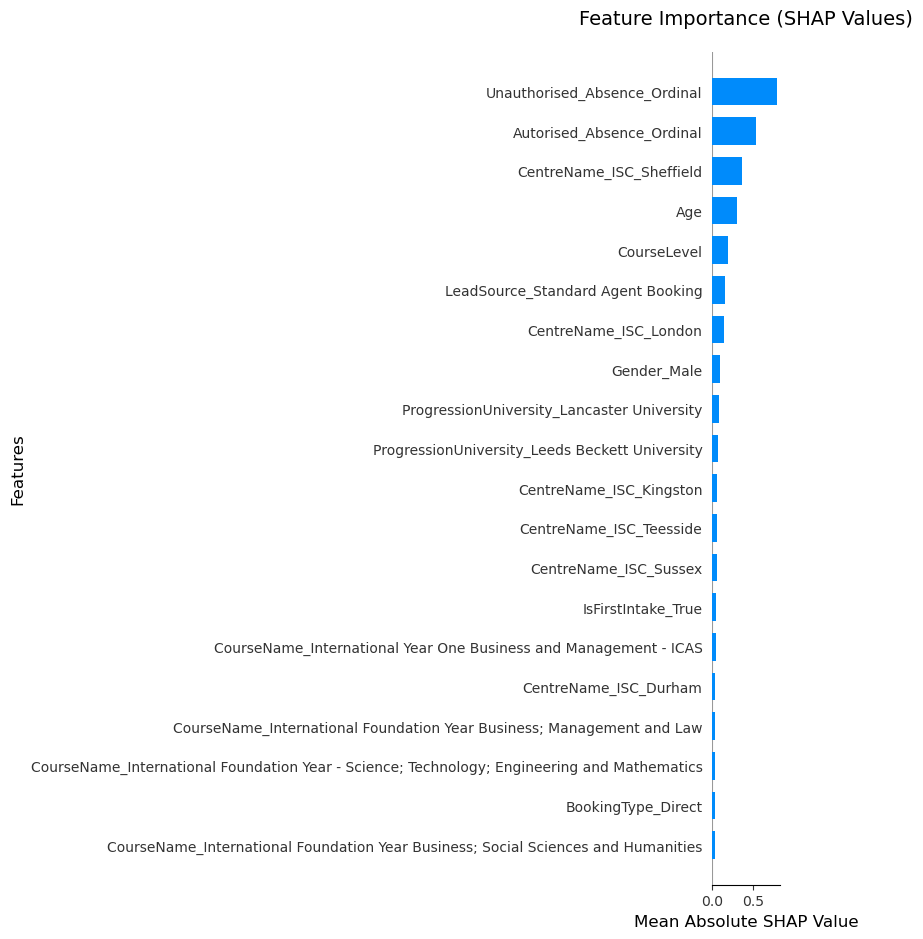

In [113]:
# Get SHAP values (unpack ALL return values)
shap_values_best_param_s2, X_sample_best_param_s2, expected_value_best_param_s2 = shap_analysis(
    xg_model_best_param_s2, 
    X_train_s2, 
    sample_size=1000, 
    random_state=42
)

# --------------------------------------------------
# 1. Feature Impact Directions (Beeswarm Plot)
# --------------------------------------------------
plt.close('all')  # Clear previous plots
shap.summary_plot(
    shap_values_base_s2,  # Use full Explanation object
    X_sample_base_s2,     # Sampled features
    show=False
)
plt.title("Feature Impact Directions", fontsize=14, pad=20)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 2. Feature Importance (Bar Plot)
# --------------------------------------------------
plt.figure(figsize=(10, 6))
shap.summary_plot(
    shap_values_base_s2, 
    X_sample_base_s2, 
    plot_type="bar", 
    show=False
)
plt.title("Feature Importance (SHAP Values)", fontsize=14, pad=20)
plt.xlabel("Mean Absolute SHAP Value", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

# Defining a Neural Network for the dropout prediction: Stage 2

In [114]:
# Bringing in data use for XGBoost
print(f'X_train: {X_train_s2.shape}')
print(f'X_val: {X_val_s2.shape}')
print(f'X_test: {X_test_s2.shape}')
print(f'y_train: {y_train_s2.shape}')
print(f'y_val: {y_val_s2.shape}')
print(f'y_test: {y_test_s2.shape}')


X_train: (15904, 241)
X_val: (4971, 241)
X_test: (3976, 241)
y_train: (15904,)
y_val: (4971,)
y_test: (3976,)


In [115]:
# Scale the data
scaler = StandardScaler()
X_train_scaled_s2 = scaler.fit_transform(X_train_s2)
X_val_scaled_s2 = scaler.transform(X_val_s2)
X_test_scaled_s2 = scaler.transform(X_test_s2)

In [116]:
# Check for NaN/inf values that might have been imputed incorrectly
print("NaN values X_train_s2:", np.isnan(X_train_scaled_s2).sum())
print("Inf values X_train_s2:", np.isinf(X_train_scaled_s2).sum())

print("NaN values X_val_s2:", np.isnan(X_val_scaled_s2).sum())
print("Inf values X_val_s2:", np.isinf(X_val_scaled_s2).sum())

print("NaN values X_test_s2:", np.isnan(X_test_scaled_s2).sum())
print("Inf values X_test_s2:", np.isinf(X_test_scaled_s2).sum())

# Check if all samples are identical
unique_samples_s2 = np.unique(X_train_scaled_s2, axis=0).shape[0]
print(f"Unique samples X_train_s2: {unique_samples_s2} out of {X_train_scaled_s2.shape[0]}")

unique_samples_val_s2 = np.unique(X_val_scaled_s2, axis=0).shape[0]
print(f"Unique samples X_val_s2: {unique_samples_val_s2} out of {X_val_scaled_s2.shape[0]}")

unique_samples_test_s2 = np.unique(X_test_scaled_s2, axis=0).shape[0]
print(f"Unique samples X_test_s2: {unique_samples_test_s2} out of {X_test_scaled_s2.shape[0]}")


NaN values X_train_s2: 0
Inf values X_train_s2: 0
NaN values X_val_s2: 0
Inf values X_val_s2: 0
NaN values X_test_s2: 0
Inf values X_test_s2: 0
Unique samples X_train_s2: 7626 out of 15904
Unique samples X_val_s2: 3311 out of 4971
Unique samples X_test_s2: 2734 out of 3976


### Construct Neural Network with Different Number of Hidden Layers and same Number of Neurons

In [ ]:
# Define Baseline Model
# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed=42):
    """
    Enable 100% reproducibility on operations related to tensor and randomness.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    
    # Configure TensorFlow for determinism
    tf.config.experimental.enable_op_determinism()

# Call this at the very beginning of your script
set_global_determinism(42)

# Define Baseline Model with seed reset
def create_model(input_dim, output_dim, layers=2, units=128, dropout=0.2, lr=0.001, seed=42):
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    model.compile(optimizer=Adam(learning_rate=lr),
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Training setup with deterministic seeds
def train_models_deterministic(architecture_configs, X_train, y_train, X_val, y_val):
    models_base_s2 = []
    histories_base_s2 = []
    
    for i, config in enumerate(architecture_configs):
        print(f"\nTraining Model {i+1}: {config}")
        
        # Set unique but deterministic seed for each model
        model_seed = 42 + i
        set_global_determinism(model_seed)
        
        # Clear session
        tf.keras.backend.clear_session()
        gc.collect()
        
        # Create model with specific seed
        model = create_model(input_dim, output_dim, seed=model_seed, **config)
        
        # Early stopping
        early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                                 restore_best_weights=True)
        
        # Train with deterministic batch shuffling
        history = model.fit(X_train, y_train,
                          validation_data=(X_val, y_val),
                          batch_size=32,
                          epochs=50,
                          callbacks=[early_stop],
                          shuffle=True,  # This will be deterministic due to seed
                          verbose=0)
        
        # Evaluate
        train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
        val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
        
        # Store results
        models_base_s2.append(model)
        histories_base_s2.append({
            "config": config,
            "train_loss": train_loss,
            "train_accuracy": train_accuracy,
            "val_loss": val_loss,
            "val_accuracy": val_acc,
            "history": history,
            "seed": model_seed
        })
        
        print(f"Final validation accuracy: {val_acc:.4f}")
        gc.collect()
    
    return models_base_s2, histories_base_s2

# Usage
set_global_determinism(42)  # Set at the beginning

# Get dimensions
input_dim = X_train_scaled_s2.shape[1]
output_dim = len(np.unique(y_train_s2))

# Architecture configurations
architecture_configs = [
    {"layers": 2, "units": 32},
    {"layers": 3, "units": 32},
    {"layers": 4, "units": 32},
    {"layers": 2, "units": 64},
    {"layers": 3, "units": 64},
    {"layers": 4, "units": 64},
    {"layers": 2, "units": 128},
    {"layers": 3, "units": 128},
    {"layers": 4, "units": 128}
]

# Train models deterministically
models_base_s2, histories_base_s2 = train_models_deterministic(architecture_configs, X_train_scaled_s2, y_train_s2, X_val_scaled_s2, y_val_s2)
print(f'Model: models_base_s2, History:histories_base_s2')


Training Model 1: {'layers': 2, 'units': 32}
Final validation accuracy: 0.8886

Training Model 2: {'layers': 3, 'units': 32}
Final validation accuracy: 0.8867

Training Model 3: {'layers': 4, 'units': 32}
Final validation accuracy: 0.8835

Training Model 4: {'layers': 2, 'units': 64}
Final validation accuracy: 0.8841

Training Model 5: {'layers': 3, 'units': 64}
Final validation accuracy: 0.8849

Training Model 6: {'layers': 4, 'units': 64}
Final validation accuracy: 0.8857

Training Model 7: {'layers': 2, 'units': 128}
Final validation accuracy: 0.8863

Training Model 8: {'layers': 3, 'units': 128}
Final validation accuracy: 0.8849

Training Model 9: {'layers': 4, 'units': 128}
Final validation accuracy: 0.8894
Model: models_base_s2, History:histories_base_s2


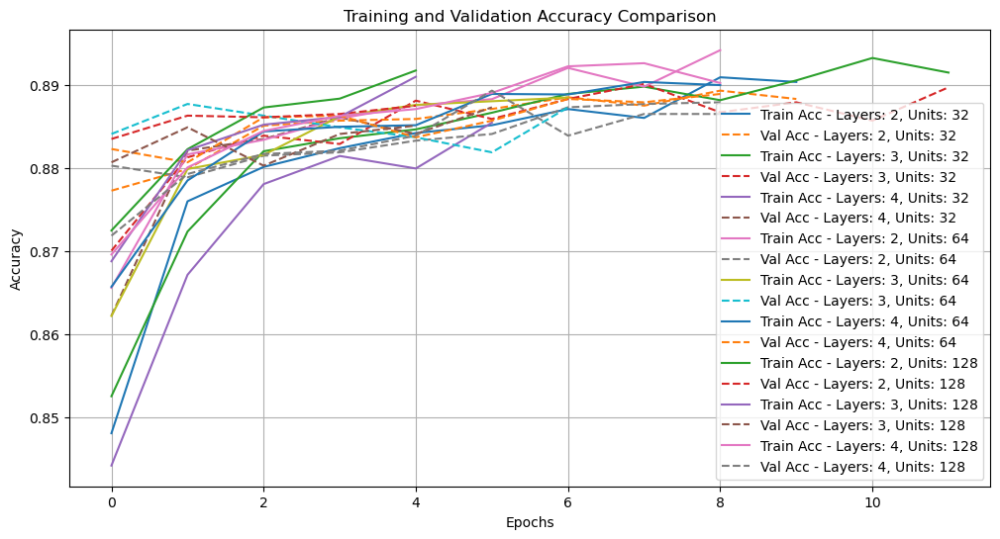

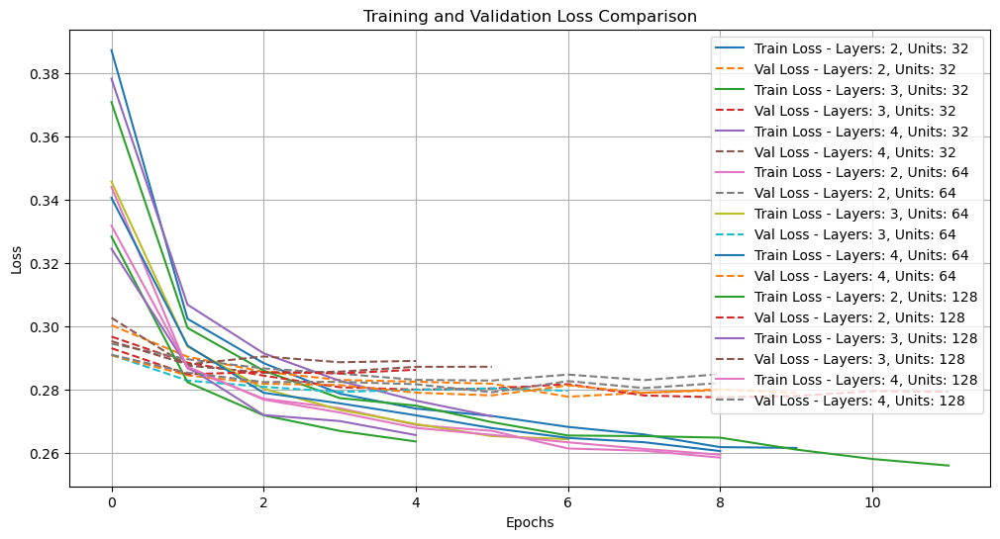


Model Performance Summary:
Model 1 - 2 layers, 32 units:
  Validation Accuracy: 0.8886
  Final Epochs: 10

Model 2 - 3 layers, 32 units:
  Validation Accuracy: 0.8867
  Final Epochs: 12

Model 3 - 4 layers, 32 units:
  Validation Accuracy: 0.8835
  Final Epochs: 6

Model 4 - 2 layers, 64 units:
  Validation Accuracy: 0.8841
  Final Epochs: 9

Model 5 - 3 layers, 64 units:
  Validation Accuracy: 0.8849
  Final Epochs: 7

Model 6 - 4 layers, 64 units:
  Validation Accuracy: 0.8857
  Final Epochs: 9

Model 7 - 2 layers, 128 units:
  Validation Accuracy: 0.8863
  Final Epochs: 5

Model 8 - 3 layers, 128 units:
  Validation Accuracy: 0.8849
  Final Epochs: 5

Model 9 - 4 layers, 128 units:
  Validation Accuracy: 0.8894
  Final Epochs: 9



In [118]:
# Plot train/validation accuracy.

plt.figure(figsize=(12, 6))
for i, result in enumerate(histories_base_s2):
    config = result['config']
    config_str = f"Layers: {config['layers']}, Units: {config['units']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot train/validation loss
plt.figure(figsize=(12, 6))
for i, result in enumerate(histories_base_s2):
    config = result['config']
    config_str = f"Layers: {config['layers']}, Units: {config['units']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

plt.title('Training and Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


# Print numerical summary
print("\nModel Performance Summary:")
print("=" * 60)
for i, result in enumerate(histories_base_s2):
    config = result['config']
    print(f"Model {i+1} - {config['layers']} layers, {config['units']} units:")
    print(f"  Validation Accuracy: {result['val_accuracy']:.4f}")
    print(f"  Final Epochs: {len(result['history'].history['loss'])}")
    print()

In [119]:
# @tittle Model Evaluation

# --- Evaluation Function ---
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def evaluate_trained_models(models, hist_metrics, X_test, y_test, 
                           class_names=None, verbose=True, return_curves=False):
    """
    Comprehensive model evaluation function optimized for imbalanced datasets
    
    Parameters:
    -----------
    models : list
        List of trained Keras models
    hist_metrics : list
        List of training history and config data
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    class_names : list, optional
        Names of classes for better reporting
    verbose : bool
        Print detailed results
    return_curves : bool
        Whether to return ROC and PR curve data
    
    Returns:
    --------
    results : list
        Comprehensive evaluation results for each model
    """
    
    # Set seeds for reproducible evaluation
    np.random.seed(42)
    
    results_base_s2 = []
    n_classes = len(np.unique(y_test))
    is_binary = n_classes == 2
    
    if verbose:
        print("="*80)
        print(f"EVALUATING {len(models)} MODELS ON TEST SET")
        print(f"Dataset: {len(y_test)} samples, {n_classes} classes")
        if is_binary:
            class_dist = np.bincount(y_test)
            print(f"Class distribution: {class_dist[0]}:{class_dist[1]} ({class_dist[1]/len(y_test)*100:.1f}% positive)")
        print("="*80)
    
    for i, (model, history_data) in enumerate(zip(models, hist_metrics)):
        config = history_data['config']
        model_name = f"Model_{i+1}_{config['layers']}L_{config['units']}U"
        
        if verbose:
            print(f"\n{model_name}")
            print("-" * 50)
        
        try:
            # Get predictions - CONSISTENT APPROACH
            y_pred_prob = model.predict(X_test, verbose=0)
            
            # FIXED: Consistent probability extraction
            if y_pred_prob.shape[1] > 1:  # Multi-class output
                y_pred_class = np.argmax(y_pred_prob, axis=1)
                if is_binary:
                    # For binary classification, use probability of positive class (class 1)
                    y_prob_positive = y_pred_prob[:, 1]
                else:
                    y_prob_positive = y_pred_prob  # Keep all probabilities for multi-class
            else:  # Single output (sigmoid activation)
                y_pred_prob = y_pred_prob.flatten()
                y_pred_class = (y_pred_prob > 0.5).astype(int)
                y_prob_positive = y_pred_prob
            
            # Basic metrics
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            
            # Classification metrics
            if is_binary:
                # Binary classification metrics
                precision = precision_score(y_test, y_pred_class, zero_division=0)
                recall = recall_score(y_test, y_pred_class, zero_division=0)
                f1 = f1_score(y_test, y_pred_class, zero_division=0)
                
                # Class-specific metrics
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                # FIXED: Use consistent function for ROC-AUC calculation
                roc_auc = roc_auc_score(y_test, y_prob_positive)
                
                # Alternative calculation using roc_curve + auc (should match)
                fpr, tpr, _ = roc_curve(y_test, y_prob_positive)
                roc_auc_manual = auc(fpr, tpr)  # This should equal roc_auc
                
                pr_auc = average_precision_score(y_test, y_prob_positive)
                
                # Confusion matrix
                cm = confusion_matrix(y_test, y_pred_class)
                tn, fp, fn, tp = cm.ravel()
                
                # Additional metrics for imbalanced data
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
                balanced_accuracy = (sensitivity + specificity) / 2
                
                # Matthews Correlation Coefficient (good for imbalanced data)
                mcc_denom = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
                mcc = ((tp * tn) - (fp * fn)) / mcc_denom if mcc_denom != 0 else 0
                
            else:
                # Multi-class metrics
                precision = precision_score(y_test, y_pred_class, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred_class, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred_class, average='weighted', zero_division=0)
                
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                roc_auc = roc_auc_score(y_test, y_prob_positive, multi_class='ovr', average='weighted')
                pr_auc = average_precision_score(y_test, y_prob_positive, average='weighted')
                
                cm = confusion_matrix(y_test, y_pred_class)
                balanced_accuracy = recall  # For multi-class, weighted recall approximates balanced accuracy
                mcc = np.nan  # MCC is complex for multi-class
                specificity = np.nan
                sensitivity = recall
                roc_auc_manual = roc_auc  # For consistency
            
            # Store comprehensive results
            result = {
                # Model info
                'model_index': i,
                'model_name': model_name,
                'config': config,
                'layers': config['layers'],
                'units': config['units'],
                
                # Basic metrics
                'accuracy': test_accuracy,
                'loss': test_loss,
                'balanced_accuracy': balanced_accuracy,
                
                # Main classification metrics
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'roc_auc': roc_auc,
                'roc_auc_manual': roc_auc_manual,  # For verification
                'pr_auc': pr_auc,  # Better than ROC-AUC for imbalanced data
                
                # Per-class metrics
                'precision_per_class': precision_per_class,
                'recall_per_class': recall_per_class,
                'f1_per_class': f1_per_class,
                
                # Imbalanced data specific metrics
                'specificity': specificity,
                'sensitivity': sensitivity,
                'mcc': mcc,
                
                # Predictions and probabilities - STORED CONSISTENTLY
                'y_pred_prob': y_prob_positive,  # Always the positive class prob for binary
                'y_pred_prob_full': y_pred_prob,  # Full probability matrix
                'y_pred_class': y_pred_class,
                'confusion_matrix': cm,
                
                # Training history metrics
                'val_accuracy': history_data.get('val_accuracy', np.nan),
                'val_loss': history_data.get('val_loss', np.nan),
                'train_accuracy': history_data.get('train_accuracy', np.nan),
                'train_loss': history_data.get('train_loss', np.nan),
            }
            
            # Add curve data if requested
            if return_curves and is_binary:
                fpr, tpr, roc_thresholds = roc_curve(y_test, y_prob_positive)
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_prob_positive)
                
                result.update({
                    'roc_curve': {'fpr': fpr, 'tpr': tpr, 'thresholds': roc_thresholds},
                    'pr_curve': {'precision': precision_curve, 'recall': recall_curve, 'thresholds': pr_thresholds}
                })
            
            results_base_s2.append(result)
            
            # Verbose output
            if verbose:
                print(f"Core Metrics:")
                print(f"Accuracy: {test_accuracy:.4f} | Balanced Acc: {balanced_accuracy:.4f}")
                print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
                print(f"AUC Scores:")
                print(f" ROC-AUC: {roc_auc:.4f} | ROC-AUC (manual): {roc_auc_manual:.4f} | PR-AUC: {pr_auc:.4f}")
                
                if is_binary:
                    print(f"Imbalanced Metrics:")
                    print(f"Sensitivity: {sensitivity:.4f} | Specificity: {specificity:.4f}")
                    print(f"MCC: {mcc:.4f}")
                    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
                
                print(f"Training Performance:")
                print(f"   Train Loss: {history_data.get('train_loss', 'N/A'):.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'}")
                print(f"   Val Loss: {history_data.get('val_loss', 'N/A'):.4f if isinstance(history_data.get('val_loss'), (int, float)) else 'N/A'}")
                
        except Exception as e:
            print(f"Error evaluating {model_name}: {str(e)}")
            continue
    
    if verbose:
        print("\n" + "="*80)
        print("EVALUATION SUMMARY")
        print("="*80)
        
        # Create summary DataFrame
        summary_data_base_s2 = []
        for r in results_base_s2:
            summary_data_base_s2.append({
                'Model': r['model_name'],
                'ROC_AUC': r['roc_auc'],
                'ROC_AUC_Manual': r['roc_auc_manual'],
                'PR_AUC': r['pr_auc'],
                'F1': r['f1'],
                'Bal_Acc': r['balanced_accuracy'],
                'MCC': r.get('mcc', np.nan)
            })
        
        summary_df_base_s2 = pd.DataFrame(summary_data_base_s2)
        
        positive_ratio = np.mean(y_test)
        if positive_ratio < 0.4:  # Positives are minority
            sort_col = 'PR_AUC'   # Focus on positive class performance
        elif positive_ratio > 0.6:  # Positives are majority  
            sort_col = 'ROC_AUC' # Focus on negative class performance
        else:
            sort_col = 'ROC_AUC'
        
        # Sort by ROC-AUC (or PR-AUC for heavily imbalanced data)
        summary_df_base_s2 = summary_df_base_s2.sort_values(sort_col, ascending=False)
        
        print(summary_df_base_s2.round(4).to_string(index=False))
        print(f"\nBest model by {sort_col}: {summary_df_base_s2.iloc[0]['Model']}")
    
    return results_base_s2

# Basic usage
test_results_s2_base = evaluate_trained_models(models_base_s2, histories_base_s2, X_test_scaled_s2, y_test_s2)



EVALUATING 9 MODELS ON TEST SET
Dataset: 3976 samples, 2 classes
Class distribution: 586:3390 (85.3% positive)

Model_1_2L_32U
--------------------------------------------------
Core Metrics:
Accuracy: 0.8888 | Balanced Acc: 0.7061
Precision: 0.9099 | Recall: 0.9652 | F1: 0.9367
AUC Scores:
 ROC-AUC: 0.8866 | ROC-AUC (manual): 0.8866 | PR-AUC: 0.9722
Imbalanced Metrics:
Sensitivity: 0.9652 | Specificity: 0.4471
MCC: 0.4971
Confusion Matrix: TN=262, FP=324, FN=118, TP=3272
Training Performance:
Error evaluating Model_1_2L_32U: Invalid format specifier '.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'' for object of type 'float'

Model_2_3L_32U
--------------------------------------------------
Core Metrics:
Accuracy: 0.8926 | Balanced Acc: 0.7380
Precision: 0.9200 | Recall: 0.9572 | F1: 0.9383
AUC Scores:
 ROC-AUC: 0.8847 | ROC-AUC (manual): 0.8847 | PR-AUC: 0.9714
Imbalanced Metrics:
Sensitivity: 0.9572 | Specificity: 0.5188
MCC: 0.5331
Confusion Matrix: TN=30

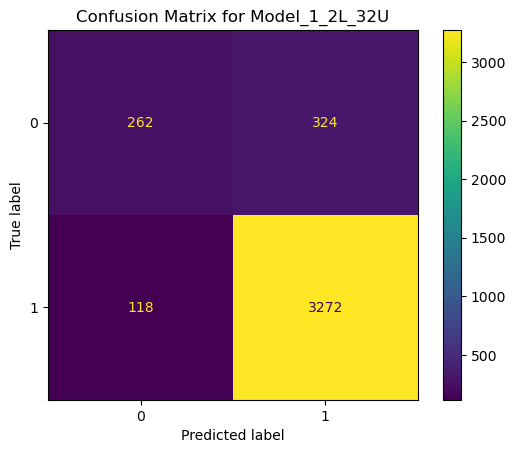

In [120]:
# Assuming test_results_s1_base is a list of dictionaries containing model results
for result in test_results_s2_base:
    # Check if this is the specific model we want
    if result.get('model_name') == 'Model_1_2L_32U' and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot()
        plt.title(f"Confusion Matrix for {result['model_name']}")
        plt.show()

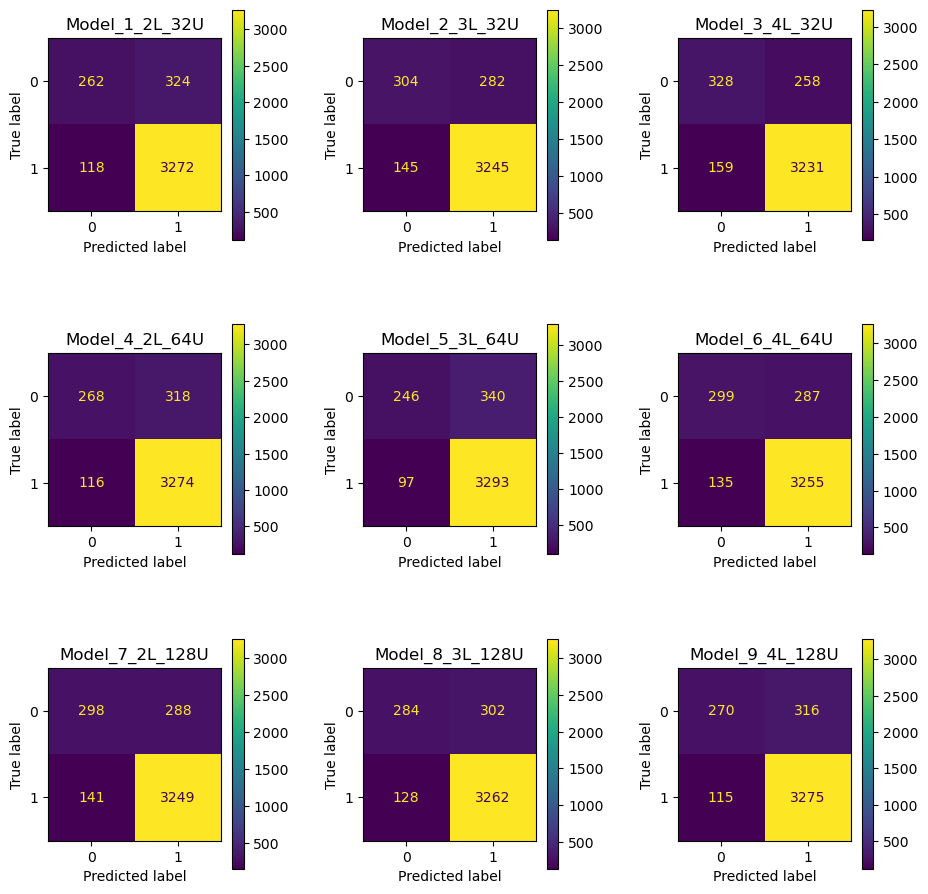

In [121]:
# Display all the Baseline Models Tested

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.tight_layout(pad=4.0)

# Flatten the axes array for easier iteration
axes = axes.ravel()

# Counter for the current subplot
plot_idx = 0

for result in test_results_s2_base:
    # Stop if we've filled all 9 subplots
    if plot_idx >= 9:
        break
        
    # Check if this is the specific model we want
    if result.get('model_name') and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot(ax=axes[plot_idx])
        axes[plot_idx].set_title(f"{result['model_name']}")
        plot_idx += 1

# Hide any remaining empty subplots
for i in range(plot_idx, 9):
    axes[i].axis('off')

plt.show()

In [122]:
# Sorting models based on best metric.
positive_ratio = np.mean(y_test)
if positive_ratio < 0.5:  # Positives are minority
    sort_col = 'pr_auc'   # Focus on positive class performance
    print(f"Positive class is minority ({positive_ratio:.2%}), sorting by PR-AUC")
else:  # Positives are majority
    sort_col = 'roc_auc'  # Focus on overall performance
    print(f"Positive class is majority ({positive_ratio:.2%}), sorting by ROC-AUC")

sorted_auc_base_s2 = sorted(test_results_s2_base, key=lambda x: x.get(sort_col, 0), reverse=True)


Positive class is majority (84.56%), sorting by ROC-AUC


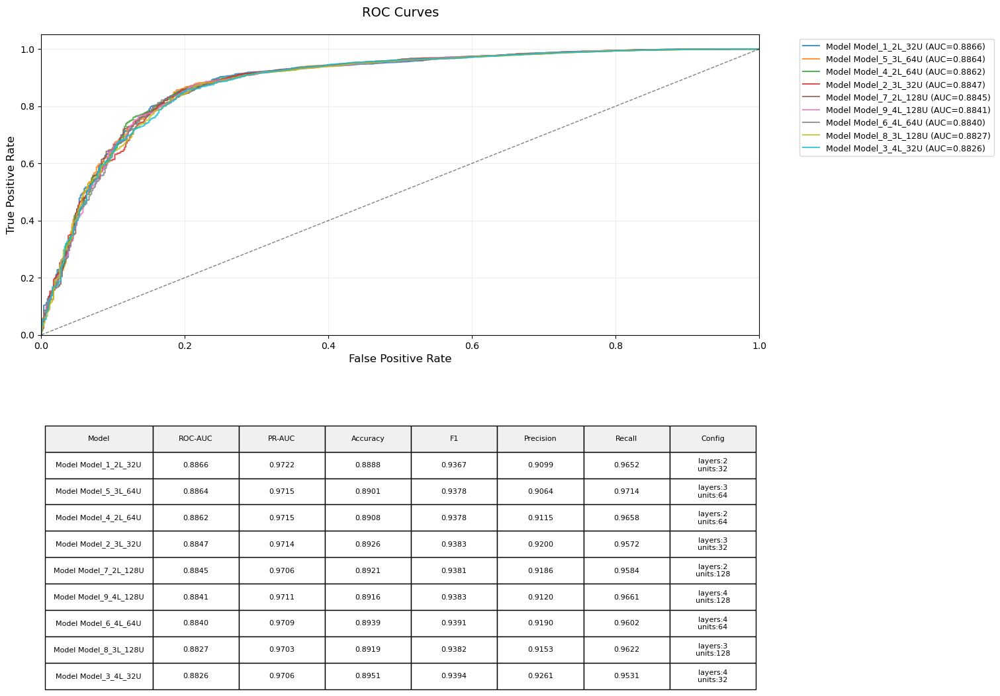

In [123]:
# @tittle ROC Curve for Learning Rate and Activation Function

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def plot_roc_curves(test_results, X_test=None, y_test=None):
    """
    Enhanced ROC curve visualization with model names in legend and table,
    including both ROC-AUC and PR-AUC metrics.
    FIXED: Now uses the same probability extraction method as evaluation function
    """
    plt.figure(figsize=(14, 12))  # Increased figure size for two plots
    
    # Create color palette
    colors = plt.cm.tab10(np.linspace(0, 1, len(test_results)))
    
    # Create subplots with better layout
    ax1 = plt.subplot2grid((10, 2), (0, 0), colspan=2, rowspan=5)  # ROC plot area
    ax2 = plt.subplot2grid((10, 2), (7, 0), colspan=2, rowspan=3)  # Table area
    ax2.axis('off')
    
    # Prepare table data
    table_data = []
    col_labels = ['Model', 'ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall', 'Config']
    
    for i, res in enumerate(test_results):
        try:
            # Get model index and config
            model_idx = res.get('model_name', i)
            config = res['config']
            
            # FIXED: Use stored probabilities from evaluation function
            # This ensures consistency between evaluation and plotting
            if 'y_pred_prob' in res and res['y_pred_prob'] is not None:
                y_score = res['y_pred_prob']  # This is already the positive class probability
            else:
                # Fallback: re-predict if not stored (not recommended)
                print(f"Warning: Re-predicting for model {model_idx} - may cause inconsistency")
                if 'model' in res:
                    y_pred_prob = res['model'].predict(X_test, verbose=0)
                    if y_pred_prob.shape[1] > 1:
                        y_score = y_pred_prob[:, 1]
                    else:
                        y_score = y_pred_prob.flatten()
                else:
                    raise ValueError("No prediction data or model found in results")
            
            # Handle binary vs multi-class
            n_classes = len(np.unique(y_test))
            if n_classes == 2:  # Binary classification
                # FIXED: Use the SAME calculation method as evaluation function
                # Use roc_auc_score for consistency
                roc_auc = roc_auc_score(y_test, y_score)
                
                # Also calculate using roc_curve + auc (should be identical)
                fpr, tpr, _ = roc_curve(y_test, y_score)
                roc_auc_manual = auc(fpr, tpr)
                
                # Verify they match (within floating point precision)
                if abs(roc_auc - roc_auc_manual) > 1e-10:
                    print(f"Warning: ROC-AUC calculation mismatch for model {model_idx}")
                    print(f"  roc_auc_score: {roc_auc:.10f}")
                    print(f"  manual calc:   {roc_auc_manual:.10f}")
                
                # Use the same method as evaluation function
                pr_auc = average_precision_score(y_test, y_score)
                
                # Plot ROC curve
                ax1.plot(fpr, tpr, color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (AUC={roc_auc:.4f})")
                
            else:  # Multi-class - kept same logic but using stored probabilities
                # Use stored full probability matrix
                y_prob = res.get('y_pred_prob_full', res.get('y_pred_prob'))
                if y_prob is None:
                    raise ValueError("No multi-class probability data found")
                
                # One-vs-Rest approach
                fpr, tpr, roc_auc_dict = {}, {}, {}
                
                for class_idx in range(n_classes):
                    fpr[class_idx], tpr[class_idx], _ = roc_curve((y_test == class_idx).astype(int), 
                                                               y_prob[:, class_idx])
                    roc_auc_dict[class_idx] = auc(fpr[class_idx], tpr[class_idx])
                
                # Micro-average metrics
                fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
                roc_auc = auc(fpr["micro"], tpr["micro"])
                
                precision, recall, _ = precision_recall_curve(y_test.ravel(), y_prob.ravel())
                pr_auc = auc(recall, precision)
                
                # Plot micro-average curves
                ax1.plot(fpr["micro"], tpr["micro"], color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (Micro ROC AUC={roc_auc:.4f})")
            
            # Format config for display
            config_clean = {k: v for k, v in config.items() if k != 'model'}
            config_str = "\n".join([f"{k}:{v:.4f}" if isinstance(v, (float, np.floating)) 
                                  else f"{k}:{v}" 
                                  for k, v in config_clean.items()])
            
            # FIXED: Use the SAME values from evaluation results
            table_data.append([
                f"Model {model_idx}",
                f"{res.get('roc_auc', roc_auc):.4f}",  # Use stored value if available
                f"{res.get('pr_auc', pr_auc):.4f}",    # Use stored value if available
                f"{res.get('accuracy', 0):.4f}",
                f"{res.get('f1', 0):.4f}",
                f"{res.get('precision', 0):.4f}",
                f"{res.get('recall', 0):.4f}",
                config_str
            ])
            
        except Exception as e:
            print(f"Error processing model {i}: {str(e)}")
            continue
    
    # Format ROC plot
    ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12)
    ax1.set_ylabel('True Positive Rate', fontsize=12)
    ax1.set_title('ROC Curves', fontsize=14, pad=20)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    ax1.grid(alpha=0.2)
    
    # Create table with better formatting
    if table_data:
        table = ax2.table(
            cellText=table_data,
            colLabels=col_labels,
            loc='center',
            cellLoc='center',
            colColours=['#f0f0f0']*len(col_labels))
        
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        
        table.scale(1, 1.5)  # Increased height scaling for two-line cells
        
        # Set specific column widths and allow text wrapping
        for i in range(len(col_labels)):
            for j in range(len(table_data) + 1):  # +1 for header row
                cell = table[(j, i)]
                if i == 0:  # Config column
                    cell.set_width(0.15)  # Wider for config column
                    cell.set_height(0.15)  # Taller for two-line text
                else:
                    cell.set_width(0.12)
                    cell.set_height(0.15)
    
   
    plt.show()

# Usage
plot_roc_curves(sorted_auc_base_s2, X_test=X_test_scaled_s2, y_test=y_test_s2)


### Model 6: 2 layers and 32 units shows highest ROC-AUC score and the best combination of metrics compared to all other models. 

In [ ]:

# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed):
    """Set seeds for reproducible results"""
    tf.random.set_seed(seed)
    np.random.seed(seed)

def create_model_tuning(input_dim, output_dim, layers=2, units=32, dropout=0.2, 
                       lr=0.001, optimizer='adam', seed=42):
    """Create a deterministic neural network model"""
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    # Choose optimizer
    if optimizer.lower() == 'adam':
        opt = Adam(learning_rate=lr)
    elif optimizer.lower() == 'rmsprop':
        opt = RMSprop(learning_rate=lr)
    else:
        opt = Adam(learning_rate=lr)  # default
    
    model.compile(optimizer=opt,
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Get dimensions (assuming X_train, y_train are defined)
input_dim = X_train_scaled_s2.shape[1]
output_dim = len(np.unique(y_train_s2))

# Hyperparameter grid
hyperparameter_config = {
    'dropout': [0.2, 0.3], 
    'lr': [0.01, 0.001],
    'optimizer': ['adam', 'rmsprop'],
    'batch_size': [16, 32, 64]
}

models_tuning_s2 = []
histories_tuning_s2 = []

# Generate all combinations of hyperparameters
keys, values = zip(*hyperparameter_config.items())
configs = [dict(zip(keys, v)) for v in product(*values)]

# Initialize progress bar
progress_bar = tqdm(configs, desc="Hyperparameter Tuning", unit="model")

for i, config in enumerate(progress_bar):
    # Update progress bar description with current config
    short_desc = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    progress_bar.set_postfix(config=short_desc)
    
    # Set unique but deterministic seed for each model
    model_seed = 42 + i
    set_global_determinism(model_seed)
    
    # Clear session and memory
    tf.keras.backend.clear_session()
    gc.collect()
    
    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                              restore_best_weights=True, verbose=0)
    
    # Create model with current config (excluding batch_size which is for training)
    model_config = {k: v for k, v in config.items() if k != 'batch_size'}
    model_tuning_s2 = create_model_tuning(input_dim, output_dim, seed=model_seed, **model_config)
    
    # Train model (NON-VERBOSE)
    history_tuning_s2 = model_tuning_s2.fit(
        X_train_scaled_s2, y_train_s2,
        validation_data=(X_val_scaled_s2, y_val_s2),
        batch_size=config['batch_size'],
        epochs=50,
        callbacks=[early_stop],
        shuffle=True,  # Deterministic due to seed
        verbose=0  # Silent training
    )
    
    # Evaluate model (NON-VERBOSE)
    val_loss_tuning_s2, val_acc_tuning_s2 = model_tuning_s2.evaluate(X_val_scaled_s2, y_val_s2, verbose=0)
    
    
    # Store results
    models_tuning_s2.append(model_tuning_s2)
    histories_tuning_s2.append({
        "config": config,
        "model": model_tuning_s2,
        "val_loss": val_loss_tuning_s2,
        "val_accuracy": val_acc_tuning_s2,
        "history": history_tuning_s2,
        "seed": model_seed
    })
    
    # Clean up
    gc.collect()

# Close progress bar
progress_bar.close()

print(f"Hyperparameter tuning completed. Trained {len(models_tuning_s2)} models.")
print('Models: models_tuning_s2, Histories: histories_tuning_s2')



Hyperparameter Tuning: 100%|██████████| 24/24 [02:04<00:00,  5.17s/model, config=do:0.3 lr:0.001 opt:rmsprop bs:64]

Hyperparameter tuning completed. Trained 24 models.
Models: models_tuning_s2, Histories: histories_tuning_s2


In [125]:
# Because there are too many models, sort and select top 15 Accuracy scores.
sorted_acc_tuning_s2 = sorted(histories_tuning_s2, key=lambda x: x['val_accuracy'], reverse=True)
top_acc_tuning_s2 = sorted_acc_tuning_s2[:15]

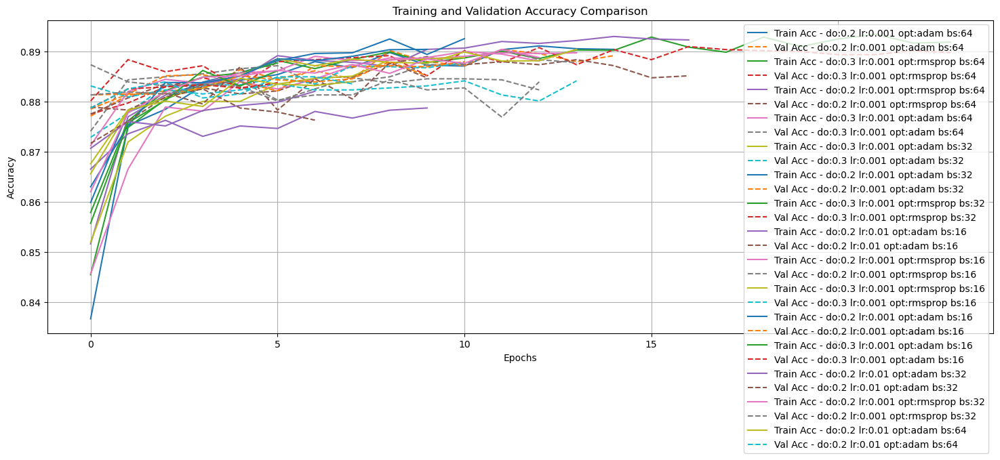

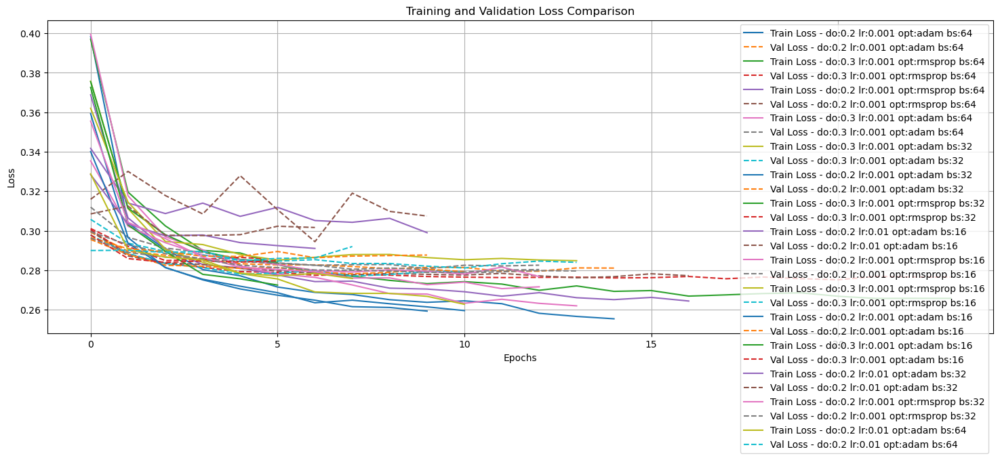

In [126]:
# Plot train/validation accuracy for best models
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s2):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot train/validation loss
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s2):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

plt.title('Training and Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [127]:
# @tittle Model Evaluation

# --- Evaluation Function ---
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def evaluate_trained_models(models, hist_metrics, X_test, y_test, 
                           class_names=None, verbose=True, return_curves=False):
    """
    Comprehensive model evaluation function optimized for imbalanced datasets
    
    Parameters:
    -----------
    models : list
        List of trained Keras models
    hist_metrics : list
        List of training history and config data
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    class_names : list, optional
        Names of classes for better reporting
    verbose : bool
        Print detailed results
    return_curves : bool
        Whether to return ROC and PR curve data
    
    Returns:
    --------
    results : list
        Comprehensive evaluation results for each model
    """
    
    # Set seeds for reproducible evaluation
    np.random.seed(42)
    
    results_tuning_s2 = []
    n_classes = len(np.unique(y_test))
    is_binary = n_classes == 2
    
    if verbose:
        print("="*80)
        print(f"EVALUATING {len(models)} MODELS ON TEST SET")
        print(f"Dataset: {len(y_test)} samples, {n_classes} classes")
        if is_binary:
            class_dist = np.bincount(y_test)
            print(f"Class distribution: {class_dist[0]}:{class_dist[1]} ({class_dist[1]/len(y_test)*100:.1f}% positive)")
        print("="*80)
    
    for i, (model, history_data) in enumerate(zip(models, hist_metrics)):
        config = history_data['config']
        model_name = f"Model_{i+1}_{config['optimizer']}O_{config['batch_size']}BS_{config['lr']}LR_{config['dropout']}D"
        
        if verbose:
            print(f"\n{model_name}")
            print("-" * 50)
        
        try:
            # Get predictions
            y_pred_prob = model.predict(X_test, verbose=0)
            
            # Handle probability extraction
            if y_pred_prob.shape[1] > 1:  # Multi-class output
                y_pred_class = np.argmax(y_pred_prob, axis=1)
                if is_binary:
                    y_prob_positive = y_pred_prob[:, 1]  # Probability of positive class
                else:
                    y_prob_positive = y_pred_prob  # Keep all probabilities for multi-class
            else:  # Single output (shouldn't happen with softmax, but just in case)
                y_pred_prob = y_pred_prob.flatten()
                y_pred_class = (y_pred_prob > 0.5).astype(int)
                y_prob_positive = y_pred_prob
            
            # Basic metrics
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            
            # Classification metrics
            if is_binary:
                # Binary classification metrics
                precision = precision_score(y_test, y_pred_class, zero_division=0)
                recall = recall_score(y_test, y_pred_class, zero_division=0)
                f1 = f1_score(y_test, y_pred_class, zero_division=0)
                
                # Class-specific metrics
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                # ROC-AUC and PR-AUC (better for imbalanced data)
                roc_auc = roc_auc_score(y_test, y_prob_positive)
                pr_auc = average_precision_score(y_test, y_prob_positive)
                
                # Confusion matrix
                cm = confusion_matrix(y_test, y_pred_class)
                tn, fp, fn, tp = cm.ravel()
                
                # Additional metrics for imbalanced data
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
                balanced_accuracy = (sensitivity + specificity) / 2
                
                # Matthews Correlation Coefficient (good for imbalanced data)
                mcc_denom = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
                mcc = ((tp * tn) - (fp * fn)) / mcc_denom if mcc_denom != 0 else 0
                
            else:
                # Multi-class metrics
                precision = precision_score(y_test, y_pred_class, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred_class, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred_class, average='weighted', zero_division=0)
                
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                roc_auc = roc_auc_score(y_test, y_prob_positive, multi_class='ovr', average='weighted')
                pr_auc = average_precision_score(y_test, y_prob_positive, average='weighted')
                
                cm = confusion_matrix(y_test, y_pred_class)
                balanced_accuracy = recall  # For multi-class, weighted recall approximates balanced accuracy
                mcc = np.nan  # MCC is complex for multi-class
                specificity = np.nan
                sensitivity = recall
            
            # Store comprehensive results
            result_tuning = {
                # Model info
                'model_index': i,
                'model_name': model_name,
                'config': config,
                
                
                # Basic metrics
                'accuracy': test_accuracy,
                'loss': test_loss,
                'balanced_accuracy': balanced_accuracy,
                
                # Main classification metrics
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'roc_auc': roc_auc,
                'pr_auc': pr_auc,  # Better than ROC-AUC for imbalanced data
                
                # Per-class metrics
                'precision_per_class': precision_per_class,
                'recall_per_class': recall_per_class,
                'f1_per_class': f1_per_class,
                
                # Imbalanced data specific metrics
                'specificity': specificity,
                'sensitivity': sensitivity,
                'mcc': mcc,
                
                # Predictions and probabilities
                'y_pred_prob': y_prob_positive,
                'y_pred_class': y_pred_class,
                'confusion_matrix': cm,
                
                # Training history metrics
                'val_accuracy': history_data.get('val_accuracy', np.nan),
                'val_loss': history_data.get('val_loss', np.nan),
                'train_accuracy': history_data.get('train_accuracy', np.nan),
                'train_loss': history_data.get('train_loss', np.nan),
            }
            
            
            # Add curve data if requested
            if return_curves and is_binary:
                fpr, tpr, roc_thresholds = roc_curve(y_test, y_prob_positive)
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_prob_positive)
                
                result_tuning.update({
                    'roc_curve': {'fpr': fpr, 'tpr': tpr, 'thresholds': roc_thresholds},
                    'pr_curve': {'precision': precision_curve, 'recall': recall_curve, 'thresholds': pr_thresholds}
                })
            
            results_tuning_s2.append(result_tuning)
            
            # Verbose output
            if verbose:
                print(f"Core Metrics:")
                print(f"Accuracy: {test_accuracy:.4f} | Balanced Acc: {balanced_accuracy:.4f}")
                print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
                print(f"AUC Scores:")
                print(f" ROC-AUC: {roc_auc:.4f} | PR-AUC: {pr_auc:.4f}")
                
                if is_binary:
                    print(f"Imbalanced Metrics:")
                    print(f"Sensitivity: {sensitivity:.4f} | Specificity: {specificity:.4f}")
                    print(f"MCC: {mcc:.4f}")
                    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
                
                print(f"Training Performance:")
                print(f"   Train Loss: {history_data.get('train_loss', 'N/A'):.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'}")
                print(f"   Val Loss: {history_data.get('val_loss', 'N/A'):.4f if isinstance(history_data.get('val_loss'), (int, float)) else 'N/A'}")
                
        except Exception as e:
            print(f"Error evaluating {model_name}: {str(e)}")
            continue
    
    if verbose:
        print("\n" + "="*80)
        print("EVALUATION SUMMARY")
        print("="*80)
        
        # Create summary DataFrame
        summary_data = []
        for r in results_tuning_s2:
            summary_data.append({
                'Model': r['model_name'],
                'ROC_AUC': r['roc_auc'],
                'PR_AUC': r['pr_auc'],
                'F1': r['f1'],
                'Bal_Acc': r['balanced_accuracy'],
                'MCC': r.get('mcc', np.nan)
            })
        
        summary_df = pd.DataFrame(summary_data)
        
        positive_ratio = np.mean(y_test)
        if positive_ratio < 0.5:  # Positives are minority
            sort_col = 'PR_AUC'   # Focus on positive class performance
        elif positive_ratio >= 0.5:  # Positives are majority  
            sort_col = 'ROC_AUC' # Focus on negative class performance
        
        # Sort by ROC-AUC (or PR-AUC for heavily imbalanced data)
        summary_df = summary_df.sort_values(sort_col, ascending=False)
        
        print(summary_df.round(4).to_string(index=False))
        print(f"\nBest model by {sort_col}: {summary_df.iloc[0]['Model']}")
    
    return results_tuning_s2


# Basic usage
test_results_s2_tuning = evaluate_trained_models(models_tuning_s2, histories_tuning_s2, X_test_scaled_s2, y_test_s2)



EVALUATING 24 MODELS ON TEST SET
Dataset: 3976 samples, 2 classes
Class distribution: 586:3390 (85.3% positive)

Model_1_adamO_16BS_0.01LR_0.2D
--------------------------------------------------
Core Metrics:
Accuracy: 0.8848 | Balanced Acc: 0.6967
Precision: 0.9072 | Recall: 0.9634 | F1: 0.9345
AUC Scores:
 ROC-AUC: 0.8690 | PR-AUC: 0.9639
Imbalanced Metrics:
Sensitivity: 0.9634 | Specificity: 0.4300
MCC: 0.4767
Confusion Matrix: TN=252, FP=334, FN=124, TP=3266
Training Performance:
Error evaluating Model_1_adamO_16BS_0.01LR_0.2D: Invalid format specifier '.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'' for object of type 'str'

Model_2_adamO_32BS_0.01LR_0.2D
--------------------------------------------------
Core Metrics:
Accuracy: 0.8848 | Balanced Acc: 0.6417
Precision: 0.8903 | Recall: 0.9864 | F1: 0.9359
AUC Scores:
 ROC-AUC: 0.8822 | PR-AUC: 0.9707
Imbalanced Metrics:
Sensitivity: 0.9864 | Specificity: 0.2969
MCC: 0.4394
Confusion Matrix: TN=174, FP=4

In [128]:
# Because there are too many models, sort and select top 10 AUC scores.
# Sorting models based on best metric.
positive_ratio = np.mean(y_test)
if positive_ratio < 0.5:  # Positives are minority
    sort_col = 'pr_auc'   # Focus on positive class performance
    print(f"Positive class is minority ({positive_ratio:.2%}), sorting by PR-AUC")
else:  # Positives are majority
    sort_col = 'roc_auc'  # Focus on overall performance
    print(f"Positive class is majority ({positive_ratio:.2%}), sorting by ROC-AUC")
    
sorted_auc_tuning_s2 = sorted(test_results_s2_tuning, key=lambda x: x['roc_auc'], reverse=True)
top_auc_tuning_s2 = sorted_auc_tuning_s2[:15]

Positive class is majority (84.56%), sorting by ROC-AUC


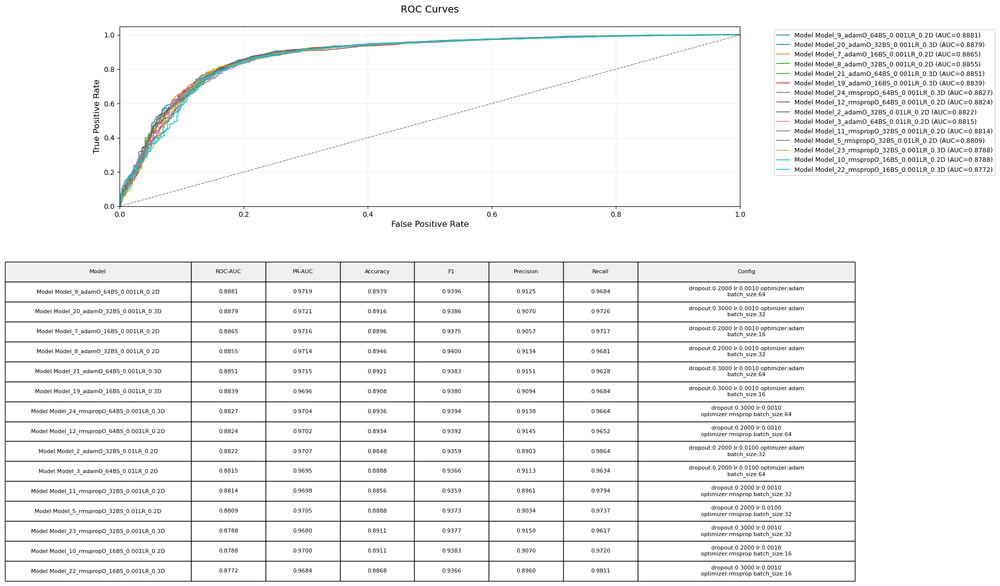

In [129]:
# @tittle ROC Curve for Learning Rate and Activation Function

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def plot_roc_curves(test_results, X_test=None, y_test=None):
    """
    Enhanced ROC curve visualization with model names in legend and table,
    including both ROC-AUC and PR-AUC metrics.
    FIXED: Now uses the same probability extraction method as evaluation function
    """
    plt.figure(figsize=(16, 12))  # Increased figure size for two plots
    
    # Create color palette
    colors = plt.cm.tab10(np.linspace(0, 1, len(test_results)))
    
    # Create subplots with better layout
    ax1 = plt.subplot2grid((10, 2), (0, 0), colspan=2, rowspan=4)  # ROC plot area
    ax2 = plt.subplot2grid((10, 2), (7, 0), colspan=2, rowspan=3)  # Table area
    ax2.axis('off')
    
    # Prepare table data
    table_data = []
    col_labels = ['Model', 'ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall', 'Config']
    
    for i, res in enumerate(test_results):
        try:
            # Get model index and config
            model_idx = res.get('model_name', i)
            config = res['config']
            
            # Use stored probabilities from evaluation function
            # This ensures consistency between evaluation and plotting
            if 'y_pred_prob' in res and res['y_pred_prob'] is not None:
                y_score = res['y_pred_prob']  # This is already the positive class probability
            
            
            # Handle binary vs multi-class
            n_classes = len(np.unique(y_test))
            if n_classes == 2:  # Binary classification
                # FIXED: Use the SAME calculation method as evaluation function
                # Use roc_auc_score for consistency
                roc_auc = roc_auc_score(y_test, y_score)
                
                # Also calculate using roc_curve + auc (should be identical)
                fpr, tpr, _ = roc_curve(y_test, y_score)
                roc_auc_manual = auc(fpr, tpr)
                
                # Verify they match (within floating point precision)
                if abs(roc_auc - roc_auc_manual) > 1e-10:
                    print(f"Warning: ROC-AUC calculation mismatch for model {model_idx}")
                    print(f"  roc_auc_score: {roc_auc:.10f}")
                    print(f"  manual calc:   {roc_auc_manual:.10f}")
                
                # Use the same method as evaluation function
                pr_auc = average_precision_score(y_test, y_score)
                
                # Plot ROC curve
                ax1.plot(fpr, tpr, color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (AUC={roc_auc:.4f})")
                
            else:  # Multi-class - kept same logic but using stored probabilities
                # Use stored full probability matrix
                y_prob = res.get('y_pred_prob_full', res.get('y_pred_prob'))
                if y_prob is None:
                    raise ValueError("No multi-class probability data found")
                
                # One-vs-Rest approach
                fpr, tpr, roc_auc_dict = {}, {}, {}
                
                for class_idx in range(n_classes):
                    fpr[class_idx], tpr[class_idx], _ = roc_curve((y_test == class_idx).astype(int), 
                                                               y_prob[:, class_idx])
                    roc_auc_dict[class_idx] = auc(fpr[class_idx], tpr[class_idx])
                
                # Micro-average metrics
                fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
                roc_auc = auc(fpr["micro"], tpr["micro"])
                
                precision, recall, _ = precision_recall_curve(y_test.ravel(), y_prob.ravel())
                pr_auc = auc(recall, precision)
                
                # Plot micro-average curves
                ax1.plot(fpr["micro"], tpr["micro"], color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (Micro ROC AUC={roc_auc:.4f})")
            
            # Format config for display
            config_clean = {k: v for k, v in config.items() if k != 'model'}
            config_str = "\n".join([f"{k}:{v:.4f}" if isinstance(v, (float, np.floating)) 
                                  else f"{k}:{v}" 
                                  for k, v in config_clean.items()])
            
            # FIXED: Use the SAME values from evaluation results
            table_data.append([
                f"Model {model_idx}",
                f"{res.get('roc_auc', roc_auc):.4f}",  # Use stored value if available
                f"{res.get('pr_auc', pr_auc):.4f}",    # Use stored value if available
                f"{res.get('accuracy', 0):.4f}",
                f"{res.get('f1', 0):.4f}",
                f"{res.get('precision', 0):.4f}",
                f"{res.get('recall', 0):.4f}",
                config_str
            ])
            
        except Exception as e:
            print(f"Error processing model {i}: {str(e)}")
            continue
    
    # Format ROC plot
    ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12)
    ax1.set_ylabel('True Positive Rate', fontsize=12)
    ax1.set_title('ROC Curves', fontsize=14, pad=20)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    ax1.grid(alpha=0.2)
    
    # Create table with better formatting
    if table_data:
        # Wrap text in the config column (column 7) before creating the table
        wrapped_table_data = []
        for row in table_data:
            wrapped_row = []
            for i, cell_text in enumerate(row):
                if i == 7:  # Config column
                    # Wrap text to fit in ~30-35 characters per line
                    wrapped_text = '\n'.join(textwrap.wrap(str(cell_text), width=40))
                    wrapped_row.append(wrapped_text)
                else:
                    wrapped_row.append(cell_text)
            wrapped_table_data.append(wrapped_row)
        
        table = ax2.table(
            cellText=wrapped_table_data,
            colLabels=col_labels,
            loc='center',
            cellLoc='center',
            colColours=['#f0f0f0']*len(col_labels))
        
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        table.scale(1, 1.5)
        
        # Set specific column widths
        for i in range(len(col_labels)):
            for j in range(len(wrapped_table_data) + 1):
                cell = table[(j, i)]
                if i == 0:  # Config column
                    cell.set_width(0.30)
                    cell.set_height(0.15)  # Even taller for wrapped text
                elif i == 7:  # Config column
                    cell.set_width(0.35)
                    cell.set_height(0.15) 
                else:
                    cell.set_width(0.12)
                    cell.set_height(0.15)
    plt.show()

# Usage
plot_roc_curves(top_auc_tuning_s2, X_test=X_test_scaled_s2, y_test=y_test_s2)


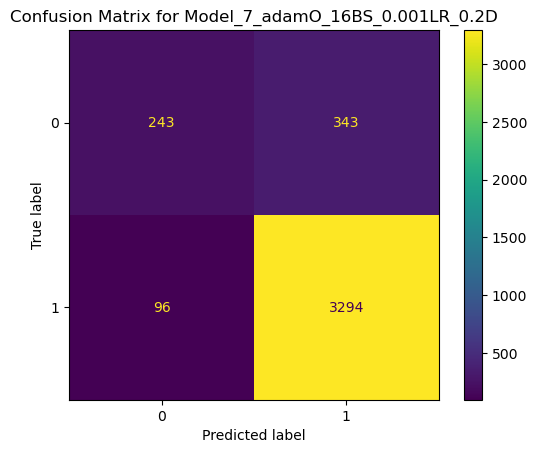

In [130]:
# Assuming test_results_s1_base is a list of dictionaries containing model results
for result in test_results_s2_tuning:
    # Check if this is the specific model we want
    if result.get('model_name') == 'Model_7_adamO_16BS_0.001LR_0.2D' and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot()
        plt.title(f"Confusion Matrix for {result['model_name']}")
        plt.show()

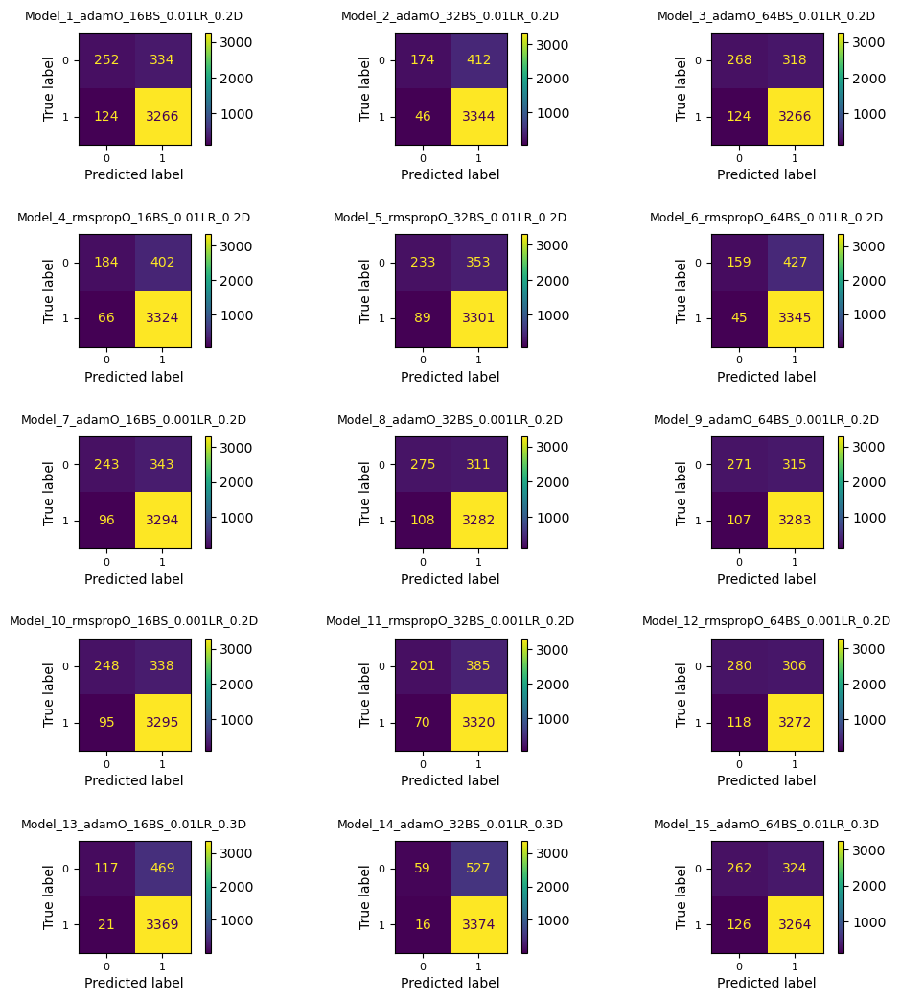

In [131]:
# Display top 15 the Tuned Model Tested

# Create the figure with adjusted spacing parameters
fig, axes = plt.subplots(5, 3, figsize=(12, 12))

# Main figure padding control
fig.tight_layout(pad=1.0)  # Increased from 1.0 to 3.0 for more outer padding

# Additional spacing controls:
plt.subplots_adjust(
    left=0.1,    # Left margin
    right=0.9,   # Right margin
    bottom=0.1,  # Bottom margin
    top=0.9,     # Top margin
    wspace=0.1,  # Horizontal space between subplots
    hspace=0.8   # Vertical space between subplots
)

# Flatten the axes array for easier iteration
axes = axes.ravel()

# Counter for the current subplot
plot_idx = 0

for result in test_results_s2_tuning:
    # Stop if we've filled desired number of subplots
    if plot_idx >= 15:
        break
        
    # Check if this is the specific model we want
    if result.get('model_name') and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot(ax=axes[plot_idx])
        
        # Adjust title positioning and font size
        axes[plot_idx].set_title(
            f"{result['model_name']}",
            pad=10,  # Add padding between title and plot
            fontsize=9  # Smaller font size for long titles
        )
        
        # Adjust tick label sizes if needed
        axes[plot_idx].tick_params(axis='both', which='major', labelsize=8)
        
        plot_idx += 1

# Hide any remaining empty subplots
for i in range(plot_idx, 15):
    axes[i].axis('off')

plt.show()

### Model_7_adamO_16BS_0.001LR_0.2D: 2 hidden layers with 64 neurons. 

Activation: Relu, Softmax

Optimizer: Adam

Loss: Sparse Categorical Crossentropy

Dropout: 0.2

Learning Rate: 0.001

Batch Size: 16


- Learning curves assist with training decisions like early stopping, architecture selection, and stability assessment, but shouldn't be the only basis for final model choice. 
- Standard loss functions can be biased toward majority classes, masking poor minority class performance. That's why I used 'sparse_categorical_crossentropy,' which handles imbalanced datasets more effectively. 
- In imbalanced settings where positives are rare, traditional accuracy can be misleading—an accuracy of 80% might merely reflect always predicting the majority class. ROC-AUC remains a reliable metric for overall discriminative ability, while Precision-Recall AUC offers deeper insights into minority class performance. For model evaluation, I prioritized ROC-AUC, followed by Precision-Recall AUC, F1-score, Recall, and Precision, ensuring a balanced assessment of performance across metrics.


### Compare the results of the XGBOOST and Neural network models on the Stage 2 dataset Vs the Stage 1 dataset

In [132]:
# @tittle Comparison XGBoost results for Stage 1 vs Stage 2
def full_xgboost_comparison(df1, df2):
    """Creates a full comparison including both tuned and untuned models from DataFrames."""
    # Add stage identifiers
    df1['Stage'] = 'Stage 1'
    df2['Stage'] = 'Stage 2'
    
    # Combine the DataFrames
    combined_df = pd.concat([df1, df2], ignore_index=True)
    
    # Create more descriptive model labels
    combined_df['Model'] = combined_df['Stage'] + ' - ' + combined_df['Model']
    
    # Reorder columns
    cols = ['Model', 'Stage'] + [col for col in combined_df.columns if col not in ['Model', 'Stage']]
    combined_df = combined_df[cols]
    
    return combined_df

# Create full comparison
full_comparison_df_XGB_s1s2 = full_xgboost_comparison(results_df_s1, results_df_s2)
full_comparison_df_XGB_s1s2.drop(['Macro Precision', 'Macro Recall', 'Macro F1'], axis=1, inplace=True)
# Highlight best in each metric category
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: gray' if v else '' for v in is_max]

# Identify numeric columns for formatting
numeric_cols = full_comparison_df_XGB_s1s2.select_dtypes(include=['float64', 'int64']).columns
styled_df = (full_comparison_df_XGB_s1s2.style
    .apply(highlight_max, subset=numeric_cols)
    .format("{:.4f}", subset=numeric_cols)
    .set_table_styles([{
        'selector': 'th',
        'props': [('background-color', "#4f6c9b"), ('color', 'white'), ('font-weight', 'bold')]
    }, {
        'selector': 'td',
        'props': [('border', '1px solid #ddd')]
    }])
    .set_properties(**{'text-align': 'center'})
)    



display(styled_df)

,Model,Stage,Accuracy,ROC AUC,Precision (Class 0),Recall (Class 0),F1 Score (Class 0),Precision (Class 1),Recall (Class 1),F1 Score (Class 1)
0,Stage 1 - Without Tuning,Stage 1,0.8759,0.8528,0.6257,0.4219,0.5040,0.9039,0.9557,0.9291
1,Stage 1 - Best Parameters,Stage 1,0.8749,0.8603,0.6266,0.4032,0.4907,0.9013,0.9578,0.9287
2,Stage 2 - Without Tuning,Stage 2,0.8924,0.8950,0.6868,0.4856,0.5689,0.9161,0.9621,0.9385
3,Stage 2 - Best Parameters,Stage 2,0.8952,0.8934,0.7119,0.4759,0.5705,0.9151,0.9670,0.9403


In [133]:
# @title: Comparison best Neural Network Models for Stage 1 and 2
def compare_all_models(auc_tuning_s1, auc_tuning_s2, auc_base_s1=None, auc_base_s2=None, 
                     acc_tuning_s1=None, acc_tuning_s2=None,
                     name_s1="Stage 1", name_s2="Stage 2"):
    """
    Enhanced comparison including best models from all approaches.
    
    Args:
        auc_tuning_s1: Tuned model results sorted by AUC for Stage 1
        auc_tuning_s2: Tuned model results sorted by AUC for Stage 2
        auc_base_s1: Optional - Base model results sorted by AUC for Stage 1
        auc_base_s2: Optional - Base model results sorted by AUC for Stage 2
        acc_tuning_s1: Optional - Tuned model results sorted by Accuracy for Stage 1
        acc_tuning_s2: Optional - Tuned model results sorted by Accuracy for Stage 2
        name_s1: Name for first dataset
        name_s2: Name for second dataset
        
    Returns:
        A DataFrame comparing all selected models
    """
    # Get best models from each approach
    best_auc_tuned_s1 = max(auc_tuning_s1, key=lambda x: x.get('roc_auc', 0)) if auc_tuning_s1 else None
    best_auc_tuned_s2 = max(auc_tuning_s2, key=lambda x: x.get('roc_auc', 0)) if auc_tuning_s2 else None
    best_auc_base_s1 = auc_base_s1[0] if auc_base_s1 else None
    best_auc_base_s2 = auc_base_s2[0] if auc_base_s2 else None
    
    # Prepare data for DataFrame
    data = []
    
    # Add Stage 1 models
    stage1_models = [
        ('Best AUC (Base)', best_auc_base_s1),
        ('Best AUC (Tuned)', best_auc_tuned_s1)
        
    ]
    
    for model_type, model_data in stage1_models:
        if model_data:
            data.append({
                'Dataset': name_s1,
                'Model Type': model_type,
                'Model': model_data.get('model_name', 'Unknown'),
                'ROC-AUC': model_data.get('roc_auc', 0),
                'PR-AUC': model_data.get('pr_auc', 0),
                'Accuracy': model_data.get('accuracy', 0),
                'F1': model_data.get('f1', 0),
                'Precision': model_data.get('precision', 0),
                'Recall': model_data.get('recall', 0),
                'Config': str(model_data.get('config', {}))
            })
    
    # Add Stage 2 models
    stage2_models = [
        ('Best AUC (Base)', best_auc_base_s2),
        ('Best AUC (Tuned)', best_auc_tuned_s2)
    ]
    
    for model_type, model_data in stage2_models:
        if model_data:
            data.append({
                'Dataset': name_s2,
                'Model Type': model_type,
                'Model': model_data.get('model_name', 'Unknown'),
                'ROC-AUC': model_data.get('roc_auc', 0),
                'PR-AUC': model_data.get('pr_auc', 0),
                'Accuracy': model_data.get('accuracy', 0),
                'F1': model_data.get('f1', 0),
                'Precision': model_data.get('precision', 0),
                'Recall': model_data.get('recall', 0),
                'Config': str(model_data.get('config', {}))
            })
    
    # Create DataFrame
    comparison_df = pd.DataFrame(data)
    
    return comparison_df

# Create the enhanced comparison DataFrame
all_models_df = compare_all_models(
    auc_tuning_s1=sorted_auc_tuning_s1,
    auc_tuning_s2=sorted_auc_tuning_s2,
    auc_base_s1=sorted_auc_base,
    auc_base_s2=sorted_auc_base_s2,
    acc_tuning_s1=sorted_acc_tuning_s1,
    acc_tuning_s2=sorted_acc_tuning_s2,
    name_s1="Stage 1",
    name_s2="Stage 2"
)

# Display with improved styling
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: gray' if v else '' for v in is_max]  

numeric_cols = ['ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall']

styled_df = (all_models_df.style
    .apply(highlight_max, subset=numeric_cols)
    .format("{:.4f}", subset=numeric_cols)
    .set_table_styles([{
        'selector': 'th',
        'props': [('background-color', "#4f6c9b"), ('color', 'white'), ('font-weight', 'bold')]
    }, {
        'selector': 'td',
        'props': [('border', '1px solid #ddd')]
    }])
    .set_properties(**{'text-align': 'center'})
)

display(styled_df)

,Dataset,Model Type,Model,ROC-AUC,PR-AUC,Accuracy,F1,Precision,Recall,Config
0,Stage 1,Best AUC (Base),Model_6_4L_64U,0.8543,0.9577,0.8753,0.9289,0.8972,0.9628,"{'layers': 4, 'units': 64}"
1,Stage 1,Best AUC (Tuned),Model_7_adamO_16BS_0.001LR_0.2D,0.8526,0.9583,0.8753,0.9290,0.8955,0.9652,"{'dropout': 0.2, 'lr': 0.001, 'optimizer': 'adam', 'batch_size': 16}"
2,Stage 2,Best AUC (Base),Model_1_2L_32U,0.8866,0.9722,0.8888,0.9367,0.9099,0.9652,"{'layers': 2, 'units': 32}"
3,Stage 2,Best AUC (Tuned),Model_9_adamO_64BS_0.001LR_0.2D,0.8881,0.9719,0.8939,0.9396,0.9125,0.9684,"{'dropout': 0.2, 'lr': 0.001, 'optimizer': 'adam', 'batch_size': 64}"


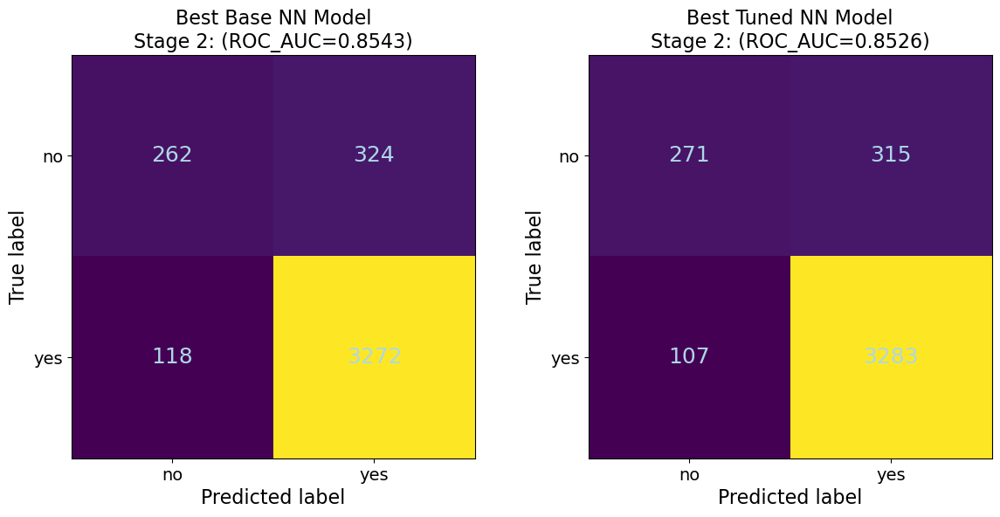

In [232]:
# Compute confusion matrices for best Neural Network models
# Find the best base model
best_base_nn_s2 = max(test_results_s2_base, key=lambda r: r['roc_auc'])
y_pred_base_nn_s2 = best_base_nn_s2['y_pred_class']
cm_base_nn_s2 = confusion_matrix(y_test_s2, y_pred_base_nn_s2)

# Find the best tuned model
best_tuning_nn_s2 = max(test_results_s2_tuning, key=lambda r: r['roc_auc'])
y_pred_tuned_nn_s2 = best_tuning_nn_s2['y_pred_class']
cm_tuned_nn_s2 = confusion_matrix(y_test_s2, y_pred_tuned_nn_s2)

# Base model
disp_base_nn_s2 = ConfusionMatrixDisplay(confusion_matrix=cm_base_nn_s2, display_labels=["no", "yes"])
disp_tuned_nn_s2 = ConfusionMatrixDisplay(confusion_matrix=cm_tuned_nn_s2, display_labels=["no", "yes"])


# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot confusion matrices
disp_base_nn_s2.plot(ax=axes[0], colorbar=False)
disp_tuned_nn_s2.plot(ax=axes[1], colorbar=False)

# Set titles with ROC_AUC info
axes[0].set_title(f"Best Base NN Model\nStage 2: (ROC_AUC={best_base['roc_auc']:.4f})", fontsize=16)
axes[1].set_title(f"Best Tuned NN Model\nStage 2: (ROC_AUC={best_tuning['roc_auc']:.4f})", fontsize=16)

# Set axis labels with font size
axes[0].set_xlabel('Predicted label', fontsize=16)
axes[0].set_ylabel('True label', fontsize=16)
axes[1].set_xlabel('Predicted label', fontsize=16)
axes[1].set_ylabel('True label', fontsize=16)

# Remove grid lines
axes[0].grid(False)
axes[1].grid(False)

# Customize tick labels and cell fonts
for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=14)
    for text in ax.texts:
        text.set_fontsize(18)
        text.set_color('lightblue')
        
plt.subplots_adjust(wspace=0.2, hspace=0.3)

plt.show()

# Stage 3 data

**Stage 3: Pre-processing instructions**

- Remove any columns not useful in the analysis (LearnerCode).
- Remove columns with high cardinality (use >200 unique values, as a guideline for this data set).
- Remove columns with >50% data missing.
- Perform ordinal encoding for ordinal data.
- Perform one-hot encoding for all other categorical data.
- Choose how to engage with rows that have missing values, which can be done in one of two ways for this project:
  *   Impute the rows with appropriate values.
  *   Remove rows with missing values but ONLY in cases where rows with missing values are minimal: <2% of the overall data.






In [134]:
# File URL
file_url3 = "https://drive.google.com/uc?id=18oyu-RQotQN6jaibsLBoPdqQJbj_cV2-"
df3 = pd.read_csv(file_url3)

In [135]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25059 entries, 0 to 25058
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CentreName                25059 non-null  object 
 1   LearnerCode               25059 non-null  int64  
 2   BookingType               25059 non-null  object 
 3   LeadSource                25059 non-null  object 
 4   DiscountType              7595 non-null   object 
 5   DateofBirth               25059 non-null  object 
 6   Gender                    25059 non-null  object 
 7   Nationality               25059 non-null  object 
 8   HomeState                 8925 non-null   object 
 9   HomeCity                  21611 non-null  object 
 10  CourseLevel               25059 non-null  object 
 11  CourseName                25059 non-null  object 
 12  IsFirstIntake             25059 non-null  bool   
 13  CompletedCourse           25059 non-null  object 
 14  Assess

In [136]:
# Remove unnecessary columns
df3.drop('LearnerCode', axis=1, inplace=True)

### Remove columns with high cardinality (use >200 unique values, as a guideline for this data set).

High cardinality refers to columns that contain a large number of unique values. In this case the recommendation is to remove columns with >200 unique values. This may need adjustment based on specific dataset and analysis goals.
This is important because columns with high cardinality can lead to overfitting of machine learning models, creates sparse data when one-hot encoded significantly increasing memory usage.

In [137]:
# Get list of columns to remove
high_cardinality_cols_s3 = [col for col in df3.columns if df3[col].nunique() > 200]
print("High cardinality columns:", high_cardinality_cols_s3)

High cardinality columns: ['DateofBirth', 'HomeState', 'HomeCity', 'ProgressionDegree', 'UnauthorisedAbsenceCount']


HomeState and HomeCity are unlikely to provide any useful information regarding the student’s likelihood to drop out. So they will be remove from the dataset considering their high cardinality.

DateOfBirth will also be removed due to its high cardinality. However, first I will create a new column called Age which will be the difference between the current date and the date of birth. This will be a more useful feature for the analysis.

ProgressionDegree will also be removed due to its high cardinality. This column contains 2616 unique values which is too high for encoding. Nonetheless, it is important to note that this column contains information about the degree the student is studying. This information may be useful for the analysis, but it is not possible to encode it in a meaningful way. 

UnauthorisedAbsenceCount will not be removed, but engineered instead. 

In [138]:
# Remove these columns
df3_reduced = df3.drop(columns=['HomeState', 'HomeCity'], axis=1)

In [139]:
# Convert DateofBirth to Age

df3_reduced['DateofBirth'] = pd.to_datetime(df3_reduced['DateofBirth'], dayfirst=True, errors='coerce')

df3_reduced['Age'] = (date.today().year - df3_reduced['DateofBirth'].dt.year)

# Drop the original DateofBirth column
df3_reduced.drop('DateofBirth', axis=1, inplace=True)

In [140]:
# Drop the ProgressionDegree column
df3_reduced.drop('ProgressionDegree', axis=1, inplace=True)

#### Based on analysis performed for Stage 2 data, UnauthorisedAbsenceCount and AuthorisedAbsenceCount were transformed into categories by binning. 

In [141]:
# Define bins (adjust thresholds based on domain knowledge)
bins = [0, 10, 50, 100, float('inf')]
labels = ['<10', '11-50', '51-100', '>100']

# Create a new binned column
df3_reduced['Unauthorised_AbsenceCategory'] = pd.cut(
    df3_reduced['UnauthorisedAbsenceCount'],
    bins=bins,
    labels=labels,
    right=False
)

In [142]:
display(df3_reduced.head(2))

,CentreName,BookingType,LeadSource,DiscountType,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,AssessedModules,PassedModules,FailedModules,ProgressionUniversity,AuthorisedAbsenceCount,UnauthorisedAbsenceCount,Age,Unauthorised_AbsenceCategory
0,ISC_Aberdeen,Agent,Standard Agent Booking,NaN,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,4.0,4.0,0.0,University of Aberdeen,NaN,NaN,27,NaN
1,ISC_Aberdeen,Agent,Standard Agent Booking,NaN,Male,Chinese,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,7.0,7.0,0.0,University of Aberdeen,93.0,5.0,27,<10


#### Now we can drop UnauthorisedAbsenceCount

In [143]:
# Drop the ProgressionDegree column
df3_reduced.drop('UnauthorisedAbsenceCount', axis=1, inplace=True)

#### Repeat the binning process for the AuthorisedAbsenceCount to keep it consistent

In [144]:
# Define bins (adjust thresholds based on domain knowledge)
bins = [0, 10, 50, 100, float('inf')]
labels = ['<10', '11-50', '51-100', '>100']

# Create a new binned column
df3_reduced['Autorised_AbsenceCategory'] = pd.cut(
    df3_reduced['AuthorisedAbsenceCount'],
    bins=bins,
    labels=labels,
    right=False
)

In [145]:
# Drop the ProgressionDegree column
df3_reduced.drop('AuthorisedAbsenceCount', axis=1, inplace=True)

### Remove columns with > 50% data missing.

In [146]:
# Get list of columns to remove
high_nas_cols_s3 = [col for col in df3_reduced.columns if df3_reduced[col].isna().sum() > 0.5 * len(df3_reduced)]
print("High NA columns:", high_nas_cols_s3)

High NA columns: ['DiscountType']


In [147]:
# Drop the DiscountType column
df3_reduced.drop('DiscountType', axis=1, inplace=True)

In [148]:
display(df3_reduced.head(2))

,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,AssessedModules,PassedModules,FailedModules,ProgressionUniversity,Age,Unauthorised_AbsenceCategory,Autorised_AbsenceCategory
0,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,4.0,4.0,0.0,University of Aberdeen,27,NaN,NaN
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,7.0,7.0,0.0,University of Aberdeen,27,<10,51-100


#### Check new Features

In [149]:
# Check number of unique values in new features
print("Unique values in AssessedModules:", df3_reduced['AssessedModules'].nunique())
print("Count of each unique value in AssessedModules:")
print(df3_reduced['AssessedModules'].value_counts())

print("Unique values in PassedModules:", df3_reduced['PassedModules'].nunique())
print("Count of each unique value in PassedModules:")
print(df3_reduced['PassedModules'].value_counts())

print("Unique values in FailedModules:", df3_reduced['FailedModules'].nunique())
print("Count of each unique value in FailedModules:")
print(df3_reduced['FailedModules'].value_counts())

Unique values in AssessedModules: 12
Count of each unique value in AssessedModules:
AssessedModules
6.0     6426
4.0     4749
7.0     3858
8.0     3805
5.0     1384
9.0      958
3.0      521
10.0     439
1.0      308
2.0      217
11.0     161
12.0       2
Name: count, dtype: int64
Unique values in PassedModules: 12
Count of each unique value in PassedModules:
PassedModules
6.0     5858
4.0     4301
7.0     3673
8.0     3555
0.0     1536
5.0     1099
9.0      816
3.0      650
1.0      441
2.0      426
10.0     342
11.0     131
Name: count, dtype: int64
Unique values in FailedModules: 11
Count of each unique value in FailedModules:
FailedModules
0.0     18598
1.0      1514
3.0       710
2.0       658
4.0       589
5.0       469
6.0       184
7.0        58
8.0        28
9.0        11
10.0        9
Name: count, dtype: int64


#### Examine features with NAs more in detail.

In [150]:
# Create DataFrame with only rows containing NA values
na_rows_df = df3_reduced[df3_reduced.isna().any(axis=1)]

# Show summary of NA rows
print(f"Found {len(na_rows_df)} rows with missing values")
display(na_rows_df.head())

# Optional: Show which columns have NAs in these rows
print("\nColumns with NAs in these rows:")
print(na_rows_df.isna().sum()[na_rows_df.isna().sum() > 0])

Found 2310 rows with missing values


,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,AssessedModules,PassedModules,FailedModules,ProgressionUniversity,Age,Unauthorised_AbsenceCategory,Autorised_AbsenceCategory
0,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,4.0,4.0,0.0,University of Aberdeen,27,NaN,NaN
4,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Pre-Masters,Business and Law Pre-Masters,True,Yes,4.0,4.0,0.0,University of Aberdeen,29,NaN,NaN
6,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Foundation,Business; Economics; Accounting and Real Estat...,False,No,NaN,NaN,NaN,University of Aberdeen,23,11-50,11-50
17,ISC_Aberdeen,Direct,Sponsor,Male,Iraqi,Pre-Masters,Science and Engineering Pre-Masters,True,Yes,4.0,4.0,0.0,University of Aberdeen,27,NaN,NaN
36,ISC_Aberdeen,Direct,Digital (Web),Male,Indian,Pre-Masters,Science and Engineering Pre-Masters,True,Yes,4.0,4.0,0.0,University of Aberdeen,30,NaN,NaN



Columns with NAs in these rows:
AssessedModules                 2231
PassedModules                   2231
FailedModules                   2231
Unauthorised_AbsenceCategory     208
Autorised_AbsenceCategory        208
dtype: int64


#### Remove NAs from Unauthorised_AbsenceCategory, Autorised_AbsenceCategory only, because the fraction in these features is very small. Therefore their removal is unlikely to affect negatively the performance of the models.

In [151]:
# Check shape of original dataframe
print("Original shape:", df3_reduced.shape)

# Drop rows with NAs ONLY in the specified absence categories
cols_to_check = ['Unauthorised_AbsenceCategory', 'Autorised_AbsenceCategory']
df3_encoded_clean = df3_reduced.dropna(subset=cols_to_check)

# Check shape of cleaned dataframe
print("Cleaned shape:", df3_encoded_clean.shape)

# Show how many rows were dropped
rows_dropped = df3_reduced.shape[0] - df3_encoded_clean.shape[0]
print(f"Rows dropped (missing in absence categories): {rows_dropped}")

# Optional: Verify NAs still exist in other columns
print("\nRemaining NAs in other columns:")
print(df3_encoded_clean.isna().sum()[df3_encoded_clean.isna().sum() > 0])

Original shape: (25059, 16)
Cleaned shape: (24851, 16)
Rows dropped (missing in absence categories): 208

Remaining NAs in other columns:
AssessedModules    2102
PassedModules      2102
FailedModules      2102
dtype: int64


In [152]:
display(df3_encoded_clean.head(2))

,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,AssessedModules,PassedModules,FailedModules,ProgressionUniversity,Age,Unauthorised_AbsenceCategory,Autorised_AbsenceCategory
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,Foundation,Life Sciences Undergraduate Foundation Programme,False,Yes,7.0,7.0,0.0,University of Aberdeen,27,<10,51-100
2,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,International Year Two,Business Management and Finance International ...,False,Yes,8.0,8.0,0.0,University of Aberdeen,25,<10,51-100


### Visualize the distribution of the new features

In [153]:
# Create a new df with only the new features for visualization purposes.
df3_view = df3_encoded_clean[['AssessedModules', 'PassedModules', 'FailedModules']]

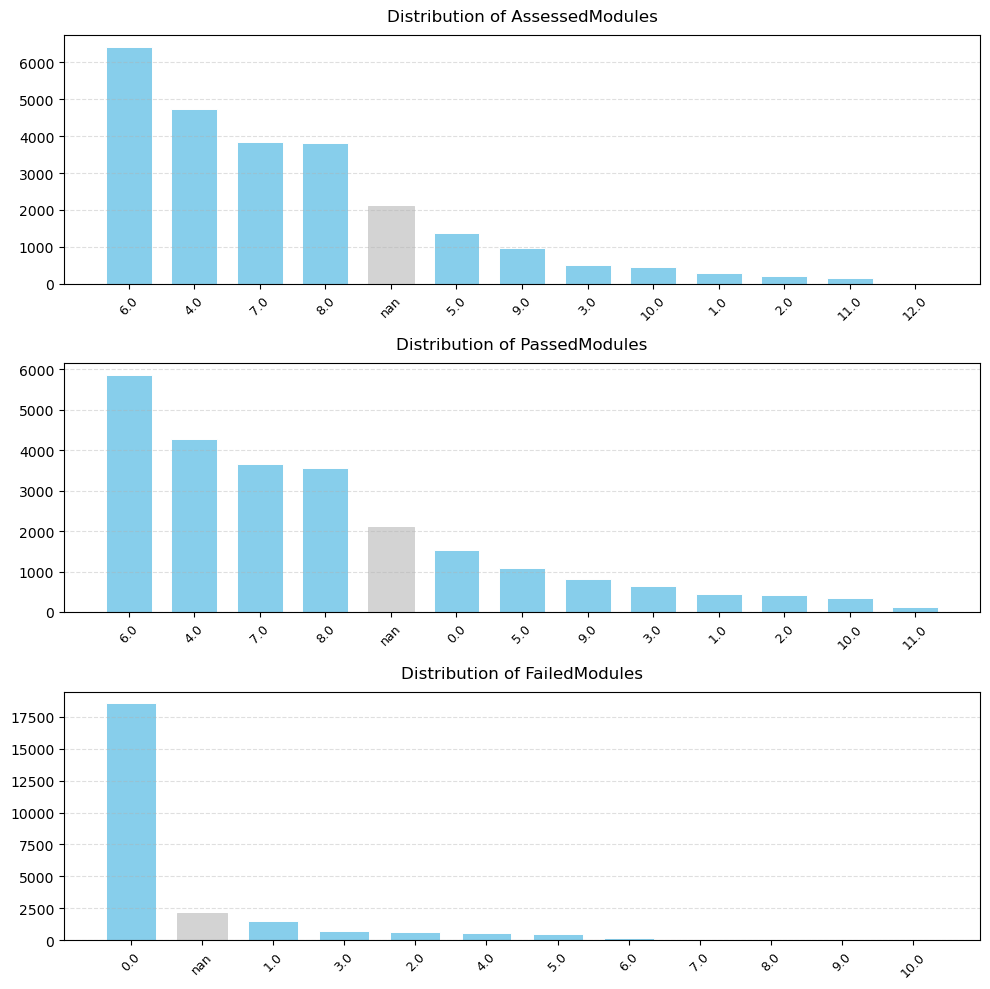

In [154]:
# @title: Data Distribution
def make_barplots(data, n_cols=1, n_rows=3, figsize=(10, 10), color='skyblue', 
                 na_color='lightgray', title_fontsize=12, label_fontsize=10, 
                 tick_label_fontsize=9, rotation=45, max_unique_cat=20, 
                 bar_width=0.7, grid=True, **kwargs):
    """
    Generate bar plots for categorical features in a DataFrame.
    
    Parameters:
        data: DataFrame or array-like
        n_cols: Number of columns in subplot grid
        ... [other params]
    """
    # Convert to DataFrame if numpy array
    if isinstance(data, np.ndarray):
        data = pd.DataFrame(data)
    
    # Select only categorical columns
    cat_cols = [col for col in data.columns 
               if data[col].dtype == 'object' or 
               data[col].nunique() <= max_unique_cat]
    
    # Calculate required rows if not specified
    if n_rows == 'auto':
        n_rows = int(np.ceil(len(cat_cols) / n_cols))
    
    # Create figure and axes grid
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]
    
    for i, (ax, column) in enumerate(zip(axes, cat_cols)):
        if i >= len(cat_cols):
            ax.axis('off')
            continue
            
        # Get value counts (including NA)
        value_counts = data[column].value_counts(dropna=False)
        
        # Plot bars
        x_pos = np.arange(len(value_counts))
        bars = ax.bar(x_pos, value_counts.values, 
                     width=bar_width, color=color, 
                     edgecolor='white', linewidth=0.7)
        
        # Customize plot
        ax.set_title(f'Distribution of {column}', fontsize=title_fontsize, pad=10)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(value_counts.index.astype(str), 
                         rotation=rotation,
                         fontsize=tick_label_fontsize)
        if grid:
            ax.grid(axis='y', linestyle='--', alpha=0.4)
        
        # Color NA bars differently
        if value_counts.index.isna().any():
            na_idx = np.where(value_counts.index.isna())[0]
            bars[na_idx[0]].set_color(na_color)
    
    plt.tight_layout()
    plt.show()
make_barplots(df3_view)

### Create feature RateModuleSuccess:  (PassedModules - FailedModules/ AssessedModules). This feature will provide a better measure of how well a student is performing in the courses.

- 2102 rows with NAs. This are 100% associated to the PassedModules, FailedModules, AssessedModules. 
- There seems to be a strong correlation between Dropout rate and the NAs in these features. Let's look at a correlation plot to confirm this.
- First, I will encode the data to make it easy to plot and calculate correlations.
  

### Perform ordinal encoding for ordinal data.

In [155]:
# Check the unique values in ordinal columns
for column in ['CourseLevel', 'Unauthorised_AbsenceCategory', 'Autorised_AbsenceCategory']:
    unique_values = df3_encoded_clean[column].unique()
    print(f"Unique values in {column}:")
    print(unique_values)
    print("\n" + "-"*50 + "\n")

Unique values in CourseLevel:
['Foundation' 'International Year Two' 'Pre-Masters'
 'International Year One']

--------------------------------------------------

Unique values in Unauthorised_AbsenceCategory:
['<10', '11-50', '51-100', '>100']
Categories (4, object): ['<10' < '11-50' < '51-100' < '>100']

--------------------------------------------------

Unique values in Autorised_AbsenceCategory:
['51-100', '11-50', '<10', '>100']
Categories (4, object): ['<10' < '11-50' < '51-100' < '>100']

--------------------------------------------------



In [156]:
# Convert ordinal columns to numeric using map
# Define the mapping for CourseLevel
course_level_mapping = {
    'Pre-Masters': 1,
    'Foundation': 2,
    'International Year One': 3,
    'International Year Two': 4
}
df3_encoded_clean['CourseLevel'] = df3_encoded_clean['CourseLevel'].map(course_level_mapping)


In [157]:
# For Unauthorised Absence
df3_encoded_clean['Unauthorised_Absence_Ordinal'] = (df3_encoded_clean['Unauthorised_AbsenceCategory'].cat.codes.replace({-1: np.nan}))

# For Authorised Absence
df3_encoded_clean['Autorised_Absence_Ordinal'] = (df3_encoded_clean['Autorised_AbsenceCategory'].cat.codes.replace({-1: np.nan}))


In [158]:
# Drop the Unauthorised_Absence_Ordinal and Autorised_Absence_Ordinal
df3_encoded_clean.drop(['Unauthorised_AbsenceCategory', 'Autorised_AbsenceCategory'], axis=1, inplace=True)

In [159]:
display(df3_encoded_clean.head(5))

,CentreName,BookingType,LeadSource,Gender,Nationality,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,AssessedModules,PassedModules,FailedModules,ProgressionUniversity,Age,Unauthorised_Absence_Ordinal,Autorised_Absence_Ordinal
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,2,Life Sciences Undergraduate Foundation Programme,False,Yes,7.0,7.0,0.0,University of Aberdeen,27,0,2
2,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,4,Business Management and Finance International ...,False,Yes,8.0,8.0,0.0,University of Aberdeen,25,0,2
3,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,4,Business Management and Finance International ...,True,Yes,8.0,8.0,0.0,University of Aberdeen,26,1,2
5,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,4,Business Management and Finance International ...,True,Yes,8.0,8.0,0.0,University of Aberdeen,25,0,2
6,ISC_Aberdeen,Agent,Standard Agent Booking,Male,Chinese,2,Business; Economics; Accounting and Real Estat...,False,No,NaN,NaN,NaN,University of Aberdeen,23,1,1


#### The dataset is heavily imbalanced with many of the features presenting few observations overrepresented within each feature. The target feature 'CompletedCourse' shows a ratio of 9:1 between two classes. One option would be to use SMOTE to balance the dataset, but since it is not clear what would be the effect of using synthetic data on the model, I will keep the dataset as it is for now.

#### EDA for stage 1 showed that the Nationality features is heavily skewed to two nationalities with Chinese representing 36.08% of the students and Bangladeshi representing another 8.01%, which is a very high proportion considering that there are 151 nationalities in the dataset. For this reason, this features was finally dropped from the dataset.

#### Nationality is heavily imbalanced with the Chinese students representing a 36.08% of the dataset, followed by the Bangladeshi students representing an 8.01%. The other 149 nationalities in the dataset represent the remaining 55.91% of the dataset. This is a very high imbalance and it is likely that this feature will not be useful for the analysis, so I will drop it.

In [160]:
# Create new dataframe without the Nationality column
df3_encoded_clean = df3_encoded_clean.drop(columns=['Nationality'], axis=1, inplace=False)

### Create new feature RateModuleSuccess, which combines the information contained in PassedModules, FailedModules and AssessedModules. By doing this we get to reduce the number of features in the dataset and use a new feature that provides a better relationship of students dropout vs success in class.

In [161]:
# Calculate RateModuleSuccess
df3_encoded_clean['RateModuleSuccess'] = (df3_encoded_clean['PassedModules'] - df3_encoded_clean['FailedModules']) / df3_encoded_clean['AssessedModules']

# Handle potential division by zero (if AssessedModules is 0)
df3_encoded_clean['RateModuleSuccess'] = df3_encoded_clean['RateModuleSuccess'].replace([np.inf, -np.inf], np.nan)

In [162]:
display(df3_encoded_clean.head(5))

,CentreName,BookingType,LeadSource,Gender,CourseLevel,CourseName,IsFirstIntake,CompletedCourse,AssessedModules,PassedModules,FailedModules,ProgressionUniversity,Age,Unauthorised_Absence_Ordinal,Autorised_Absence_Ordinal,RateModuleSuccess
1,ISC_Aberdeen,Agent,Standard Agent Booking,Male,2,Life Sciences Undergraduate Foundation Programme,False,Yes,7.0,7.0,0.0,University of Aberdeen,27,0,2,1.0
2,ISC_Aberdeen,Agent,Standard Agent Booking,Male,4,Business Management and Finance International ...,False,Yes,8.0,8.0,0.0,University of Aberdeen,25,0,2,1.0
3,ISC_Aberdeen,Agent,Standard Agent Booking,Male,4,Business Management and Finance International ...,True,Yes,8.0,8.0,0.0,University of Aberdeen,26,1,2,1.0
5,ISC_Aberdeen,Agent,Standard Agent Booking,Male,4,Business Management and Finance International ...,True,Yes,8.0,8.0,0.0,University of Aberdeen,25,0,2,1.0
6,ISC_Aberdeen,Agent,Standard Agent Booking,Male,2,Business; Economics; Accounting and Real Estat...,False,No,NaN,NaN,NaN,University of Aberdeen,23,1,1,NaN


### Perform one-hot encoding for all other categorical data.

In [163]:
# One-hot encode categorical variables
def one_hot_encode(df, columns):
    return pd.get_dummies(df, columns=columns, drop_first=True, dtype=int)
# Define the columns to one-hot encode
one_hot_columns = ['CentreName', 'BookingType', 'LeadSource', 'Gender', 'CourseName', 'IsFirstIntake', 'CompletedCourse', 'ProgressionUniversity']

one_hot_encoded_df3 = one_hot_encode(df3_encoded_clean, one_hot_columns)
# Display the first few rows of the one-hot encoded DataFrame
display(one_hot_encoded_df3.head())
print("Shape of the one-hot encoded DataFrame:", df3_encoded_clean.shape)

,CourseLevel,AssessedModules,PassedModules,FailedModules,Age,Unauthorised_Absence_Ordinal,Autorised_Absence_Ordinal,RateModuleSuccess,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
1,2,7.0,7.0,0.0,27,0,2,1.0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,4,8.0,8.0,0.0,25,0,2,1.0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,4,8.0,8.0,0.0,26,1,2,1.0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,4,8.0,8.0,0.0,25,0,2,1.0,0,0,...,0,1,0,0,0,0,0,0,0,0
6,2,NaN,NaN,NaN,23,1,1,NaN,0,0,...,0,1,0,0,0,0,0,0,0,0


Shape of the one-hot encoded DataFrame: (24851, 16)


In [164]:
# Check for missing values in the one-hot encoded DataFrame
missing_values = one_hot_encoded_df3.isnull().sum()
missing_values = missing_values[missing_values > 0]
if missing_values.empty:
    print("No missing values in one-hot encoded DataFrame.")
else:
    print("Missing values in one-hot encoded DataFrame:")
    print(missing_values)

    # Calculate percentage of missing values in each column
    missing_percentage = one_hot_encoded_df3.isnull().mean() * 100
    missing_percentage = missing_percentage[missing_percentage > 0]

    print("Percentage of missing values in each column:")
    print(missing_percentage)



Missing values in one-hot encoded DataFrame:
AssessedModules      2102
PassedModules        2102
FailedModules        2102
RateModuleSuccess    2102
dtype: int64
Percentage of missing values in each column:
AssessedModules      8.458412
PassedModules        8.458412
FailedModules        8.458412
RateModuleSuccess    8.458412
dtype: float64


#### Explore correlation between CompletedCourse vs features with NAs

In [165]:
# Create a new df with only the new features for visualization purposes. Note CompletedCourse is now CompletedCourse_Yes
df3_corr = one_hot_encoded_df3[['CompletedCourse_Yes', 'AssessedModules', 'PassedModules', 'FailedModules', 'RateModuleSuccess']]

# Create NA indicators for each column
na_analysis = df3_corr.assign(
    Assessed_NA = df3_corr['AssessedModules'].isna(),
    Passed_NA = df3_corr['PassedModules'].isna(),
    Failed_NA = df3_corr['FailedModules'].isna(),
    Rate_NA = df3_corr['RateModuleSuccess'].isna()
)

# Group by 'CompletedCourse_Yes' and sum NA counts (True=1, False=0)
na_counts = na_analysis.groupby('CompletedCourse_Yes')[['Assessed_NA', 'Passed_NA', 'Failed_NA', 'Rate_NA']].sum()

print("Raw NA counts by completion status (0=No, 1=Yes):")
print(na_counts)

Raw NA counts by completion status (0=No, 1=Yes):
                     Assessed_NA  Passed_NA  Failed_NA  Rate_NA
CompletedCourse_Yes                                            
0                           2102       2102       2102     2102
1                              0          0          0        0


#### This analysis confirms that all NAs are related to students that did not completed the course. Therefore, I think it is safe to turn those NAs into zeros in the new RateModuleSuccess feature. Also, safe to drop the the other 3 features 'AssessedModules', 'PassedModules', 'FailedModules'.

In [166]:
# Drop PassedModules, FailedModules, AssessedModules
one_hot_encoded_df3.drop(['PassedModules', 'FailedModules', 'AssessedModules'], axis=1, inplace=True)

In [167]:
# Covert NAs to 0s in RateModuleSuccess
# Replace NA with 0 ONLY in selected columns
df3_filled = one_hot_encoded_df3.copy()

df3_filled['RateModuleSuccess'] = one_hot_encoded_df3['RateModuleSuccess'].fillna(0)

# Calculate percentage of missing values in each column
missing_percentage = df3_filled.isnull().mean() * 100
missing_percentage = missing_percentage[missing_percentage > 0]

print("Percentage of missing values in each column:")
print(missing_percentage)

Percentage of missing values in each column:
Series([], dtype: float64)


In [168]:
# find column starting with CompletedCourse     
all_columns = [col for col in df3_filled.columns if col.startswith('CompletedCourse')]

# View in console (Jupyter/Colab shows full list)
print(all_columns) 

['CompletedCourse_Yes']


# Defining XGBoost Model: Stage 3

In [277]:
# Split the data into features and target variable
X_s3 = df3_filled.drop(columns=['CompletedCourse_Yes'], axis=1, inplace=False)
y_s3 = df3_filled['CompletedCourse_Yes']
# Display the first few rows of the features and target variable
display(X.head())  

,CourseLevel,Age,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,CentreName_ISC_Holland,CentreName_ISC_Huddersfield,CentreName_ISC_Kingston,CentreName_ISC_LJMU,CentreName_ISC_Lancaster,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
0,1,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,2,27,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,4,25,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,4,26,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,1,29,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [278]:
display(y_s3.head())

1    1
2    1
3    1
5    1
6    0
Name: CompletedCourse_Yes, dtype: int64

In [279]:
# Split the data into training and validation sets
X_train_s3, X_val_s3, y_train_s3, y_val_s3 = train_test_split(X_s3, y_s3, test_size=0.2, random_state=42)
# Split the training data into training and test sets
X_train_s3, X_test_s3, y_train_s3, y_test_s3 = train_test_split(X_train_s3, y_train_s3, test_size=0.2, random_state=42)
# Display the shapes of the training, validation, and test sets
print("Training set shape:", X_train_s3.shape, y_train_s3.shape)
print("Validation set shape:", X_val_s3.shape, y_val_s3.shape)
print("Test set shape:", X_test_s3.shape, y_test_s3.shape)
# Check the distribution of the target variable in the training set
print("Training set target variable distribution:")
print(y_train_s3.value_counts(normalize=True))
# Check the distribution of the target variable in the validation set
print("Validation set target variable distribution:")
print(y_val_s3.value_counts(normalize=True))
# Check the distribution of the target variable in the test set
print("Test set target variable distribution:")
print(y_test_s3.value_counts(normalize=True))

Training set shape: (15904, 241) (15904,)
Validation set shape: (4971, 241) (4971,)
Test set shape: (3976, 241) (3976,)
Training set target variable distribution:
CompletedCourse_Yes
1    0.855634
0    0.144366
Name: proportion, dtype: float64
Validation set target variable distribution:
CompletedCourse_Yes
1    0.853752
0    0.146248
Name: proportion, dtype: float64
Test set target variable distribution:
CompletedCourse_Yes
1    0.852616
0    0.147384
Name: proportion, dtype: float64


### XGBoost modelStage 3

XGBoost Model Accuracy:  0.9710319855159928
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       727
           1       0.98      0.98      0.98      4244

    accuracy                           0.97      4971
   macro avg       0.94      0.95      0.94      4971
weighted avg       0.97      0.97      0.97      4971



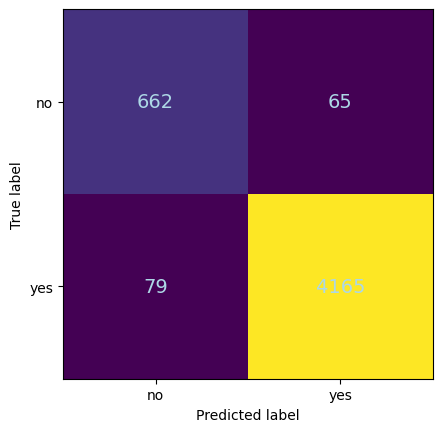

<Figure size 1000x600 with 0 Axes>

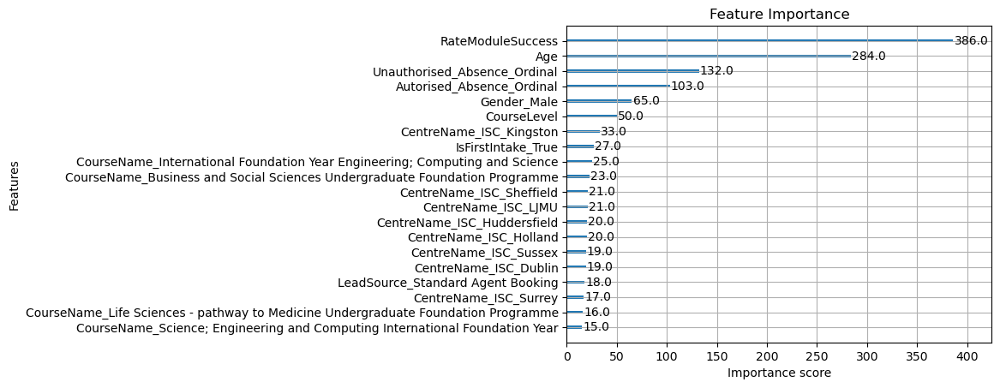

In [280]:
xg_model_no_tunning_s3 = xgb.XGBClassifier(random_state=42)
xg_model_no_tunning_s3.fit(X_train_s3, y_train_s3)

# Model evaluation
predictions_no_tunning_s3 = xg_model_no_tunning_s3.predict(X_val_s3)
print("XGBoost Model Accuracy: ", accuracy_score(y_val_s3, predictions_no_tunning_s3))
print(classification_report(y_val_s3, predictions_no_tunning_s3))


cm_no_tunning_s3 = confusion_matrix(y_val_s3, predictions_no_tunning_s3)
cfmd_no_tunning_s3 = ConfusionMatrixDisplay(confusion_matrix=cm_no_tunning_s3, display_labels=["no","yes"])
# Create plot and remove grid lines
fig, ax = plt.subplots()
cfmd_no_tunning_s3.plot(ax=ax, colorbar=False)
ax.grid(False)  # This removes the white crossing lines
# Make numbers more visible
for text in ax.texts:
    text.set_size(14)  # Larger font size
    text.set_color('lightblue')  # Force black text
plt.show()

# Feature Importance
plt.figure(figsize=(10, 6))
plot_importance(xg_model_no_tunning_s3, max_num_features=20)  # Top 20 features
plt.title('Feature Importance')
plt.show()


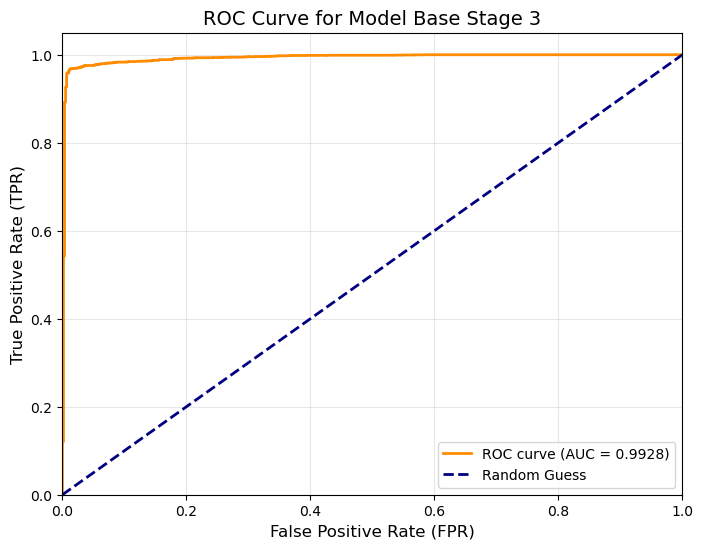

In [281]:
# @tittle Testing the model without tunning
# Calculate ROC curve using test set for better evaluation
y_pred_proba_no_tunning_s3 = xg_model_no_tunning_s3.predict_proba(X_test_s3)[:, 1]  # Probabilities for AUC using test set
fpr, tpr, thresholds = roc_curve(y_test_s3, y_pred_proba_no_tunning_s3) # Use TEST set for final evaluation
roc_auc_no_tunning_s3 = auc(fpr, tpr)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {roc_auc_no_tunning_s3:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve for Model Base Stage 3', fontsize=14)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

### Fine Tunning with GridSearchCV.
#### The model will be trained using the training set and evaluated using the val set. 

In [282]:
# @title: Grid Search for Hyperparameter Tuning

param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],      # Lower for better generalization
    'max_depth': [4, 6, 8],                   # Control tree complexity
    'min_child_weight': [1, 3, 5],            # Prevent overfitting
    'gamma': [0, 0.1, 0.2],                   # Regularization
    'subsample': [0.6, 0.8, 1.0],             # Stochastic sampling
    'colsample_bytree': [0.6, 0.8, 1.0],      # Feature sampling
    'n_estimators': [50, 100, 150]            # Number of trees
}

grid_search = GridSearchCV(
    estimator=xgb.XGBClassifier(
        eval_metric='logloss',
        early_stopping_rounds=10,
        random_state=42
    ),
    param_grid=param_grid,
    scoring='roc_auc',  # Optimize for AUC
    cv=3,               # 3-fold cross-validation
    n_jobs=-1           # Use all CPU cores
)

grid_search.fit(X_train_s3, y_train_s3, eval_set=[(X_val_s3, y_val_s3)], verbose=False)
best_params_s3 = grid_search.best_params_

In [283]:
best_params_df_s3 = pd.DataFrame([best_params_s3])
display(best_params_df_s3)

,colsample_bytree,gamma,learning_rate,max_depth,min_child_weight,n_estimators,subsample
0,0.6,0.1,0.05,8,1,150,0.8


Validation Accuracy: 0.9712331522832428

Classification Report (Best Parameters):
              precision    recall  f1-score   support

           0       0.89      0.92      0.90       727
           1       0.99      0.98      0.98      4244

    accuracy                           0.97      4971
   macro avg       0.94      0.95      0.94      4971
weighted avg       0.97      0.97      0.97      4971



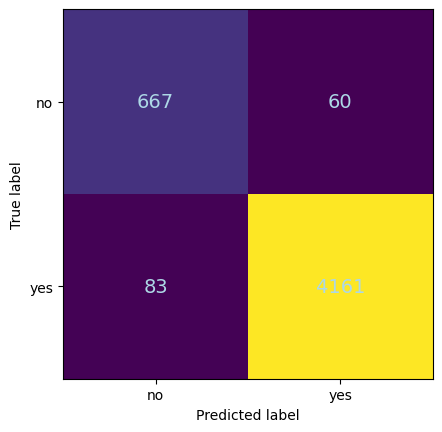

<Figure size 1000x600 with 0 Axes>

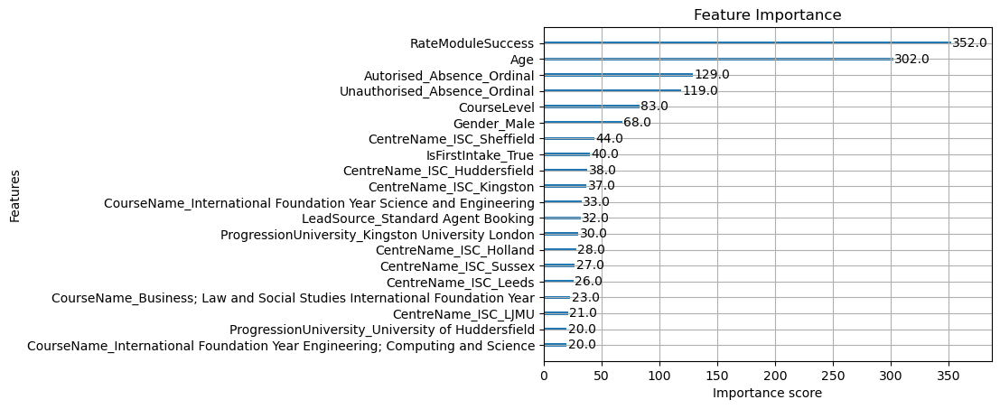

In [284]:
# Initialize model with optimized hyperparameters
xg_model_best_param_s3 = xgb.XGBClassifier(
    random_state=42,
    n_estimators=100,           # Number of boosting rounds
    max_depth=6,                # Tree depth
    learning_rate=0.1,          # Shrinkage factor
    subsample=0.8,              # % of samples per tree
    colsample_bytree=0.6,       # % of features per tree
    eval_metric='logloss',      # Metric for early stopping
    early_stopping_rounds=10,   # Stop if no improvement
    min_child_weight=1,        # Prevent overfitting
    gamma=0.1                  # Regularization
)

# Train with validation monitoring
xg_model_best_param_s3.fit(
    X_train_s3, y_train_s3,
    eval_set=[(X_val_s3, y_val_s3)],  # Early stopping data
    verbose=False                # Show training progress
)

# Predictions
predictions_best_param_s3 = xg_model_best_param_s3.predict(X_val_s3)

# Evaluation
print("Validation Accuracy:", accuracy_score(y_val_s3, predictions_best_param_s3))
print("\nClassification Report (Best Parameters):")
print(classification_report(y_val_s3, predictions_best_param_s3))

# Confusion Matrix
cm_best_param_s3 = confusion_matrix(y_val_s3, predictions_best_param_s3)
cfmd_best_param_s3 = ConfusionMatrixDisplay(confusion_matrix=cm_best_param_s3, display_labels=["no","yes"])
# Create plot and remove grid lines
fig, ax = plt.subplots()
cfmd_best_param_s3.plot(ax=ax, colorbar=False)
ax.grid(False)  # This removes the white crossing lines
# Make numbers more visible
for text in ax.texts:
    text.set_size(14)  # Larger font size
    text.set_color('lightblue')  # Force black text
plt.show()

# Feature Importance
plt.figure(figsize=(10, 6))
plot_importance(xg_model_best_param_s3, max_num_features=20)  # Top 20 features
plt.title('Feature Importance')
plt.show()

#### Testing the model on Testing data set for better reliability of results.

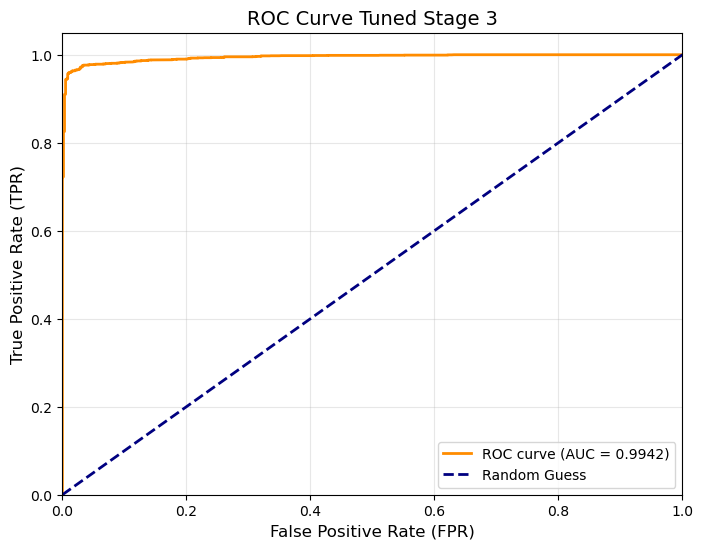

In [285]:
# @tittle Testing the model
# Calculate ROC curve
y_pred_proba_best_param_s3 = xg_model_best_param_s3.predict_proba(X_test_s3)[:, 1]  # Probabilities for AUC using test set
fpr, tpr, thresholds = roc_curve(y_test_s3, y_pred_proba_best_param_s3) # Use TEST set for final evaluation
roc_auc_best_param_s3 = auc(fpr, tpr)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {roc_auc_best_param_s3:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve Tuned Stage 3', fontsize=14)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()


### Comparison Models

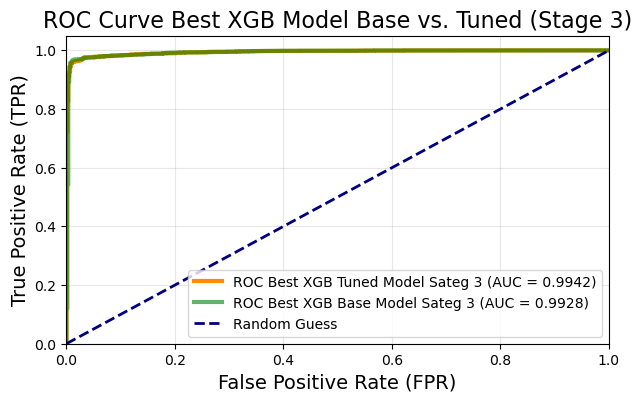

In [335]:

# Calculate ROC curve and AUC for the Base Model
y_pred_proba_base_s3 = xg_model_no_tunning_s3.predict_proba(X_test_s3)[:, 1]  # Probabilities for AUC using test set
fpr_base, tpr_base, thresholds_base = roc_curve(y_test_s3, y_pred_proba_base_s3) # Use TEST set for final evaluation
roc_auc_base_s3 = auc(fpr_base, tpr_base)

 # Calculate ROC curve and AUC for the Tuned Model
y_pred_proba_tuned_s3 = xg_model_best_param_s3.predict_proba(X_test_s3)[:, 1]  # Probabilities for AUC using test set
fpr_tuned, tpr_tuned, thresholds = roc_curve(y_test_s3, y_pred_proba_tuned_s3) # Use TEST set for final evaluation
roc_auc_tuned_s3 = auc(fpr_tuned, tpr_tuned)


# --- Plotting ---
plt.figure(figsize=(7, 4))

# Plot the Tuned Model's ROC Curve
plt.plot(fpr_tuned, tpr_tuned, color='darkorange', lw=3, alpha=1,
            label=f'ROC Best XGB Tuned Model Sateg 3 (AUC = {roc_auc_tuned_s3:.4f})')

# Plot the No Tuning Model's ROC Curve
plt.plot(fpr_base, tpr_base, color='green', lw=3, alpha=0.6,
            label=f'ROC Best XGB Base Model Sateg 3 (AUC = {roc_auc_base_s3:.4f})')

# Plot the Random Guess line
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')

# --- Formatting the Plot ---
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=14)
plt.ylabel('True Positive Rate (TPR)', fontsize=14)
plt.title('ROC Curve Best XGB Model Base vs. Tuned (Stage 3)', fontsize=16)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()





In [178]:
# For Untuned Model
precision_0_no_tuning_s3 = precision_score(y_val_s3, predictions_no_tunning_s3, average='binary', pos_label=0)
recall_0_no_tuning_s3 = recall_score(y_val_s3, predictions_no_tunning_s3, average='binary', pos_label=0)
f1_0_no_tuning_s3 = f1_score(y_val_s3, predictions_no_tunning_s3, average='binary', pos_label=0)

# For class 1 (Completed Course)
precision_1_no_tuning_s3 = precision_score(y_val_s3, predictions_no_tunning_s3, average='binary', pos_label=1) 
recall_1_no_tuning_s3 = recall_score(y_val_s3, predictions_no_tunning_s3, average='binary', pos_label=1)
f1_1_no_tuning_s3 = f1_score(y_val_s3, predictions_no_tunning_s3, average='binary', pos_label=1)

# Overall metrics for untuned model
accuracy_no_tuning_s3 = accuracy_score(y_val_s3, predictions_no_tunning_s3)
macro_precision_no_tuning_s3 = precision_score(y_val_s3, predictions_no_tunning_s3, average='macro')
macro_recall_no_tuning_s3 = recall_score(y_val_s3, predictions_no_tunning_s3, average='macro')
macro_f1_no_tuning_s3 = f1_score(y_val_s3, predictions_no_tunning_s3, average='macro')

roc_auc_no_tunning_s3 # Predictions probabilities for AUC were calculated earlier

# For Tuned Model
precision_0_best_param_s3 = precision_score(y_val_s3, predictions_best_param_s3, average='binary', pos_label=0)
recall_0_best_param_s3 = recall_score(y_val_s3, predictions_best_param_s3, average='binary', pos_label=0)
f1_0_best_param_s3 = f1_score(y_val_s3, predictions_best_param_s3, average='binary', pos_label=0)

# For class 1 (Completed Course)
precision_1_best_param_s3 = precision_score(y_val_s3, predictions_best_param_s3, average='binary', pos_label=1)
recall_1_best_param_s3 = recall_score(y_val_s3, predictions_best_param_s3, average='binary', pos_label=1)
f1_1_best_param_s3 = f1_score(y_val_s3, predictions_best_param_s3, average='binary', pos_label=1)

# Overall metrics for tuned model
accuracy_best_param_s3 = accuracy_score(y_val_s3, predictions_best_param_s3)
macro_precision_best_param_s3 = precision_score(y_val_s3, predictions_best_param_s3, average='macro')
macro_recall_best_param_s3 = recall_score(y_val_s3, predictions_best_param_s3, average='macro')
macro_f1_best_param_s3 = f1_score(y_val_s3, predictions_best_param_s3, average='macro')

roc_auc_best_param_s3 # Predictions probabilities for AUC were calculated earlier

# Update results_df
results_df_s3 = pd.DataFrame({
    'Model': ['Without Tuning', 'Best Parameters'],
    'Accuracy': [accuracy_no_tuning_s3, accuracy_best_param_s3],
    'ROC AUC': [roc_auc_no_tunning_s3, roc_auc_best_param_s3],
    'Precision (Class 0)': [precision_0_no_tuning_s3, precision_0_best_param_s3],
    'Recall (Class 0)': [recall_0_no_tuning_s3, recall_0_best_param_s3],
    'F1 Score (Class 0)': [f1_0_no_tuning_s3, f1_0_best_param_s3],
    'Precision (Class 1)': [precision_1_no_tuning_s3, precision_1_best_param_s3],
    'Recall (Class 1)': [recall_1_no_tuning_s3, recall_1_best_param_s3],
    'F1 Score (Class 1)': [f1_1_no_tuning_s3, f1_1_best_param_s3],
    'Macro Precision': [macro_precision_no_tuning_s3, macro_precision_best_param_s3],
    'Macro Recall': [macro_recall_no_tuning_s3, macro_recall_best_param_s3],
    'Macro F1': [macro_f1_no_tuning_s3, macro_f1_best_param_s3]
})

# Display the results
display(results_df_s3.reset_index(drop=True))

,Model,Accuracy,ROC AUC,Precision (Class 0),Recall (Class 0),F1 Score (Class 0),Precision (Class 1),Recall (Class 1),F1 Score (Class 1),Macro Precision,Macro Recall,Macro F1
0,Without Tuning,0.971032,0.992813,0.893387,0.910591,0.901907,0.984634,0.981385,0.983007,0.939010,0.945988,0.942457
1,Best Parameters,0.971233,0.994196,0.889333,0.917469,0.903182,0.985785,0.980443,0.983107,0.937559,0.948956,0.943145


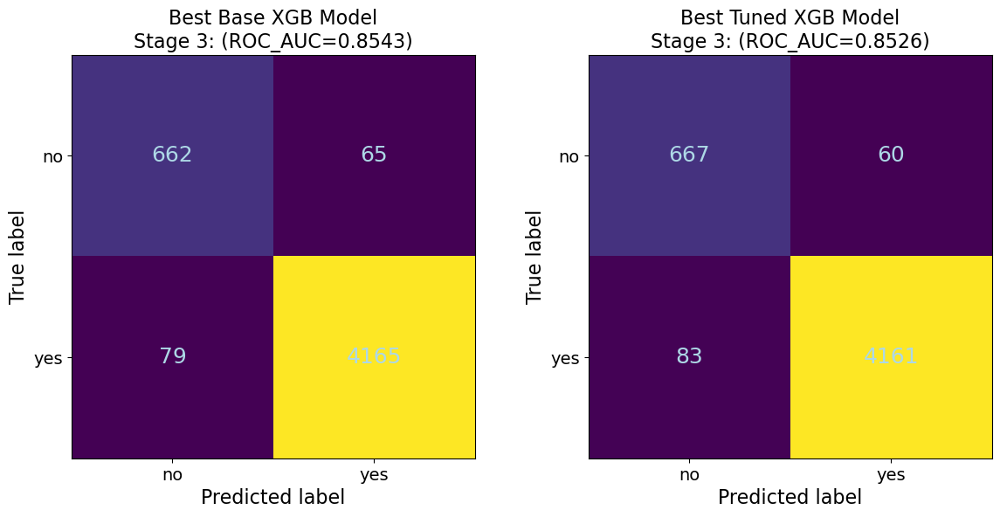

In [259]:
# Comparison Confusion Matrix
# Compute confusion matrices
cm_comparison = confusion_matrix(y_val_s3, predictions_no_tunning_s3)
cm_comparison_best_param = confusion_matrix(y_val_s3, predictions_best_param_s3)

# Create display objects
disp_comparison = ConfusionMatrixDisplay(confusion_matrix=cm_comparison, display_labels=["no", "yes"])
disp_best_param = ConfusionMatrixDisplay(confusion_matrix=cm_comparison_best_param, display_labels=["no", "yes"])

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot confusion matrices
disp_comparison.plot(ax=axes[0], colorbar=False)
disp_best_param.plot(ax=axes[1], colorbar=False)

# Set titles with ROC_AUC info
axes[0].set_title(f"Best Base XGB Model\nStage 3: (ROC_AUC={best_base['roc_auc']:.4f})", fontsize=16)
axes[1].set_title(f"Best Tuned XGB Model\nStage 3: (ROC_AUC={best_tuning['roc_auc']:.4f})", fontsize=16)

# Set axis labels with font size
axes[0].set_xlabel('Predicted label', fontsize=16)
axes[0].set_ylabel('True label', fontsize=16)
axes[1].set_xlabel('Predicted label', fontsize=16)
axes[1].set_ylabel('True label', fontsize=16)

# Remove grid lines
axes[0].grid(False)
axes[1].grid(False)

# Customize tick labels and cell fonts
for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=14)
    for text in ax.texts:
        text.set_fontsize(18)
        text.set_color('lightblue')
        
plt.subplots_adjust(wspace=0.2, hspace=0.3)

plt.show()

### Comments

- Excellent performance of the models with the new data set. Get positive effect of the new feature RateModuleSuccess.
- The hyperparameter tuning has a modest effect on model performance compared to the default XGBoost configuration.
- The untuned model performs slightly worst in ROC-AUC (0.992813 vs 0.994196). However the differences with the best tuned model are negligible.
- Both models performed extremely well. More importantly, the improvement in performance is excellent for the negative class wich was a problem during stage 1 and 2.

### Shapley Analysis for Untuned Model

In [180]:
def shap_analysis(model, X, sample_size=1000, random_state=42):
    """Compute SHAP values with robust sampling and checks."""
    if len(X) == 0:
        raise ValueError("Input X is empty")
    
    explainer = shap.TreeExplainer(model)
    sample_size = min(max(sample_size, 10), len(X))  # Clamp sample_size
    
    if isinstance(X, pd.DataFrame):
        X_sample = X.sample(n=sample_size, random_state=random_state)
    else:
        X_sample = X[np.random.choice(len(X), size=sample_size, replace=False)]
    
    shap_values = explainer(X_sample)
    return shap_values, X_sample, explainer.expected_value



# Usage (training set is correct here)
shap_values_base_s3, X_sample_base_s3, expected_value_base_s3 = shap_analysis(xg_model_no_tunning_s3, X_train_s3)

# Find most surprising prediction (normalized)
shap_deviations_base_s3 = np.abs(shap_values_base_s3.values - expected_value_base_s3).sum(axis=1) / (np.abs(expected_value_base_s3) + 1e-9)
surprising_idx_base_s3 = np.argmax(shap_deviations_base_s3)

print(f"Most surprising observation (index {surprising_idx_base_s3}):")
print(f"  Deviation: {shap_deviations_base_s3[surprising_idx_base_s3]:.2%}")
print(f"  Features:\n{X_sample_base_s3.iloc[surprising_idx_base_s3]}")

Most surprising observation (index 505):
  Deviation: 24484.30%
  Features:
CourseLevel                                                             3.0
Age                                                                    27.0
Unauthorised_Absence_Ordinal                                            1.0
Autorised_Absence_Ordinal                                               1.0
RateModuleSuccess                                                       0.0
                                                                       ... 
ProgressionUniversity_University of Sheffield International College     0.0
ProgressionUniversity_University of Strathclyde                         0.0
ProgressionUniversity_University of Surrey                              0.0
ProgressionUniversity_University of Sussex                              0.0
ProgressionUniversity_VU Amsterdam                                      0.0
Name: 12669, Length: 241, dtype: float64


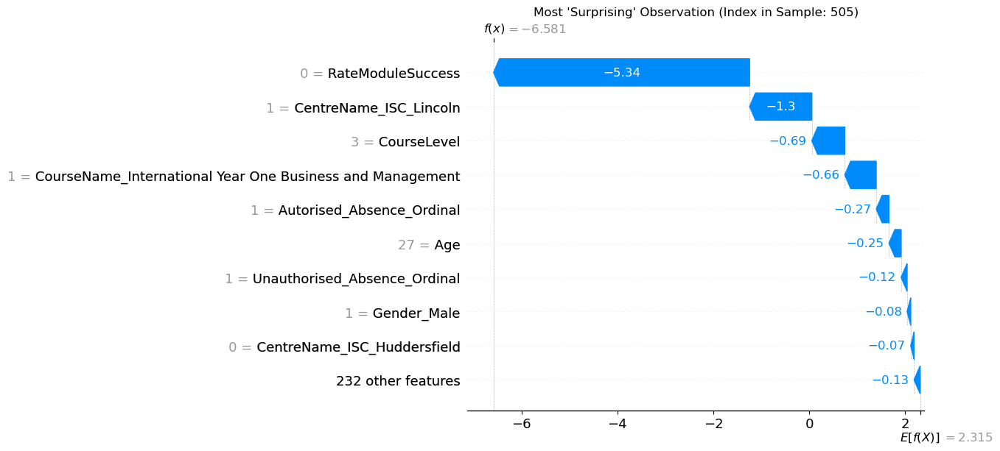

In [181]:
#Identifies the observation where the SHAP values deviate most from the expected value.
shap.plots.waterfall(shap_values_base_s3[surprising_idx_base_s3], show=False)
plt.title(f"Most 'Surprising' Observation (Index in Sample: {surprising_idx_base_s3})")
plt.show()

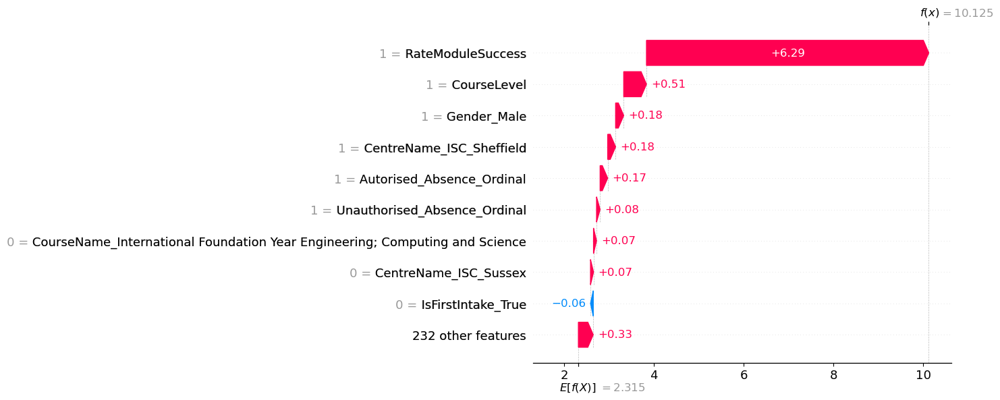

In [182]:
# Identifies the observation with the maximum predicted value from the model.
high_pred_idx_base_s3 = np.argmax(xg_model_no_tunning_s3.predict(X_train_s3))
explainer = shap.TreeExplainer(xg_model_no_tunning_s3)
shap_high_pred_base_s3 = explainer(X_train_s3.iloc[high_pred_idx_base_s3:high_pred_idx_base_s3+1])
shap.plots.waterfall(shap_high_pred_base_s3[0])

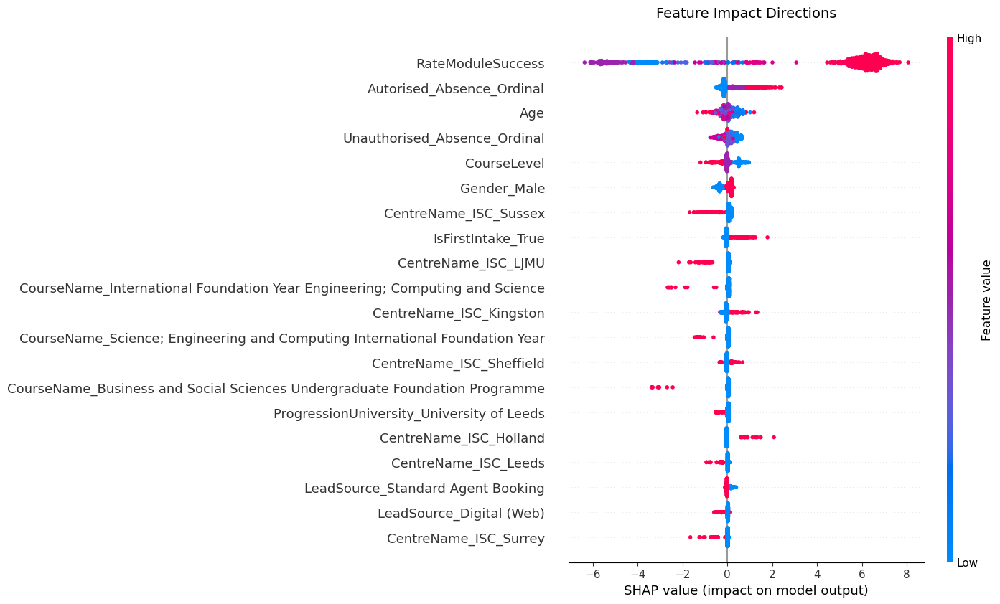

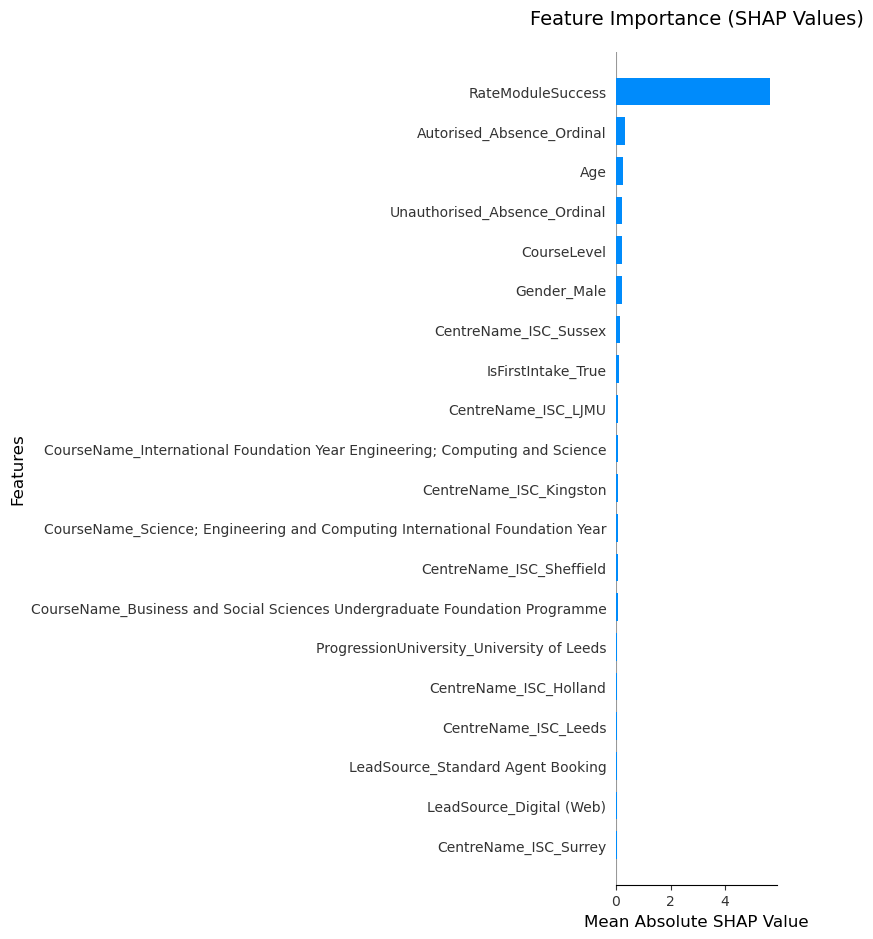

In [183]:
# Get SHAP values (unpack ALL return values)
shap_values_base_s3, X_sample_base_s3, expected_value_base_s3 = shap_analysis(
    xg_model_no_tunning_s3, 
    X_train_s3, 
    sample_size=1000, 
    random_state=42
)

# --------------------------------------------------
# 1. Feature Impact Directions (Beeswarm Plot)
# --------------------------------------------------
plt.close('all')  # Clear previous plots
shap.summary_plot(
    shap_values_base_s3,  # Use full Explanation object
    X_sample_base_s3,     # Sampled features
    show=False
)
plt.title("Feature Impact Directions", fontsize=14, pad=20)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 2. Feature Importance (Bar Plot)
# --------------------------------------------------
plt.close('all')  # Clear previous plots for consistency
plt.figure(figsize=(10, 6))
shap.summary_plot(
    shap_values_base_s3, 
    X_sample_base_s3, 
    plot_type="bar", 
    show=False
)
plt.title("Feature Importance (SHAP Values)", fontsize=14, pad=20)
plt.xlabel("Mean Absolute SHAP Value", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


### Shapley Analysis for Best Parameter Model

In [184]:
# Get SHAP values for the best parameter model
def shap_analysis(model, X, sample_size=1000, random_state=42):
    """Compute SHAP values with robust sampling and checks."""
    if len(X) == 0:
        raise ValueError("Input X is empty")
    
    explainer = shap.TreeExplainer(model)
    sample_size = min(max(sample_size, 10), len(X))  # Clamp sample_size
    
    if isinstance(X, pd.DataFrame):
        X_sample = X.sample(n=sample_size, random_state=random_state)
    else:
        X_sample = X[np.random.choice(len(X), size=sample_size, replace=False)]
    
    shap_values = explainer(X_sample)
    return shap_values, X_sample, explainer.expected_value



# Usage (training set is correct here)
shap_values_best_param_s3, X_sample_best_param_s3, expected_value_best_param_s3 = shap_analysis(xg_model_best_param_s3, X_train_s3)

# Find most surprising prediction (normalized)
shap_deviations_best_param_s3 = np.abs(shap_values_best_param_s3.values - expected_value_best_param_s3).sum(axis=1) / (np.abs(expected_value_best_param_s3) + 1e-9)
surprising_idx_best_param_s3 = np.argmax(shap_deviations_best_param_s3)

print(f"Most surprising observation (index {surprising_idx_best_param_s3}):")
print(f"  Deviation: {shap_deviations_best_param_s3[surprising_idx_best_param_s3]:.2%}")
print(f"  Features:\n{X_sample_best_param_s3.iloc[surprising_idx_best_param_s3]}")

Most surprising observation (index 505):
  Deviation: 24433.55%
  Features:
CourseLevel                                                             3.0
Age                                                                    27.0
Unauthorised_Absence_Ordinal                                            1.0
Autorised_Absence_Ordinal                                               1.0
RateModuleSuccess                                                       0.0
                                                                       ... 
ProgressionUniversity_University of Sheffield International College     0.0
ProgressionUniversity_University of Strathclyde                         0.0
ProgressionUniversity_University of Surrey                              0.0
ProgressionUniversity_University of Sussex                              0.0
ProgressionUniversity_VU Amsterdam                                      0.0
Name: 12669, Length: 241, dtype: float64


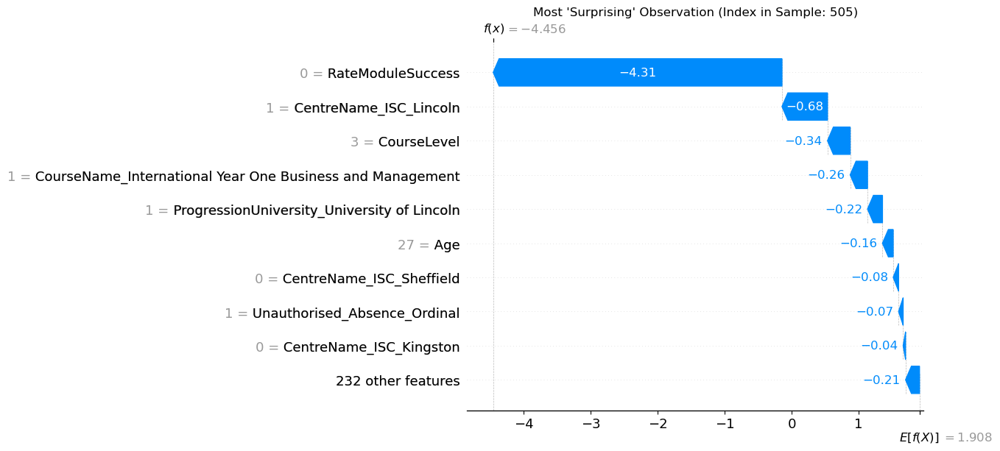

In [185]:
# Identifies the observation where the SHAP values deviate most from the expected value.
shap.plots.waterfall(shap_values_best_param_s3[surprising_idx_best_param_s3], show=False)
plt.title(f"Most 'Surprising' Observation (Index in Sample: {surprising_idx_best_param_s3})")
plt.show()

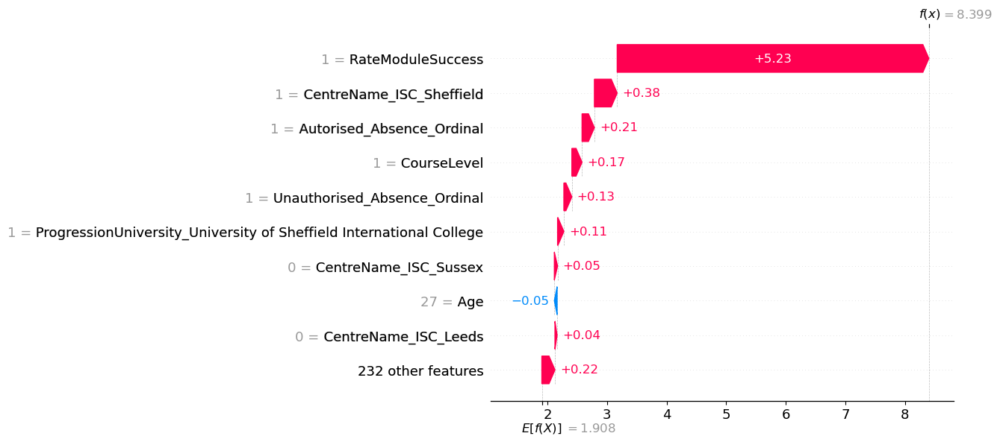

In [186]:
# Identifies the observation with the maximum predicted value from the model.
high_pred_idx_best_param_s3 = np.argmax(xg_model_best_param_s3.predict(X_train_s3))
explainer = shap.TreeExplainer(xg_model_best_param_s3)
shap_high_pred_best_param_s3 = explainer(X_train_s3.iloc[high_pred_idx_best_param_s3:high_pred_idx_best_param_s3+1])
shap.plots.waterfall(shap_high_pred_best_param_s3[0])

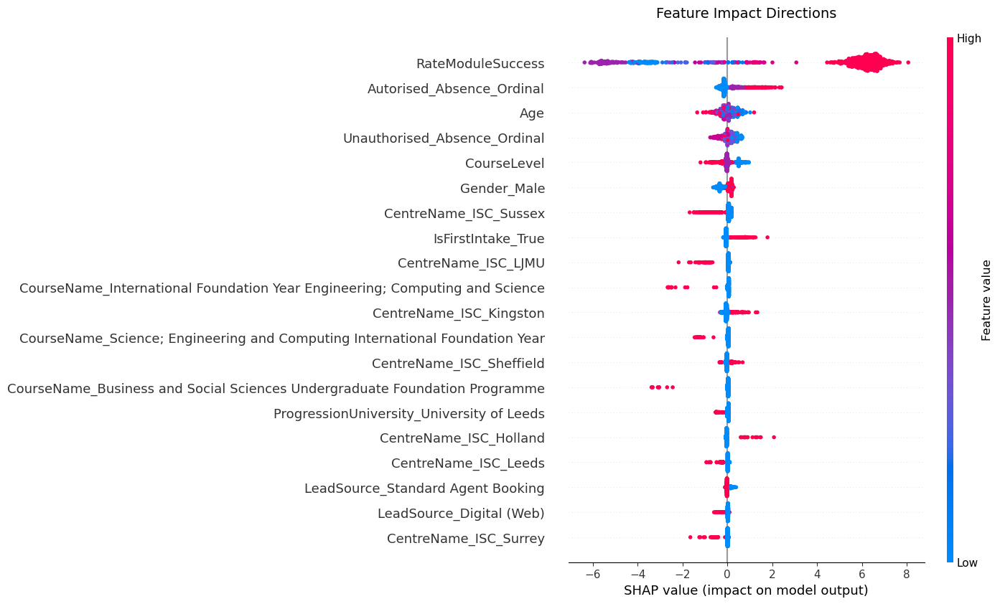

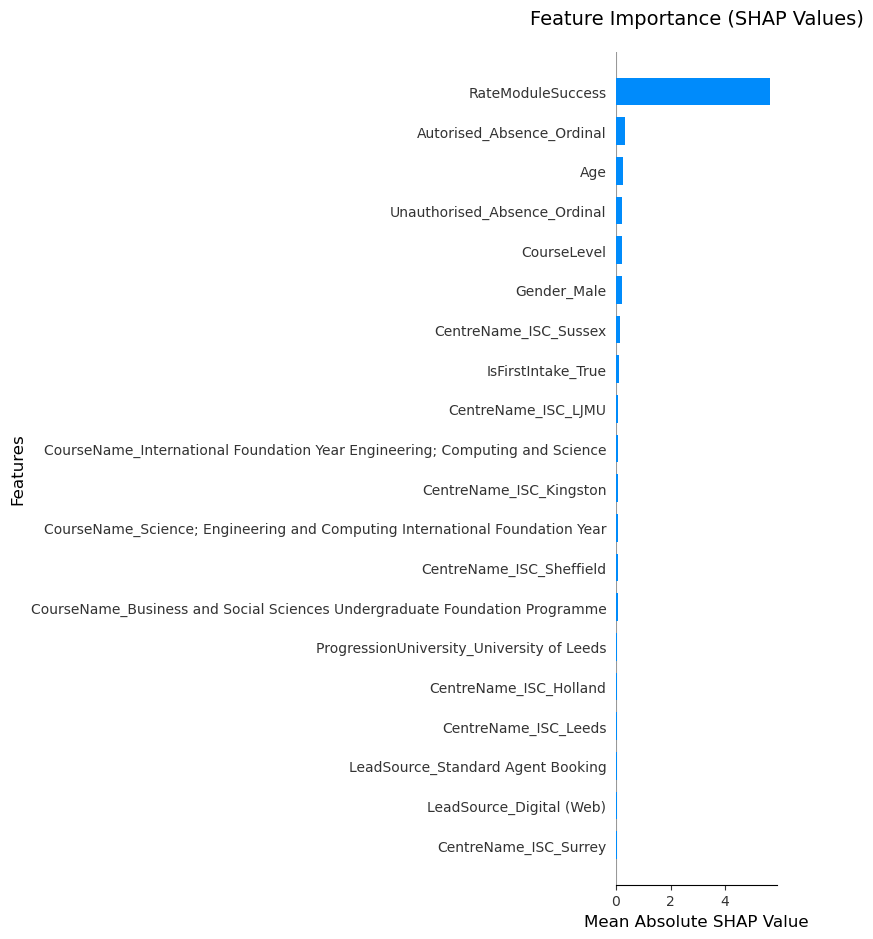

In [187]:
# Get SHAP values (unpack ALL return values)
shap_values_best_param_s3, X_sample_best_param_s3, expected_value_best_param_s3 = shap_analysis(
    xg_model_best_param_s3, 
    X_train_s3, 
    sample_size=1000, 
    random_state=42
)

# --------------------------------------------------
# 1. Feature Impact Directions (Beeswarm Plot)
# --------------------------------------------------
plt.close('all')  # Clear previous plots
shap.summary_plot(
    shap_values_base_s3,  # Use full Explanation object
    X_sample_base_s3,     # Sampled features
    show=False
)
plt.title("Feature Impact Directions", fontsize=14, pad=20)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 2. Feature Importance (Bar Plot)
# --------------------------------------------------
plt.close('all')  # Clear previous plots for consistency
plt.figure(figsize=(10, 6))
shap.summary_plot(
    shap_values_base_s3, 
    X_sample_base_s3, 
    plot_type="bar", 
    show=False
)
plt.title("Feature Importance (SHAP Values)", fontsize=14, pad=20)
plt.xlabel("Mean Absolute SHAP Value", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

#### Comments

1. Dominant Feature Effect

Problem: One feature's SHAP values are orders of magnitude larger than others.
Why it happens:
The dominant feature has such strong predictive power that other features' effects become negligible in comparison.
SHAP scales the y-axis to accommodate the dominant feature, squashing others into a flat line.

2. Categorical/Binary Features with Limited Values

Problem: If most features are binary (0/1) or categorical, their SHAP values cluster at discrete positions.
Visual Effect: Points stack vertically because many samples have identical SHAP values for low-importance features.

3. Model or Data Issues

Possible Causes:
Overfitting: The model relies too heavily on one feature.
Collinearity: Features are highly correlated, causing SHAP to attribute importance arbitrarily.
Zero Variance: Some features may have no predictive power (check with X.std()).


If one dominant feature is driving your model's predictions while test performance remains excellent, it’s not necessarily a problem—but it warrants careful consideration. Here’s how to assess whether this is acceptable or risky:

When It’s NOT a Problem

The Dominant Feature is Causally Relevant
Example: In a medical diagnosis model, a binary feature like Tested_Positive_for_Disease should dominate.
Action: Validate with domain experts to confirm the feature’s real-world importance.
Your Goal is Pure Prediction (Not Inference)
If you only care about accuracy (e.g., recommendation systems), and the model generalizes well to the test set, the dominance may be fine.
Action: Monitor performance over time to detect drift in the dominant feature’s relationship.
The Feature is Redundant with Others
SHAP might arbitrarily assign importance to one correlated feature (e.g., Age vs. Yearly_Income in credit scoring).
Action: Check correlations (df.corr())—if the dominant feature is a proxy for others, it’s explainable.
When It IS a Problem

Data Leakage
The dominant feature may leak information about the target (e.g., including Future_Revenue to predict Current_Profit).
Test: Remove the feature and see if performance drops drastically. If not, it was likely a leak.
Overfitting to Noise
Even with good test performance, the model may be exploiting spurious patterns (e.g., a unique ID field dominating predictions).
Test: Use adversarial validation—train a model to distinguish train/test sets. If it succeeds, your data is non-stationary.
Deployment Risks
If the dominant feature is unstable (e.g., User_IP_Address in a churn model), the model may fail in production.
Action: Stress-test with synthetic data where the dominant feature is perturbed.

# Defining a Neural Network for the dropout prediction: Stage 3

In [188]:
# Bringing in data use for XGBoost
print(f'X_train: {X_train_s3.shape}')
print(f'X_val: {X_val_s3.shape}')
print(f'X_test: {X_test_s3.shape}')
print(f'y_train: {y_train_s3.shape}')
print(f'y_val: {y_val_s3.shape}')
print(f'y_test: {y_test_s3.shape}')


X_train: (15904, 241)
X_val: (4971, 241)
X_test: (3976, 241)
y_train: (15904,)
y_val: (4971,)
y_test: (3976,)


In [189]:
# Scale the data S3
scaler = StandardScaler()
X_train_scaled_s3 = scaler.fit_transform(X_train_s3)
X_val_scaled_s3 = scaler.transform(X_val_s3)
X_test_scaled_s3 = scaler.transform(X_test_s3)

In [190]:
# Check for NaN/inf values that might have been imputed incorrectly
print("NaN values X_train_s3:", np.isnan(X_train_scaled_s3).sum())
print("Inf values X_train_s3:", np.isinf(X_train_scaled_s3).sum())

print("NaN values X_val_s3:", np.isnan(X_val_scaled_s3).sum())
print("Inf values X_val_s3:", np.isinf(X_val_scaled_s3).sum())

print("NaN values X_test_s3:", np.isnan(X_test_scaled_s3).sum())
print("Inf values X_test_s3:", np.isinf(X_test_scaled_s3).sum())

# Check if all samples are identical
unique_samples_s3 = np.unique(X_train_scaled_s3, axis=0).shape[0]
print(f"Unique samples X_train_s3: {unique_samples_s3} out of {X_train_scaled_s3.shape[0]}")

unique_samples_val_s3 = np.unique(X_val_scaled_s3, axis=0).shape[0]
print(f"Unique samples X_val_s3: {unique_samples_val_s3} out of {X_val_scaled_s3.shape[0]}")

unique_samples_test_s3 = np.unique(X_test_scaled_s3, axis=0).shape[0]
print(f"Unique samples X_test_s3: {unique_samples_test_s3} out of {X_test_scaled_s3.shape[0]}")


NaN values X_train_s3: 0
Inf values X_train_s3: 0
NaN values X_val_s3: 0
Inf values X_val_s3: 0
NaN values X_test_s3: 0
Inf values X_test_s3: 0
Unique samples X_train_s3: 9031 out of 15904
Unique samples X_val_s3: 3644 out of 4971
Unique samples X_test_s3: 2966 out of 3976


### Construct Neural Network with Different Number of Hidden Layers and same Number of Neurons

In [ ]:
# Define Baseline Model
# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed=42):
    """
    Enable 100% reproducibility on operations related to tensor and randomness.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    
    # Configure TensorFlow for determinism
    tf.config.experimental.enable_op_determinism()

# Call this at the very beginning of your script
set_global_determinism(42)

# Define Baseline Model with seed reset
def create_model(input_dim, output_dim, layers=2, units=128, dropout=0.2, lr=0.001, seed=42):
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    model.compile(optimizer=Adam(learning_rate=lr),
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Training setup with deterministic seeds
def train_models_deterministic(architecture_configs, X_train, y_train, X_val, y_val):
    models_base_s3 = []
    histories_base_s3 = []
    
    for i, config in enumerate(architecture_configs):
        print(f"\nTraining Model {i+1}: {config}")
        
        # Set unique but deterministic seed for each model
        model_seed = 42 + i
        set_global_determinism(model_seed)
        
        # Clear session
        tf.keras.backend.clear_session()
        gc.collect()
        
        # Create model with specific seed
        model = create_model(input_dim, output_dim, seed=model_seed, **config)
        
        # Early stopping
        early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                                 restore_best_weights=True)
        
        # Train with deterministic batch shuffling
        history = model.fit(X_train, y_train,
                          validation_data=(X_val, y_val),
                          batch_size=32,
                          epochs=50,
                          callbacks=[early_stop],
                          shuffle=True,  # This will be deterministic due to seed
                          verbose=0)
        
        # Evaluate
        train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
        val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
        
        # Store results
        models_base_s3.append(model)
        histories_base_s3.append({
            "config": config,
            "train_loss": train_loss,
            "train_accuracy": train_accuracy,
            "val_loss": val_loss,
            "val_accuracy": val_acc,
            "history": history,
            "seed": model_seed
        })
        
        print(f"Final validation accuracy: {val_acc:.4f}")
        gc.collect()
    
    return models_base_s3, histories_base_s3

# Usage
set_global_determinism(42)  # Set at the beginning

# Get dimensions
input_dim = X_train_scaled_s3.shape[1]
output_dim = len(np.unique(y_train_s3))

# Architecture configurations
architecture_configs = [
    {"layers": 1, "units": 16},
    {"layers": 1, "units": 32},
    {"layers": 1, "units": 64},
    {"layers": 2, "units": 16},
    {"layers": 2, "units": 32},
    {"layers": 2, "units": 64},
    {"layers": 3, "units": 16},
    {"layers": 3, "units": 32},
    {"layers": 3, "units": 64}
]

# Train models deterministically
models_base_s3, histories_base_s3 = train_models_deterministic(architecture_configs, X_train_scaled_s3, y_train_s3, X_val_scaled_s3, y_val_s3)
print(f'Model: models_base_s3, History:histories_base_s3')


Training Model 1: {'layers': 1, 'units': 16}
Final validation accuracy: 0.9437

Training Model 2: {'layers': 1, 'units': 32}
Final validation accuracy: 0.9433

Training Model 3: {'layers': 1, 'units': 64}
Final validation accuracy: 0.9429

Training Model 4: {'layers': 2, 'units': 16}
Final validation accuracy: 0.9423

Training Model 5: {'layers': 2, 'units': 32}
Final validation accuracy: 0.9465

Training Model 6: {'layers': 2, 'units': 64}
Final validation accuracy: 0.9431

Training Model 7: {'layers': 3, 'units': 16}
Final validation accuracy: 0.9384

Training Model 8: {'layers': 3, 'units': 32}
Final validation accuracy: 0.9427

Training Model 9: {'layers': 3, 'units': 64}
Final validation accuracy: 0.9386
Model: models_base_s3, History:histories_base_s3


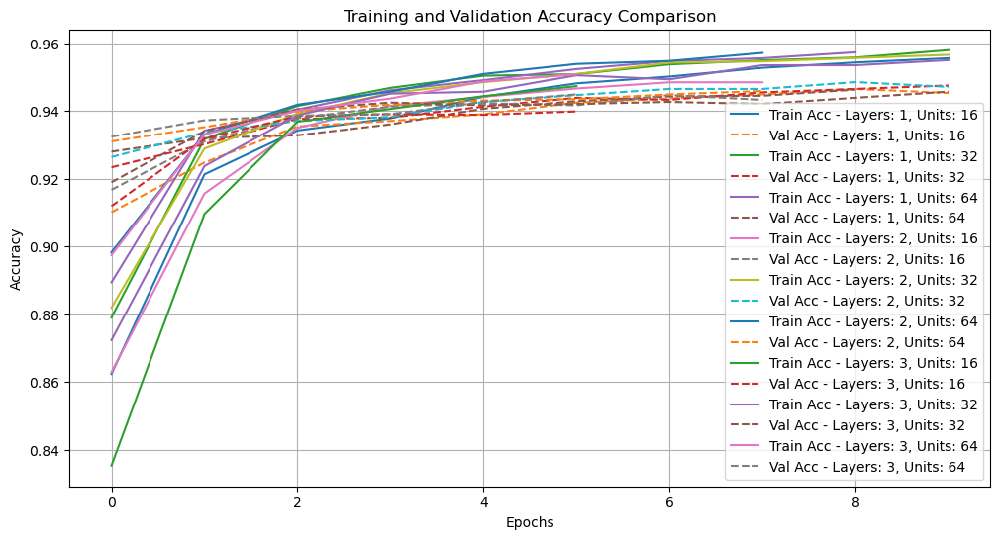

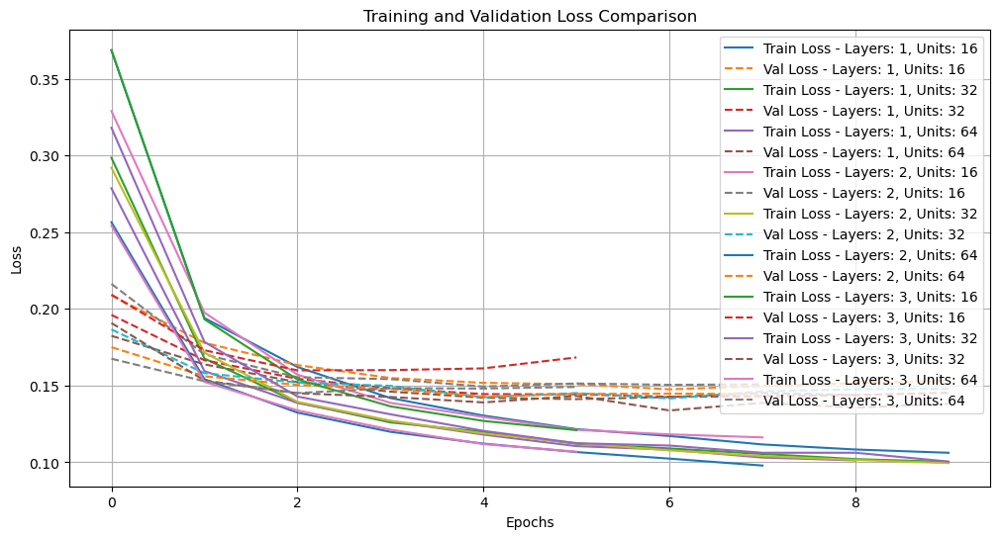


Model Performance Summary:
Model 1 - 1 layers, 16 units:
  Validation Accuracy: 0.9437
  Final Epochs: 10

Model 2 - 1 layers, 32 units:
  Validation Accuracy: 0.9433
  Final Epochs: 10

Model 3 - 1 layers, 64 units:
  Validation Accuracy: 0.9429
  Final Epochs: 9

Model 4 - 2 layers, 16 units:
  Validation Accuracy: 0.9423
  Final Epochs: 8

Model 5 - 2 layers, 32 units:
  Validation Accuracy: 0.9465
  Final Epochs: 10

Model 6 - 2 layers, 64 units:
  Validation Accuracy: 0.9431
  Final Epochs: 8

Model 7 - 3 layers, 16 units:
  Validation Accuracy: 0.9384
  Final Epochs: 6

Model 8 - 3 layers, 32 units:
  Validation Accuracy: 0.9427
  Final Epochs: 10

Model 9 - 3 layers, 64 units:
  Validation Accuracy: 0.9386
  Final Epochs: 6



In [309]:
# Plot train/validation accuracy.

plt.figure(figsize=(12, 6))
for i, result in enumerate(histories_base_s3):
    config = result['config']
    config_str = f"Layers: {config['layers']}, Units: {config['units']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot train/validation loss
plt.figure(figsize=(12, 6))
for i, result in enumerate(histories_base_s3):
    config = result['config']
    config_str = f"Layers: {config['layers']}, Units: {config['units']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

plt.title('Training and Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


# Print numerical summary
print("\nModel Performance Summary:")
print("=" * 60)
for i, result in enumerate(histories_base_s3):
    config = result['config']
    print(f"Model {i+1} - {config['layers']} layers, {config['units']} units:")
    print(f"  Validation Accuracy: {result['val_accuracy']:.4f}")
    print(f"  Final Epochs: {len(result['history'].history['loss'])}")
    print()

In [310]:
# @tittle Model Evaluation

# --- Evaluation Function ---
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def evaluate_trained_models(models, hist_metrics, X_test, y_test, 
                           class_names=None, verbose=True, return_curves=False):
    """
    Comprehensive model evaluation function optimized for imbalanced datasets
    
    Parameters:
    -----------
    models : list
        List of trained Keras models
    hist_metrics : list
        List of training history and config data
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    class_names : list, optional
        Names of classes for better reporting
    verbose : bool
        Print detailed results
    return_curves : bool
        Whether to return ROC and PR curve data
    
    Returns:
    --------
    results : list
        Comprehensive evaluation results for each model
    """
    
    # Set seeds for reproducible evaluation
    np.random.seed(42)
    
    results_base_s3 = []
    n_classes = len(np.unique(y_test))
    is_binary = n_classes == 2
    
    if verbose:
        print("="*80)
        print(f"EVALUATING {len(models)} MODELS ON TEST SET")
        print(f"Dataset: {len(y_test)} samples, {n_classes} classes")
        if is_binary:
            class_dist = np.bincount(y_test)
            print(f"Class distribution: {class_dist[0]}:{class_dist[1]} ({class_dist[1]/len(y_test)*100:.1f}% positive)")
        print("="*80)
    
    for i, (model, history_data) in enumerate(zip(models, hist_metrics)):
        config = history_data['config']
        model_name = f"Model_{i+1}_{config['layers']}L_{config['units']}U"
        
        if verbose:
            print(f"\n{model_name}")
            print("-" * 50)
        
        try:
            # Get predictions - CONSISTENT APPROACH
            y_pred_prob = model.predict(X_test, verbose=0)
            
            # FIXED: Consistent probability extraction
            if y_pred_prob.shape[1] > 1:  # Multi-class output
                y_pred_class = np.argmax(y_pred_prob, axis=1)
                if is_binary:
                    # For binary classification, use probability of positive class (class 1)
                    y_prob_positive = y_pred_prob[:, 1]
                else:
                    y_prob_positive = y_pred_prob  # Keep all probabilities for multi-class
            else:  # Single output (sigmoid activation)
                y_pred_prob = y_pred_prob.flatten()
                y_pred_class = (y_pred_prob > 0.5).astype(int)
                y_prob_positive = y_pred_prob
            
            # Basic metrics
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            
            # Classification metrics
            if is_binary:
                # Binary classification metrics
                precision = precision_score(y_test, y_pred_class, zero_division=0)
                recall = recall_score(y_test, y_pred_class, zero_division=0)
                f1 = f1_score(y_test, y_pred_class, zero_division=0)
                
                # Class-specific metrics
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                # FIXED: Use consistent function for ROC-AUC calculation
                roc_auc = roc_auc_score(y_test, y_prob_positive)
                
                # Alternative calculation using roc_curve + auc (should match)
                fpr, tpr, _ = roc_curve(y_test, y_prob_positive)
                roc_auc_manual = auc(fpr, tpr)  # This should equal roc_auc
                
                pr_auc = average_precision_score(y_test, y_prob_positive)
                
                # Confusion matrix
                cm = confusion_matrix(y_test, y_pred_class)
                tn, fp, fn, tp = cm.ravel()
                
                # Additional metrics for imbalanced data
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
                balanced_accuracy = (sensitivity + specificity) / 2
                
                # Matthews Correlation Coefficient (good for imbalanced data)
                mcc_denom = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
                mcc = ((tp * tn) - (fp * fn)) / mcc_denom if mcc_denom != 0 else 0
                
            else:
                # Multi-class metrics
                precision = precision_score(y_test, y_pred_class, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred_class, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred_class, average='weighted', zero_division=0)
                
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                roc_auc = roc_auc_score(y_test, y_prob_positive, multi_class='ovr', average='weighted')
                pr_auc = average_precision_score(y_test, y_prob_positive, average='weighted')
                
                cm = confusion_matrix(y_test, y_pred_class)
                balanced_accuracy = recall  # For multi-class, weighted recall approximates balanced accuracy
                mcc = np.nan  # MCC is complex for multi-class
                specificity = np.nan
                sensitivity = recall
                roc_auc_manual = roc_auc  # For consistency
            
            # Store comprehensive results
            result = {
                # Model info
                'model_index': i,
                'model_name': model_name,
                'config': config,
                'layers': config['layers'],
                'units': config['units'],
                
                # Basic metrics
                'accuracy': test_accuracy,
                'loss': test_loss,
                'balanced_accuracy': balanced_accuracy,
                
                # Main classification metrics
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'roc_auc': roc_auc,
                'roc_auc_manual': roc_auc_manual,  # For verification
                'pr_auc': pr_auc,  # Better than ROC-AUC for imbalanced data
                
                # Per-class metrics
                'precision_per_class': precision_per_class,
                'recall_per_class': recall_per_class,
                'f1_per_class': f1_per_class,
                
                # Imbalanced data specific metrics
                'specificity': specificity,
                'sensitivity': sensitivity,
                'mcc': mcc,
                
                # Predictions and probabilities - STORED CONSISTENTLY
                'y_pred_prob': y_prob_positive,  # Always the positive class prob for binary
                'y_pred_prob_full': y_pred_prob,  # Full probability matrix
                'y_pred_class': y_pred_class,
                'confusion_matrix': cm,
                
                # Training history metrics
                'val_accuracy': history_data.get('val_accuracy', np.nan),
                'val_loss': history_data.get('val_loss', np.nan),
                'train_accuracy': history_data.get('train_accuracy', np.nan),
                'train_loss': history_data.get('train_loss', np.nan),
            }
            
            # Add curve data if requested
            if return_curves and is_binary:
                fpr, tpr, roc_thresholds = roc_curve(y_test, y_prob_positive)
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_prob_positive)
                
                result.update({
                    'roc_curve': {'fpr': fpr, 'tpr': tpr, 'thresholds': roc_thresholds},
                    'pr_curve': {'precision': precision_curve, 'recall': recall_curve, 'thresholds': pr_thresholds}
                })
            
            results_base_s3.append(result)
            
            # Verbose output
            if verbose:
                print(f"Core Metrics:")
                print(f"Accuracy: {test_accuracy:.4f} | Balanced Acc: {balanced_accuracy:.4f}")
                print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
                print(f"AUC Scores:")
                print(f" ROC-AUC: {roc_auc:.4f} | ROC-AUC (manual): {roc_auc_manual:.4f} | PR-AUC: {pr_auc:.4f}")
                
                if is_binary:
                    print(f"Imbalanced Metrics:")
                    print(f"Sensitivity: {sensitivity:.4f} | Specificity: {specificity:.4f}")
                    print(f"MCC: {mcc:.4f}")
                    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
                
                print(f"Training Performance:")
                print(f"   Train Loss: {history_data.get('train_loss', 'N/A'):.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'}")
                print(f"   Val Loss: {history_data.get('val_loss', 'N/A'):.4f if isinstance(history_data.get('val_loss'), (int, float)) else 'N/A'}")
                
        except Exception as e:
            print(f"Error evaluating {model_name}: {str(e)}")
            continue
    
    if verbose:
        print("\n" + "="*80)
        print("EVALUATION SUMMARY")
        print("="*80)
        
        # Create summary DataFrame
        summary_data_base_s3 = []
        for r in results_base_s3:
            summary_data_base_s3.append({
                'Model': r['model_name'],
                'ROC_AUC': r['roc_auc'],
                'ROC_AUC_Manual': r['roc_auc_manual'],
                'PR_AUC': r['pr_auc'],
                'F1': r['f1'],
                'Bal_Acc': r['balanced_accuracy'],
                'MCC': r.get('mcc', np.nan)
            })
        
        summary_df_base_s3 = pd.DataFrame(summary_data_base_s3)
        
        positive_ratio = np.mean(y_test)
        if positive_ratio < 0.4:  # Positives are minority
            sort_col = 'PR_AUC'   # Focus on positive class performance
        elif positive_ratio > 0.6:  # Positives are majority  
            sort_col = 'ROC_AUC' # Focus on negative class performance
        else:
            sort_col = 'ROC_AUC'
        
        # Sort by ROC-AUC (or PR-AUC for heavily imbalanced data)
        summary_df_base_s3 = summary_df_base_s3.sort_values(sort_col, ascending=False)
        
        print(summary_df_base_s3.round(4).to_string(index=False))
        print(f"\nBest model by {sort_col}: {summary_df_base_s3.iloc[0]['Model']}")
    
    return results_base_s3

# Basic usage
test_results_s3_base = evaluate_trained_models(models_base_s3, histories_base_s3, X_test_scaled_s3, y_test_s3)



EVALUATING 9 MODELS ON TEST SET
Dataset: 3976 samples, 2 classes
Class distribution: 586:3390 (85.3% positive)

Model_1_1L_16U
--------------------------------------------------
Core Metrics:
Accuracy: 0.9505 | Balanced Acc: 0.9166
Precision: 0.9770 | Recall: 0.9646 | F1: 0.9708
AUC Scores:
 ROC-AUC: 0.9814 | ROC-AUC (manual): 0.9814 | PR-AUC: 0.9968
Imbalanced Metrics:
Sensitivity: 0.9646 | Specificity: 0.8686
MCC: 0.8094
Confusion Matrix: TN=509, FP=77, FN=120, TP=3270
Training Performance:
Error evaluating Model_1_1L_16U: Invalid format specifier '.4f if isinstance(history_data.get('train_loss'), (int, float)) else 'N/A'' for object of type 'float'

Model_2_1L_32U
--------------------------------------------------
Core Metrics:
Accuracy: 0.9499 | Balanced Acc: 0.9212
Precision: 0.9790 | Recall: 0.9619 | F1: 0.9704
AUC Scores:
 ROC-AUC: 0.9830 | ROC-AUC (manual): 0.9830 | PR-AUC: 0.9971
Imbalanced Metrics:
Sensitivity: 0.9619 | Specificity: 0.8805
MCC: 0.8101
Confusion Matrix: TN=516

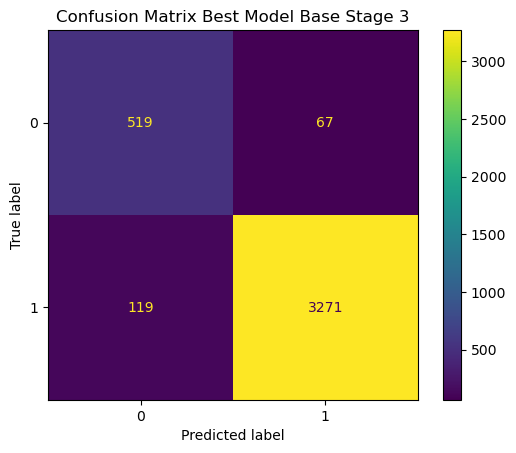

In [311]:
# Assuming test_results_s3_base is a list of dictionaries containing model results
for result in test_results_s3_base:
    # Check if this is the specific model we want
    if result.get('model_name') == 'Model_5_2L_32U' and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot()
        plt.title(f"Confusion Matrix Best Model Base Stage 3")
        plt.show()

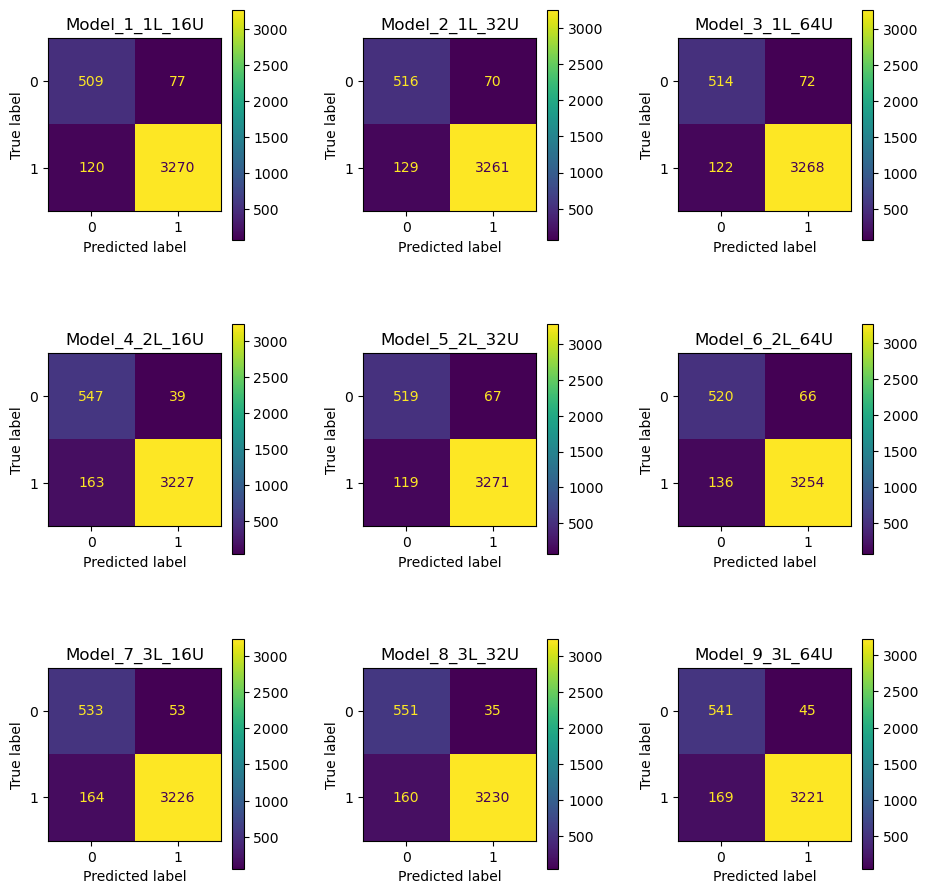

In [312]:
# Display all the Baseline Models Tested

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.tight_layout(pad=4.0)

# Flatten the axes array for easier iteration
axes = axes.ravel()

# Counter for the current subplot
plot_idx = 0

for result in test_results_s3_base:
    # Stop if we've filled all 9 subplots
    if plot_idx >= 9:
        break
        
    # Check if this is the specific model we want
    if result.get('model_name') and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot(ax=axes[plot_idx])
        axes[plot_idx].set_title(f"{result['model_name']}")
        plot_idx += 1

# Hide any remaining empty subplots
for i in range(plot_idx, 9):
    axes[i].axis('off')

plt.show()

In [313]:
# Sorting models based on best metric.
positive_ratio = np.mean(y_test_s3)
if positive_ratio < 0.5:  # Positives are minority
    sort_col = 'pr_auc'   # Focus on positive class performance
    print(f"Positive class is minority ({positive_ratio:.2%}), sorting by PR-AUC")
else:  # Positives are majority
    sort_col = 'roc_auc'  # Focus on overall performance
    print(f"Positive class is majority ({positive_ratio:.2%}), sorting by ROC-AUC")

sorted_auc_base_s3 = sorted(test_results_s3_base, key=lambda x: x.get(sort_col, 0), reverse=True)


Positive class is majority (85.26%), sorting by ROC-AUC


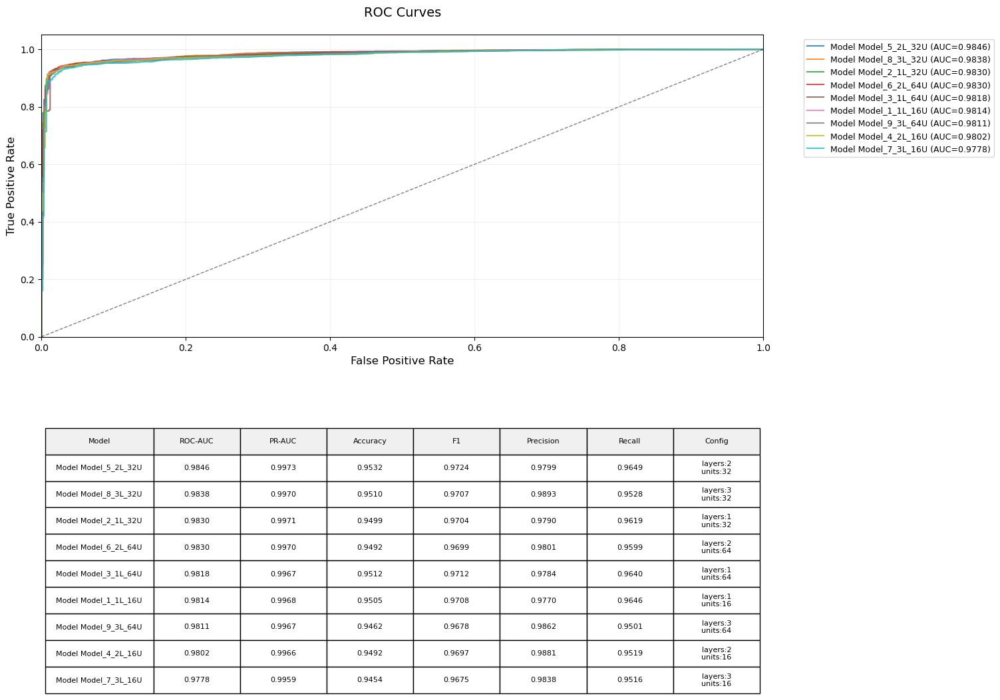

In [314]:
# @tittle ROC Curve for Learning Rate and Activation Function

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def plot_roc_curves(test_results, X_test=None, y_test=None):
    """
    Enhanced ROC curve visualization with model names in legend and table,
    including both ROC-AUC and PR-AUC metrics.
    FIXED: Now uses the same probability extraction method as evaluation function
    """
    plt.figure(figsize=(14, 12))  # Increased figure size for two plots
    
    # Create color palette
    colors = plt.cm.tab10(np.linspace(0, 1, len(test_results)))
    
    # Create subplots with better layout
    ax1 = plt.subplot2grid((10, 2), (0, 0), colspan=2, rowspan=5)  # ROC plot area
    ax2 = plt.subplot2grid((10, 2), (7, 0), colspan=2, rowspan=3)  # Table area
    ax2.axis('off')
    
    # Prepare table data
    table_data = []
    col_labels = ['Model', 'ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall', 'Config']
    
    for i, res in enumerate(test_results):
        try:
            # Get model index and config
            model_idx = res.get('model_name', i)
            config = res['config']
            
            # FIXED: Use stored probabilities from evaluation function
            # This ensures consistency between evaluation and plotting
            if 'y_pred_prob' in res and res['y_pred_prob'] is not None:
                y_score = res['y_pred_prob']  # This is already the positive class probability
            else:
                # Fallback: re-predict if not stored (not recommended)
                print(f"Warning: Re-predicting for model {model_idx} - may cause inconsistency")
                if 'model' in res:
                    y_pred_prob = res['model'].predict(X_test, verbose=0)
                    if y_pred_prob.shape[1] > 1:
                        y_score = y_pred_prob[:, 1]
                    else:
                        y_score = y_pred_prob.flatten()
                else:
                    raise ValueError("No prediction data or model found in results")
            
            # Handle binary vs multi-class
            n_classes = len(np.unique(y_test))
            if n_classes == 2:  # Binary classification
                # FIXED: Use the SAME calculation method as evaluation function
                # Use roc_auc_score for consistency
                roc_auc = roc_auc_score(y_test, y_score)
                
                # Also calculate using roc_curve + auc (should be identical)
                fpr, tpr, _ = roc_curve(y_test, y_score)
                roc_auc_manual = auc(fpr, tpr)
                
                # Verify they match (within floating point precision)
                if abs(roc_auc - roc_auc_manual) > 1e-10:
                    print(f"Warning: ROC-AUC calculation mismatch for model {model_idx}")
                    print(f"  roc_auc_score: {roc_auc:.10f}")
                    print(f"  manual calc:   {roc_auc_manual:.10f}")
                
                # Use the same method as evaluation function
                pr_auc = average_precision_score(y_test, y_score)
                
                # Plot ROC curve
                ax1.plot(fpr, tpr, color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (AUC={roc_auc:.4f})")
                
            else:  # Multi-class - kept same logic but using stored probabilities
                # Use stored full probability matrix
                y_prob = res.get('y_pred_prob_full', res.get('y_pred_prob'))
                if y_prob is None:
                    raise ValueError("No multi-class probability data found")
                
                # One-vs-Rest approach
                fpr, tpr, roc_auc_dict = {}, {}, {}
                
                for class_idx in range(n_classes):
                    fpr[class_idx], tpr[class_idx], _ = roc_curve((y_test == class_idx).astype(int), 
                                                               y_prob[:, class_idx])
                    roc_auc_dict[class_idx] = auc(fpr[class_idx], tpr[class_idx])
                
                # Micro-average metrics
                fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
                roc_auc = auc(fpr["micro"], tpr["micro"])
                
                precision, recall, _ = precision_recall_curve(y_test.ravel(), y_prob.ravel())
                pr_auc = auc(recall, precision)
                
                # Plot micro-average curves
                ax1.plot(fpr["micro"], tpr["micro"], color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (Micro ROC AUC={roc_auc:.4f})")
            
            # Format config for display
            config_clean = {k: v for k, v in config.items() if k != 'model'}
            config_str = "\n".join([f"{k}:{v:.4f}" if isinstance(v, (float, np.floating)) 
                                  else f"{k}:{v}" 
                                  for k, v in config_clean.items()])
            
            # FIXED: Use the SAME values from evaluation results
            table_data.append([
                f"Model {model_idx}",
                f"{res.get('roc_auc', roc_auc):.4f}",  # Use stored value if available
                f"{res.get('pr_auc', pr_auc):.4f}",    # Use stored value if available
                f"{res.get('accuracy', 0):.4f}",
                f"{res.get('f1', 0):.4f}",
                f"{res.get('precision', 0):.4f}",
                f"{res.get('recall', 0):.4f}",
                config_str
            ])
            
        except Exception as e:
            print(f"Error processing model {i}: {str(e)}")
            continue
    
    # Format ROC plot
    ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12)
    ax1.set_ylabel('True Positive Rate', fontsize=12)
    ax1.set_title('ROC Curves', fontsize=14, pad=20)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    ax1.grid(alpha=0.2)
    
    # Create table with better formatting
    if table_data:
        table = ax2.table(
            cellText=table_data,
            colLabels=col_labels,
            loc='center',
            cellLoc='center',
            colColours=['#f0f0f0']*len(col_labels))
        
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        
        table.scale(1, 1.5)  # Increased height scaling for two-line cells
        
        # Set specific column widths and allow text wrapping
        for i in range(len(col_labels)):
            for j in range(len(table_data) + 1):  # +1 for header row
                cell = table[(j, i)]
                if i == 0:  # Config column
                    cell.set_width(0.15)  # Wider for config column
                    cell.set_height(0.15)  # Taller for two-line text
                else:
                    cell.set_width(0.12)
                    cell.set_height(0.15)
    
   
    plt.show()

# Usage
plot_roc_curves(sorted_auc_base_s3, X_test=X_test_scaled_s3, y_test=y_test_s3)


#### Note: The models seem to be overfitting, considering the Loss Curves and the very high ROC_AUC scores. Therefore, I will apply L1 and L2 regularization to assess whether the overfitting can be reduced without having to manipulate the data.

### Model 2: 2 layers and 32 units shows highest ROC-AUC score and the best combination of metrics compared to all other models. 

In [ ]:
# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed):
    """Set seeds for reproducible results"""
    tf.random.set_seed(seed)
    np.random.seed(seed)

def create_model_tuning(input_dim, output_dim, layers=2, units=32, dropout=0.2, batch_size=16,
                       lr=0.001, optimizer='adam', seed=42,
                       l1_reg=0.0, l2_reg=0.0):
    """Create a deterministic neural network model with L1/L2 regularization"""
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    # Create regularization object
    kernel_regularizer = regularizers.L1L2(l1=l1_reg, l2=l2_reg) if (l1_reg > 0 or l2_reg > 0) else None
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_regularizer=kernel_regularizer,
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_regularizer=kernel_regularizer,
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    # Choose optimizer
    if optimizer.lower() == 'adam':
        opt = Adam(learning_rate=lr)
    elif optimizer.lower() == 'rmsprop':
        opt = RMSprop(learning_rate=lr)
    else:
        opt = Adam(learning_rate=lr)  # default
    
    model.compile(optimizer=opt,
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Get dimensions (assuming X_train, y_train are defined)
input_dim = X_train_scaled_s3.shape[1]
output_dim = len(np.unique(y_train_s3))

# Hyperparameter grid with L1/L2 regularization options
hyperparameter_config = {
    'dropout': [0.2], 
    'lr': [0.001],
    'optimizer': ['adam'],
    'batch_size': [16, 32],
    'l1_reg': [0.01, 0.001],  # L1 regularization strengths
    'l2_reg': [0.01, 0.001]   # L2 regularization strengths
}
models_tuning_s3 = []
histories_tuning_s3 = []

# Generate all combinations of hyperparameters
keys, values = zip(*hyperparameter_config.items())
configs = [dict(zip(keys, v)) for v in product(*values)]

# Initialize progress bar
progress_bar = tqdm(configs, desc="Hyperparameter Tuning", unit="model")

for i, config in enumerate(progress_bar):
    # Update progress bar description with current config
    short_desc = (f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} "
                 f"bs:{config['batch_size']} L1:{config['l1_reg']} L2:{config['l2_reg']}")
    progress_bar.set_postfix(config=short_desc)
    
    # Set unique but deterministic seed for each model
    model_seed = 42 + i
    set_global_determinism(model_seed)
    
    # Clear session and memory
    tf.keras.backend.clear_session()
    gc.collect()
    
    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                              restore_best_weights=True, verbose=0)
    
    # Create model with current config (excluding batch_size which is for training)
    model_config = {k: v for k, v in config.items() if k != 'batch_size'}
    model_tuning_s3 = create_model_tuning(input_dim, output_dim, seed=model_seed, **model_config)
    
    # Train model (NON-VERBOSE)
    history_tuning_s3 = model_tuning_s3.fit(
        X_train_scaled_s3, y_train_s3,
        validation_data=(X_val_scaled_s3, y_val_s3),
        batch_size=config['batch_size'],
        epochs=5,
        callbacks=[early_stop],
        shuffle=True,  # Deterministic due to seed
        verbose=0  # Silent training
    )
    
    # Evaluate model (NON-VERBOSE)
    val_loss_tuning_s3, val_acc_tuning_s3 = model_tuning_s3.evaluate(X_val_scaled_s3, y_val_s3, verbose=0)
    
    
    # Store results
    models_tuning_s3.append(model_tuning_s3)
    histories_tuning_s3.append({
        "config": config,
        "model": model_tuning_s3,
        "val_loss": val_loss_tuning_s3,
        "val_accuracy": val_acc_tuning_s3,
        "history": history_tuning_s3,
        "seed": model_seed
    })
    
    # Clean up
    gc.collect()

# Close progress bar
progress_bar.close()

print(f"Hyperparameter tuning completed. Trained {len(models_tuning_s3)} models.")
print('Models: models_tuning_s3, Histories: histories_tuning_s3')


Hyperparameter Tuning: 100%|██████████| 8/8 [00:39<00:00,  4.95s/model, config=do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001]

Hyperparameter tuning completed. Trained 8 models.
Models: models_tuning_s3, Histories: histories_tuning_s3


In [316]:
# Because there are too many models, sort and select top 15 Accuracy scores.
sorted_acc_tuning_s3 = sorted(histories_tuning_s3, key=lambda x: x['val_accuracy'], reverse=True)
top_acc_tuning_s3 = sorted_acc_tuning_s3[:15]

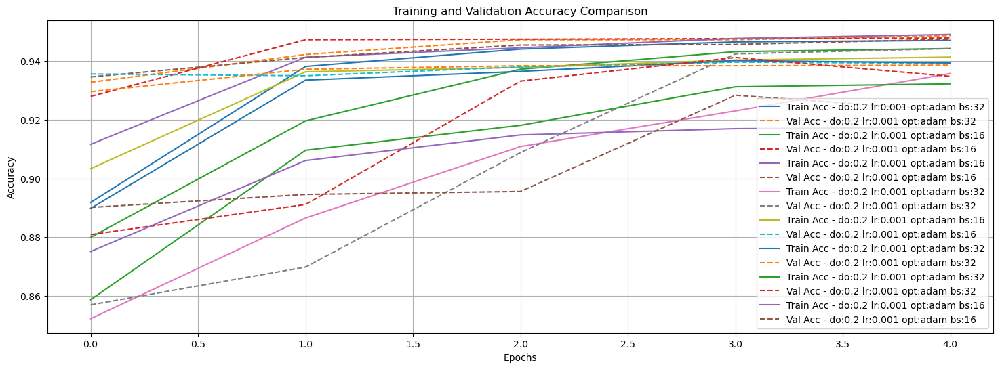

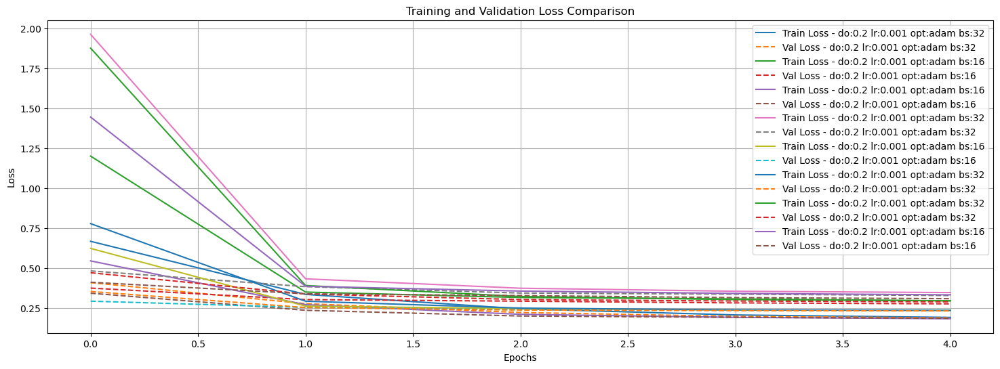

In [317]:
# Plot train/validation accuracy for best models
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s3):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot train/validation loss
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s3):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

plt.title('Training and Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


### Note: The 2 layers and 32 units architecture seems to be too much for this dataset. The model is learning very quickly and based on our tuning parameters, the model is performing very well, without overfitting. I will try with a simpler architecture.

In [ ]:
# Model with 1 layer and 16 Units

# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed):
    """Set seeds for reproducible results"""
    tf.random.set_seed(seed)
    np.random.seed(seed)

def create_model_tuning(input_dim, output_dim, layers=1, units=32, dropout=0.2, batch_size=16,
                       lr=0.001, optimizer='adam', seed=42,
                       l1_reg=0.0, l2_reg=0.0):
    """Create a deterministic neural network model with L1/L2 regularization"""
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    # Create regularization object
    kernel_regularizer = regularizers.L1L2(l1=l1_reg, l2=l2_reg) if (l1_reg > 0 or l2_reg > 0) else None
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_regularizer=kernel_regularizer,
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_regularizer=kernel_regularizer,
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    # Choose optimizer
    if optimizer.lower() == 'adam':
        opt = Adam(learning_rate=lr)
    elif optimizer.lower() == 'rmsprop':
        opt = RMSprop(learning_rate=lr)
    else:
        opt = Adam(learning_rate=lr)  # default
    
    model.compile(optimizer=opt,
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Get dimensions (assuming X_train, y_train are defined)
input_dim = X_train_scaled_s3.shape[1]
output_dim = len(np.unique(y_train_s3))

# Hyperparameter grid with L1/L2 regularization options
hyperparameter_config = {
    'dropout': [0.2], 
    'lr': [0.001],
    'optimizer': ['adam'],
    'batch_size': [16, 32],
    'l1_reg': [0.01, 0.001],  # L1 regularization strengths
    'l2_reg': [0.01, 0.001]   # L2 regularization strengths
}
models_tuning_s3 = []
histories_tuning_s3 = []

# Generate all combinations of hyperparameters
keys, values = zip(*hyperparameter_config.items())
configs = [dict(zip(keys, v)) for v in product(*values)]

# Initialize progress bar
progress_bar = tqdm(configs, desc="Hyperparameter Tuning", unit="model")

for i, config in enumerate(progress_bar):
    # Update progress bar description with current config
    short_desc = (f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} "
                 f"bs:{config['batch_size']} L1:{config['l1_reg']} L2:{config['l2_reg']}")
    progress_bar.set_postfix(config=short_desc)
    
    # Set unique but deterministic seed for each model
    model_seed = 42 + i
    set_global_determinism(model_seed)
    
    # Clear session and memory
    tf.keras.backend.clear_session()
    gc.collect()
    
    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                              restore_best_weights=True, verbose=0)
    
    # Create model with current config (excluding batch_size which is for training)
    model_config = {k: v for k, v in config.items() if k != 'batch_size'}
    model_tuning_s3 = create_model_tuning(input_dim, output_dim, seed=model_seed, **model_config)
    
    # Train model (NON-VERBOSE)
    history_tuning_s3 = model_tuning_s3.fit(
        X_train_scaled_s3, y_train_s3,
        validation_data=(X_val_scaled_s3, y_val_s3),
        batch_size=config['batch_size'],
        epochs=5,
        callbacks=[early_stop],
        shuffle=True,  # Deterministic due to seed
        verbose=0  # Silent training
    )
    
    # Evaluate model (NON-VERBOSE)
    val_loss_tuning_s3, val_acc_tuning_s3 = model_tuning_s3.evaluate(X_val_scaled_s3, y_val_s3, verbose=0)
    
    
    # Store results
    models_tuning_s3.append(model_tuning_s3)
    histories_tuning_s3.append({
        "config": config,
        "model": model_tuning_s3,
        "val_loss": val_loss_tuning_s3,
        "val_accuracy": val_acc_tuning_s3,
        "history": history_tuning_s3,
        "seed": model_seed
    })
    
    # Clean up
    gc.collect()

# Close progress bar
progress_bar.close()

print(f"Hyperparameter tuning completed. Trained {len(models_tuning_s3)} models.")
print('Models: models_tuning_s3, Histories: histories_tuning_s3')


Hyperparameter Tuning: 100%|██████████| 8/8 [00:36<00:00,  4.60s/model, config=do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001]

Hyperparameter tuning completed. Trained 8 models.
Models: models_tuning_s3, Histories: histories_tuning_s3


In [319]:
# Because there are too many models, sort and select top 15 Accuracy scores.
sorted_acc_tuning_s3 = sorted(histories_tuning_s3, key=lambda x: x['val_accuracy'], reverse=True)
top_acc_tuning_s3 = sorted_acc_tuning_s3[:15]

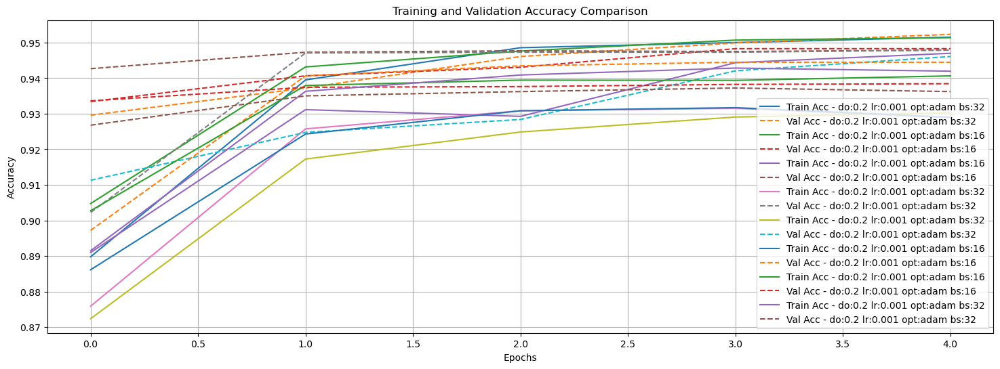

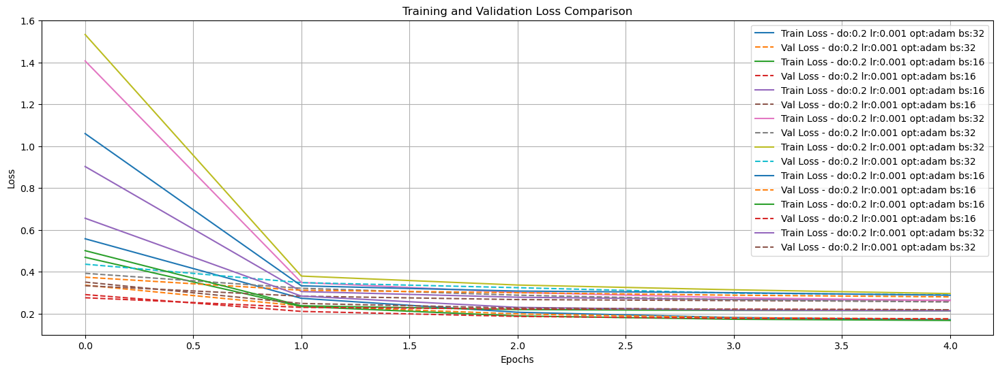

In [320]:
# Plot train/validation accuracy for best models
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s3):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot train/validation loss
plt.figure(figsize=(18, 6))
for i, result in enumerate(top_acc_tuning_s3):
    config = result['config']
    config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']}"
    history_obj = result['history']
    
    plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

plt.title('Training and Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [324]:
# @tittle Model Evaluation

# --- Evaluation Function ---
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def evaluate_trained_models(models, hist_metrics, X_test, y_test, 
                           class_names=None, verbose=True, return_curves=False):
    """
    Comprehensive model evaluation function optimized for imbalanced datasets
    
    Parameters:
    -----------
    models : list
        List of trained Keras models
    hist_metrics : list
        List of training history and config data
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    class_names : list, optional
        Names of classes for better reporting
    verbose : bool
        Print detailed results
    return_curves : bool
        Whether to return ROC and PR curve data
    
    Returns:
    --------
    results : list
        Comprehensive evaluation results for each model
    """
    
    # Set seeds for reproducible evaluation
    np.random.seed(42)
    
    results_tuning_s3 = []
    n_classes = len(np.unique(y_test))
    is_binary = n_classes == 2
    
    if verbose:
        print("="*80)
        print(f"EVALUATING {len(models)} MODELS ON TEST SET")
        print(f"Dataset: {len(y_test)} samples, {n_classes} classes")
        if is_binary:
            class_dist = np.bincount(y_test)
            print(f"Class distribution: {class_dist[0]}:{class_dist[1]} ({class_dist[1]/len(y_test)*100:.1f}% positive)")
        print("="*80)
    
    for i, (model, history_data) in enumerate(zip(models, hist_metrics)):
        config = history_data['config']
        model_name = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']} L1:{config['l1_reg']} L2:{config['l2_reg']}"
        
        if verbose:
            print(f"\n{model_name}")
            print("-" * 50)
        
        try:
            # Get predictions
            y_pred_prob = model.predict(X_test, verbose=0)
            
            # Handle probability extraction
            if y_pred_prob.shape[1] > 1:  # Multi-class output
                y_pred_class = np.argmax(y_pred_prob, axis=1)
                if is_binary:
                    y_prob_positive = y_pred_prob[:, 1]  # Probability of positive class
                else:
                    y_prob_positive = y_pred_prob  # Keep all probabilities for multi-class
            else:  # Single output (shouldn't happen with softmax, but just in case)
                y_pred_prob = y_pred_prob.flatten()
                y_pred_class = (y_pred_prob > 0.5).astype(int)
                y_prob_positive = y_pred_prob
            
            # Basic metrics
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            
            # Classification metrics
            if is_binary:
                # Binary classification metrics
                precision = precision_score(y_test, y_pred_class, zero_division=0)
                recall = recall_score(y_test, y_pred_class, zero_division=0)
                f1 = f1_score(y_test, y_pred_class, zero_division=0)
                
                # Class-specific metrics
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                # ROC-AUC and PR-AUC (better for imbalanced data)
                roc_auc = roc_auc_score(y_test, y_prob_positive)
                pr_auc = average_precision_score(y_test, y_prob_positive)
                
                # Confusion matrix
                cm = confusion_matrix(y_test, y_pred_class)
                tn, fp, fn, tp = cm.ravel()
                
                # Additional metrics for imbalanced data
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
                balanced_accuracy = (sensitivity + specificity) / 2
                
                # Matthews Correlation Coefficient (good for imbalanced data)
                mcc_denom = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
                mcc = ((tp * tn) - (fp * fn)) / mcc_denom if mcc_denom != 0 else 0
                
            else:
                # Multi-class metrics
                precision = precision_score(y_test, y_pred_class, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred_class, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred_class, average='weighted', zero_division=0)
                
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                roc_auc = roc_auc_score(y_test, y_prob_positive, multi_class='ovr', average='weighted')
                pr_auc = average_precision_score(y_test, y_prob_positive, average='weighted')
                
                cm = confusion_matrix(y_test, y_pred_class)
                balanced_accuracy = recall  # For multi-class, weighted recall approximates balanced accuracy
                mcc = np.nan  # MCC is complex for multi-class
                specificity = np.nan
                sensitivity = recall
            
            # Store comprehensive results
            result_tuning_s3 = {
                # Model info
                'model_index': i,
                'model_name': model_name,
                'config': config,
                
                
                # Basic metrics
                'accuracy': test_accuracy,
                'loss': test_loss,
                'balanced_accuracy': balanced_accuracy,
                
                # Main classification metrics
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'roc_auc': roc_auc,
                'pr_auc': pr_auc,  # Better than ROC-AUC for imbalanced data
                
                # Per-class metrics
                'precision_per_class': precision_per_class,
                'recall_per_class': recall_per_class,
                'f1_per_class': f1_per_class,
                
                # Imbalanced data specific metrics
                'specificity': specificity,
                'sensitivity': sensitivity,
                'mcc': mcc,
                
                # Predictions and probabilities
                'y_pred_prob': y_prob_positive,
                'y_pred_class': y_pred_class,
                'confusion_matrix': cm,
                
                # Training history metrics
                'val_accuracy': history_data.get('val_accuracy', np.nan),
                'val_loss': history_data.get('val_loss', np.nan),
                'train_accuracy': history_data.get('train_accuracy', np.nan),
                'train_loss': history_data.get('train_loss', np.nan),
            }
            
            
            # Add curve data if requested
            if return_curves and is_binary:
                fpr, tpr, roc_thresholds = roc_curve(y_test, y_prob_positive)
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_prob_positive)
                
                result_tuning_s3.update({
                    'roc_curve': {'fpr': fpr, 'tpr': tpr, 'thresholds': roc_thresholds},
                    'pr_curve': {'precision': precision_curve, 'recall': recall_curve, 'thresholds': pr_thresholds}
                })
            
            results_tuning_s3.append(result_tuning_s3)
            
            # Verbose output
            if verbose:
                print(f"Core Metrics:")
                print(f"Accuracy: {test_accuracy:.4f} | Balanced Acc: {balanced_accuracy:.4f}")
                print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
                print(f"AUC Scores:")
                print(f" ROC-AUC: {roc_auc:.4f} | PR-AUC: {pr_auc:.4f}")
                
                if is_binary:
                    print(f"Imbalanced Metrics:")
                    print(f"Sensitivity: {sensitivity:.4f} | Specificity: {specificity:.4f}")
                    print(f"MCC: {mcc:.4f}")
                    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
                
                print(f"Training Performance:")
                
                # Safely format training performance. Check if train_loss and val_loss are not None and numeric
                train_loss_val = history_data.get('train_loss', 'N/A')
                val_loss_val = history_data.get('val_loss', 'N/A')

                if isinstance(train_loss_val, (int, float)):
                    print(f"   Train Loss: {train_loss_val:.4f}")
                else:
                    print(f"   Train Loss: {train_loss_val}")

                if isinstance(val_loss_val, (int, float)):
                    print(f"   Val Loss: {val_loss_val:.4f}")
                else:
                    print(f"   Val Loss: {val_loss_val}")
                
        except Exception as e:
            print(f"Error evaluating {model_name}: {str(e)}")
            continue
    
    if verbose:
        print("\n" + "="*80)
        print("EVALUATION SUMMARY")
        print("="*80)
        
        # Create summary DataFrame
        summary_data_best_s3 = []
        for r in results_tuning_s3:
            summary_data_best_s3.append({
                'Model': r['model_name'],
                'ROC_AUC': r['roc_auc'],
                'PR_AUC': r['pr_auc'],
                'F1': r['f1'],
                'Bal_Acc': r['balanced_accuracy'],
                'MCC': r.get('mcc', np.nan)
            })
        
        summary_df_tuning_s3 = pd.DataFrame(summary_data_best_s3)
        
        positive_ratio = np.mean(y_test)
        if positive_ratio < 0.5:  # Positives are minority
            sort_col = 'PR_AUC'   # Focus on positive class performance
        elif positive_ratio >= 0.5:  # Positives are majority  
            sort_col = 'ROC_AUC' # Focus on negative class performance
        
        # Sort by ROC-AUC (or PR-AUC for heavily imbalanced data)
        summary_df_tuning_s3 = summary_df_tuning_s3.sort_values(sort_col, ascending=False)
        
        print(summary_df_tuning_s3.round(4).to_string(index=False))
        print(f"\nBest model by {sort_col}: {summary_df_tuning_s3.iloc[0]['Model']}")
    
    return results_tuning_s3


# Basic usage
test_results_s3_tuning = evaluate_trained_models(models_tuning_s3, histories_tuning_s3, X_test_scaled_s3, y_test_s3)



# Basic usage
test_results_s3_tuning = evaluate_trained_models(models_tuning_s3, histories_tuning_s3, X_test_scaled_s3, y_test_s3)

EVALUATING 8 MODELS ON TEST SET
Dataset: 3976 samples, 2 classes
Class distribution: 586:3390 (85.3% positive)

do:0.2 lr:0.001 opt:adam bs:16 L1:0.01 L2:0.01
--------------------------------------------------
Core Metrics:
Accuracy: 0.9484 | Balanced Acc: 0.9479
Precision: 0.9905 | Recall: 0.9487 | F1: 0.9691
AUC Scores:
 ROC-AUC: 0.9702 | PR-AUC: 0.9950
Imbalanced Metrics:
Sensitivity: 0.9487 | Specificity: 0.9471
MCC: 0.8206
Confusion Matrix: TN=555, FP=31, FN=174, TP=3216
Training Performance:
   Train Loss: N/A
   Val Loss: 0.2801

do:0.2 lr:0.001 opt:adam bs:16 L1:0.01 L2:0.001
--------------------------------------------------
Core Metrics:
Accuracy: 0.9499 | Balanced Acc: 0.9587
Precision: 0.9947 | Recall: 0.9463 | F1: 0.9699
AUC Scores:
 ROC-AUC: 0.9714 | PR-AUC: 0.9944
Imbalanced Metrics:
Sensitivity: 0.9463 | Specificity: 0.9710
MCC: 0.8308
Confusion Matrix: TN=569, FP=17, FN=182, TP=3208
Training Performance:
   Train Loss: N/A
   Val Loss: 0.2579

do:0.2 lr:0.001 opt:adam 

In [325]:
# Because there are too many models, sort and select top 10 AUC scores.
# Sorting models based on best metric.
positive_ratio = np.mean(y_test_s3)
if positive_ratio < 0.5:  # Positives are minority
    sort_col = 'pr_auc'   # Focus on positive class performance
    print(f"Positive class is minority ({positive_ratio:.2%}), sorting by PR-AUC")
else:  # Positives are majority
    sort_col = 'roc_auc'  # Focus on overall performance
    print(f"Positive class is majority ({positive_ratio:.2%}), sorting by ROC-AUC")
    
sorted_auc_tuning_s3 = sorted(test_results_s3_tuning, key=lambda x: x['roc_auc'], reverse=True)
top_auc_tuning_s3 = sorted_auc_tuning_s3[:15]

Positive class is majority (85.26%), sorting by ROC-AUC


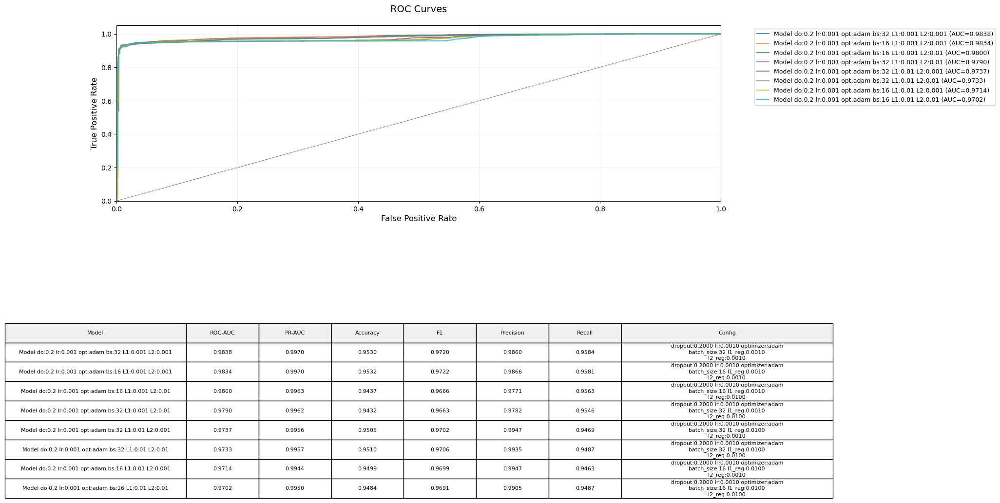

In [326]:
# @tittle ROC Curve for Learning Rate and Activation Function

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def plot_roc_curves(test_results, X_test=None, y_test=None):
    """
    Enhanced ROC curve visualization with model names in legend and table,
    including both ROC-AUC and PR-AUC metrics.
    FIXED: Now uses the same probability extraction method as evaluation function
    """
    plt.figure(figsize=(16, 12))  # Increased figure size for two plots
    
    # Create color palette
    colors = plt.cm.tab10(np.linspace(0, 1, len(test_results)))
    
    # Create subplots with better layout
    ax1 = plt.subplot2grid((10, 2), (0, 0), colspan=2, rowspan=4)  # ROC plot area
    ax2 = plt.subplot2grid((10, 2), (7, 0), colspan=2, rowspan=3)  # Table area
    ax2.axis('off')
    
    # Prepare table data
    table_data = []
    col_labels = ['Model', 'ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall', 'Config']
    
    for i, res in enumerate(test_results):
        try:
            # Get model index and config
            model_idx = res.get('model_name', i)
            config = res['config']
            
            # Use stored probabilities from evaluation function
            # This ensures consistency between evaluation and plotting
            if 'y_pred_prob' in res and res['y_pred_prob'] is not None:
                y_score = res['y_pred_prob']  # This is already the positive class probability
            
            
            # Handle binary vs multi-class
            n_classes = len(np.unique(y_test))
            if n_classes == 2:  # Binary classification
                # FIXED: Use the SAME calculation method as evaluation function
                # Use roc_auc_score for consistency
                roc_auc = roc_auc_score(y_test, y_score)
                
                # Also calculate using roc_curve + auc (should be identical)
                fpr, tpr, _ = roc_curve(y_test, y_score)
                roc_auc_manual = auc(fpr, tpr)
                
                # Verify they match (within floating point precision)
                if abs(roc_auc - roc_auc_manual) > 1e-10:
                    print(f"Warning: ROC-AUC calculation mismatch for model {model_idx}")
                    print(f"  roc_auc_score: {roc_auc:.10f}")
                    print(f"  manual calc:   {roc_auc_manual:.10f}")
                
                # Use the same method as evaluation function
                pr_auc = average_precision_score(y_test, y_score)
                
                # Plot ROC curve
                ax1.plot(fpr, tpr, color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (AUC={roc_auc:.4f})")
                
            else:  # Multi-class - kept same logic but using stored probabilities
                # Use stored full probability matrix
                y_prob = res.get('y_pred_prob_full', res.get('y_pred_prob'))
                if y_prob is None:
                    raise ValueError("No multi-class probability data found")
                
                # One-vs-Rest approach
                fpr, tpr, roc_auc_dict = {}, {}, {}
                
                for class_idx in range(n_classes):
                    fpr[class_idx], tpr[class_idx], _ = roc_curve((y_test == class_idx).astype(int), 
                                                               y_prob[:, class_idx])
                    roc_auc_dict[class_idx] = auc(fpr[class_idx], tpr[class_idx])
                
                # Micro-average metrics
                fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
                roc_auc = auc(fpr["micro"], tpr["micro"])
                
                precision, recall, _ = precision_recall_curve(y_test.ravel(), y_prob.ravel())
                pr_auc = auc(recall, precision)
                
                # Plot micro-average curves
                ax1.plot(fpr["micro"], tpr["micro"], color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (Micro ROC AUC={roc_auc:.4f})")
            
            # Format config for display
            config_clean = {k: v for k, v in config.items() if k != 'model'}
            config_str = "\n".join([f"{k}:{v:.4f}" if isinstance(v, (float, np.floating)) 
                                  else f"{k}:{v}" 
                                  for k, v in config_clean.items()])
            
            # FIXED: Use the SAME values from evaluation results
            table_data.append([
                f"Model {model_idx}",
                f"{res.get('roc_auc', roc_auc):.4f}",  # Use stored value if available
                f"{res.get('pr_auc', pr_auc):.4f}",    # Use stored value if available
                f"{res.get('accuracy', 0):.4f}",
                f"{res.get('f1', 0):.4f}",
                f"{res.get('precision', 0):.4f}",
                f"{res.get('recall', 0):.4f}",
                config_str
            ])
            
        except Exception as e:
            print(f"Error processing model {i}: {str(e)}")
            continue
    
    # Format ROC plot
    ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12)
    ax1.set_ylabel('True Positive Rate', fontsize=12)
    ax1.set_title('ROC Curves', fontsize=14, pad=20)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    ax1.grid(alpha=0.2)
    
    # Create table with better formatting
    if table_data:
        # Wrap text in the config column (column 7) before creating the table
        wrapped_table_data = []
        for row in table_data:
            wrapped_row = []
            for i, cell_text in enumerate(row):
                if i == 7:  # Config column
                    # Wrap text to fit in ~30-35 characters per line
                    wrapped_text = '\n'.join(textwrap.wrap(str(cell_text), width=40))
                    wrapped_row.append(wrapped_text)
                else:
                    wrapped_row.append(cell_text)
            wrapped_table_data.append(wrapped_row)
        
        table = ax2.table(
            cellText=wrapped_table_data,
            colLabels=col_labels,
            loc='center',
            cellLoc='center',
            colColours=['#f0f0f0']*len(col_labels))
        
        table.auto_set_font_size(False)
        table.set_fontsize(8)
        table.scale(1, 1.5)
        
        # Set specific column widths
        for i in range(len(col_labels)):
            for j in range(len(wrapped_table_data) + 1):
                cell = table[(j, i)]
                if i == 0:  # Config column
                    cell.set_width(0.30)
                    cell.set_height(0.15)  # Even taller for wrapped text
                elif i == 7:  # Config column
                    cell.set_width(0.35)
                    cell.set_height(0.15) 
                else:
                    cell.set_width(0.12)
                    cell.set_height(0.15)
    plt.show()

# Usage
plot_roc_curves(top_auc_tuning_s3, X_test=X_test_scaled_s3, y_test=y_test_s3)


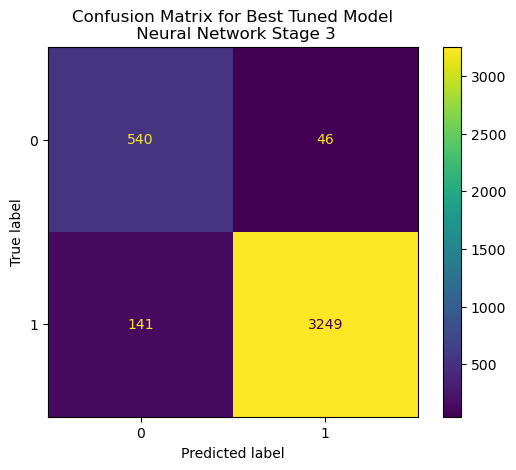

In [327]:
# Assuming test_results_s3_base is a list of dictionaries containing model results
for result in test_results_s3_tuning:
    # Check if this is the specific model we want
    if result.get('model_name') == 'do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001' and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot()
        plt.title(f"Confusion Matrix for Best Tuned Model\n Neural Network Stage 3")
        plt.show()

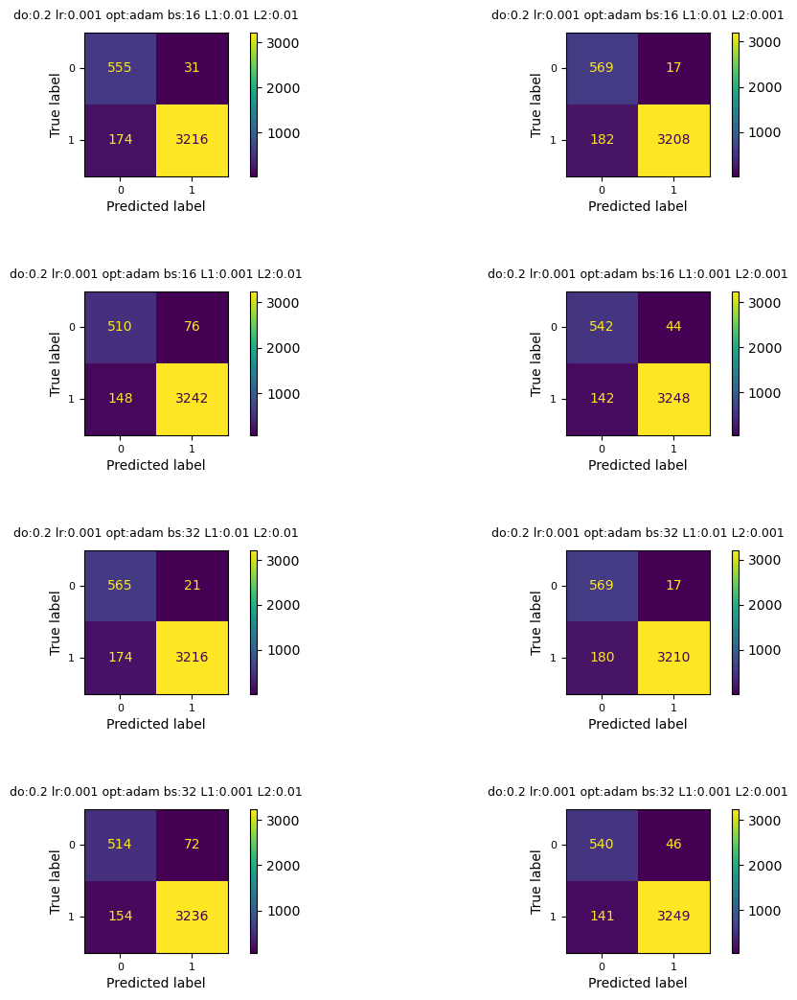

In [328]:
# Display top Tuned Model Tested

# Create the figure with adjusted spacing parameters
fig, axes = plt.subplots(4, 2, figsize=(12, 12))

# Main figure padding control
fig.tight_layout(pad=1.0)  # Increased from 1.0 to 3.0 for more outer padding

# Additional spacing controls:
plt.subplots_adjust(
    left=0.1,    # Left margin
    right=0.9,   # Right margin
    bottom=0.1,  # Bottom margin
    top=0.9,     # Top margin
    wspace=0.1,  # Horizontal space between subplots
    hspace=0.8   # Vertical space between subplots
)

# Flatten the axes array for easier iteration
axes = axes.ravel()

# Counter for the current subplot
plot_idx = 0

for result in test_results_s3_tuning:
    # Stop if we've filled desired number of subplots
    if plot_idx >= 8:
        break
        
    # Check if this is the specific model we want
    if result.get('model_name') and 'confusion_matrix' in result:
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'])
        disp.plot(ax=axes[plot_idx])
        
        # Adjust title positioning and font size
        axes[plot_idx].set_title(
            f"{result['model_name']}",
            pad=10,  # Add padding between title and plot
            fontsize=9  # Smaller font size for long titles
        )
        
        # Adjust tick label sizes if needed
        axes[plot_idx].tick_params(axis='both', which='major', labelsize=8)
        
        plot_idx += 1

# Hide any remaining empty subplots
for i in range(plot_idx, 8):
    axes[i].axis('off')

plt.show()

### Model: do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001: 1 hidden layers with 32 neurons. 

Activation: Relu, Softmax
Optimizer: Adam
Loss: Sparse Categorical Crossentropy
Dropout: 0.2
Learning Rate: 0.001
Batch Size: 32
L1 Regularization: 0.001
L2 Regularization: 0.001


- Learning curves assist with training decisions like early stopping, architecture selection, and stability assessment, but shouldn't be the only basis for final model choice. 
- Standard loss functions can be biased toward majority classes, masking poor minority class performance. That's why I used 'sparse_categorical_crossentropy,' which handles imbalanced datasets more effectively. 
- In imbalanced settings where positives are rare, traditional accuracy can be misleading—an accuracy of 80% might merely reflect always predicting the majority class. ROC-AUC remains a reliable metric for overall discriminative ability, while Precision-Recall AUC offers deeper insights into minority class performance. For model evaluation, I prioritized ROC-AUC, followed by Precision-Recall AUC, F1-score, Recall, and Precision, ensuring a balanced assessment of performance across metrics.


In [329]:
# @tittle Comparison XGBoost results for Stage 1 vs Stage 2
def full_xgboost_comparison(df1, df2, df3):
    """Creates a full comparison including both tuned and untuned models from DataFrames."""
    # Add stage identifiers
    df1['Stage'] = 'Stage 1'
    df2['Stage'] = 'Stage 2'
    df3['Stage'] = 'Stage 3'
    # Combine the DataFrames
    combined_df = pd.concat([df1, df2, df3], ignore_index=True)
    
    # Create more descriptive model labels
    combined_df['Model'] = combined_df['Stage'] + ' - ' + combined_df['Model']
    
    # Reorder columns
    cols = ['Model', 'Stage'] + [col for col in combined_df.columns if col not in ['Model', 'Stage']]
    combined_df_s123 = combined_df[cols]
    
    return combined_df_s123

# Create full comparison
full_comparison_df_XGB_s1s2s3 = full_xgboost_comparison(results_df_s1, results_df_s2, results_df_s3)
full_comparison_df_XGB_s1s2s3.drop(['Macro Precision', 'Macro Recall', 'Macro F1'], axis=1, inplace=True)
#full_comparison_df_XGB_s1s2s3.to_csv("full_comparison_XGB_s1s2s3.csv", index=False)
# Highlight best in each metric category
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: gray' if v else '' for v in is_max]

# Identify numeric columns for formatting
numeric_cols = full_comparison_df_XGB_s1s2s3.select_dtypes(include=['float64', 'int64']).columns
styled_df_s123 = (full_comparison_df_XGB_s1s2s3.style
    .apply(highlight_max, subset=numeric_cols)
    .format("{:.4f}", subset=numeric_cols)
    .set_table_styles([{
        'selector': 'th',
        'props': [('background-color', "#4f6c9b"), ('color', 'white'), ('font-weight', 'bold')]
    }, {
        'selector': 'td',
        'props': [('border', '1px solid #ddd')]
    }])
    .set_properties(**{'text-align': 'center'})
)    

display(styled_df_s123)



,Model,Stage,Accuracy,ROC AUC,Precision (Class 0),Recall (Class 0),F1 Score (Class 0),Precision (Class 1),Recall (Class 1),F1 Score (Class 1)
0,Stage 1 - Without Tuning,Stage 1,0.8759,0.8528,0.6257,0.4219,0.5040,0.9039,0.9557,0.9291
1,Stage 1 - Best Parameters,Stage 1,0.8749,0.8603,0.6266,0.4032,0.4907,0.9013,0.9578,0.9287
2,Stage 2 - Without Tuning,Stage 2,0.8924,0.8950,0.6868,0.4856,0.5689,0.9161,0.9621,0.9385
3,Stage 2 - Best Parameters,Stage 2,0.8952,0.8934,0.7119,0.4759,0.5705,0.9151,0.9670,0.9403
4,Stage 3 - Without Tuning,Stage 3,0.9710,0.9928,0.8934,0.9106,0.9019,0.9846,0.9814,0.9830
5,Stage 3 - Best Parameters,Stage 3,0.9712,0.9942,0.8893,0.9175,0.9032,0.9858,0.9804,0.9831


In [330]:
# @title: Comparison best Neural Network Models for Stage 1 and 2
def compare_all_models(auc_tuning_s1, auc_tuning_s2, auc_tuning_s3, auc_base_s1=None, auc_base_s2=None, auc_base_s3=None,
                     name_s1="Stage 1", name_s2="Stage 2", name_s3="Stage 3"):
  
    # Get best models from each approach
    best_auc_tuned_s1 = max(auc_tuning_s1, key=lambda x: x.get('roc_auc', 0)) if auc_tuning_s1 else None
    best_auc_tuned_s2 = max(auc_tuning_s2, key=lambda x: x.get('roc_auc', 0)) if auc_tuning_s2 else None
    best_auc_tuned_s3 = max(auc_tuning_s3, key=lambda x: x.get('roc_auc', 0)) if auc_tuning_s3 else None
    best_auc_base_s1 = auc_base_s1[0] if auc_base_s1 else None
    best_auc_base_s2 = auc_base_s2[0] if auc_base_s2 else None
    best_auc_base_s3 = auc_base_s3[0] if auc_base_s3 else None
    
    # Prepare data for DataFrame
    data = []
    
    # Add Stage 1 models
    stage1_models = [
        ('Best AUC (Base)', best_auc_base_s1),
        ('Best AUC (Tuned)', best_auc_tuned_s1)
        
    ]
    
    for model_type, model_data in stage1_models:
        if model_data:
            data.append({
                'Dataset': name_s1,
                'Model Type': model_type,
                'Model': model_data.get('model_name', 'Unknown'),
                'ROC-AUC': model_data.get('roc_auc', 0),
                'PR-AUC': model_data.get('pr_auc', 0),
                'Accuracy': model_data.get('accuracy', 0),
                'F1': model_data.get('f1', 0),
                'Precision': model_data.get('precision', 0),
                'Recall': model_data.get('recall', 0),
                'Config': str(model_data.get('config', {}))
            })
    
    # Add Stage 2 models
    stage2_models = [
        ('Best AUC (Base)', best_auc_base_s2),
        ('Best AUC (Tuned)', best_auc_tuned_s2)
    ]
    
    for model_type, model_data in stage2_models:
        if model_data:
            data.append({
                'Dataset': name_s2,
                'Model Type': model_type,
                'Model': model_data.get('model_name', 'Unknown'),
                'ROC-AUC': model_data.get('roc_auc', 0),
                'PR-AUC': model_data.get('pr_auc', 0),
                'Accuracy': model_data.get('accuracy', 0),
                'F1': model_data.get('f1', 0),
                'Precision': model_data.get('precision', 0),
                'Recall': model_data.get('recall', 0),
                'Config': str(model_data.get('config', {}))
            })
    
     # Add Stage 3 models
    stage3_models = [
        ('Best AUC (Base)', best_auc_base_s3),
        ('Best AUC (Tuned)', best_auc_tuned_s3)
    ]
    
    for model_type, model_data in stage3_models:
        if model_data:
            data.append({
                'Dataset': name_s3,
                'Model Type': model_type,
                'Model': model_data.get('model_name', 'Unknown'),
                'ROC-AUC': model_data.get('roc_auc', 0),
                'PR-AUC': model_data.get('pr_auc', 0),
                'Accuracy': model_data.get('accuracy', 0),
                'F1': model_data.get('f1', 0),
                'Precision': model_data.get('precision', 0),
                'Recall': model_data.get('recall', 0),
                'Config': str(model_data.get('config', {}))
            })
    
    # Create DataFrame
    comparison_df_s123 = pd.DataFrame(data)
    
    return comparison_df_s123

# Create the enhanced comparison DataFrame
all_models_df_s123 = compare_all_models(
    auc_tuning_s1=sorted_auc_tuning_s1,
    auc_tuning_s2=sorted_auc_tuning_s2,
    auc_tuning_s3=sorted_auc_tuning_s3,
    auc_base_s1=sorted_auc_base,
    auc_base_s2=sorted_auc_base_s2,
    auc_base_s3=sorted_auc_base_s3,
    name_s1="Stage 1",
    name_s2="Stage 2",
    name_s3="Stage 3"
)

#all_models_df_s123.to_csv('comparison_neural_networks_all_stages.csv', index=False)

# Display with improved styling
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: gray' if v else '' for v in is_max]  

numeric_cols = ['ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall']

styled_df_s123 = (all_models_df_s123.style
    .apply(highlight_max, subset=numeric_cols)
    .format("{:.4f}", subset=numeric_cols)
    .set_table_styles([{
        'selector': 'th',
        'props': [('background-color', "#4f6c9b"), ('color', 'white'), ('font-weight', 'bold')]
    }, {
        'selector': 'td',
        'props': [('border', '1px solid #ddd')]
    }])
    .set_properties(**{'text-align': 'center'})
)

display(styled_df_s123)

,Dataset,Model Type,Model,ROC-AUC,PR-AUC,Accuracy,F1,Precision,Recall,Config
0,Stage 1,Best AUC (Base),Model_6_4L_64U,0.8543,0.9577,0.8753,0.9289,0.8972,0.9628,"{'layers': 4, 'units': 64}"
1,Stage 1,Best AUC (Tuned),Model_7_adamO_16BS_0.001LR_0.2D,0.8526,0.9583,0.8753,0.9290,0.8955,0.9652,"{'dropout': 0.2, 'lr': 0.001, 'optimizer': 'adam', 'batch_size': 16}"
2,Stage 2,Best AUC (Base),Model_1_2L_32U,0.8866,0.9722,0.8888,0.9367,0.9099,0.9652,"{'layers': 2, 'units': 32}"
3,Stage 2,Best AUC (Tuned),Model_9_adamO_64BS_0.001LR_0.2D,0.8881,0.9719,0.8939,0.9396,0.9125,0.9684,"{'dropout': 0.2, 'lr': 0.001, 'optimizer': 'adam', 'batch_size': 64}"
4,Stage 3,Best AUC (Base),Model_5_2L_32U,0.9846,0.9973,0.9532,0.9724,0.9799,0.9649,"{'layers': 2, 'units': 32}"
5,Stage 3,Best AUC (Tuned),do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001,0.9838,0.9970,0.9530,0.9720,0.9860,0.9584,"{'dropout': 0.2, 'lr': 0.001, 'optimizer': 'adam', 'batch_size': 32, 'l1_reg': 0.001, 'l2_reg': 0.001}"


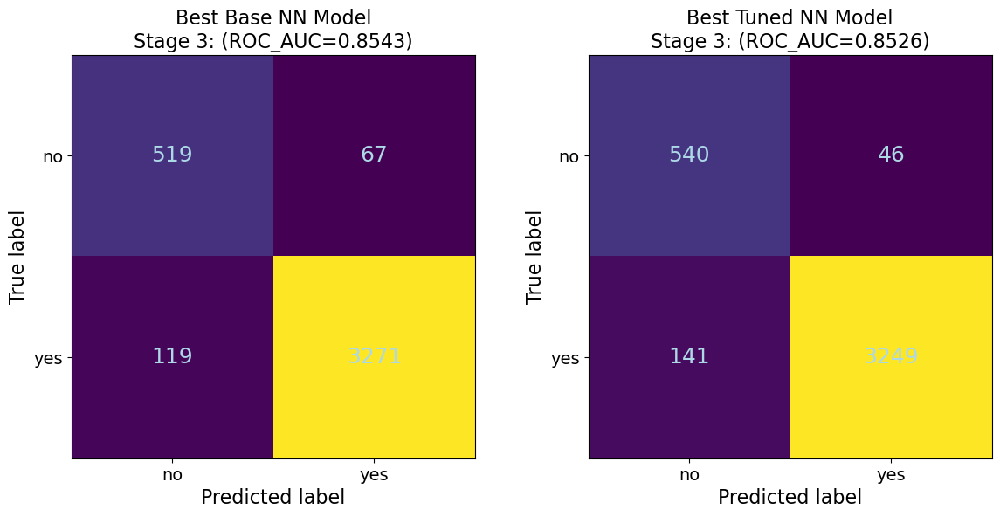

In [331]:
# Compute confusion matrices for best Neural Network models
# Find the best base model
best_base_nn_s3 = max(test_results_s3_base, key=lambda r: r['roc_auc'])
y_pred_base_nn_s3 = best_base_nn_s3['y_pred_class']
cm_base_nn_s3 = confusion_matrix(y_test_s3, y_pred_base_nn_s3)

# Find the best tuned model
best_tuning_nn_s3 = max(test_results_s3_tuning, key=lambda r: r['roc_auc'])
y_pred_tuned_nn_s3 = best_tuning_nn_s3['y_pred_class']
cm_tuned_nn_s3 = confusion_matrix(y_test_s3, y_pred_tuned_nn_s3)

# Base model
disp_base_nn_s3 = ConfusionMatrixDisplay(confusion_matrix=cm_base_nn_s3, display_labels=["no", "yes"])
disp_tuned_nn_s3 = ConfusionMatrixDisplay(confusion_matrix=cm_tuned_nn_s3, display_labels=["no", "yes"])


# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot confusion matrices
disp_base_nn_s3.plot(ax=axes[0], colorbar=False)
disp_tuned_nn_s3.plot(ax=axes[1], colorbar=False)

# Set titles with ROC_AUC info
axes[0].set_title(f"Best Base NN Model\nStage 3: (ROC_AUC={best_base['roc_auc']:.4f})", fontsize=16)
axes[1].set_title(f"Best Tuned NN Model\nStage 3: (ROC_AUC={best_tuning['roc_auc']:.4f})", fontsize=16)

# Set axis labels with font size
axes[0].set_xlabel('Predicted label', fontsize=16)
axes[0].set_ylabel('True label', fontsize=16)
axes[1].set_xlabel('Predicted label', fontsize=16)
axes[1].set_ylabel('True label', fontsize=16)

# Remove grid lines
axes[0].grid(False)
axes[1].grid(False)

# Customize tick labels and cell fonts
for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=14)
    for text in ax.texts:
        text.set_fontsize(18)
        text.set_color('lightblue')
        
plt.subplots_adjust(wspace=0.2, hspace=0.3)

plt.show()

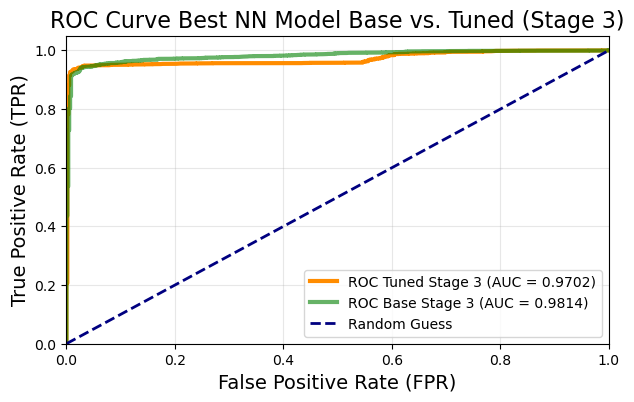

In [337]:
def plot_roc_curves_from_results(test_results_base, test_results_tuned, X_test=None, y_test=None,
                                label_base="Base Model", label_tuned="Tuned Model",
                                title="ROC Curve Comparison"):
    """
    Plots ROC curves for two models based on pre-calculated results stored in
    dictionaries, consistent with the format of 'test_results' in the first code.
    Handles single and multi-class cases. Assumes results already contain
    y_pred_prob.
    """

    # Extract necessary information from results
    model_base = test_results_base[0] if isinstance(test_results_base, list) else test_results_base
    model_tuned = test_results_tuned[0] if isinstance(test_results_tuned, list) else test_results_tuned

    y_score_base = model_base['y_pred_prob']
    y_score_tuned = model_tuned['y_pred_prob']

    n_classes = len(np.unique(y_test))

    # --- Plotting ---
    plt.figure(figsize=(7, 4))

    # --- Single Class ---
    if n_classes == 2:

        fpr_base, tpr_base, _ = roc_curve(y_test, y_score_base)
        roc_auc_base = auc(fpr_base, tpr_base)

        fpr_tuned, tpr_tuned, _ = roc_curve(y_test, y_score_tuned)
        roc_auc_tuned = auc(fpr_tuned, tpr_tuned)

        # Plot the Tuned Model's ROC Curve
        plt.plot(fpr_tuned, tpr_tuned, color='darkorange', lw=3, alpha=1,
                 label=f'ROC {label_tuned} (AUC = {roc_auc_tuned:.4f})')

        # Plot the Base Model's ROC Curve
        plt.plot(fpr_base, tpr_base, color='green', lw=3, alpha=0.6,
                 label=f'ROC {label_base} (AUC = {roc_auc_base:.4f})')

    # --- Multi Class ---
    else:
        y_prob_base = model_base.get('y_pred_prob_full', model_base.get('y_pred_prob'))
        y_prob_tuned = model_tuned.get('y_pred_prob_full', model_tuned.get('y_pred_prob'))

        # Micro-average ROC
        fpr_base, tpr_base, _ = roc_curve(y_test.ravel(), y_prob_base.ravel())
        roc_auc_base = auc(fpr_base, tpr_base)

        fpr_tuned, tpr_tuned, _ = roc_curve(y_test.ravel(), y_prob_tuned.ravel())
        roc_auc_tuned = auc(fpr_tuned, tpr_tuned)

        # Plot the Tuned Model's ROC Curve
        plt.plot(fpr_tuned, tpr_tuned, color='darkorange', lw=3, alpha=1,
                 label=f'ROC {label_tuned} (Micro AUC = {roc_auc_tuned:.4f})')

        # Plot the Base Model's ROC Curve
        plt.plot(fpr_base, tpr_base, color='green', lw=3, alpha=0.6,
                 label=f'ROC {label_base} (Micro AUC = {roc_auc_base:.4f})')

    # Plot the Random Guess line
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')

    # --- Formatting the Plot ---
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (FPR)', fontsize=14)
    plt.ylabel('True Positive Rate (TPR)', fontsize=14)
    plt.title(title, fontsize=16)
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)
    plt.show()

# Example Usage (assuming test_results_s3_base and test_results_s3_tuning exist):
plot_roc_curves_from_results(test_results_s3_base, test_results_s3_tuning,
                               X_test=X_test_scaled_s3, y_test=y_test_s3,
                               label_base="Base Stage 3", label_tuned="Tuned Stage 3",
                               title="ROC Curve Best NN Model Base vs. Tuned (Stage 3)")


## Final Model

In [368]:
# This is the model for 1 layer, 32 units and the following hyperparameters: droput:0.2 learning rate:0.001 optimizer:adam batch sizes:32 L1 regularization:0.001 L2 regularization:0.001

# Suppress TensorFlow warnings and logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress all TF logs (0=all, 1=info, 2=warning, 3=error)
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Disable oneDNN optimizations warnings
warnings.filterwarnings('ignore')

# Additional TensorFlow logging suppression
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

def set_global_determinism(seed):
    """Set seeds for reproducible results"""
    tf.random.set_seed(seed)
    np.random.seed(seed)

def create_model_tuning(input_dim, output_dim, layers=1, units=32, dropout=0.2, batch_size=16,
                       lr=0.001, optimizer='adam', seed=42,
                       l1_reg=0.0, l2_reg=0.0):
    """Create a deterministic neural network model with L1/L2 regularization"""
    # Reset seeds before each model creation
    tf.random.set_seed(seed)
    np.random.seed(seed)
    
    # Create regularization object
    kernel_regularizer = regularizers.L1L2(l1=l1_reg, l2=l2_reg) if (l1_reg > 0 or l2_reg > 0) else None
    
    model = Sequential(name=f"model_{layers}L_{units}U")
    model.add(InputLayer(shape=(input_dim,)))
    
    for _ in range(layers):
        model.add(Dense(units, activation='relu', 
                       kernel_regularizer=kernel_regularizer,
                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                       bias_initializer=tf.keras.initializers.Zeros()))
        model.add(Dropout(dropout, seed=seed))
    
    model.add(Dense(output_dim, activation='softmax',
                   kernel_regularizer=kernel_regularizer,
                   kernel_initializer=tf.keras.initializers.GlorotUniform(seed=seed),
                   bias_initializer=tf.keras.initializers.Zeros()))
    
    # Choose optimizer
    if optimizer.lower() == 'adam':
        opt = Adam(learning_rate=lr)
    elif optimizer.lower() == 'rmsprop':
        opt = RMSprop(learning_rate=lr)
    else:
        opt = Adam(learning_rate=lr)  # default
    
    model.compile(optimizer=opt,
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    return model

# Get dimensions (assuming X_train, y_train are defined)
input_dim = X_train_scaled_s3.shape[1]
output_dim = len(np.unique(y_train_s3))

# Hyperparameter grid with L1/L2 regularization options
hyperparameter_config = {
    'dropout': [0.2], 
    'lr': [0.001],
    'optimizer': ['adam'],
    'batch_size': [32],
    'l1_reg': [0.001],  # L1 regularization strengths
    'l2_reg': [0.001]   # L2 regularization strengths
}

models_best_s3 = []
histories_best_s3 = []

# Generate all combinations of hyperparameters
keys, values = zip(*hyperparameter_config.items())
configs = [dict(zip(keys, v)) for v in product(*values)]

# Initialize progress bar
progress_bar = tqdm(configs, desc="Hyperparameter Tuning", unit="model")

for i, config in enumerate(progress_bar):
    # Update progress bar description with current config
    short_desc = (f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} "
                 f"bs:{config['batch_size']} L1:{config['l1_reg']} L2:{config['l2_reg']}")
    progress_bar.set_postfix(config=short_desc)
    
    # Set unique but deterministic seed for each model
    model_seed = 42 + i
    set_global_determinism(model_seed)
    
    # Clear session and memory
    tf.keras.backend.clear_session()
    gc.collect()
    
    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=3, 
                              restore_best_weights=True, verbose=0)
    
    # Create model with current config (excluding batch_size which is for training)
    model_config = {k: v for k, v in config.items() if k != 'batch_size'}
    model_best_s3 = create_model_tuning(input_dim, output_dim, seed=model_seed, **model_config)
    
    # Train model (NON-VERBOSE)
    history_best = model_best_s3.fit(
        X_train_scaled_s3, y_train_s3,
        validation_data=(X_val_scaled_s3, y_val_s3),
        batch_size=config['batch_size'],
        epochs=10,
        callbacks=[early_stop],
        shuffle=True,  # Deterministic due to seed
        verbose=0  # Silent training
    )
    
    # Evaluate model (NON-VERBOSE)
    val_loss_tuning_s3, val_acc_tuning_s3 = model_best_s3.evaluate(X_val_scaled_s3, y_val_s3, verbose=0)
    
    # Store results
    models_best_s3.append(model_best_s3)
    histories_best_s3.append({
        "config": config,
        "model": model_best_s3,
        "val_loss": val_loss_tuning_s3,
        "val_accuracy": val_acc_tuning_s3,
        "history": history_best,
        "seed": model_seed
    })
    
    # Clean up
    gc.collect()

# Close progress bar
progress_bar.close()

print(f"Hyperparameter tuning completed. Trained {len(models_best_s3)} models.")
print('Models: models_best_s3, Histories: histories_best_s3')


Hyperparameter Tuning: 100%|██████████| 1/1 [00:05<00:00,  5.89s/model, config=do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001]

Hyperparameter tuning completed. Trained 1 models.
Models: models_best_s3, Histories: histories_best_s3


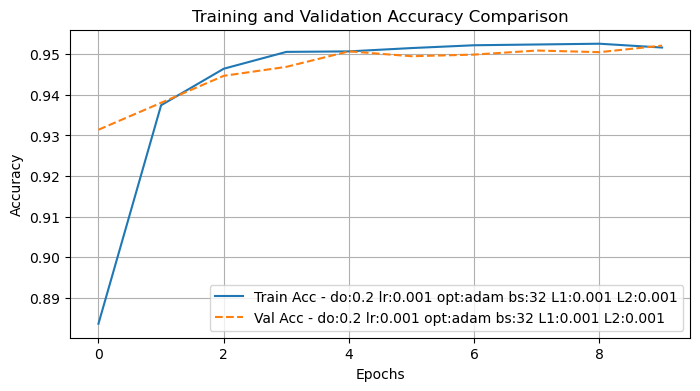

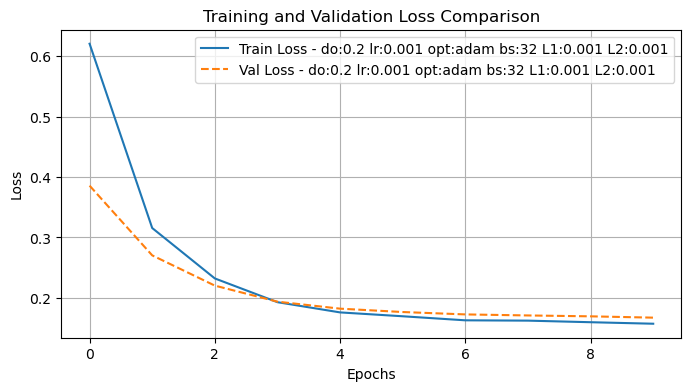

In [345]:
# Plot train/validation accuracy for best models
def learning_curve(histories):
    plt.figure(figsize=(8, 4))
    for i, result in enumerate(histories):
        config = result['config']
        config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']} L1:{config['l1_reg']} L2:{config['l2_reg']}"
        history_obj = result['history']
        
        plt.plot(history_obj.history['accuracy'], label=f"Train Acc - {config_str}")
        plt.plot(history_obj.history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")

    plt.title('Training and Validation Accuracy Comparison')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot train/validation loss
    plt.figure(figsize=(8, 4))
    for i, result in enumerate(histories):
        config = result['config']
        config_str = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']} L1:{config['l1_reg']} L2:{config['l2_reg']}"
        history_obj = result['history']
        
        plt.plot(history_obj.history['loss'], label=f"Train Loss - {config_str}")
        plt.plot(history_obj.history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")

    plt.title('Training and Validation Loss Comparison')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

learning_curve(histories_best_s3)

In [348]:
# @tittle Model Evaluation

# --- Evaluation Function ---
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def evaluate_trained_models(models, hist_metrics, X_test, y_test, 
                           class_names=None, verbose=True, return_curves=False):
    """
    Comprehensive model evaluation function optimized for imbalanced datasets
    
    Parameters:
    -----------
    models : list
        List of trained Keras models
    hist_metrics : list
        List of training history and config data
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    class_names : list, optional
        Names of classes for better reporting
    verbose : bool
        Print detailed results
    return_curves : bool
        Whether to return ROC and PR curve data
    
    Returns:
    --------
    results : list
        Comprehensive evaluation results for each model
    """
    
    # Set seeds for reproducible evaluation
    np.random.seed(42)
    
    results_best_s3 = []
    n_classes = len(np.unique(y_test))
    is_binary = n_classes == 2
    
    if verbose:
        print("="*80)
        print(f"EVALUATING {len(models)} MODELS ON TEST SET")
        print(f"Dataset: {len(y_test)} samples, {n_classes} classes")
        if is_binary:
            class_dist = np.bincount(y_test)
            print(f"Class distribution: {class_dist[0]}:{class_dist[1]} ({class_dist[1]/len(y_test)*100:.1f}% positive)")
        print("="*80)
    
    for i, (model, history_data) in enumerate(zip(models, hist_metrics)):
        config = history_data['config']
        model_name = f"do:{config['dropout']} lr:{config['lr']} opt:{config['optimizer']} bs:{config['batch_size']} L1:{config['l1_reg']} L2:{config['l2_reg']}"
        
        if verbose:
            print(f"\n{model_name}")
            print("-" * 50)
        
        try:
            # Get predictions
            y_pred_prob = model.predict(X_test, verbose=0)
            
            # Handle probability extraction
            if y_pred_prob.shape[1] > 1:  # Multi-class output
                y_pred_class = np.argmax(y_pred_prob, axis=1)
                if is_binary:
                    y_prob_positive = y_pred_prob[:, 1]  # Probability of positive class
                else:
                    y_prob_positive = y_pred_prob  # Keep all probabilities for multi-class
            else:  # Single output (shouldn't happen with softmax, but just in case)
                y_pred_prob = y_pred_prob.flatten()
                y_pred_class = (y_pred_prob > 0.5).astype(int)
                y_prob_positive = y_pred_prob
            
            # Basic metrics
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            
            # Classification metrics
            if is_binary:
                # Binary classification metrics
                precision = precision_score(y_test, y_pred_class, zero_division=0)
                recall = recall_score(y_test, y_pred_class, zero_division=0)
                f1 = f1_score(y_test, y_pred_class, zero_division=0)
                
                # Class-specific metrics
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                # ROC-AUC and PR-AUC (better for imbalanced data)
                roc_auc = roc_auc_score(y_test, y_prob_positive)
                pr_auc = average_precision_score(y_test, y_prob_positive)
                
                # Confusion matrix
                cm = confusion_matrix(y_test, y_pred_class)
                tn, fp, fn, tp = cm.ravel()
                
                # Additional metrics for imbalanced data
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
                sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Same as recall
                balanced_accuracy = (sensitivity + specificity) / 2
                
                # Matthews Correlation Coefficient (good for imbalanced data)
                mcc_denom = np.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))
                mcc = ((tp * tn) - (fp * fn)) / mcc_denom if mcc_denom != 0 else 0
                
            else:
                # Multi-class metrics
                precision = precision_score(y_test, y_pred_class, average='weighted', zero_division=0)
                recall = recall_score(y_test, y_pred_class, average='weighted', zero_division=0)
                f1 = f1_score(y_test, y_pred_class, average='weighted', zero_division=0)
                
                precision_per_class = precision_score(y_test, y_pred_class, average=None, zero_division=0)
                recall_per_class = recall_score(y_test, y_pred_class, average=None, zero_division=0)
                f1_per_class = f1_score(y_test, y_pred_class, average=None, zero_division=0)
                
                roc_auc = roc_auc_score(y_test, y_prob_positive, multi_class='ovr', average='weighted')
                pr_auc = average_precision_score(y_test, y_prob_positive, average='weighted')
                
                cm = confusion_matrix(y_test, y_pred_class)
                balanced_accuracy = recall  # For multi-class, weighted recall approximates balanced accuracy
                mcc = np.nan  # MCC is complex for multi-class
                specificity = np.nan
                sensitivity = recall
            
            # Store comprehensive results
            result_best_s3 = {
                # Model info
                'model_index': i,
                'model_name': model_name,
                'config': config,
                
                
                # Basic metrics
                'accuracy': test_accuracy,
                'loss': test_loss,
                'balanced_accuracy': balanced_accuracy,
                
                # Main classification metrics
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'roc_auc': roc_auc,
                'pr_auc': pr_auc,  # Better than ROC-AUC for imbalanced data
                
                # Per-class metrics
                'precision_per_class': precision_per_class,
                'recall_per_class': recall_per_class,
                'f1_per_class': f1_per_class,
                
                # Imbalanced data specific metrics
                'specificity': specificity,
                'sensitivity': sensitivity,
                'mcc': mcc,
                
                # Predictions and probabilities
                'y_pred_prob': y_prob_positive,
                'y_pred_class': y_pred_class,
                'confusion_matrix': cm,
                
                # Training history metrics
                'val_accuracy': history_data.get('val_accuracy', np.nan),
                'val_loss': history_data.get('val_loss', np.nan),
                'train_accuracy': history_data.get('train_accuracy', np.nan),
                'train_loss': history_data.get('train_loss', np.nan),
            }
            
            
            # Add curve data if requested
            if return_curves and is_binary:
                fpr, tpr, roc_thresholds = roc_curve(y_test, y_prob_positive)
                precision_curve, recall_curve, pr_thresholds = precision_recall_curve(y_test, y_prob_positive)
                
                result_best_s3.update({
                    'roc_curve': {'fpr': fpr, 'tpr': tpr, 'thresholds': roc_thresholds},
                    'pr_curve': {'precision': precision_curve, 'recall': recall_curve, 'thresholds': pr_thresholds}
                })
            
            results_best_s3.append(result_best_s3)
            
            # Verbose output
            if verbose:
                print(f"Core Metrics:")
                print(f"Accuracy: {test_accuracy:.4f} | Balanced Acc: {balanced_accuracy:.4f}")
                print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")
                print(f"AUC Scores:")
                print(f" ROC-AUC: {roc_auc:.4f} | PR-AUC: {pr_auc:.4f}")
                
                if is_binary:
                    print(f"Imbalanced Metrics:")
                    print(f"Sensitivity: {sensitivity:.4f} | Specificity: {specificity:.4f}")
                    print(f"MCC: {mcc:.4f}")
                    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
                
                print(f"Training Performance:")
                
                # Safely format training performance. Check if train_loss and val_loss are not None and numeric
                train_loss_val = history_data.get('train_loss', None)
                val_loss_val = history_data.get('val_loss', None)

                if isinstance(train_loss_val, (int, float)):
                    print(f"   Train Loss: {train_loss_val:.4f}")
                else:
                    print(f"   Train Loss: {train_loss_val}")

                if isinstance(val_loss_val, (int, float)):
                    print(f"   Val Loss: {val_loss_val:.4f}")
                else:
                    print(f"   Val Loss: {val_loss_val}")
                
        except Exception as e:
            print(f"Error evaluating {model_name}: {str(e)}")
            continue
    
    if verbose:
        print("\n" + "="*80)
        print("EVALUATION SUMMARY")
        print("="*80)
        
        # Create summary DataFrame
        summary_data_best_s3 = []
        for r in results_best_s3:
            summary_data_best_s3.append({
                'Model': r['model_name'],
                'ROC_AUC': r['roc_auc'],
                'PR_AUC': r['pr_auc'],
                'F1': r['f1'],
                'Bal_Acc': r['balanced_accuracy'],
                'MCC': r.get('mcc', np.nan)
            })
        
        summary_df = pd.DataFrame(summary_data_best_s3)
        
        positive_ratio = np.mean(y_test)
        if positive_ratio < 0.5:  # Positives are minority
            sort_col = 'PR_AUC'   # Focus on positive class performance
        elif positive_ratio >= 0.5:  # Positives are majority  
            sort_col = 'ROC_AUC' # Focus on negative class performance
        
        # Sort by ROC-AUC (or PR-AUC for heavily imbalanced data)
        summary_df = summary_df.sort_values(sort_col, ascending=False)
        
        print(summary_df.round(4).to_string(index=False))
        print(f"\nBest model by {sort_col}: {summary_df.iloc[0]['Model']}")
    
    return results_best_s3


# Basic usage
test_results_s3_best = evaluate_trained_models(models_best_s3, histories_best_s3, X_test_scaled_s3, y_test_s3)


EVALUATING 1 MODELS ON TEST SET
Dataset: 3976 samples, 2 classes
Class distribution: 586:3390 (85.3% positive)

do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001
--------------------------------------------------
Core Metrics:
Accuracy: 0.9535 | Balanced Acc: 0.9374
Precision: 0.9849 | Recall: 0.9602 | F1: 0.9724
AUC Scores:
 ROC-AUC: 0.9842 | PR-AUC: 0.9970
Imbalanced Metrics:
Sensitivity: 0.9602 | Specificity: 0.9147
MCC: 0.8280
Confusion Matrix: TN=536, FP=50, FN=135, TP=3255
Training Performance:
   Train Loss: None
   Val Loss: 0.1673

EVALUATION SUMMARY
                                           Model  ROC_AUC  PR_AUC     F1  Bal_Acc   MCC
do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001   0.9842   0.997 0.9724   0.9374 0.828

Best model by ROC_AUC: do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001


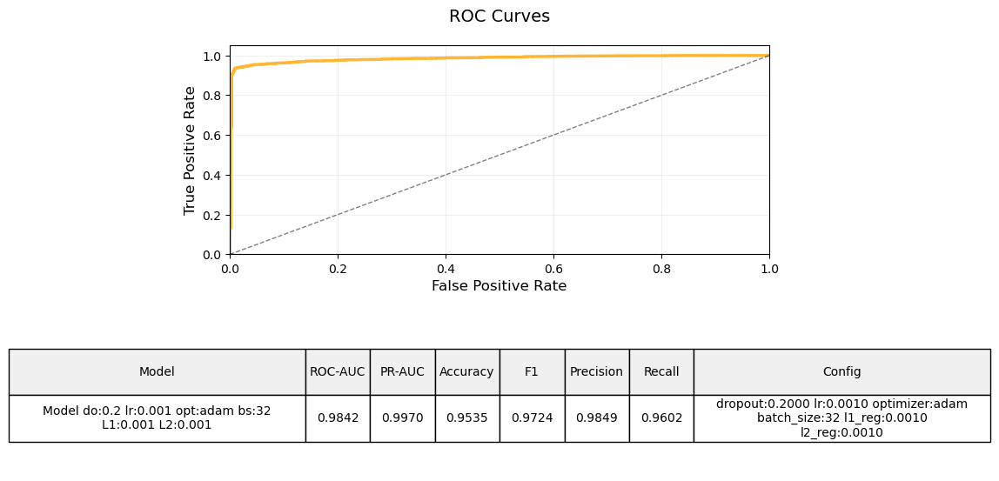

In [349]:
# @tittle ROC Curve for Learning Rate and Activation Function

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

def plot_roc_curves(test_results, X_test=None, y_test=None):
    """
    Enhanced ROC curve visualization with model names in legend and table,
    including both ROC-AUC and PR-AUC metrics.
    FIXED: Now uses the same probability extraction method as evaluation function
    """
    plt.figure(figsize=(8, 8))  # Increased figure size for two plots
    
    # Create color palette
    colors = plt.cm.tab10(np.linspace(0, 1, len(test_results)))
    
    # Create subplots with better layout
    ax1 = plt.subplot2grid((10, 2), (0, 0), colspan=2, rowspan=4)  # ROC plot area
    ax2 = plt.subplot2grid((10, 2), (5, 0), colspan=2, rowspan=3)  # Table area
    ax2.axis('off')
    
    # Prepare table data
    table_data = []
    col_labels = ['Model', 'ROC-AUC', 'PR-AUC', 'Accuracy', 'F1', 'Precision', 'Recall', 'Config']
    
    for i, res in enumerate(test_results):
        try:
            # Get model index and config
            model_idx = res.get('model_name', i)
            config = res['config']
            
            # Use stored probabilities from evaluation function
            # This ensures consistency between evaluation and plotting
            if 'y_pred_prob' in res and res['y_pred_prob'] is not None:
                y_score = res['y_pred_prob']  # This is already the positive class probability
            
            
            # Handle binary vs multi-class
            n_classes = len(np.unique(y_test))
            if n_classes == 2:  # Binary classification
                # FIXED: Use the SAME calculation method as evaluation function
                # Use roc_auc_score for consistency
                roc_auc = roc_auc_score(y_test, y_score)
                
                # Also calculate using roc_curve + auc (should be identical)
                fpr, tpr, _ = roc_curve(y_test, y_score)
                roc_auc_manual = auc(fpr, tpr)
                
                # Verify they match (within floating point precision)
                if abs(roc_auc - roc_auc_manual) > 1e-10:
                    print(f"Warning: ROC-AUC calculation mismatch for model {model_idx}")
                    print(f"  roc_auc_score: {roc_auc:.10f}")
                    print(f"  manual calc:   {roc_auc_manual:.10f}")
                
                # Use the same method as evaluation function
                pr_auc = average_precision_score(y_test, y_score)
                
                # Plot ROC curve
                ax1.plot(fpr, tpr, color='orange', lw=2.5, alpha=0.8,
                        label=f"Model {model_idx} (AUC={roc_auc:.4f})")
                
            else:  # Multi-class - kept same logic but using stored probabilities
                # Use stored full probability matrix
                y_prob = res.get('y_pred_prob_full', res.get('y_pred_prob'))
                if y_prob is None:
                    raise ValueError("No multi-class probability data found")
                
                # One-vs-Rest approach
                fpr, tpr, roc_auc_dict = {}, {}, {}
                
                for class_idx in range(n_classes):
                    fpr[class_idx], tpr[class_idx], _ = roc_curve((y_test == class_idx).astype(int), 
                                                               y_prob[:, class_idx])
                    roc_auc_dict[class_idx] = auc(fpr[class_idx], tpr[class_idx])
                
                # Micro-average metrics
                fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_prob.ravel())
                roc_auc = auc(fpr["micro"], tpr["micro"])
                
                precision, recall, _ = precision_recall_curve(y_test.ravel(), y_prob.ravel())
                pr_auc = auc(recall, precision)
                
                # Plot micro-average curves
                ax1.plot(fpr["micro"], tpr["micro"], color=colors[i], lw=1.5, alpha=0.8,
                        label=f"Model {model_idx} (Micro ROC AUC={roc_auc:.4f})")
            
            # Format config for display
            config_clean = {k: v for k, v in config.items() if k != 'model'}
            config_str = "\n".join([f"{k}:{v:.4f}" if isinstance(v, (float, np.floating)) 
                                  else f"{k}:{v}" 
                                  for k, v in config_clean.items()])
            
            # FIXED: Use the SAME values from evaluation results
            table_data.append([
                f"Model {model_idx}",
                f"{res.get('roc_auc', roc_auc):.4f}",  # Use stored value if available
                f"{res.get('pr_auc', pr_auc):.4f}",    # Use stored value if available
                f"{res.get('accuracy', 0):.4f}",
                f"{res.get('f1', 0):.4f}",
                f"{res.get('precision', 0):.4f}",
                f"{res.get('recall', 0):.4f}",
                config_str
            ])
            
        except Exception as e:
            print(f"Error processing model {i}: {str(e)}")
            continue
    
    # Format ROC plot
    ax1.plot([0, 1], [0, 1], 'k--', lw=1, alpha=0.5)
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate', fontsize=12)
    ax1.set_ylabel('True Positive Rate', fontsize=12)
    ax1.set_title('ROC Curves', fontsize=14, pad=20)
    #ax1.legend(bbox_to_anchor=(1.05, 1), loc='center', fontsize=9)
    ax1.grid(alpha=0.2)
    
    # Create table with better formatting
    if table_data:
        # Wrap text in the config column (column 7) before creating the table
        wrapped_table_data = []
        for row in table_data:
            wrapped_row = []
            for i, cell_text in enumerate(row):
                if i in (0,7):  # Config column
                    # Wrap text to fit in ~30-35 characters per line
                    wrapped_text = '\n'.join(textwrap.wrap(str(cell_text), width=40))
                    wrapped_row.append(wrapped_text)
                else:
                    wrapped_row.append(cell_text)
            wrapped_table_data.append(wrapped_row)
        
        table = ax2.table(
            cellText=wrapped_table_data,
            colLabels=col_labels,
            loc='center',
            cellLoc='center',
            colColours=['#f0f0f0']*len(col_labels))
        
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 2.5)
        
        # Set specific column widths
        for i in range(len(col_labels)):
            for j in range(len(wrapped_table_data) + 1):
                cell = table[(j, i)]
                if i == 0:  # Config column
                    cell.set_width(0.55)
                    cell.set_height(0.3)  # Even taller for wrapped text
                elif i == 7:  # Config column
                    cell.set_width(0.55)
                    cell.set_height(0.3) 
                else:
                    cell.set_width(0.12)
                    cell.set_height(0.3)
    plt.show()

# Usage
plot_roc_curves(test_results_s3_best, X_test=X_test_scaled_s3, y_test=y_test_s3)


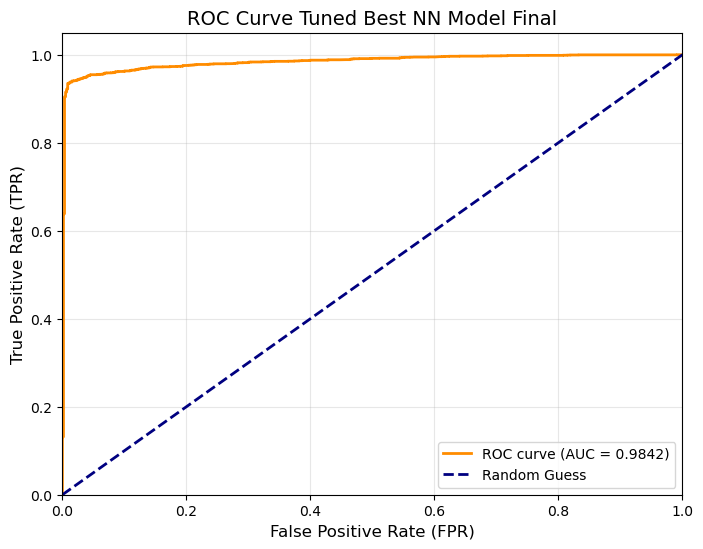

In [351]:
# Calculate ROC curve
# Plot based on stored probabilities from evaluate function
y_pred_proba_best = test_results_s3_best[0]['y_pred_prob']
fpr, tpr, thresholds = roc_curve(y_test_s3, y_pred_proba_best)
roc_auc_best = auc(fpr, tpr)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2,
            label=f'ROC curve (AUC = {roc_auc_best:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title('ROC Curve Tuned Best NN Model Final', fontsize=14)
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

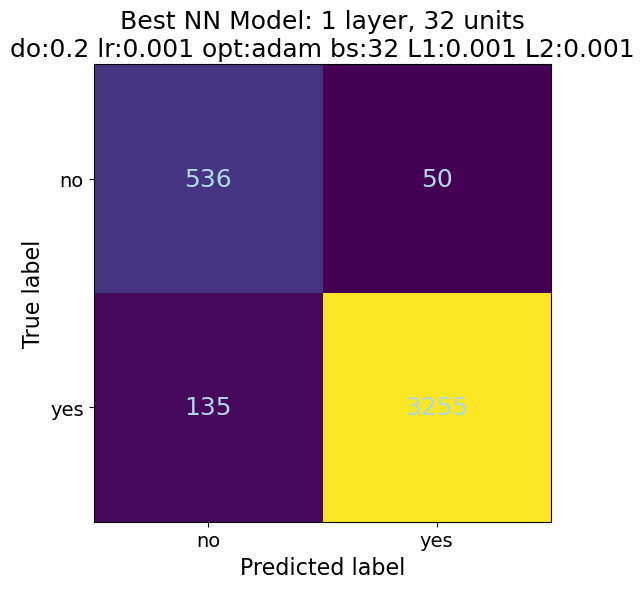

In [365]:
# Assuming test_results_s3_base is a list of dictionaries containing model results
# Assuming test_results_s3_best is a list of dictionaries containing model results
model_name_to_plot = 'do:0.2 lr:0.001 opt:adam bs:32 L1:0.001 L2:0.001'  # Define model name

# Create a figure and a single set of axes BEFORE the loop
fig, ax = plt.subplots(figsize=(8, 6))  # Create a figure and an axes

# Set the seed
np.random.seed(42)

# Create the confusion matrix plot if it exist.
for result in test_results_s3_best:
    # Check if this is the specific model we want and if it has confusion_matrix
    if result.get('model_name') == model_name_to_plot and 'confusion_matrix' in result:
        # Plot the confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=result['confusion_matrix'], display_labels=["no", "yes"])
        disp.plot(ax=ax, colorbar=False)

        # Set axis labels with font size
        ax.set_xlabel('Predicted label', fontsize=16)
        ax.set_ylabel('True label', fontsize=16)

        # Customize tick labels and cell fonts
        ax.tick_params(axis='both', which='major', labelsize=14)
        for text in ax.texts:
            text.set_fontsize(18)
            text.set_color('lightblue')

        plt.title(f"Best NN Model: 1 layer, 32 units\n{model_name_to_plot}", fontsize=18)

        # Adjust layout to prevent labels from overlapping
        plt.tight_layout()

        # Show the plot
        plt.show()

# Declaration
By submitting your project, you indicate that the work is your own and has been created with academic integrity. Refer to the **Cambridge plagiarism regulations**.
